# Chapter 1: Logic

## Real Analysis Course 1 (July 18th 2022)

## Notions of Mathematical Logic

Statements are denoted with letters $p,q,r$ and can be true or false but not both or neither.

Example: 

$p$: " 6 is an even rational number"

$p$ is true

$~p$: " 6 is not an even rational number"

$~p$ is false

## Logic Connectives

* Conjunction: ^ (and)
* Disjunction: $v$ (or)
* Implication: $->$ (if .. then ..)
* Bimplication: $<->$ (if and only if)

Connectives order:
1. ~ (negation)
2. ^ (conjunction)
3. v (disjunction)
4. -> (implication)
5. <-> (biimplication)

## Table of Truths

Used to determine whether two or more statements are equivalent or not

1. $p → q$ is equivalent to $\thicksim p \ v \ q$


In [13]:
# Create table of truth
# ⊻ = xor (exclusive or)
# ⊼ = nand (not and)
# ⊽ = nor (not or)

using DataFrames, PrettyTables
df=DataFrame(p=repeat([true, false],outer=2), q=repeat([true, false],inner=2))

df[!,"~p"].=.!(df.p)
df[!,"~p ⩔ q"].=.!df.p.||df.q
pretty_table(df, nosubheader=true)

┌───────┬───────┬───────┬────────┐
│     p │     q │    ~p │ ~p ⩔ q │
├───────┼───────┼───────┼────────┤
│  true │  true │ false │   true │
│ false │  true │  true │   true │
│  true │ false │ false │  false │
│ false │ false │  true │   true │
└───────┴───────┴───────┴────────┘


In [10]:
# AND &&, &, ∧
# OR ||, |, ∨
# NOT !, ~, ¬
# XOR ⊻
# NAND ⊼
# NOR ⊽
# IMPLICATION -->, →
# EQUIVALENCE <-->, ===, ≡, ↔, ⇔

using TruthTables

@truthtable p → q

TruthTable
┌───────┬───────┬─────────┐
│   p   │   q   │ p --> q │
├───────┼───────┼─────────┤
│ true  │ true  │ true    │
│ true  │ false │ false   │
│ false │ true  │ true    │
│ false │ false │ true    │
└───────┴───────┴─────────┘

In [16]:
# Prove that 𝑝→𝑞 is equivalent to ∼𝑝 v 𝑞
using TruthTables

@truthtable ~p || q full=true


TruthTable
┌───┬───┬────┬────────┐
│ p │ q │ ¬p │ ¬p ∨ q │
├───┼───┼────┼────────┤
│ T │ T │ F  │ T      │
│ T │ F │ F  │ F      │
│ F │ T │ T  │ T      │
│ F │ F │ T  │ T      │
└───┴───┴────┴────────┘

In [26]:
using TruthTables

@truthtable p ↔ q full=true

TruthTable
┌───┬───┬──────────┐
│ p │ q │ p <--> q │
├───┼───┼──────────┤
│ T │ T │ T        │
│ T │ F │ F        │
│ F │ T │ F        │
│ F │ F │ T        │
└───┴───┴──────────┘

In [1]:
# Create table of truth manually
# ⊻ = xor (exclusive or)
# ⊼ = nand (not and)
# ⊽ = nor (not or)

using DataFrames, PrettyTables
df=DataFrame(p=repeat([true, false],inner=4), q=repeat([true, false],inner=2,outer=2), r=repeat([true, false],outer=4))


df[!,"~p"].=.!(df.p)
#df[!,"~q"].=.!(df.q)
#df[!,"~r"].=.!(df.r)
#df[!,"p ⩓ q"].=df.p.&&df.q
#df[!,"p ⩔ q"].=df.p.||df.q
#df[!,"p ⊻ q"] .=df.p .⊻ df.q
#df[!,"p ⊼ q"] .=df.p .⊼ df.q
#df[!,"p ⊽ q"] .=df.p .⊽ df.q
df[!,"~(p ⩓ ~p"].=.!(df.p.&&.!(df.p))
df[!,"p ⩔ ~p"].=df.p.||.!(df.p)
df[!,"p ⩔ q ⩔ r ⩔ ~(r ⩓ q)"].= (df.p.||df.q.||df.r) .|| .!(df.r .&& df.q)

pretty_table(df, nosubheader=true)

┌───────┬───────┬───────┬───────┬──────────┬────────┬──────────────────────┐
│     p │     q │     r │    ~p │ ~(p ⩓ ~p │ p ⩔ ~p │ p ⩔ q ⩔ r ⩔ ~(r ⩓ q) │
├───────┼───────┼───────┼───────┼──────────┼────────┼──────────────────────┤
│  true │  true │  true │ false │     true │   true │                 true │
│  true │  true │ false │ false │     true │   true │                 true │
│  true │ false │  true │ false │     true │   true │                 true │
│  true │ false │ false │ false │     true │   true │                 true │
│ false │  true │  true │  true │     true │   true │                 true │
│ false │  true │ false │  true │     true │   true │                 true │
│ false │ false │  true │  true │     true │   true │                 true │
│ false │ false │ false │  true │     true │   true │                 true │
└───────┴───────┴───────┴───────┴──────────┴────────┴──────────────────────┘


## Tautologies

Tautologies is a statement which is always true.

Example:
1. Socrates is a man
2. If Socrates is a man, then socrates is mortal
3. Socrates is mortal

In [17]:
# Tautologies example
using TruthTables

TruthTables.showmode!(:letter)
@truthtable p ∧ (p→q) → q full=true

TruthTable
┌───┬───┬─────────┬───────────────┬─────────────────────┐
│ p │ q │ p --> q │ p ∧ (p --> q) │ p ∧ (p --> q) --> q │
├───┼───┼─────────┼───────────────┼─────────────────────┤
│ T │ T │ T       │ T             │ T                   │
│ T │ F │ F       │ F             │ T                   │
│ F │ T │ T       │ F             │ T                   │
│ F │ F │ T       │ F             │ T                   │
└───┴───┴─────────┴───────────────┴─────────────────────┘

In [18]:
# Tautologies example 1
using TruthTables

TruthTables.showmode!(:letter)
@truthtable p ∨ ~p full=true

TruthTable
┌───┬────┬────────┐
│ p │ ¬p │ p ∨ ¬p │
├───┼────┼────────┤
│ T │ F  │ T      │
│ F │ T  │ T      │
└───┴────┴────────┘

In [20]:
# Tautologies example 2
using TruthTables

TruthTables.showmode!(:letter)
@truthtable (p→q) ∧ (q→r) → (p→r) 

TruthTable
┌───┬───┬───┬─────────────────────────────────────┐
│ p │ q │ r │ (p --> q) ∧ (q --> r) --> (p --> r) │
├───┼───┼───┼─────────────────────────────────────┤
│ T │ T │ T │ T                                   │
│ T │ T │ F │ T                                   │
│ T │ F │ T │ T                                   │
│ T │ F │ F │ T                                   │
│ F │ T │ T │ T                                   │
│ F │ T │ F │ T                                   │
│ F │ F │ T │ T                                   │
│ F │ F │ F │ T                                   │
└───┴───┴───┴─────────────────────────────────────┘

In [23]:
# Tautologies example 3
using TruthTables

TruthTables.showmode!(:letter)
@truthtable ~(p ∧ ~p) full=true 

TruthTable
┌───┬────┬────────┬───────────┐
│ p │ ¬p │ p ∧ ¬p │ ¬(p ∧ ¬p) │
├───┼────┼────────┼───────────┤
│ T │ F  │ F      │ T         │
│ F │ T  │ F      │ T         │
└───┴────┴────────┴───────────┘

In [25]:
# Tautologies example 4
using TruthTables

TruthTables.showmode!(:letter)
@truthtable ~(p ∨ q) ↔ ~p ∧ ~q full=true

TruthTable
┌───┬───┬───────┬──────────┬────┬────┬─────────┬───────────────────────┐
│ p │ q │ p ∨ q │ ¬(p ∨ q) │ ¬p │ ¬q │ ¬p ∧ ¬q │ ¬(p ∨ q) <--> ¬p ∧ ¬q │
├───┼───┼───────┼──────────┼────┼────┼─────────┼───────────────────────┤
│ T │ T │ T     │ F        │ F  │ F  │ F       │ T                     │
│ T │ F │ T     │ F        │ F  │ T  │ F       │ T                     │
│ F │ T │ T     │ F        │ T  │ F  │ F       │ T                     │
│ F │ F │ F     │ T        │ T  │ T  │ T       │ T                     │
└───┴───┴───────┴──────────┴────┴────┴─────────┴───────────────────────┘

In [27]:
# Tautologies example 5
using TruthTables

TruthTables.showmode!(:letter)
@truthtable ~(p ∧ q) ↔ ~p ∨ ~q full=true

TruthTable
┌───┬───┬───────┬──────────┬────┬────┬─────────┬───────────────────────┐
│ p │ q │ p ∧ q │ ¬(p ∧ q) │ ¬p │ ¬q │ ¬p ∨ ¬q │ ¬(p ∧ q) <--> ¬p ∨ ¬q │
├───┼───┼───────┼──────────┼────┼────┼─────────┼───────────────────────┤
│ T │ T │ T     │ F        │ F  │ F  │ F       │ T                     │
│ T │ F │ F     │ T        │ F  │ T  │ T       │ T                     │
│ F │ T │ F     │ T        │ T  │ F  │ T       │ T                     │
│ F │ F │ F     │ T        │ T  │ T  │ T       │ T                     │
└───┴───┴───────┴──────────┴────┴────┴─────────┴───────────────────────┘

In [28]:
# Tautologies example 6 (Important tautology)
using TruthTables

TruthTables.showmode!(:letter)
@truthtable (p → q) ↔ ~q → ~p full=true

TruthTable
┌───┬───┬─────────┬────┬────┬───────────┬────────────────────────────┐
│ p │ q │ p --> q │ ¬q │ ¬p │ ¬q --> ¬p │ (p --> q) <--> (¬q --> ¬p) │
├───┼───┼─────────┼────┼────┼───────────┼────────────────────────────┤
│ T │ T │ T       │ F  │ F  │ T         │ T                          │
│ T │ F │ F       │ T  │ F  │ F         │ T                          │
│ F │ T │ T       │ F  │ T  │ T         │ T                          │
│ F │ F │ T       │ T  │ T  │ T         │ T                          │
└───┴───┴─────────┴────┴────┴───────────┴────────────────────────────┘

Some important meanings:

* p → q Direct implication
* q → p Inverse implication
* ~q → ~p Counternominal implication
* ~p → ~q Opposite implication

Direct and counternominal implications are equivalent

## Proof by Contradiction

If p is true, to prove that q is true, prove that ~q → ~p

Example: there are no rational numbers $\frac{m}{n}$, $\frac{m}{n}$ positive and with no common factor ($m,n$ mutually prime) such that $\frac{m^{2}}{n^{2}} = 2$

## Real Analysis Course 2 (July 19th 2022)

## Predicates and Quantifiers

### Predicates

Predicates: Statements containing one(unary) or two(binary) or more variables(arguments).

Example: 
* p(x) unary predicate
* p(x) x is a man
* p(x) x is a real number $\ge 1$
* p(x,y) binary: "$x \ge y$"

When you fix variable(s), predicate becomes a statement, which can be true or false.

Example: $p(x,y): "x \ge y"$
$ x = 2; y = 3$
we get the false statement "$2 \ge 3$"

Using connectives you can construct more predicates, but also using quantifiers.

### Quantifiers

1. Universal quantifier ∀ "for any..."
2. Existensial quantifier ∃ " there exists..."

Inside predicates we have free variables (not subject to quantifier) or they can be saturated by quantifiers. In this case, predicate does not depend n the variable anymore.

Example:
$p(x,y)$ binary predicate
$p(x,y)$: "A man $x$ looks at the star $y$

Using quantifiers:

$ ∃x : P(x,y):$ " There exists a man looking at the star $y$"

$ ∀x : P(x,y):$ " All men are looking at the star $y$"

$ ∀y,∃x : P(x,y):$ " For any star $y$, there exists a man $x$ looking at it"

$ ∃x,∀y : P(x,y):$ " There exists a man $x$ who is looking at any star"

$ ∃y,∀x : P(x,y):$ " There exists a star $y$ which is viewed by any man"

$ ∀x,∃y : P(x,y):$ " For any man, there exists a star $y$ which is viewed by him"

### Negation of Predicates with Quantifiers

Statement (Predicate):
"Not all cows are white" then

$p(x)$: "$x$ is a cow"

$q(x)$: "$x$ is white"

$ \neg( ∀x:p(x) → q(x) ) $

"Not all cows are white" is equivalent to saying:
"There exists a cow which is not white"

(1) $ ∃x: p(x) ∧ (\neg q(x)) $

(2) $ ∃x: \neg(p(x) →  q(x)) $

(1) is equivalent to (2).

##### Example:
If $q(x)$ is a predicate, then "$\neg[∀x:q(x)] ↔ ∃x:(\neg q(x))$".

In the previous example, $q(x): "p(x)→q(x)"$, this leads to counterexample.

Predicate: "$∀x:p(x)→ q(x)$"

Positive integers relatively prime

such that $\frac{m^{2}}{n^{2}} = 2$

"For any $\frac{m}{n}$, $\frac{m}{n}^{2} \neq 2$ " 

Consider:

* $p(n,m)$: " $m,n$ positive integers, relatively prime"

* $q(n,m)$: " $\frac{m}{n}$, $(\frac{m}{n})^{2} \neq 2$ "

Then we want to prove the following statement

"$∀m,n: p(m,n) → q(m,n)$"

To prove this is false, thus that $[∀x:p(x)→ q(x)]$ is true, one shows that $∃x$ (counterexample) such that $p(x)$ is true and $q(x)$ is false.

##### Example:
Statement: "Any equation of degree 2 has a real root"

Prove that the statement is false: exhibit a counterexample:

Equation of degree 2 which does not have real roots: $x^{2} + 1 = 0$

##### Example of proof by Contradiction:
We want to prove that there aren't rational number $\frac{m}{n}$.

By contradiction:

"$∀m,n: \neg q(m,n) → \neg p(m,n)$"

that is, if $m,n$ positive integers such that $\frac{m^{2}}{n^{2}} = 2$, then $m$ and $n$ can not be relatively prime (they have a common factor).

Then, $m^{2} = 2n^{2}$.

Then, $m^{2}$ is even; thus $m$ is even as well. Hence $m = 2p$, thus $m^{2} = 4p^{2}$

\begin{equation}
m^{2} = 4p^{2}\\
2n^{2} = 4p^{2}\\
n^{2} = 2p^{2}\\
\end{equation}

Then $n^{2} = 2p^{2}$ is a proof that $n^{2}$ is even, thus $n$ is even.

$m,n$ are both even, $p(m,n)$ is not true.

##### Example:

* $p$: "Simon has fever"
* $q$: "Simon is worried by exam"
* $r$: "Simon goes to school"

Interpret the statements:

1. "$p ∨ q → \neg r$"

2. "$\neg p ∧ \neg r → q$"

In [30]:
# Use universal and existensial quantifier with  x , y are 2 vectors.
dom(x, y) = all(x .<= y) && any(x .< y)

function dom(x::AbstractVector, y::AbstractVector)
    @assert length(x) == length(y)
    wasless = false
    for (xi, yi) in zip(x, y)
        if xi < yi
            wasless = true
        elseif xi > yi
            return false
        end
    end
    return wasless
end


dom (generic function with 2 methods)

##### Example:

Check if the following statements are tautologies:

a) "$(p ∨ q) ∧ \neg q → p$"

b) "$(p → q) ↔ (\neg p → \neg q)$"

b) "$p ∧ \neg (p ∨ q)$"

In [32]:
# Tautologies example a) "(p ∨ q) ∧ ~q → p"
using TruthTables

TruthTables.showmode!(:letter)
@truthtable (p ∨ q) ∧ ~q → p full=true

TruthTable
┌───┬───┬───────┬────┬──────────────┬────────────────────┐
│ p │ q │ p ∨ q │ ¬q │ (p ∨ q) ∧ ¬q │ (p ∨ q) ∧ ¬q --> p │
├───┼───┼───────┼────┼──────────────┼────────────────────┤
│ T │ T │ T     │ F  │ F            │ T                  │
│ T │ F │ T     │ T  │ T            │ T                  │
│ F │ T │ T     │ F  │ F            │ T                  │
│ F │ F │ F     │ T  │ F            │ T                  │
└───┴───┴───────┴────┴──────────────┴────────────────────┘

In [33]:
# Tautologies example b) "(p → q) ↔ (~p → ~q)"
using TruthTables

TruthTables.showmode!(:letter)
@truthtable (p → q) ↔ (~p → ~q) full=true

TruthTable
┌───┬───┬─────────┬────┬────┬───────────┬────────────────────────────┐
│ p │ q │ p --> q │ ¬p │ ¬q │ ¬p --> ¬q │ (p --> q) <--> (¬p --> ¬q) │
├───┼───┼─────────┼────┼────┼───────────┼────────────────────────────┤
│ T │ T │ T       │ F  │ F  │ T         │ T                          │
│ T │ F │ F       │ F  │ T  │ T         │ F                          │
│ F │ T │ T       │ T  │ F  │ F         │ F                          │
│ F │ F │ T       │ T  │ T  │ T         │ T                          │
└───┴───┴─────────┴────┴────┴───────────┴────────────────────────────┘

In [34]:
# Tautologies example b) "p ∧ ~(p ∨ q)"
using TruthTables

TruthTables.showmode!(:letter)
@truthtable p ∧ ~(p ∨ q) full=true

TruthTable
┌───┬───┬───────┬──────────┬──────────────┐
│ p │ q │ p ∨ q │ ¬(p ∨ q) │ p ∧ ¬(p ∨ q) │
├───┼───┼───────┼──────────┼──────────────┤
│ T │ T │ T     │ F        │ F            │
│ T │ F │ T     │ F        │ F            │
│ F │ T │ T     │ F        │ F            │
│ F │ F │ F     │ T        │ F            │
└───┴───┴───────┴──────────┴──────────────┘

##### Examples:

$x,y$ natural numbers

$p(x,y): " $x < y$ "

interpret

$ ∃x : P(x,y):$ " There exists a natural number $x$ such that $x < y$"

$ ∃y : P(x,y):$ " There exists a natural number $y$ such that $x < y$"

$ ∀x : P(x,y):$ " For all $x$ that are natural numbers such that $x < y$"

$ ∀y : P(x,y):$ " For all $y$ that are natural numbers such that $x < y$"


i) $ ∃x,∀y : P(x,y):$ "There exists a natural number $x$ for all natural numbers $y$ such that $x < y$"

ii) $ ∃x,∃y : P(x,y):$ "There exists a natural number $x$ for a natural number $y$ such that $x < y$"

iii) $ ∀x,∀y : P(x,y):$ "For all $x$ that are natural numbers there are any natural numbers $y$ such that $x < y$"

iv) $ ∀x,∃y : P(x,y):$ "For all $x$ that are natural numbers there exists a natural number $y$ such that $x < y$"


# Chapter 2: Elementary Set Theory

## Real Analysis Course 3 (July 20th 2022)

Notion of set is "primitive". We use synonymous as "collection" of elements with a given property:
* Capital letters for sets: A, B, X, ...
* Standard Letters for elements: 
    1. A={0,1}
    2. A={$1, \frac{1}{2}, \frac{1}{3}, \dots, \frac{1}{100}$}
    3. A={$x$ integers: $x$ is even}
        
        $q(x)$: "$x$ is integer"
        
        $p(x)$: "$x$ is integer"
      
* Equality: "=" $x = y$ ($x$ equals $y$)
    
   Equality: verifies the following properties
    1. Reflexive: $∀x: x=x$
    2. Symmetric: $∀x∀y: (x=y) → (y=x)$
    3. Transitive: $∀x∀y∀z: (x=y) ∧ (y=x) → (x=z)$
    
* Belongs: "∈" $x \in X$ ($x$ belongs to $X$ / $x$ is an element of $X$)

* "Substitution Property": For any predicate
    
    $∀x∀y: (x=y) → (p(x) ↔ p(y))$
    
    Negation of binary predicates
    
    * $x=y$ and  $x \in X$
    * $x \neq y$ and  $x \notin X$
    
  ":=" to state definitions
    
    * A and B sets are equal if they have the same elements:
    
    $A = B ↔ (x \in A ↔ x \in B)$

* B subset of A (B is contained in A) denoted by:

    $ B \subseteq A$ or $ A \supseteq B$ if any element of $B$ is an element of $A$:
    
    $∀x: x \in B → x \in A$
    
    then $(A = B) ↔ (B \subseteq A) ∧ (A \supseteq B)$

* Empty set: ø (set without elements)
    
    $ø \subseteq A$ for any set $A$
    
    $A \subseteq A$ for any set $A$
    
* Proper subsets of $A$: 
    
    Subset of $A$ which is not ø on $A$ itself.
    
    If $B$ is proper subset of $A$, then we denote $B \subset A$ or $A \supset B$
    
* "$\subseteq$" has the following properties:  
    
    1. Reflexive: $∀A: A \subseteq A$
    2. AntiSymmetric: $∀A, ∀B: (A \subseteq B) ∧ (B \subseteq A) → A = B$
    3. Transitive: $∀A, ∀B, ∀C: (A \subseteq B) ∧ (B \subseteq C) → A \subseteq C$
  
#### Definitions

#### Union
$A, B$ sets, 

\begin{equation}
A ∪ B := \{x: (x \in A) ∨ (x \in B)\}
\end{equation}

#### Intersection
$A, B$ sets,

\begin{equation}
A ∩ B := \{ x: (x \in A) ∧ (x \in B)\}
\end{equation}

If $A ∩ B = ø$, then we say that $A$ and $B$ are disjoint sets.

#### Difference
$A, B$ sets,

\begin{equation}
A \setminus B := \{ x: (x \in A) ∧ (x \notin B)\}
\end{equation}

We can write $A \setminus B$ or $A - B$ interchangeably.

#### Symmetric Difference
$A, B$ sets,

\begin{equation}
A \triangle B := \{(A \setminus B) ∪ (B \setminus A)\}
\end{equation}

You consider both the element of $A$ not in $B$, and the element of $B$ not in $A$.

#### Complement

Sets under consideration are subsets of $A$, given "universe set" $ひ$ (a hiragana of "hi").

All of these subsets are the elements of power set of $ひ$ -> $P(ひ) $.

$P(ひ)$ = set of all subsets of ひ.

Given $A \in P(ひ)$, we define the complement of $A$

\begin{equation}
C_{ひ} A := \{ x: (x \in ひ) ∧ (x \notin A) \} = ひ \setminus A
\end{equation}


### Venn's Diagram



In [7]:
using PlotlyJS

# Create scatter trace of text labels
p = plot(scatter(
    x=[1, 1.75, 2.5],
    y=[1, 1, 1],
    text=["A", "A+B", "B"],
    mode="text",
    textfont=attr(
        color="black",
        size=18,
        family="Arail",
    )
))

# Update axes properties

update_xaxes!(p,
    showticklabels=false,
    showgrid=false,
    zeroline=false,
)

update_yaxes!(p,
    showticklabels=false,
    showgrid=false,
    zeroline=false,
)

relayout!(
    p,
    margin=attr(l=20, r=20, b=100),
    height=600, width=800,
    plot_bgcolor="white",
    # Add circles
    shapes=[
        circle(
            line_color="blue", fillcolor="blue",
            x0=0, y0=0, x1=2, y1=2,
            opacity=0.3, xref="x", yref="y"
        ),
        circle(
            line_color="gray", fillcolor="gray",
            x0=1.5, y0=0, x1=3.5, y1=2,
            opacity=0.3, xref="x", yref="y"
        )
    ]
)

p

┌ Info: Precompiling PlotlyJS [f0f68f2c-4968-5e81-91da-67840de0976a]
└ @ Base loading.jl:1423


WebIO._IJuliaInit()

data: [
  "scatter with fields mode, text, textfont, type, x, and y"
]

layout: "layout with fields height, margin, plot_bgcolor, shapes, template, width, xaxis, and yaxis"

Consider an unary predicate, $p(x)$.

We define the set $ X := \{ x:p(x)\} $

We can define the predicate $p(x): "x \in X"$

### Russell's Paradox

Consider the predicate 

$p(x)$: "$x$ is a set"

Then this leads to a contradiction.

Define the set

$I := \{x, p(x)\}$ "the set of all sets"

$ I \in I$

Now, divide sets in two categories:

$R$: sets that belong to themselves ($I$ is an example)

$¬R$: All other sets
    
Let us define:

\begin{equation}
H:= \{ X: X \ \text{is a set of type} \ ¬R\}
\end{equation}

H is either of type $R$ or $¬R$

If $H$ is of type $R$, then $H \in H$, then $H$ is $¬R$ (this is contradiction)

If $H$ is of type $¬R$, then by definition of $H$, $H \in H$, then $H$ is of type $R$ (contradiction)

### Relations

#### Cartesian Product
Let $A, B$ be sets, we define cartesian product.

\begin{equation}
A \times B := \{ (a, b): a \in A; b \in B \}
\end{equation}

$(a, b)$ ordered pair

$(a, b) \neq (b, a)$


In other words,
\begin{equation}
(a, b) = (a', b') ↔ (a = a') ∧ (b = b') 
\end{equation}

##### Example

$A, B$ subsets of real numbers, $ A \times B$ subset of points in the plane

\begin{equation}
A: [0, 1] ; B: [0, 2]
\end{equation}



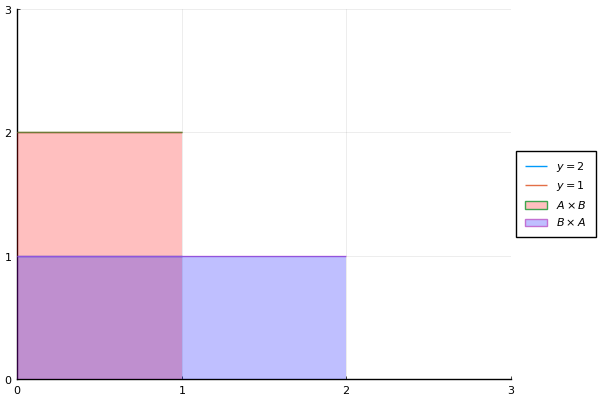

In [34]:
# Plot the intersection area of A: [0, 1] and B: [0, 2]

using Plots, LaTeXStrings
pyplot()

function Area(f, a, b, n)
xs = a:(b-a)/n:b
deltas = diff(xs)
cs = xs[1:end-1]
sum(f(cs[i]) * deltas[i] for i in 1:length(deltas))
end

function Area(g, a, b, n)
xs = a:(b-a)/n:b
deltas = diff(xs)
cs = xs[1:end-1]
sum(f(cs[i]) * deltas[i] for i in 1:length(deltas))
end

f(x) = 1
g(x) = 2
Area(x -> x^2, 0, 1, 50_000)

plot(f,0,1, xlims=(0,3), ylims=(0,3), label=L"y = 2", legend=:outerright)
plot!(g,0,1, xlims=(0,3), ylims=(0,3), label=L"y = 1", legend=:outerright)
plot!(g,0,1, label=L"A \times B", fill=(0, 0.25, :red))
plot!(f,0,2, label=L"B \times A", fill=(0, 0.25, :blue))

#### Relation

Let $X, Y$ be sets, and for $x \in X, y \in Y$, let $r(x,y)$ be a binary predicate. We say that r gives a binary relation (correspondence) between elements of $X$ and $Y$.

If $r(x,y)$ is true, then we say that $x$ and $y$ are in relation.

[$x=y$]

\begin{equation}
R := \{ (x,y): (x,y) \in X \times Y ∧ r(x,y) \}
\end{equation}

subset of $X \times Y$.

It is called the graph of $r$ / graph($r$).

$x, y$ in relation with $r$ is denoted with $(x,y) \in graph(r)$.

Given $A$ subset $r \subset X \times Y$, we can define the relation $r$:

" $p(x,y)$ is true if and only if $(x,y) \in R$"

then $graph(r) = R$

##### Example

1. $X$ limits in plane;
    $Y$ limits in plane
    
    relation $r$: point belongs to the line
    
2. $X$ positive integers;
    Relations on $X$:
    
    a) $r(m,n)$: "$m$ and $n$ relatively prime"
    
    b) $r(m,n)$: "$m$ divides $n$"
    
    c) $t(m,n)$: "$m^{2} + n^{2}$ is the square of an integer"
    
##### Example

$X$ set real numbers

(i) " $x \le y$ " relation
    
(ii) "$x^{2} + y^{2} + 1 = 0$ " relation
    
(iii) "$\sin ^{2} r + \cos^{2}y = 1$ " relation

Find the graphs. If the graph is the empty set, we say that the relation is impossible.

#### Equivalence    

We say that a relation $r$ is an equivalence (relation) in $X$.

We denote it with $\approx ( x \approx y)$ if it verifies the properties:

* Reflexive: $∀x \in X: x \approx x$

* Symmetric: $∀x \in X, ∀y \in X : x \approx y ↔ y \approx x$

* Transitive: $∀x \in X, ∀y \in X, ∀z \in X : (x \approx y) ∧ (y \approx z) → (x \approx z)$

#### Partition  of $X$

Family of subsets of $X$, $S$, ( namely, a subset of $P(x)$ ) such that:

1) Each elements $A$ of $S$ is non empty

2) If $A_{1} \in S, A_{2} \in S, A_{1} \neq A_{2}$, then $A_{1} ∩ A_{2} = ø$

3) $\cup_{A \in S} A = X$

##### Example

$X$: {Positive integers}

$S = \{E,O\}$ is a partition with

    * E: {Even positive integers}
    
    * O: {Odd positive integers}
    
If $r$ equivalence in $X$, we define the equivalence class of $x$ as follows:
   
\begin{equation}
\{x\} := \{y:(y \in X) ∧ (x \approx y)\}
\end{equation}

Theorem:

$X$ not empty, $r$ equivalence in $X$, then the family $\{\{x\}: x \in X\}$ is a partition of $X$.

Proof:

$x \in \{x\}$ (reflexive)

$\cup_{x \in X} \{x\} = X$ because if $x \in X$ then $x \in \{x\}$ and therefore $x \in \cup \{x\}$, $X \subset \cup_{x \in X} \{x\}$

the other inclusion is trivial.

Take $\{x\}$ and $\{y\}$ distinct  and assume by contradiction there exists $z \in \{x\} \cap \{y\}$. Therefore $x \approx y$ and $y \approx z$. By symmetry and transitive properties, we have $x \approx y$.

Finally, for any $x' \in \{x\}$, $x' \approx x → x' \approx y → x' \in \{y\}$

If $y' \in \{y\}, y' \approx y$ and $y \approx x → y' \approx x → y' \in \{x\}$

$\{x\} \subseteq \{y\}$ and $\{y\} \subseteq \{x\} → \{x\} = \{y\}$ 

Each element of $X$ belongs to exactly one equivalent class. The partition determined by the equivalence is called quotient set, denoted with $X/r$..

If $S$ partition in $X$, it determines uniquely an equivalence $r$ such that $S = X/r$. $r$ defines by "$x \approx y ↔ x$ and $y$ belong to the same element of $S$"

##### Example

(i) Equality is equivalence

\begin{equation}
\{X\} = \{x\}
\end{equation}

(i) $\mathbb{Z}$ set of integers: 

\begin{equation}
\mathbb{Z} = \{0, \pm 1, \pm 2, \pm 3, \dots \}
\end{equation}

$m$ integer $\ge 1$

$r(x, y): "x - y$ is divisible by $m$"

This is an equivalence. 

Proof:

* $m=1$: All elements are in relation ↔ 1 class $\mathbb{Z}$

* $m=2$: 2 Equivalence classes: 

    *Even numbers

    *Odd numbers

##### Example in Geometry

Parallelism between lines.

Similarity between polygons.

Equivalence.

### Order Relation


$r$ is an order relation (ordering) in $X$ denoted with $x \preceq y$, if

(1) Reflexive: $∀x \in X: x \preceq x$

(2) Antisymmetric: $∀x \in X, ∀y \in Y: (x \preceq y) ∧ (y \preceq x) ↔ x = y$

(3) Transitive: $∀x \in X, ∀y \in Y, ∀z \in Z: (x \preceq y) ∧ (y \preceq z) → x \preceq z $

Elements on the graph of relation are comparable. If for any $x, y \in X$, we can establish if $x \preceq y$ or $y \preceq x$, we say that the ordering is Total. Otherwise, the ordering is Partial.

A set with an ordering is an ordered set.

##### Example

(1) $\mathbb{R}$ set of real numbers with the usual relation $ \le (\ge)$ " less or equal" ("greater or equal") is an ordered set (Total ordered)

(2) $ひ$ be a set, consider $P(ひ)$ ( the set of all subsets) we have a partial order defined by inclusion: $A, B \in P(ひ), A \preceq B$ if $A \subseteq B$

If $A \subseteq B$ it means that $∀x \in A, x \in B$. 

While $A \preceq B$ means that for ordered pairs $(a,b)$ with $a \in A, b \in B$ such that $a \preceq b$.

$x$ is a minimal element for set $B$, and $∀y \in B$, $y$ is a maximal element of set $A$, and $x = y$. 

Therefore, given that $A \subseteq B$, if $B \preceq A$ then $b \preceq a: ∀b \in B, b \in A$, it is a contradiction.

## Real Analysis Course 4 (July 21st 2022)

### Ordered Set
$(X, \preceq)$ ordered set. $A \subseteq X$ non empty subset.

##### Definition:

$k \in X$ is an upper bound for $A$ if

i) You can compare $k$ with any element of $A$

ii) $∀x \in A: x \preceq k$

If $A$ has at least one upper bound, then we say that $A$ is bounded above.

$l \in X$ is a lower bound for $A$ if

i) You can compare $l$ with any element of $A$

ii) $∀x \in A: l \preceq x$

If $A$ has at least one lower bound, then we say that $A$ is bounded below.

$A$ is bounded, if $A$ is bounded above and below.

##### Definition:

(i) $n \in X$ is the maximum of $A$ if
    
1) $n \in A$

2) $n$ is an upper bound for $A$
    
(ii) $m \in X$ is the minimum of $A$ if
    
1) $m \in A$

2) $n$ is the lower bound for $A$

If maximum(minimum) exists, then it is unique.

In general, even if upper bound exists, then maximum may not exist. If lower bound exists, then minimum may not exist.

##### Example:

$A = \{ x \in \mathbb{R}: 0 < x < 1\}$

Bounded subset of $\mathbb{R}$, but max and min do not exist

##### Definition:

$A \subseteq X$ non empty.

$(X, \preceq)$ ordered 

(i) We call least upper bound (or supremum) of $A$ denoted by $sup(A)$ the smallest among upper bounds of $A$.
        
(1) $sup(A)$ is upper bound for $A$

(2) If $x \preceq sup(A), x \neq sup(A)$, then $x$ is not an upper bound for $A$.

(ii) We call greatest lower bound (or infimum) of $A$ denoted by $inf(A)$ the biggest among lower bounds of $A$.
        
(1) $inf(A)$ is lower bound for $A$

(2) If $x \succeq inf(A), x \neq inf(A)$, then $x$ is not a lower bound for $A$.

##### Remarks:

(i) $inf$ and $sup$, when they exist, are unique

(ii) If maximum exists then it coincides with $sup$. $sup$ may exist when maximum does not.

If minimum exists then it coincides with $inf$. $inf$ may exist when minimum does not.
 
Existence of $sup/inf$ is one of the main difference between rational and real numbers.

##### Definition:

An ordered set $X$ is said to have the least upper bound property if for any $A \subseteq X, A \neq ø, A$ bounded above, then $sup(A)$ exists in $X$.

##### Remarks:

If this is true, one can prove the corresponding property for $inf$ is true as well.

##### Definition:

An ordered set $X$ is well-ordered if any nonempty subset of $X$ has a minimum.

##### Remarks:

Well-ordered implies totally ordered: $x, y \in X$, consider $A=\{x,y\} \subseteq X$. 

If minimum of $A$ exists, then it is either $x$ (in this case $x \preceq y$), or $y$(in this case $y \preceq x$)

### Functions
$X, Y$ two sets, we call function from $X$ to $Y$ a relation $r$ in $X \times Y$ such that:

For any $x \in X$, there exists exactly one $y \in Y$ in relation with $x$.

In other words, the set

$\{y \in Y: (x, y) \in graph(r)\}$

made by exactly only one element for any $x \in X$.

Equivalently, $(x, y_{1})$, $(x, y_{2})$ with $(x, y_{1}) \in graph(r), (x, y_{2}) \in graph(r) → y_{1} = y_{2}$

##### Example:

$x, y \subseteq \mathbb{R}$ real numbers

$ X \times Y$ subset of $\mathbb{R^{2}}$ plane

$X = [a, b] = \{ x \in \mathbb{R}; a \le x \le b\}$

$r_{1}$ is a function; $r_{2}$ is not a function.

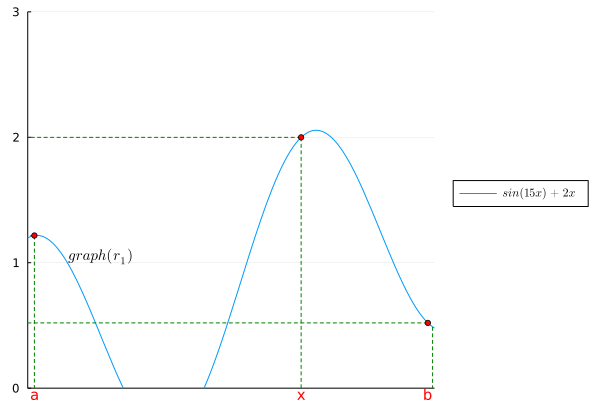

In [1]:
# graph($r_{1}$)
using Plots, LaTeXStrings
gr()

f(x) =  sin(15*x) + 2*x
plot(f,0,1, xlims=(0.10,0.71), xticks = 0:1:1.5, ylims=(0,3), label=L"sin(15x) + 2x", legend=:outerright)
plot!([0.707106781,0.707106781],[f(0.707106781),0], label="", linecolor=:green, linestyle=:dash)
plot!([0.51,0.51],[f(0.51),0], label="", linecolor=:green, linestyle=:dash)
plot!([0.11,0.11],[f(0.11),0], label="", linecolor=:green, linestyle=:dash)
plot!([0.11,0],[f(0.11),f(0.11)], label="", linecolor=:green, linestyle=:dash)
plot!([0.51,0],[f(0.51),f(0.51)], label="", linecolor=:green, linestyle=:dash)
plot!([0.70,0],[f(0.70),f(0.70)], label="", linecolor=:green, linestyle=:dash)

scatter!([0.11], [f(0.11)], color = "red", label="", markersize = 3)
scatter!([0.51], [f(0.51)], color = "red", label="", markersize = 3)
scatter!([0.70], [f(0.70)], color = "red", label="", markersize = 3)

annotate!([(0.21,1.05, (L"graph(r_{1})", 10, :black)),
           (0.11,-0.05, ("a", 10, :red)), 
           (0.51,-0.05, ("x", 10, :red)),
           (0.70,-0.05, ("b", 10, :red))])

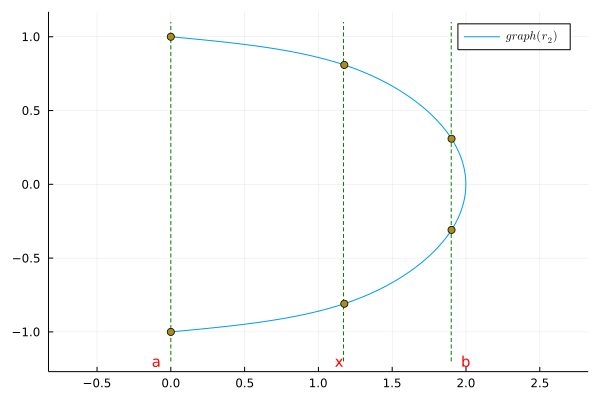

In [2]:
# graph($r_{2}$)
using Interpolations, Plots, LaTeXStrings
t = 0:.2:1
x, y = 2sin.(π*t), cos.(π*t)
itp = Interpolations.scale(interpolate([x y], (BSpline(Cubic(Natural(OnGrid()))), NoInterp())), t, 1:2)
tfine = 0:.01:1
xs, ys = [itp(t,1) for t in tfine], [itp(t,2) for t in tfine]
x0, y0 = itp(0.5,1), itp(0.5,2) # interpolate point at t=0.5
plot(xs, ys, aspect_ratio=1, label=L"graph(r_{2})")
plot!([0,0],[-1.2,1.1], label="", linecolor=:green, linestyle=:dash)
plot!([1.17,1.17],[-1.2,1.1], label="", linecolor=:green, linestyle=:dash)
plot!([1.9,1.9],[-1.2,1.1], label="", linecolor=:green, linestyle=:dash)

scatter!(x, y, label="")
annotate!([(-0.1,-1.2, ("a", 10, :red)),
           (1.14,-1.2, ("x", 10, :red)),
           (2.0,-1.2, ("b", 10, :red))])

Function is an uniquely defined correspondence from $X$ to $Y$

$y = f(x)$

* $f$ is a function from $X$ to $Y$

* $X$ is called domain; $X = dom(f)$

* $Y$ is called codomain; $Y = cod(f)$

$ y = f(x)$, $y$ is the image of $x$ by means of $f$.

$f(x):= \{y \in Y: ∃x \in X: y = f(x) \}$

Image of $f$ (subset of $Y$ / $f \subseteq Y$)

$f(x)$ can be a single element; f is constant

##### Example:
\begin{equation}
f:x → sin(x)\\
\mathbb{R} → \mathbb{R}\\
domain → codomain\\
\end{equation}

$f(x): \{ x \in \mathbb{R}: -1 \le f(x) \le 1\} \subset \mathbb{R}$

When are two functions equal?

$f$ from $X$ to $Y$ is determined by domain $X$, codomain $Y$, and

##### Example:
\begin{equation}
f:x → x^{2} \ \text{from} \ \mathbb{R} \ \text{to} \ \mathbb{R} \\
g:x → x^{2} \ \text{from} \ \mathbb{R} \ \text{to} \ \mathbb{R_{+}} \cup\{0\} \\
\mathbb{R{+}} = \{x \in \mathbb{R}; x > 0\}
\end{equation}

$f \neq g$ (different codomain), but actually $f$ coincides with $g$ if one consider $f: \mathbb{R} → f(\mathbb{R})$.

##### Example:
\begin{equation}
f(x) = \frac{\sqrt{x}}{1-x} \quad \text{in } \mathbb{R}\\
dom(f)=\{x \in \mathbb{R}: x \ge 0 ∧ x \neq 1\}
\end{equation}

[ Sequence of real numbers: functions from natural numbers to $\mathbb{R}$]

* Composition (an operation where two functions say f and g generate a new function say h in such a way that $h(x) = g(f(x)$ )

* Injective (a function $f$ that maps distinct elements to distinct elements, that is if $f_{a}=f_{b}$, then $a=b$)

* Surjective (a function $f$ that maps an element $x$ to every element $y$; that is, for every $y$, there is an $x$ such that $f(x) = y$ )

* Inverse function ( a function, which can reverse into another function if any function $f$ takes $x$ to $y$ then, the inverse of $f$ will take $y$ to $x$. If the function is denoted by $f$ or $F$, then the inverse function is denoted by $f^{-1}$ or $F^{-1}$.

#### Composition
Given two functions

\begin{equation}
f: X → Z; \quad g: W → Y\\
\end{equation}

If $im(f) \subseteq dom(g)$ with $dom(g) = W$, we can define the composition $g \circ f$ as follows:

\begin{equation}
g \circ f: X → Y\\
x → g(f(x))
\end{equation}

##### Remark:
Extend to more than 2 functions: $ f \circ g \circ h \circ \dots$.

Composition is associative: $ (f \circ g) \circ h = f \circ (g \circ h)$ 

##### Definition:

(i) $f: X → Y$. If $im(f) = Y$, then the function is surjective (onto)

(ii) $f: X → Y$ is injective if $∀x_{1} \in X, ∀x_{2} \in X: f(x_{1}) = f(x_{2}) → x_{1} = x_{2}$ (one-to-one)

(iii) $f: X → Y$ both injective and surjective is called bijective (invertible)

##### Example:

\begin{equation}
f: \mathbb{R} → \mathbb{R} \\
x → sin(x)
\end{equation}

Neither injective, nor surjective.

Restrict the codomain to [-1,1] → surjective

To be injective, for any value of $y / f(x)$ in the image, you must only have one point of $x$ in the domain.

The function becomes injective, in the restricted domain:

$\{x \in \mathbb{R}: \pi/2 \le x \le \pi/2\}$

Connected to the solution of $y = f(x)$

* Surjective → $∀y$ then there exists at least one solution $x$

* Injective → $∀y$ the solution, if it exists, is unique

$f: X  → Y$ is injective;

$f: X  → f(x)$ with $f(x) = im(f)$ is injective and surjective  → bijective

$y = f(x), ∀y$ has exactly 1 solution $x$.

In that case, $∀y \in f(x)$ one can define a function which gives the unique $x$ such that $y=f(x)$, this is the inverse function:

\begin{equation}
f^{-1}: f(x) → x
\end{equation}

$f: X → Y$ is invertible if and only if it is injective with $f^{-1}$ defined on $f(x)$

##### Remarks:

(i) $f \circ f^{-1} = I_{f(x)}; f^{-1} \circ f = I_{x}$ 

$I_{f(x)}$ is identity on $f(x), I_{x}$ is identity on $x$

(ii) $(f^{-1})^{-1} = f$

$f$ invertible (one-to-one; bijective).

one-to-one correspondence between $x$ and $f(x)$.

$X f(x)$ identified by means of $f$. $x_{1} x_{2}$

## Real Analysis Course 5 (July 25th 2022)

## Finite Sets - Cardinal Numbers - Rational Numbers

"Counting" elements of a set leads to the notion of cardinality of a set.

The cardinality of a set is a measure of a set's size, meaning the number of elements in the set.

#### Definition

$A$ and $B$ nonempty sets are equipotent if there exists a bijective function between them $A ↔ B$ (one-to-one correspondence). This property is reflexive, symmetric and transitive.

"Equivalence relation" 

Nevertheless, given a nonempty set $A$, consider the class of all sets equipotent to $A$. This identifies the property common to all such sets, namely to be in a one-to-one correspondence among themselves. 

This property called Cardinality of $A$ / Cardinal number of $A$ / Power of $A$.

$A \neq ø$; card($A$) is the class of all sets equipotent to $A$.

[Cantor Definition of Cardinality]
Cantor's theorem, in set theory, the theorem that the cardinality (numerical size) of a set is strictly less than the cardinality of its power set, or collection of subsets.

Assume that $ø$ defines the class card($ø$).

### Natural Numbers

A set, we define the subsequent $A^{+}$ as follows

\begin{equation}
A^{+} := A \cup \{A\} = \{A,\{A\}\}
\end{equation}

#### Example

\begin{equation}
A = \{a,b\} \\
A^{+} := \{a,b,A\}
A^{+} := \{a,b,\{a,b\}\}
\end{equation}

* Natural number 0: 0:= card($ø$)

* Natural number 1: 1:= card($ø^{+}$)

* Natural number 2: 2:= card($\{ø\}^{+}$)

$ø^{+} = \{ø\}$

$ø^{+} = \{ø, \{ø\} \}$

### Alternative axiomatic definition  to Peano

"number", "zero", "subsequent" are primitive notions

#### Axioms:

* $P_{1}$: zero(in symbols: 0) is a natural number

* $P_{2}$: For any natural number $n$, there exists an uniquely determined natural number $n^{+}$, the subsequent number

* $P_{3}$: 0 is not the subsequent of any natural number

* $P_{4}$: Different natural numbers have different subsequent numbers

* $P_{5}$: Induction principle

Let $P(n)$ be a predicate on natural number $n$ if

(i) $P(0)$ is true

(ii) For any $n$, if $P(0), P(1), \dots, P(n)$ are true, then $P(n^{+})$ is true

Then $P(n)$ is true for any natural number.

Then we can define ordering, elementary operations with usual calculus rules, and in particular $n^{+} = n + 1$

Let's go back to definition

There exists a set containing $ø$ and the subsequent of any of its elements [axiom of infinity]

A set like this is called inductive.

Now, given an inductive set $A$, we define the set of all natural numbers, denoted with $\mathbb{N}$, the intersection of all inductive subsets of $A$.

A set $X$ is finite if $card(X)$ is a natural number, otherwise $X$ is infinite.

### Operations on $\mathbb{N}$

#### Ordering ~ inclusion "$\in$"

* $ 0 < 1 ↔ ø \in \{ø\}$

* $ 1 < 3 ↔ \{ø\} \in \{ø, \{ø\},\{ø, \{ø\} \} \}$

$ 0 → ø$

$ 1 → \{ø\}$

$ 2 →\{ø, \{ø\} \}$

If $A \subseteq B$, and $card(A) = m$, $card(B) = n$, then $ n \ge m$.

With this, ordering $\mathbb{N}$ is well-ordered (any nonempty subset of $\mathbb{N}$ has minimum).

Finite cardinal numbers are natural numbers.

#### Sum:

$m,n \in \mathbb{N}, card(A) = m, card(B) = n$

$A$ and $B$ disjoint

#### Product:

$n \cdot m := card(A \times B)$

(the cardinality of the cross product)

#### Difference:

Take $A$ and $B$ such that

$A \subseteq B ( → n \ge m)$

$n - m: card(B \setminus A)$

#### Quotient:

Possible only if $m \le n$, and it is possible to assign a partition in $B$ of disjoint classes.

All having cardinality $m$. 

In that case, $r$ relation of equivalent determined by the partition, and

$\frac{n}{m} := card(B/r)$

#### Remark:

$n^{+} = n + 1$

(The subsequent of $n^{+}$)

Our set $\mathbb{N}$ defined above verifies the $P_{1}, P_{2}, P_{3}, P_{4}, P_{5}$ axioms

$P(n)$ predicate; $A := \{n \in \mathbb{N}: P(n)\}$ and viceversa, given $A \subseteq \mathbb{N}$.

We have the predicate $P(n): "n \in A"$.

To prove $\mathbb{N}$ verifies $P_{5}$ we need to prove the following

#### Theorem:

Let $A$ a subset of $\mathbb{N}$ such that:

(i) $0 \in A$

(ii) $∀n: n \in A → n+1 \in A$ then $A = \mathbb{N}$

##### Proof:

We need to prove that the complement of $A$ / $CA$ in $\mathbb{N}$ is empty. By contradiction, assume $CA$ is not empty, thus it has minimum $m$.

Because $\mathbb{N}$ is well-ordered, the minimum $m$ is not $0$, because $0 \in A$ (i).

Then $m$ is the subsequent of $A$ given $n$, and $n$ belongs to $A$, because $n < m = n^{+}$ and $m$ is minimum of $CA$.

Impossible because from (ii) $n \in A → n+1 \in A$.

$\mathbb{N}$ verifies Peano' axioms, it is a model for then.

#### Remark:

Take $n_{0} \in \mathbb{N}$, if:

(i) $P(n_{0})$ is true

(ii) $∀n \ge n_{0} : P(n) → P(n+1)$

then $P(n)$ true $∀n \ge n_{0}$

#### Example:

Prove that $\sum_{k=1}^{n} k = \frac{n(n + 1)}{2}$

Prove using induction

Gauss proof:

\begin{equation}
\begin{matrix}
1 & + & 2 & + & 3 & + & \dots & + & n \\
n & + & (n-1) & + & (n-2) & + & \dots & + & 1 \\
+ & \ & + & \dots & + & \ & + & \ & \quad + \\
(n+1) & + & (n+1) & + & (n+1) & + & \dots & + & (n+1) & \quad \textbf{[n times]}\\
\end{matrix}
\end{equation}

\begin{equation}
\frac{n(n+1)}{2}
\end{equation}

\begin{equation}
\sum_{k=1}^{n} = \frac{n(n+1)}{2} \quad ∀n \ge 1
\end{equation}

(i) $n = 1: \sum_{k=1}^{1} k = \frac{1(1+1)}{2}$

$ 1 = 1$

(ii) Assume $\sum_{k=1}^{n} k = \frac{n(n+1)}{2}$

We need to prove $\sum_{k=1}^{n+1} k = \frac{(n+1)(n+2)}{2}$

\begin{equation}
\begin{split}
\sum_{k=1}^{n+1} k & = \sum_{k=1}^{n} k + \ (n+1) \quad \text{(induction)} \\
\ & = \frac{n(n+1)}{2} + (n+1) \\
\ & = \frac{n(n+1)}{2} + \frac{2(n+1)}{2} \\
\ & = \frac{n(n+1) + 2(n+1)}{2} \\
\sum_{k=1}^{n+1} k & = \frac{(n+1)(n+2)}{2} \\
\end{split}
\end{equation}

#### Example:

Proof by induction $n \ge 1$

(i) $\sum_{k=1}^{n} k^{2} = \frac{n(n+1)(2n+1)}{6}$

First, we see that
\begin{equation}
P(1): 1^{2} = 1
\end{equation}
and
\begin{equation}
\sum_{k=1}^{n} 1^{2} = \frac{1(1+1)(2(1)+1)}{6} = 1
\end{equation}
is true

Let $P(n)$ be true,
\begin{equation}
\sum_{k=1}^{n} k^{2} = \frac{n(n+1)(2n+1)}{6} 
\end{equation}
For $P(n+1)$,
\begin{equation}
\begin{split}
\sum_{k=1}^{n+1} k^{2} & = \frac{n(n+1)(2n+1)}{6} + (n+1)^{2} \\
\ & = \frac{n(n+1)(2n+1) + 6(n+1)^{2}}{6} \\
\ & = \frac{(n+1)\{n(2n+1) + 6(n+1)\}}{6} \\
\ & = \frac{(n+1)(n+2)\{2(n+1) + 1\}}{6} \\
\end{split}
\end{equation}

as $n(2n+1) + 6(n + 1) = 2n^{2} + 7n + 6 = (n+2)(2n+3)$

Thus, $P(n+1)$ is true if $P(n)$ is true.

(ii) $\sum_{k=1}^{n} (2k - 1) = n^{2}$

First, we see that
\begin{equation}
P(1): (2(1)-1) = 1
\end{equation}
and
\begin{equation}
\sum_{k=1}^{n} (2(1)-1) = (1)^{2} = 1
\end{equation}
is true

Let $P(n)$ be true,
\begin{equation}
\sum_{k=1}^{n} (2k - 1) = n^{2}
\end{equation}

For $P(n+1)$,
\begin{equation}
\begin{split}
\sum_{k=1}^{n+1}(2k - 1) & = n^{2} + ( 2(n+1) - 1 ) \\
\ & = n^{2} + 2n + 1 \\
\ & = (n + 1)^{2} \\
\end{split}
\end{equation}

Thus, $P(n+1)$ is true if $P(n)$ is true.

(iii) $\sum_{k=0}^{n} q^{k} = \frac{1 - q^{n+1}}{1 - q}$ with $q \neq 1$

First, we see that
\begin{equation}
P(0): q^{0} = 1
\end{equation}
and
\begin{equation}
\sum_{k=0}^{n} q^{0} = \frac{1 - q^{0+1}}{1 - q} = 1
\end{equation}
is true

Let $P(n)$ be true,
\begin{equation}
\sum_{k=0}^{n} q^{k} = \frac{1 - q^{n+1}}{1 - q}
\end{equation}

For $P(n+1)$,
\begin{equation}
\begin{split}
\sum_{k=0}^{n+1} q^{k} = \frac{1 - q^{n+1}}{1 - q} + q^{(n+1)} \\
\ & = \frac{1 - q^{n+1} + (1 - q)q^{n+1}}{1 - q} \\
\ & = \frac{1 - q^{n+1} + q^{n+1} - q^{n+2}}{1 - q} \\
\ & = \frac{1 - q^{n+2}}{1 - q} \\
\ & = \frac{1 - q^{(n+1)+1}}{1 - q} \\
\end{split}
\end{equation}

Thus, $P(n+1)$ is true if $P(n)$ is true.

#### Example:

Proof by induction the Bernoulli's inequality:

$x \ge -1$ real number ; $x \ge 1$ natural number

$P(n): (1 + x)^{n} \ge 1 + nx$

(i) $P(2)$ is true

$(1 + x)^{1} \ge 1 + 1 \cdot X$

$1 + x \ge 1 + x$

(ii) Assume $(1 + x)^{n} \ge 1 +nx$

then prove $(1+x)^{n+1} \ge 1 + (n+1)x$

$(1+x)^{n+1} = (1+x)^{n}(1+x) \ge (1+nx)(1+x)$

For $n = 1$,
\begin{equation}
(1+x)^{1} = 1 + x
\end{equation}
and
\begin{equation}
(1+(1)x)^{1} = 1 + x
\end{equation}
thus the inequality holds $(1+x)^{1} \ge 1+(1)x$.

Induction assumption: assume that for some integer $k \ge 1, (1+x)^{k} \ge 1 + kx$

Inductive step: We must show that $(1+x)^{k+1} \ge 1 + (k + 1)x$

Proof of inductive step:
\begin{equation}
\begin{split}
(1+x)^{k} & \ge 1 + kx \\
(1+x)(1+x)^{k} & \ge (1+x)(1 + kx) \\
(1+x)^{k+1} & \ge 1 + x + kx + kx^{2} \\
(1+x)^{k+1} & \ge 1 + (k+1)x + kx^{2} \\
\end{split}
\end{equation}

since $kx^{2} \ge 0$ then
\begin{equation}
\begin{split}
1 + (k+1)x + kx^{2} & \ge 1 + (k+1)x\\
\end{split}
\end{equation}

hence
\begin{equation}
\begin{split}
(1 + x)^{k+1} & \ge 1 + (k+1)x\\
\end{split}
\end{equation}


## Infinite Sets

$X, Y$ sets if there exists an injective function $f: X → Y$, we say that $card(X) \le card(Y)$.

Any finite set with cardinality $n$ is in a one-to-one correspondence with $E_{n} = \{1, 2, 3, \dots, n\}$.

$E_{n} \subset \mathbb{N}$ proper subset $E_{n} \neq \mathbb{N}$

$n \le card(\mathbb{N})$

$n = card(E_{n})$

We prove that $n < card(\mathbb{N})$ for any $n$

#### Theorem

$\mathbb{N}$ is an infinite set

##### Proof

By contradiction, assume $card(\mathbb{N}) = n$.

Then there exists a bijection $f: \mathbb{N} → E_{n}$

Restrict $f$ at $E_{n}: f: E_{n} → E_{n}$

(its image is one-to-one)

The image of this restriction has image a proper subset of $E_{n}$, say $E_{m}, m < n$.

This restriction would be a bijection between $E_{n}$ and its image, namely $E_{m}, m < n$

Impossible: $E_{m}, E_{n}$ have different cardinalty.

$\mathbb{N}$ is infinite; $card(\mathbb{N})$ countable

#### Example:

Set of even numbers is countable:

use $n → 2n$

Infinite sets can be equipotent to a proper subset.

#### Remark:

(i) Union of countable family of countable sets is countable

(ii) Product $A_{1} \times \dots \times A_{n}$ of finite number of countable sets is countable for instance, 

$\mathbb{N}^{2} = \mathbb{N} \times \mathbb{N}$ is countable

#### Theorem (Cantor)

For any set $X$,

$card(x) < card(S^{c}(x))$

##### Proof:

$x \neq ø$

$x \in X → \{x\} \in S^{c}(x)$

injective → $card(x) \le card(S^{c}(x))$

Assume by contradiction $card(x) = card(S^{c}(x))$

$ f: x → S^{c}(x)$ bijective

Consider $z:= \{x \in X: x \notin f(x) \}$

$Z \neq ø$ indeed $ø \in S^{c}(x)$

$f^{-1}(ø) = \bar{x} \in X, \bar{x} \notin f(\bar{x}) = ø$

$\bar{x} \in Z$ then there exists

$x_{0} \in X$ such that $f(x_{0}) = Z$.

This is impossible: if $x_{0} \notin f(x_{0})$.

Then, $x_{0} \in Z, Z = f(x_{0})$ and 

if $x_{0} \in f(x_{0})$, then $x_{0} \notin Z = f(x_{0})$

## Real Analysis Course 6 (July 26th 2022)

## Integers $\mathbb{Z}$

$m - n \quad (m,n \in \mathbb{N})$ is defined only if $ m \ge n$

"Define opposite of natural number"

I want to solve $x + a = b$

For any $a, b \in \mathbb{N}$ (→ "$x = b - a$").

Construct a group with respect to sum ( Ring considering also product).

#### Rigorous Definition:

$\mathbb{N^{2}} = \mathbb{N} \times \mathbb{N}$

($m,n$) pairs of natural numbers define the following equivalence relation:

\begin{equation}
(m,n) \approx (m',n') ↔ m+n' = m' + n
\end{equation}

##### Example:

$(5,3) \approx (8,6) \approx (2,0)$

(find ordered pairs that has difference of 2 → list $m$ from $0,1,2,\dots$ then $n=m+2$, with $m,n \ge 0$)

$\mathbb{Z} = \mathbb{N^{2}}/ \approx $

#### Define Sum and Product

New operation on $\mathbb{Z}$

\begin{equation}
\begin{split}
[(m,n)] & + & [(m',n')] & := & [(m + m', n + n')] \\
[(m,n)] & \ \cdot & [(m',n')] & := & [(mm' + nn', nm' + mn')] \\
\end{split}
\end{equation}

Definition does not depend on the chosen representative.

#### Define order:

\begin{equation}
[(m,n)] \le [(m',n')] ↔ m + n' \le m' + n
\end{equation}

The $\le$ in $[(m,n)] \le [(m',n')]$ means new order. While the $\le$ in $ m + n' \le m' + n$ means order on $\mathbb{N}$

It does not depend on choice of representation.

Elements of $\mathbb{Z}$ as structured about are integer number.

#### Remark:

A pair($m',n'$) is equivalent to

* ($m,0$) if $m' > n'$

* ($0,n$) if $m' < n'$

* ($0,0$) if $m' = n'$

See definition of $\approx$:

$[m = m' - n']$

$[n = n' - m']$

* $m$ is notation for [($m, 0$)]

* $-n$ is notation for [($0, n$)]

* $0$ is notation for [($0, 0$)]

#### Example

\begin{equation}
\begin{split}
[(p,0)] + [(0,p)] & = [(p+0, 0+p)] \\
\ & = [(p,p)] \\
\ & = [(0,0)] \\
\ & = 0
\end{split}
\end{equation}

$∀ n,m ; \quad -m \le 0 \le n$

$-m$ negative integers

$+m$ positive integers

#### Example

$m(-n)$

\begin{equation}
\begin{split}
[(m,0)] \ \cdot [(0,n)] & = [(m \cdot 0 + 0 \cdot n, 0 \cdot 0 + m \cdot n)] \\
\ & = [(0, mn)] \\
\ & = -mn \\
\end{split}
\end{equation}

#### Example: Concerning Ordering
\begin{equation}
\begin{split}
[(0,m)]& \le [(0,0)] \\
\text{if and only if} \\
-m & \le 0 \\
0 + 0 & \le 0 + m \\
\end{split}
\end{equation}


## Rational Numbers $\mathbb{Q}$

Define a field with respect to sum and product.

Defined as before by means of equivalence relation.

$\mathbb{Z_{0}} = \mathbb{Z} - \{0\}$ and $\mathbb{Z} \times \mathbb{Z_{0}} = \{(p,q): p,q \in \mathbb{Z}, q \neq 0\}$

In $\mathbb{Z} \times \mathbb{Z_{0}}$ we define the equivalence relation:

\begin{equation}
(p,q) \approx (p', q') ↔ pq' = qp'
\end{equation}

#### Example:

\begin{equation}
(2,5) \approx (6,15) \approx (-4,-10)
\end{equation}

\begin{equation}
\mathbb{Q} := (\mathbb{Z} \times \mathbb{Z_{0}}) / \approx
\end{equation}

#### Definition of sum, product, ordering:

* $[(p,q)] + [(p',q')] := [(pq' + qp', qq')]$

* $[(p,q)] \ \cdot [(p',q')] := [(pp', qq')]$

* $[(p,q)] \le [(p',q')] := (pq' - qp')(qq') \le 0$

#### Remark:

$[(p,q)]$ with $pq < 0$ are negative numbers. 

$[(0,q)]$ is 0. 

$[(p,q)]$ with $pq > 0$ are positive numbers.

Simplified notation: $\frac{p}{q}$ instead of $[(p,q)]$

## Real Numbers $\mathbb{R}$

We already know that the equation $p^{2} = 2$ is not satisfied by any rational number $p$.

In $\mathbb{Q}$, there are "gaps", in spite of the fact that between any two rationals there is another $r, s \in \mathbb{Q}, \quad r < s$, then

$r < \frac{r+s}{2} < 2$

with $\frac{r+s}{2} \in \mathbb{Q}$

Let $A$ be the set of all positive rationals $p$ such that $p^{2} < 2$ and is the set of positive rationals $p$ such that $p^{2} > 2$.

All numbers in $A$ are smaller than numbers in $B$.

$A$ is bounded from above by elements in $B$; numbers in $B$ are upper bounds for $A$.

$B$ is bounded from below by elements in $A$ (lower bounds for $B$).

We prove that $A$ contains no largest number and $B$ contains no smallest.

Given $p \in \mathbb{Q}, p > 0$ (positive rational).

Consider

\begin{equation}
\begin{split}
q & = p - \frac{p^{2} - 2}{p + 2} \\
\ & = \frac{2p + 2}{p + 2} \quad \boldsymbol{[*]} \\
\end{split}
\end{equation}

\begin{equation}
\begin{split}
q^{2} - 2 & = \frac{2 p^{2} - 2}{(p + 2)^{2}} \quad \boldsymbol{[** ]} \\
\end{split}
\end{equation}

If $p \in A (↔ \ p^{2} < 2)$, then from $\boldsymbol{[*]}$ we know that $q > p$ and from $\boldsymbol{[**]}$ $q^{2} -2 < 0, \ q \in A$.

If $p \in B (↔ \ p^{2} > 2)$, then $\boldsymbol{[*]}$ implies $0 < q < p$ and $\boldsymbol{[**]}$ implies $q \in B$

Moreover:

$A \subset \mathbb{Q}$ has no least upper bound in $\mathbb{Q}$

(The $sup(A)$ does not exist in $\mathbb{Q}$)

Equivalently, $B$ has no greatest lower bound / $inf(B)$ in $\mathbb{Q}$

$\mathbb{Q}$ with its order does not have the least-upper-bound property

#### Theorem:

There exists an ordered field $\mathbb{R}$, containing $\mathbb{Q}$ as a subfield which has the least-upper-bound property.

$\mathbb{R}$ field of real numbers; sum and product, when restricted to members of $\mathbb{Q}$, coincide with the ones defined before.

#### "Informal Definition"

Real number: Decimal alignment with sign if the alignment is periodic (or not), real number is rational; otherwise it is irrational.

#### Example

$" \sqrt{2} = 1.4141414141... " \quad \text{irrational}$

$" \frac{1}{3} = 0.33333... " \quad \text{rational}$

$" \frac{1}{2} = 0.5 " \quad \text{rational}$

#### Theorem

$\mathbb{R}$ is not countable $card(\mathbb{R}) > card(\mathbb{Q}) = card(\mathbb{N})$

$card(\mathbb{R}) = card((0,1))$.

### Functions in $\mathbb{R}$: Basic properties and elementary functions

$f: D → \mathbb{R}$ with $D \subset \mathbb{R}$ domain of definition.

$ x \in D → f(x) \in \mathbb{R}$ with $f(x)$ is uniquely determined.


In [32]:
# Operations on Integers for equivalence relation m + n' = m' + n

m=5
n=3

println("i \t chosen pair \t ordered pair-1  ordered pair-2 sum operation product operation")
for i = 1:10
    m1 = m + i
    n1 = n + i
    m2 = m - i
    n2 = n - i
    println("$i \t ($m,$n) \t \t ($m1,$n1) \t \t ($m2,$n2)")
end

i 	 chosen pair 	 ordered pair-1  ordered pair-2
1 	 (5,3) 	 	 (6,4) 	 	 (4,2)
2 	 (5,3) 	 	 (7,5) 	 	 (3,1)
3 	 (5,3) 	 	 (8,6) 	 	 (2,0)
4 	 (5,3) 	 	 (9,7) 	 	 (1,-1)
5 	 (5,3) 	 	 (10,8) 	 	 (0,-2)
6 	 (5,3) 	 	 (11,9) 	 	 (-1,-3)
7 	 (5,3) 	 	 (12,10) 	 	 (-2,-4)
8 	 (5,3) 	 	 (13,11) 	 	 (-3,-5)
9 	 (5,3) 	 	 (14,12) 	 	 (-4,-6)
10 	 (5,3) 	 	 (15,13) 	 	 (-5,-7)


In [42]:
# Sum and Product Operations on Integers

m=5
n=3

println("i \t chosen pair \t ordered pair-1  \t sum operation \t product operation")
for i = 1:10
    m1 = m + i
    n1 = n + i
    ms = m + m1
    ns = n + n1
    mp = (m*m1) + (n*n1)
    np = (n*m1) + (m*n1)
    println("$i \t ($m,$n) \t \t \t ($m1,$n1) \t \t ($ms,$ns) \t \t ($mp,$np) ")
end

i 	 chosen pair 	 ordered pair-1  	 sum operation 	 product operation
1 	 (5,3) 	 	 	 (6,4) 	 	 (11,7) 	 	 (42,38) 
2 	 (5,3) 	 	 	 (7,5) 	 	 (12,8) 	 	 (50,46) 
3 	 (5,3) 	 	 	 (8,6) 	 	 (13,9) 	 	 (58,54) 
4 	 (5,3) 	 	 	 (9,7) 	 	 (14,10) 	 	 (66,62) 
5 	 (5,3) 	 	 	 (10,8) 	 	 (15,11) 	 	 (74,70) 
6 	 (5,3) 	 	 	 (11,9) 	 	 (16,12) 	 	 (82,78) 
7 	 (5,3) 	 	 	 (12,10) 	 	 (17,13) 	 	 (90,86) 
8 	 (5,3) 	 	 	 (13,11) 	 	 (18,14) 	 	 (98,94) 
9 	 (5,3) 	 	 	 (14,12) 	 	 (19,15) 	 	 (106,102) 
10 	 (5,3) 	 	 	 (15,13) 	 	 (20,16) 	 	 (114,110) 


In [72]:
# Operations on Rational Numbers for equivalence relation pq' = qp'
using BenchmarkTools

p=2
q=5

println("i \t chosen pair \t ordered pair-1  ordered pair-2 ")

for i = 1:10
    p1 = p + i
    q1 = (q*p1)/p
    for j = 1:10
        p2 = p1 + j
        q2 = (q1*p2)/p1   
        if all(rem(q1*p2,p1)==0 && rem(q*p1,p)==0)
            println("$i \t ($p,$q) \t \t ($p1,$q1) \t \t ($p2,$q2)")
        end
    end
end


i 	 chosen pair 	 ordered pair-1  ordered pair-2 
2 	 (2,5) 	 	 (4,10.0) 	 	 (6,15.0)
2 	 (2,5) 	 	 (4,10.0) 	 	 (8,20.0)
2 	 (2,5) 	 	 (4,10.0) 	 	 (10,25.0)
2 	 (2,5) 	 	 (4,10.0) 	 	 (12,30.0)
2 	 (2,5) 	 	 (4,10.0) 	 	 (14,35.0)
4 	 (2,5) 	 	 (6,15.0) 	 	 (8,20.0)
4 	 (2,5) 	 	 (6,15.0) 	 	 (10,25.0)
4 	 (2,5) 	 	 (6,15.0) 	 	 (12,30.0)
4 	 (2,5) 	 	 (6,15.0) 	 	 (14,35.0)
4 	 (2,5) 	 	 (6,15.0) 	 	 (16,40.0)
6 	 (2,5) 	 	 (8,20.0) 	 	 (10,25.0)
6 	 (2,5) 	 	 (8,20.0) 	 	 (12,30.0)
6 	 (2,5) 	 	 (8,20.0) 	 	 (14,35.0)
6 	 (2,5) 	 	 (8,20.0) 	 	 (16,40.0)
6 	 (2,5) 	 	 (8,20.0) 	 	 (18,45.0)
8 	 (2,5) 	 	 (10,25.0) 	 	 (12,30.0)
8 	 (2,5) 	 	 (10,25.0) 	 	 (14,35.0)
8 	 (2,5) 	 	 (10,25.0) 	 	 (16,40.0)
8 	 (2,5) 	 	 (10,25.0) 	 	 (18,45.0)
8 	 (2,5) 	 	 (10,25.0) 	 	 (20,50.0)
10 	 (2,5) 	 	 (12,30.0) 	 	 (14,35.0)
10 	 (2,5) 	 	 (12,30.0) 	 	 (16,40.0)
10 	 (2,5) 	 	 (12,30.0) 	 	 (18,45.0)
10 	 (2,5) 	 	 (12,30.0) 	 	 (20,50.0)
10 	 (2,5) 	 	 (12,30.0) 	 	 (22,55.0)


In [1]:
# Operations on Rational Numbers for equivalence relation pq' = qp'

println("i \t chosen pair \t ordered pair-1  ordered pair-2 ")

let (p, q) = (2, 5), i = 1
         for coeff1 in -5:5
           coeff1 in (0, 1) && continue
           for coeff2 in coeff1+1:5
             coeff2 in (0, 1) && continue
             println("$i \t ($p, $q) \t $(coeff1.*(p, q)) \t $(coeff2.*(p, q))")
             i += 1
           end
         end
end

i 	 chosen pair 	 ordered pair-1  ordered pair-2 
1 	 (2, 5) 	 (-10, -25) 	 (-8, -20)
2 	 (2, 5) 	 (-10, -25) 	 (-6, -15)
3 	 (2, 5) 	 (-10, -25) 	 (-4, -10)
4 	 (2, 5) 	 (-10, -25) 	 (-2, -5)
5 	 (2, 5) 	 (-10, -25) 	 (4, 10)
6 	 (2, 5) 	 (-10, -25) 	 (6, 15)
7 	 (2, 5) 	 (-10, -25) 	 (8, 20)
8 	 (2, 5) 	 (-10, -25) 	 (10, 25)
9 	 (2, 5) 	 (-8, -20) 	 (-6, -15)
10 	 (2, 5) 	 (-8, -20) 	 (-4, -10)
11 	 (2, 5) 	 (-8, -20) 	 (-2, -5)
12 	 (2, 5) 	 (-8, -20) 	 (4, 10)
13 	 (2, 5) 	 (-8, -20) 	 (6, 15)
14 	 (2, 5) 	 (-8, -20) 	 (8, 20)
15 	 (2, 5) 	 (-8, -20) 	 (10, 25)
16 	 (2, 5) 	 (-6, -15) 	 (-4, -10)
17 	 (2, 5) 	 (-6, -15) 	 (-2, -5)
18 	 (2, 5) 	 (-6, -15) 	 (4, 10)
19 	 (2, 5) 	 (-6, -15) 	 (6, 15)
20 	 (2, 5) 	 (-6, -15) 	 (8, 20)
21 	 (2, 5) 	 (-6, -15) 	 (10, 25)
22 	 (2, 5) 	 (-4, -10) 	 (-2, -5)
23 	 (2, 5) 	 (-4, -10) 	 (4, 10)
24 	 (2, 5) 	 (-4, -10) 	 (6, 15)
25 	 (2, 5) 	 (-4, -10) 	 (8, 20)
26 	 (2, 5) 	 (-4, -10) 	 (10, 25)
27 	 (2, 5) 	 (-2, -5) 	 (4, 10)
28 	 (2, 5) 	 

In [67]:
# Operations on Rational Numbers for equivalence relation pq' = qp'

p=2
q=5

println("i \t chosen pair \t ordered pair-1  ordered pair-2 ")

for i = 1:10
    p1 = p + i
    q1 = (q*p1)/p
    for j = 1:10
        p2 = p1 + j
        q2 = (q1*p2)/p1   
        if all(isinteger.((p1,q1,p2,q2)))
            println("$i \t ($p,$q) \t \t ($p1,$q1) \t \t ($p2,$q2)")
        end
    end
end

i 	 chosen pair 	 ordered pair-1  ordered pair-2 
2 	 (2,5) 	 	 (4,10.0) 	 	 (6,15.0)
2 	 (2,5) 	 	 (4,10.0) 	 	 (8,20.0)
2 	 (2,5) 	 	 (4,10.0) 	 	 (10,25.0)
2 	 (2,5) 	 	 (4,10.0) 	 	 (12,30.0)
2 	 (2,5) 	 	 (4,10.0) 	 	 (14,35.0)
4 	 (2,5) 	 	 (6,15.0) 	 	 (8,20.0)
4 	 (2,5) 	 	 (6,15.0) 	 	 (10,25.0)
4 	 (2,5) 	 	 (6,15.0) 	 	 (12,30.0)
4 	 (2,5) 	 	 (6,15.0) 	 	 (14,35.0)
4 	 (2,5) 	 	 (6,15.0) 	 	 (16,40.0)
6 	 (2,5) 	 	 (8,20.0) 	 	 (10,25.0)
6 	 (2,5) 	 	 (8,20.0) 	 	 (12,30.0)
6 	 (2,5) 	 	 (8,20.0) 	 	 (14,35.0)
6 	 (2,5) 	 	 (8,20.0) 	 	 (16,40.0)
6 	 (2,5) 	 	 (8,20.0) 	 	 (18,45.0)
8 	 (2,5) 	 	 (10,25.0) 	 	 (12,30.0)
8 	 (2,5) 	 	 (10,25.0) 	 	 (14,35.0)
8 	 (2,5) 	 	 (10,25.0) 	 	 (16,40.0)
8 	 (2,5) 	 	 (10,25.0) 	 	 (18,45.0)
8 	 (2,5) 	 	 (10,25.0) 	 	 (20,50.0)
10 	 (2,5) 	 	 (12,30.0) 	 	 (14,35.0)
10 	 (2,5) 	 	 (12,30.0) 	 	 (16,40.0)
10 	 (2,5) 	 	 (12,30.0) 	 	 (18,45.0)
10 	 (2,5) 	 	 (12,30.0) 	 	 (20,50.0)
10 	 (2,5) 	 	 (12,30.0) 	 	 (22,55.0)


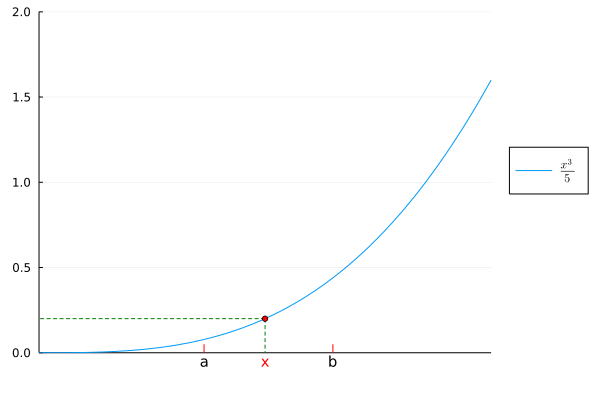

In [49]:
# graph of f

using Plots, LaTeXStrings, Plots.PlotMeasures
gr()

f(x) =  (x^3)/5
plot(f,0,2, xlims=(0,2), xticks = false, ylims=(0,2), bottom_margin = 10mm, label=L"\frac{x^{3}}{5}", legend=:outerright)

plot!([0.73,0.73],[0.05,0], label="", linecolor=:red)
plot!([1.3,1.3],[0.05,0], label="", linecolor=:red)

plot!([1,0],[f(1),f(1)], label="", linecolor=:green, linestyle=:dash)
plot!([1,1],[f(1),0], label="", linecolor=:green, linestyle=:dash)

scatter!([1.0], [f(1.0)], color = "red", label="", markersize = 3)

annotate!([(0.73,-0.05, ("a", 10, :black)),
           (1.0,-0.05, ("x", 10, :red)),
           (1.30,-0.05, ("b", 10, :black))])

### Bounded Functions:

Image $f(D) \subset \mathbb{R}$

$∃n$ such that $f(x) \le n, ∀x \in D$ (bounded from above)

$∃m$ such that $f(x) \ge m, ∀x \in D$ (bounded from below)

#### Example

$f: \mathbb{R} → \mathbb{R}$

$f(x) = x^{2} \quad ∀x \in \mathbb{R};f(x) \ge 0$

Bounded from below

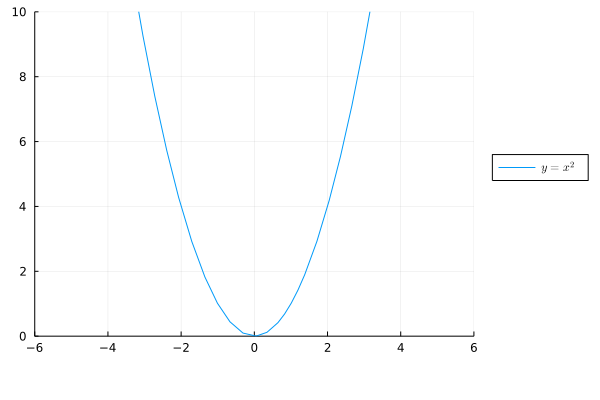

In [6]:
# graph above line y=0

using Plots, LaTeXStrings, Plots.PlotMeasures
gr()

f(x) =  x^2
plot(f,-10,10, xlims=(-6,6), ylims=(0,10), bottom_margin = 10mm, label=L"y = x^{2}", legend=:outerright)


#### Example

$f: \mathbb{R} → \mathbb{R} \quad f(x) = \frac{1}{1 + x^{2}}$

$∀x \in \mathbb{R}$

$0 < \frac{1}{1 + x^{2}} \le 1$

$\max f(x) = 1$

$\min f(x)$ does not exist

$inf \ f(x) = 0$

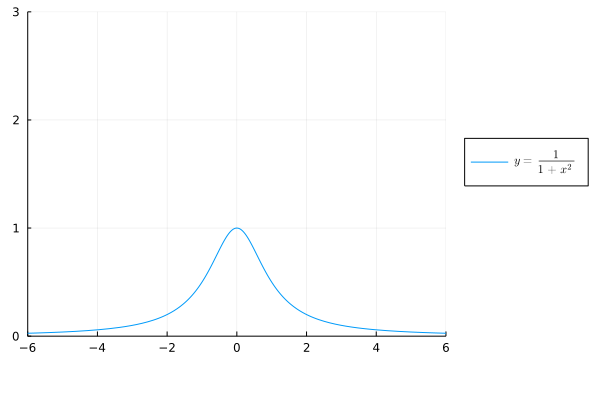

In [11]:
# graph above line y=0

using Plots, LaTeXStrings, Plots.PlotMeasures
gr()

f(x) =  1/(1+x^2)
plot(f,-10,10, xlims=(-6,6), ylims=(0,3), bottom_margin = 10mm, label=L"y =\frac{1}{1 + x^{2}}", legend=:outerright)


#### Example

$f(x) = x$ is unbounded

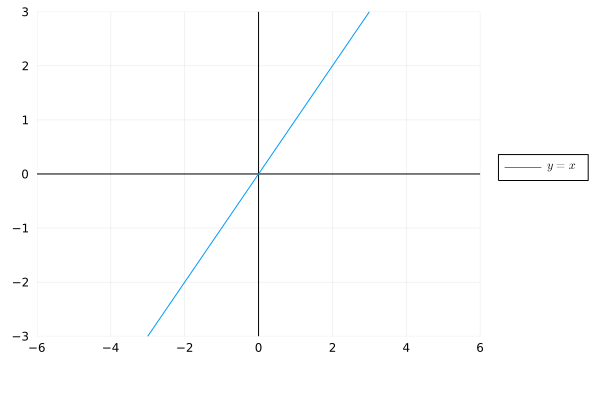

In [1]:
# unbounded graph

using Plots, LaTeXStrings, Plots.PlotMeasures
gr()

f(x) = x
plot(f,-10,10, xlims=(-6,6), ylims=(-3,3), bottom_margin = 10mm, label=L"y = x", framestyle = :zerolines, legend=:outerright)


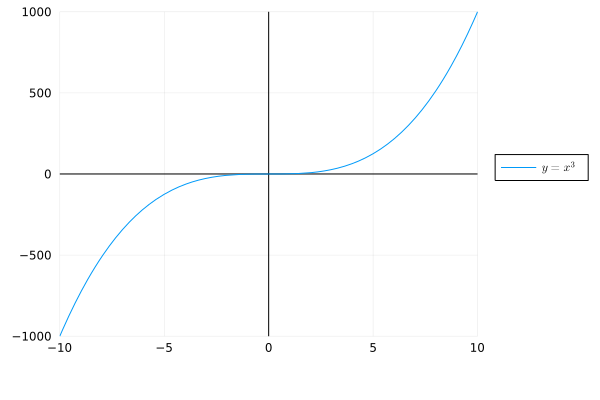

In [15]:
# unbounded graph

using Plots, LaTeXStrings, Plots.PlotMeasures
gr()

f(x) =  x^3
plot(f,-10,10, xlims=(-Inf,Inf), ylims=(-Inf,Inf), bottom_margin = 10mm, label=L"y = x^{3}", framestyle = :zerolines, legend=:outerright)


### Symmetries

$f$ is even if $f(x) = f(-x)$

#### Example:

$f(x) = x^{2}$

Graph of an even function is symmetric with respect to $y$-axis.

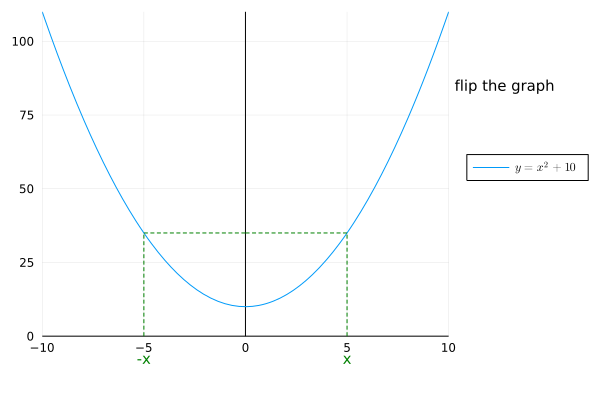

In [37]:
# symmetric graph

using Plots, LaTeXStrings, Plots.PlotMeasures
gr()

f(x) =  x^(2) + 10
plot(f,-10,10, xlims=(-Inf,Inf), ylims=(-Inf,Inf), bottom_margin = 10mm, label=L"y = x^{2} + 10", framestyle = :zerolines, legend=:outerright)

# horizontal green dash line
plot!([5,0],[f(5),f(5)], label="", linecolor=:green, linestyle=:dash)
plot!([-5,0],[f(-5),f(-5)], label="", linecolor=:green, linestyle=:dash)

# vertical green dash line
plot!([5,5],[0,f(5)], label="", linecolor=:green, linestyle=:dash)
plot!([-5,-5],[0,f(-5)], label="", linecolor=:green, linestyle=:dash)

annotate!([(12.73,85.05, ("flip the graph", 10, :black)),
           (-5,-7.55, ("-x", 10, :green)),
           (5,-7.55, ("x", 10, :green))])

$f$ is odd if $f(x) = -f(x)$

#### Example:

$f(x) = x$

$f(x) = x^{3}$

Graph of an odd function is symmetric with respect to the origin.

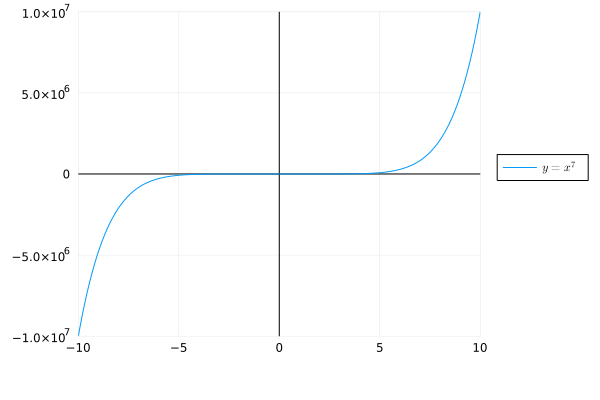

In [46]:
# unbounded graph

using Plots, LaTeXStrings, Plots.PlotMeasures
gr()

f(x) =  x^(7) 
plot(f,-10,10, xlims=(-Inf,Inf), ylims=(-Inf,Inf), bottom_margin = 10mm, label=L"y = x^{7}", framestyle = :zerolines, legend=:outerright)


### Monotone Functions

$f: D \subset \mathbb{R} → \mathbb{R}$

(i) $f$ is monotone increasing (respectively strictly increasing) 

if $∀x_{1},x_{2} \in D, \ x_{1} < x_{2}$ implies $f(x_{1}) \le f(x_{2})$ (respectively $f(x_{1}) < f(x_{2})$).

(ii) $f$ is monotone decreasing (respectively strictly decreasing)

if $∀x_{1},x_{2} \in D, \ x_{1} < x_{2}$ implies $f(x_{1}) \ge f(x_{2})$ (respectively $f(x_{1}) > f(x_{2})$).

#### Example

$f(x) = x^{2}$

* Strictly increasing for $x \ge 0$

* Strictly decreasing for $x \le 0$


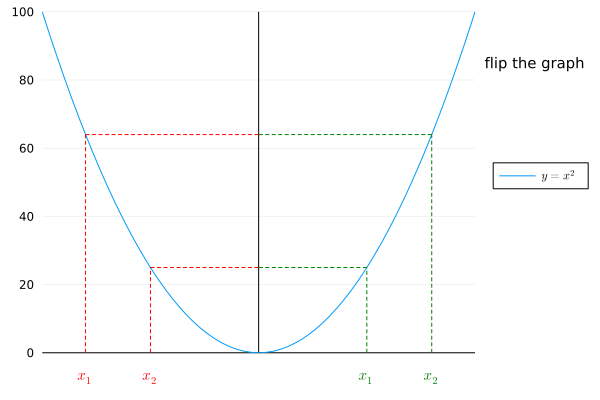

In [53]:
# example graph

using Plots, LaTeXStrings, Plots.PlotMeasures
gr()

f(x) =  x^(2)
plot(f,-10,10, xticks=false, xlims=(-Inf,Inf), ylims=(-Inf,Inf), 
    bottom_margin = 10mm, label=L"y = x^{2}", framestyle = :zerolines, 
    legend=:outerright)

# horizontal green dash line
plot!([5,0],[f(5),f(5)], label="", linecolor=:green, linestyle=:dash)
plot!([-5,0],[f(-5),f(-5)], label="", linecolor=:red, linestyle=:dash)
plot!([8,0],[f(8),f(8)], label="", linecolor=:green, linestyle=:dash)
plot!([-8,0],[f(-8),f(-8)], label="", linecolor=:red, linestyle=:dash)

# vertical green dash line
plot!([5,5],[0,f(5)], label="", linecolor=:green, linestyle=:dash)
plot!([-5,-5],[0,f(-5)], label="", linecolor=:red, linestyle=:dash)
plot!([8,8],[0,f(8)], label="", linecolor=:green, linestyle=:dash)
plot!([-8,-8],[0,f(-8)], label="", linecolor=:red, linestyle=:dash)

annotate!([(12.73,85.05, ("flip the graph", 10, :black)),
           (-8,-7.55, (L"x_{1}", 10, :red)),
           (8,-7.55, (L"x_{2}", 10, :green)),
           (-5,-7.55, (L"x_{2}", 10, :red)),
           (5,-7.55, (L"x_{1}", 10, :green))])

$f: D → \mathbb{R}$ is strictly monotone (increasing or decreasing), then $x_{1} \neq x_{2} → f(x_{1}) \neq f(x_{2}) → f$ is injective.

$f: D → f(D) \subset \mathbb{R}$ is invertible.

### Periodic Functions

$f: D → \mathbb{R}$ is periodic if there exists $T>0$ such that $f(x+T) = f(x) \ ∀x \in D$.

The smallest $T > 0$ having this property is called period.

Example:

$f(x) = sin(x)$

$f(x) = cos(x)$

### Composition and inverse

$f: E → \mathbb{R} \ ; \ g: f → \mathbb{R}, \ E,F \subset \mathbb{R}$

$g \xrightarrow{f} f(x) \xrightarrow{g}\mathbb{R} $

if $f(x) \in F$ then $g \xrightarrow{(g \circ f) (x)} \mathbb{R}$.

$(g \circ f) (x) = g(f(x))$

Composition: Defined if

$f(E) \subset F$

$f(E)$ is an image of $f$: $\{ f(x): x \in E \}$

If $f: I \rightarrow \mathbb{R}$ is injective.

$f: I \rightarrow f(I)$ one-to-one.

$∀y \in f(I)$, there exists exactly 1 $x \in I$ such that $f(x) = y \ (x = f^{-1}(y) $

$f^{-1}(y) = \{ x \in I \ : \ f(x) = y\}$ subset of $I$.

#### Counterimage of $y$

If $f$ is injective, $y \in f(I), f^{-1}(y) = \{x\}$ → define $x = f^{-1} (y)$ 

Inverse function

\begin{cases}
		 x \in I \\
		 f (x) = y
\end{cases}

equivalent to

\begin{cases}
		 x = f^{-1}(x)\\
		 y \in f(I)
\end{cases}

$I \overset{f}{\underset{f^{-1}}\rightleftarrows} f(I)$ 

$ f \circ f^{-1}$ is identity in $f(I)$

$f^{-1} \circ f$ is identity in $I$

In terms of graphs:

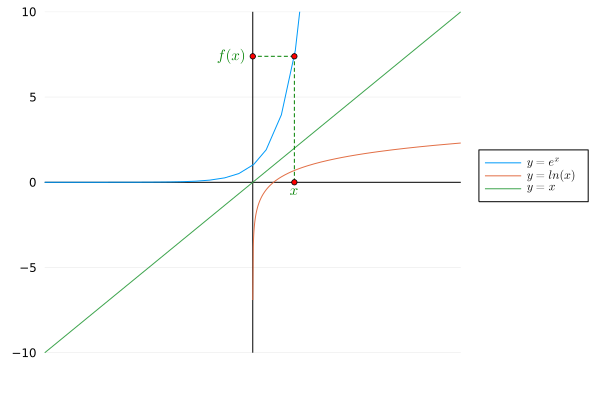

In [89]:
# example graph

using Plots, LaTeXStrings, Plots.PlotMeasures
gr()

f(x) =  exp(x)
g(x) =  log(x)
h(x) = x

plot(f,-10,10, xticks=false, xlims=(-10,10), ylims=(-10,10), 
    bottom_margin = 10mm, label=L"y = e^{x}", framestyle = :zerolines, 
    legend=:outerright)
plot!(g,-10,10, xticks=false, xlims=(-10,10), ylims=(-10,10), 
    bottom_margin = 10mm, label=L"y = ln(x)", 
    legend=:outerright)
plot!(h,-10,10, xticks=false, xlims=(-10,10), ylims=(-10,10), 
    bottom_margin = 10mm, label=L"y = x", 
    legend=:outerright)

# horizontal green dash line
plot!([2,0],[f(2),f(2)], label="", linecolor=:green, linestyle=:dash)

# vertical green dash line
plot!([2,2],[0,f(2)], label="", linecolor=:green, linestyle=:dash)

scatter!([0], [f(2)], color = "red", label="", markersize = 3)
scatter!([2], [f(2)], color = "red", label="", markersize = 3)
scatter!([2], [0], color = "red", label="", markersize = 3)

annotate!([(2,-0.55, (L"x", 10, :green)),
           (-1,f(2), (L"f(x)", 10, :green))])

## Real Analysis Course 7 (July 27th 2022)

# Elementary Functions

$f: I \subseteq \mathbb{R} → \mathbb{R} $

1) Identity $x \in \mathbb{R} → f(x) = x \in \mathbb{R}$

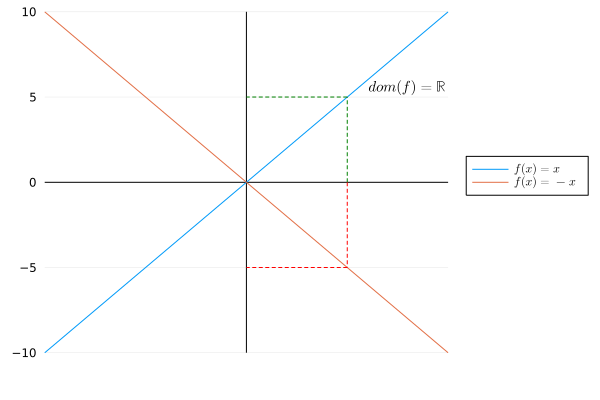

In [8]:
# example graph

using Plots, LaTeXStrings, Plots.PlotMeasures
gr()

f(x) =  x
g(x) = -x
plot(f,-10,10, xticks=false, xlims=(-Inf,Inf), ylims=(-Inf,Inf), 
    bottom_margin = 10mm, label=L"f(x) = x", framestyle = :zerolines, 
    legend=:outerright)
plot!(g,-10,10, xticks=false, xlims=(-Inf,Inf), ylims=(-Inf,Inf), 
    bottom_margin = 10mm, label=L"f(x) = -x", framestyle = :zerolines, 
    legend=:outerright)

# horizontal green dash line
plot!([5,0],[f(5),f(5)], label="", linecolor=:green, linestyle=:dash)
plot!([5,0],[g(5),g(5)], label="", linecolor=:red, linestyle=:dash)

# vertical green dash line
plot!([5,5],[0,f(5)], label="", linecolor=:green, linestyle=:dash)
plot!([5,5],[0,g(5)], label="", linecolor=:red, linestyle=:dash)

annotate!([(8,5.55, (L"dom(f)=\mathbb{R}", 10, :black))])

2) $f(x) = x^{\alpha}, \quad \alpha \in \mathbb{N}, \quad x \in \mathbb{R}$

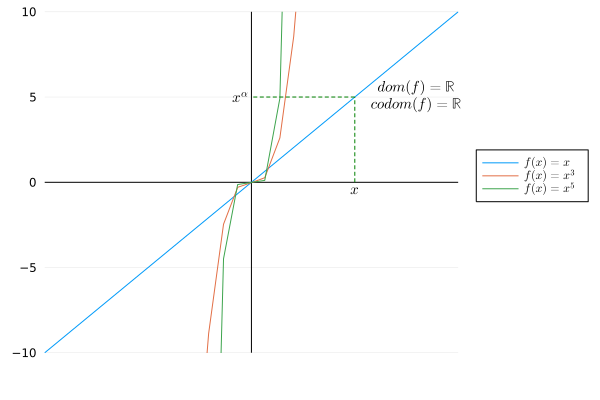

In [19]:
# example graph for odd alpha

using Plots, LaTeXStrings, Plots.PlotMeasures
gr()

f(x) = x
g(x) = x^(3)
h(x) = x^(5)

plot(f,-10,10, xticks=false, xlims=(-10,10), ylims=(-10,10), 
    bottom_margin = 10mm, label=L"f(x) = x", framestyle = :zerolines, 
    legend=:outerright)
plot!(g,-10,10, xticks=false, xlims=(-10,10), ylims=(-10,10), 
    bottom_margin = 10mm, label=L"f(x) = x^{3}", framestyle = :zerolines, 
    legend=:outerright)
plot!(h,-10,10, xticks=false, xlims=(-10,10), ylims=(-10,10), 
    bottom_margin = 10mm, label=L"f(x) = x^{5}", framestyle = :zerolines, 
    legend=:outerright)

# horizontal green dash line
plot!([5,0],[f(5),f(5)], label="", linecolor=:green, linestyle=:dash)

# vertical green dash line
plot!([5,5],[0,f(5)], label="", linecolor=:green, linestyle=:dash)

annotate!([(-0.5,f(5), (L"x^{\alpha}", 10, :black))])
annotate!([(5,-0.5, (L"x", 10, :black))])
annotate!([(8,5.55, (L"dom(f)=\mathbb{R}", 10, :black))])
annotate!([(8,4.55, (L"codom(f)=\mathbb{R}", 10, :black))])

Below is a graph for $f(x) = x^{\alpha}$ for $\alpha$ even, with $\mathbb{R_{+}} =\{x \in \mathbb{R} | x \ge 0\}$

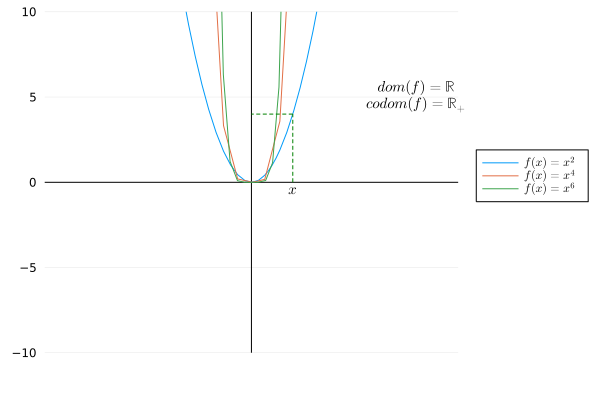

In [57]:
# example graph for even alpha

using Plots, LaTeXStrings, Plots.PlotMeasures
gr()

f(x) = x^(2)
g(x) = x^(4)
h(x) = x^(6)

plot(f,-10,10, xticks=false, xlims=(-10,10), ylims=(-10,10), 
    bottom_margin = 10mm, label=L"f(x) = x^{2}", framestyle = :zerolines, 
    legend=:outerright)
plot!(g,-10,10, xticks=false, xlims=(-10,10), ylims=(-10,10), 
    bottom_margin = 10mm, label=L"f(x) = x^{4}", framestyle = :zerolines, 
    legend=:outerright)
plot!(h,-5,5, xticks=false, xlims=(-10,10), ylims=(-10,10), 
    bottom_margin = 10mm, label=L"f(x) = x^{6}", framestyle = :zerolines, 
    legend=:outerright)

# horizontal green dash line
plot!([2,0],[f(2),f(2)], label="", linecolor=:green, linestyle=:dash)

# vertical green dash line
plot!([2,2],[0,f(2)], label="", linecolor=:green, linestyle=:dash)

annotate!([(-0.5,f(5), (L"x^{\alpha}", 10, :black))])
annotate!([(2,-0.5, (L"x", 10, :black))])
annotate!([(8,5.55, (L"dom(f)=\mathbb{R}", 10, :black))])
annotate!([(8,4.55, (L"codom(f)=\mathbb{R_{+}}", 10, :black))])

The graph below is for $f(x) = x^{2} + a, f(x) = -x^{2}, f(x) = -x^{3}$ with $a \in \mathbb{R}, a > 0$

$f(x) = -x^{2}$ is an even function given that $f(-x) = f(x)$

$f(x) = -x^{3}$ is an odd function given that $f(-x) = -f(x)$

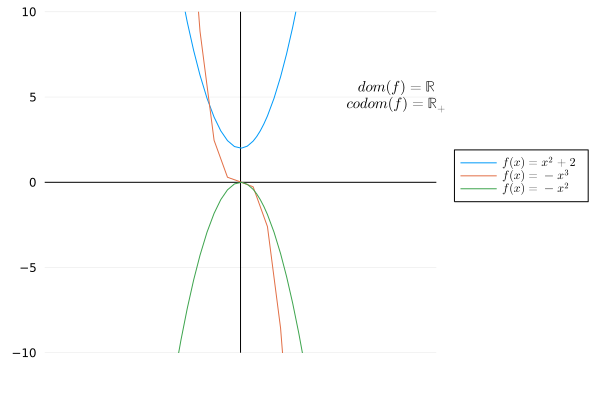

In [7]:
# example graph 

using Plots, LaTeXStrings, Plots.PlotMeasures
gr()

f(x) = x^(2) + 2
g(x) = -x^(3)
h(x) = -x^(2)

plot(f,-10,10, xticks=false, xlims=(-10,10), ylims=(-10,10), 
    bottom_margin = 10mm, label=L"f(x) = x^{2} + 2", framestyle = :zerolines, 
    legend=:outerright)
plot!(g,-10,10, xticks=false, xlims=(-10,10), ylims=(-10,10), 
    bottom_margin = 10mm, label=L"f(x) = -x^{3}", framestyle = :zerolines, 
    legend=:outerright)
plot!(h,-10,10, xticks=false, xlims=(-10,10), ylims=(-10,10), 
    bottom_margin = 10mm, label=L"f(x) = -x^{2}", framestyle = :zerolines, 
    legend=:outerright)

annotate!([(8,5.55, (L"dom(f)=\mathbb{R}", 10, :black))])
annotate!([(8,4.55, (L"codom(f)=\mathbb{R_{+}}", 10, :black))])

The graph below is $f(x) = (x + a)^{2}$.

It is a translation of a $x^{2}$ function to the left of the origin with the vertex center in $-a$ if $a < 0$.

For $a<0$, it is a translation of a $x^{2}$ function to the right of the origin with the vertex center in $a$.

#### Example

Consider $f(x) = (x - 6)^{2}$ and $f(x) = (x + 6)^{2}$, based on the origin function of $f(x) = (x + a)^{2}$, we know that $a = 6$, thus:

* $(x - 6)^{2}$ is a $f(x)=x^{2}$ function that is translated to the right with vertex center in $x=6$ and $a<0$

* $(x + 6)^{2}$ is a $f(x)=x^{2}$ function that is translated to the left with vertex center in $x=-6$  and $a>0$


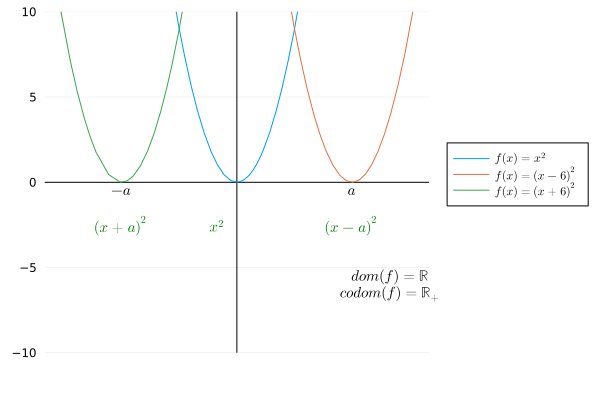

In [8]:
# example graph 

using Plots, LaTeXStrings, Plots.PlotMeasures
gr()

f(x) = x^(2) 
g(x) = (x-6)^(2)
h(x) = (x+6)^(2)

plot(f,-10,10, xticks=false, xlims=(-10,10), ylims=(-10,10), 
    bottom_margin = 10mm, label=L"f(x) = x^{2}", framestyle = :zerolines, 
    legend=:outerright)
plot!(g,-10,10, xticks=false, xlims=(-10,10), ylims=(-10,10), 
    bottom_margin = 10mm, label=L"f(x) = (x-6)^{2}", framestyle = :zerolines, 
    legend=:outerright)
plot!(h,-10,10, xticks=false, xlims=(-10,10), ylims=(-10,10), 
    bottom_margin = 10mm, label=L"f(x) = (x+6)^{2}", framestyle = :zerolines, 
    legend=:outerright)

annotate!([(-6,-0.55, (L"-a", 10, :black))])
annotate!([(6,-0.55, (L"a", 10, :black))])
annotate!([(-1,-2.55, (L"x^{2}", 10, :green))])
annotate!([(-6,-2.55, (L"(x+a)^{2}", 10, :green))])
annotate!([(6,-2.55, (L"(x-a)^{2}", 10, :green))])
annotate!([(8,-5.55, (L"dom(f)=\mathbb{R}", 10, :black))])
annotate!([(8,-6.55, (L"codom(f)=\mathbb{R_{+}}", 10, :black))])

3) Consider a function from before which is $f(x) = x^{\alpha}, \ \alpha \in \mathbb{Z_{-}}$

$∃ \beta \in \mathbb{N}$ such that $\alpha = - \beta$, thus $f(x) = \frac{1}{x^{\beta}}$

We are going to plot the graph for $f(x) = \frac{1}{x^{\beta}}$

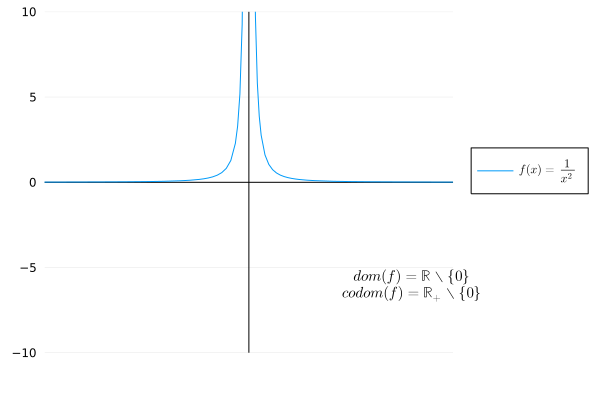

In [17]:
# example graph for Beta even

using Plots, LaTeXStrings, Plots.PlotMeasures
gr()

f(x) = 1/x^(2) 

plot(f,-50,50, xticks=false, xlims=(-10,10), ylims=(-10,10), 
    bottom_margin = 10mm, label=L"f(x) = \frac{1}{x^{2}}", framestyle = :zerolines, 
    legend=:outerright)

annotate!([(8,-5.55, (L"dom(f)=\mathbb{R} \setminus \{0\}", 10, :black))])
annotate!([(8,-6.55, (L"codom(f)=\mathbb{R_{+}} \setminus \{0\}", 10, :black))])

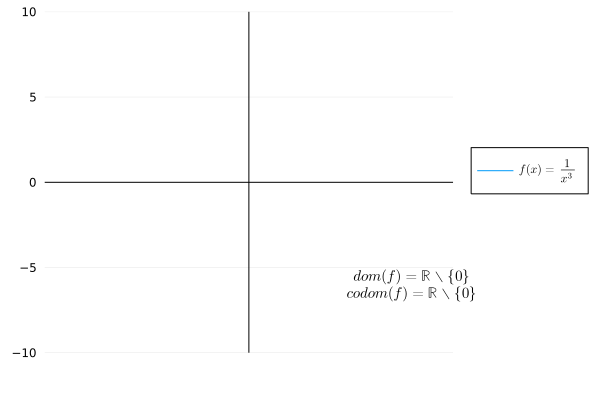

In [21]:
# example graph for Beta odd

using Plots, LaTeXStrings, Plots.PlotMeasures
gr()

f(x) = 1/x^(3) 

plot(f,-50,50, xticks=false, xlims=(-10,10), ylims=(-10,10), 
    bottom_margin = 10mm, label=L"f(x) = \frac{1}{x^{3}}", framestyle = :zerolines, 
    legend=:outerright)

annotate!([(8,-5.55, (L"dom(f)=\mathbb{R} \setminus \{0\}", 10, :black))])
annotate!([(8,-6.55, (L"codom(f)=\mathbb{R} \setminus \{0\}", 10, :black))])

#### Exercise

If $\beta_{1} > \beta_{2}$ is there any intersection between the graphs?

For any $x \in X, \ X \in dom(f(x))= \mathbb{R} \setminus \{0\}$ with $f(x) = \frac{1}{x^{\beta_{1}}}$

and $g(x) = \frac{1}{x^{\beta_{2}}}$

$∃ x \in X → f(x) = g(x)$ thus $codom(f(x)) \cap codom(g(x)) \neq ø$

\begin{equation}
f(x) = g(x) \\
\frac{1}{x^{\beta_{1}}} = \frac{1}{x^{\beta_{2}}}\\
x^{\beta_{2}} = x^{\beta_{1}}
\end{equation}

The equation above occurs when $x = 1$

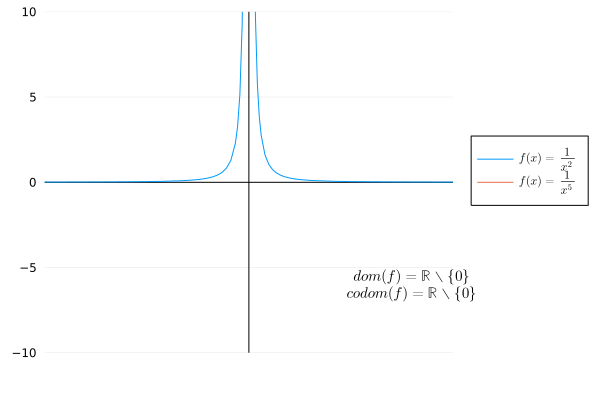

In [33]:
# example graph for Beta_1 > Beta_2

using Plots, LaTeXStrings, Plots.PlotMeasures
gr()

f(x) = 1/x^(2) 
g(x) = 1/x^(5) 

plot(f,-50,50, xticks=false, xlims=(-10,10), ylims=(-10,10), 
    bottom_margin = 10mm, label=L"f(x) = \frac{1}{x^{2}}", framestyle = :zerolines, 
    legend=:outerright)
plot!(g,-50,50, xticks=false, xlims=(-10,10), ylims=(-10,10), 
    bottom_margin = 10mm, label=L"f(x) = \frac{1}{x^{5}}", framestyle = :zerolines, 
    legend=:outerright)

annotate!([(8,-5.55, (L"dom(f)=\mathbb{R} \setminus \{0\}", 10, :black))])
annotate!([(8,-6.55, (L"codom(f)=\mathbb{R} \setminus \{0\}", 10, :black))])

4) $f(x) = x^{\alpha}, \ \alpha \in \mathbb{Q}$

Start with the case where $\alpha = \frac{1}{\beta}, \ \beta \in \mathbb{N}$ thus $f(x) = x^{1/\beta}$

The domain of $f(x)$ is the codomain of its inverse function $f^{-1}(x)$

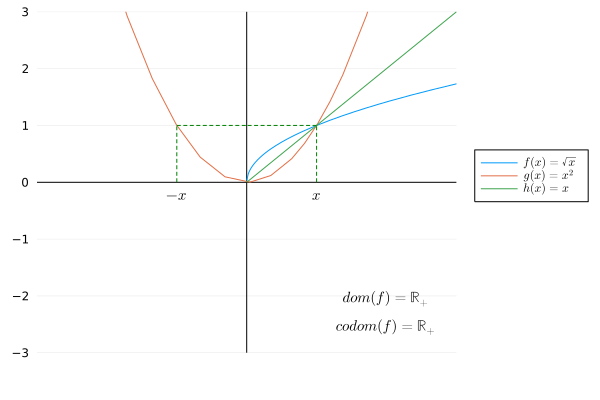

In [106]:
# example graph 

using Plots, LaTeXStrings, Plots.PlotMeasures
gr()

f(x) = x^(1/2) 
g(x) = x^(2) 
h(x) = x 

plot(f,-10,10, xticks=false, xlims=(-3,3), ylims=(-3,3), 
    bottom_margin = 10mm, label=L"f(x) = \sqrt{x}", framestyle = :zerolines, 
    legend=:outerright)
plot!(g,-10,10, xticks=false, xlims=(-3,3), ylims=(-3,3), 
    bottom_margin = 10mm, label=L"g(x) = x^{2}", framestyle = :zerolines, 
    legend=:outerright)
plot!(h,0,50, xticks=false, xlims=(-3,3), ylims=(-3,3), 
    bottom_margin = 10mm, label=L"h(x) = x", framestyle = :zerolines, 
    legend=:outerright)

# horizontal green dash line
plot!([1,0],[f(1),f(1)], label="", linecolor=:green, linestyle=:dash)
plot!([-1,0],[f(1),f(1)], label="", linecolor=:green, linestyle=:dash)

# vertical green dash line
plot!([1,1],[0,f(1)], label="", linecolor=:green, linestyle=:dash)
plot!([-1,-1],[0,f(1)], label="", linecolor=:green, linestyle=:dash)

annotate!([(1,-0.25, (L"x", 10, :black))])
annotate!([(-1,-0.25, (L"-x", 10, :black))])
annotate!([(2,-2.05, (L"dom(f)=\mathbb{R_{+}}", 10, :black))])
annotate!([(2,-2.55, (L"codom(f)=\mathbb{R_{+}}", 10, :black))])

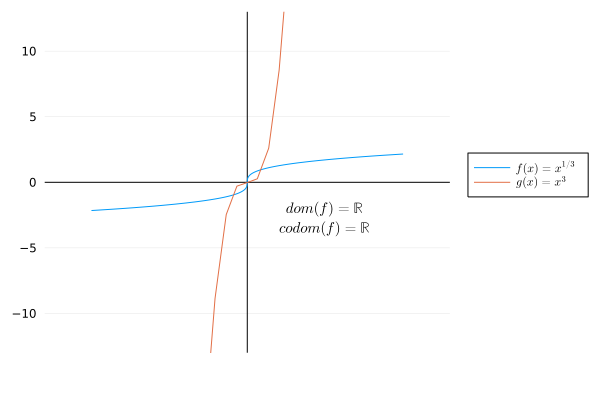

In [106]:
# example graph for odd Beta

using Plots, LaTeXStrings, Plots.PlotMeasures
gr()

f(x) = cbrt(x) 
g(x) = x^(3) 

plot(f,-10,10, xticks=false, xlims=(-13,13), ylims=(-13,13), 
    bottom_margin = 10mm, label=L"f(x) =  x^{1/3}", framestyle = :zerolines, 
    legend=:outerright)
plot!(g,-10,10, xticks=false, xlims=(-13,13), ylims=(-13,13), 
    bottom_margin = 10mm, label=L"g(x) = x^{3}", framestyle = :zerolines, 
    legend=:outerright)


annotate!([(5,-2.05, (L"dom(f)=\mathbb{R}", 10, :black))])
annotate!([(5,-3.55, (L"codom(f)=\mathbb{R}", 10, :black))])

5) Exponential: $a > 0 \quad f(x) = a^{x}, x \in \mathbb{R}$

$a = e = 2.71828182 $ (nepero numbers)

$e$ is an irrational number (it cannot be written as a simple fraction).

\begin{equation}
a^{x}a^{y} = a^{x+y}\\
a^{0} = 1\\
\end{equation}

\begin{equation}
a^{x-y} = \frac{a^{x}}{a^{y}}\\
\end{equation}

$a^{x} > 0, a^{1} = a$

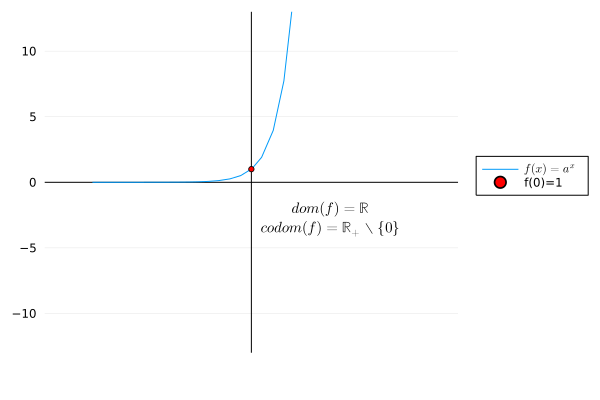

In [81]:
# example graph

using Plots, LaTeXStrings, Plots.PlotMeasures
gr()

f(x) = exp(x)  

plot(f,-10,10, xticks=false, xlims=(-13,13), ylims=(-13,13), 
    bottom_margin = 10mm, label=L"f(x) =  a^{x}", framestyle = :zerolines, 
    legend=:outerright)

scatter!([0], [f(0)], color = "red", label="f(0)=1", markersize = 3)

annotate!([(5,-2.05, (L"dom(f)=\mathbb{R}", 10, :black))])
annotate!([(5,-3.55, (L"codom(f)=\mathbb{R_{+}} \setminus \{0\}", 10, :black))])

6) Logarithm: $a > 0, \quad a^{x} = y, \quad y > 0, \quad x = \log_{a} {y}$

$f(x) = \log_{a} {x}$

$a = 10 \quad \log{x}$

$a = e \quad \ln{x} [\log(x)]$

6.1) $\log_{a} {xy} = \log_{a} (x) + \log_{a} (y)$

6.2) $\log_{a} ({\frac{x}{y}}) = \log_{a} (x) - \log_{a} (y)$

6.3) $\log_{a} ({x^{\alpha}}) = \alpha \log_{a} (x) \quad \alpha \in \mathbb{R}$

6.4) if $x \neq 1, a \neq 1 \quad \log_{a} {x} = \frac{1}{\log_{a} (x)} = - \log_{\frac{1}{a}} (x)$

6.5) $\log_{a} {1} = 0 \quad ∀a > 0$


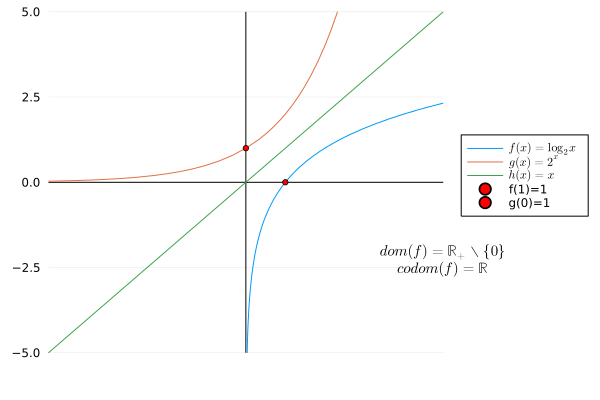

In [105]:
# example graph of log function with the base of 2

using Plots, LaTeXStrings, Plots.PlotMeasures
gr()

f(x) = log2(x)  
g(x) = 2^(x)
h(x) = x

plot(f,-10,10, xticks=false, xlims=(-5,5), ylims=(-5,5), 
    bottom_margin = 10mm, label=L"f(x) =  \log_{2} {x}", framestyle = :zerolines, 
    legend=:outerright)
plot!(g,-5,5, xticks=false, xlims=(-5,5), ylims=(-5,5), 
    bottom_margin = 10mm, label=L"g(x) =  2^{x}", framestyle = :zerolines, 
    legend=:outerright)
plot!(h,-10,10, xticks=false, xlims=(-5,5), ylims=(-5,5), 
    bottom_margin = 10mm, label=L"h(x) =  x", framestyle = :zerolines, 
    legend=:outerright)

scatter!([1], [f(1)], color = "red", label="f(1)=1", markersize = 3)
scatter!([0], [g(0)], color = "red", label="g(0)=1", markersize = 3)

annotate!([(5,-2.05, (L"dom(f)=\mathbb{R_{+}} \setminus \{0\}", 10, :black))])
annotate!([(5,-2.55, (L"codom(f)=\mathbb{R}", 10, :black))])

7) Trigonometric Functions

$\sin(\alpha)$ and $\cos(\alpha)$ are periodic.

Functions of period $2 \pi \ f(\alpha) = f(\alpha + 2 \pi)$



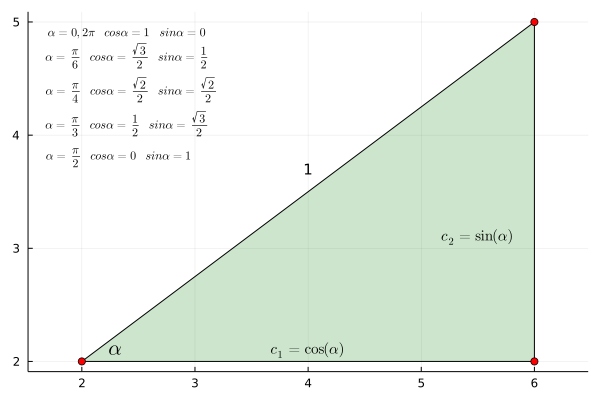

In [143]:
using Plots, LaTeXStrings
gr()
import Base: isequal, ==


abstract type GeoObject end
abstract type GeoShape <: GeoObject end

struct Point <: GeoObject
    x::Number
    y::Number
end
(==)(p1::Point, p2::Point) = p1.x==p2.x && p1.y==p2.y

struct Triangle <: GeoShape
    A::Point
    B::Point
    C::Point
end
Triangle(ax, ay, bx, by, cx, cy) = Triangle(Point(ax, ay), Point(bx, by), Point(cx, cy))
(==)(t1::Triangle, t2::Triangle) = vertices(t1) == vertices(t2)

function vertices(tri::Triangle) 
    [tri.A, tri.B, tri.C]
end

struct Edge <: GeoShape
    src::Point
    dst::Point
end

function edges(tri::Triangle)
    elist = Edge[]
    pts = vertices(tri)
    for i in 1:length(pts)-1
        push!(elist, Edge(pts[i], pts[i+1]))
    end
    push!(elist, Edge(pts[length(pts)], pts[1]))
    elist
end

struct Circle
    center::Point
    radius::Number
end
(==)(c1::Circle, c2::Circle) = c1.center == c2.center && c1.radius == c2.radius

ccenter(c::Circle) = c.center

A = Point(2,2); B = Point(6, 2); C = Point(6,5);
tri = Triangle(A, B, C)

function shape(ptlist::Vector{Point})
    xlist = [pt.x for pt in ptlist]
    ylist = [pt.y for pt in ptlist]
    shape = Shape(xlist, ylist)
end;
shape(tri::Triangle) = shape(vertices(tri));

trishape=shape(tri)
    
s1 = L"\alpha";
s2 = L"\alpha=0,2 \pi \quad cos{\alpha} = 1 \quad sin{\alpha} = 0";
s3 = L"\alpha=\frac{\pi}{6} \quad cos{\alpha} = \frac{\sqrt{3}}{2} \quad sin{\alpha} = \frac{1}{2}";
s4 = L"\alpha=\frac{\pi}{4} \quad cos{\alpha} = \frac{\sqrt{2}}{2} \quad sin{\alpha} = \frac{\sqrt{2}}{2}";
s5 = L"\alpha=\frac{\pi}{3} \quad cos{\alpha} = \frac{1}{2} \quad sin{\alpha} = \frac{\sqrt{3}}{2}";
s6 = L"\alpha=\frac{\pi}{2} \quad cos{\alpha} = 0 \quad sin{\alpha} = 1";

plot(trishape, leg=false, fill=(0, :green), aspect_ratio=:equal, fillalpha= 0.2)
scatter!(trishape.x, trishape.y, color=:red)
annotate!([(2.3, 2.1, (s1, 14, :black)), 
            (4, 2.1, (L"c_{1} = \cos(\alpha)", 10, :black)), 
            (5.5, 3.1, (L"c_{2} = \sin(\alpha)", 10, :black)),
            (4, 3.7, ("1", 10, :black)),
            (2.4, 4.9, (s2, 8, :black)), 
            (2.4, 4.7, (s3, 8, :black)),
            (2.44, 4.4, (s4, 8, :black)),
            (2.4, 4.1, (s5, 8, :black)), 
            (2.33, 3.8, (s6, 8, :black))])

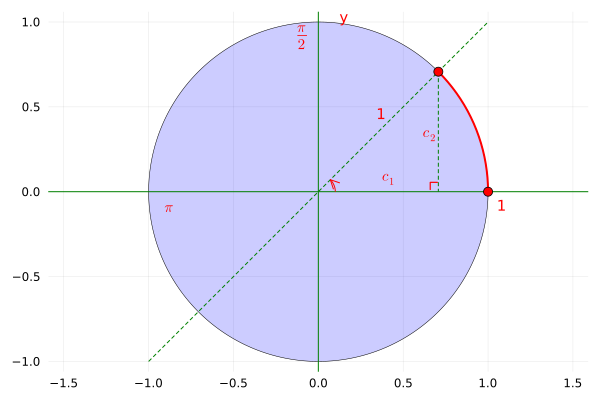

In [140]:
using Plots, LaTeXStrings
gr()

function circleShape(h, k, r)
     θ = LinRange(0, 2*π, 500)
     h .+ r*sin.(θ), k .+ r*cos.(θ)
end

plot(circleShape(0, 0, 1), seriestype = [:shape,], lw = 0.5,
      c =:blue, linecolor = :black,
      legend = false, fillalpha = 0.2, aspect_ratio = 1, showaxis = false)

t = L"45^0"
f(x) = x
a = L"$\ulcorner$"

plot!([0], seriestype="vline", color=:green, label="")
plot!([0], seriestype="hline", color=:green, label="")
plot!([0.707106781,0.707106781],[0.707106781,0], linecolor=:green, linestyle=:dash)
plot!(f, linecolor=:green, linestyle=:dash)
plot!(Plots.partialcircle(0,1//4*pi,100,0.1), color=:red, arrow=true)
plot!(Plots.partialcircle(0,1//4*pi), color=:red, linewidth=2)
     
annotate!([(0.69,-0.01, (a, 20, :red)),
           (0.17,005, (t, 8, :red)),
           (0.15,1.03, ("y", 10, :red)),
           (-0.88,-0.1, (L"\pi", 10, :red)),
           (0.42,0.073, (L"c_{1}", 10, :red)),
           (0.66,0.33, (L"c_{2}", 10, :red)),
           (0.37,0.46, ("1", 10, :red)),
           (1.08,-0.08, ("1", 10, :red)),
           (-0.1,0.91, (L"\frac{\pi}{2}", 10, :red))])

scatter!([1], [0], color = "red", label="", markersize = 5)
scatter!([0.707106781], [0.707106781], color = "red", label="", markersize = 5)

Function of period $2 \pi$ means:

$f(\alpha) = f(\alpha + 2 \pi)$

$\sin (x) = \cos (x - \frac{\pi}{2})$

$\cos (0) = \sin (\frac{\pi}{2})$

$\sin (x) \ge 0, \quad x \in [0, \pi] \quad [x \in [2k \pi, (2k + 1) \pi] \quad ∀k \in \mathbb{Z} ]$

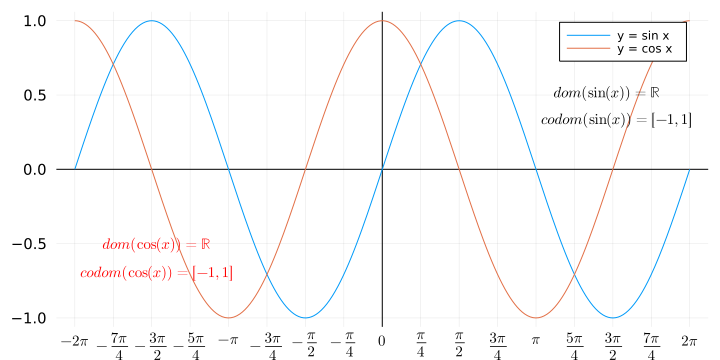

In [174]:
using Plots, LaTeXStrings
gr()

function pitick(start, stop, denom; mode=:text)
    a = Int(cld(start, π/denom))
    b = Int(fld(stop, π/denom))
    tick = range(a*π/denom, b*π/denom; step=π/denom)
    ticklabel = piticklabel.((a:b) .// denom, Val(mode))
    tick, ticklabel
end

function piticklabel(x::Rational, ::Val{:text})
    iszero(x) && return "0"
    S = x < 0 ? "-" : ""
    n, d = abs(numerator(x)), denominator(x)
    N = n == 1 ? "" : repr(n)
    d == 1 && return S * N * "π"
    S * N * "π/" * repr(d)
end

function piticklabel(x::Rational, ::Val{:latex})
    iszero(x) && return L"0"
    S = x < 0 ? "-" : ""
    n, d = abs(numerator(x)), denominator(x)
    N = n == 1 ? "" : repr(n)
    d == 1 && return L"%$S%$N\pi"
    L"%$S\frac{%$N\pi}{%$d}"
end

a, b = -2π, 2π

plot(sin, a, b; xtick=pitick(a, b, 4; mode=:latex), label="y = sin x", size=(720, 360), framestyle = :zerolines, tickfontsize=10)
plot!(cos, a, b; xtick=pitick(a, b, 4; mode=:latex), label="y = cos x", size=(720, 360), framestyle = :zerolines, tickfontsize=10)

annotate!([(-4.6,-0.51, (L"dom(\cos(x)) = \mathbb{R}", 10, :red)),
           (-4.6,-0.7, (L"codom(\cos(x)) = [-1,1]", 10, :red)),
           (4.6,0.51, (L"dom(\sin(x)) = \mathbb{R}", 10, :black)),
           (4.8,0.33, (L"codom(\sin(x)) = [-1,1]", 10, :black))])

7.1) $\sin (-x) = - \sin (x)$
$\cos (-x) = \cos (x)$

7.2) Addition formulas:

* $\cos (x - \frac{\pi}{2}) = \cos (x) \cos(\frac{\pi}{2}) + \sin (x) \sin(\frac{\pi}{2}) $

* $\cos (x \pm y) = \cos (x) \cos(y) \mp \sin (x) \sin(y) $

* $\sin (x \pm y) = \sin (x) \cos(y) \pm \sin (y) \cos(x) $

7.3) Fundamental theorem of circular function

$\cos^{2} (x) + \sin^{2} (x) = 1$


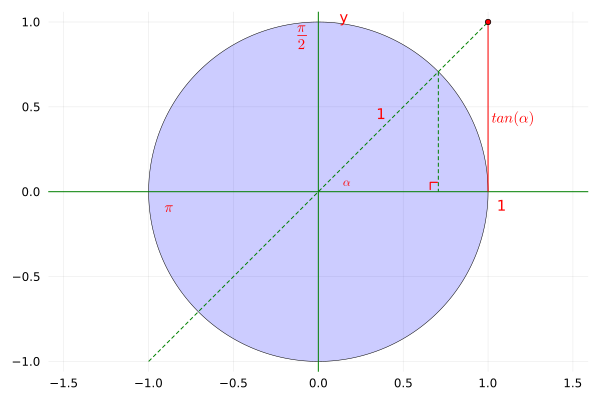

In [190]:
using Plots, LaTeXStrings
gr()

function circleShape(h, k, r)
     θ = LinRange(0, 2*π, 500)
     h .+ r*sin.(θ), k .+ r*cos.(θ)
end

plot(circleShape(0, 0, 1), seriestype = [:shape,], lw = 0.5,
      c =:blue, linecolor = :black,
      legend = false, fillalpha = 0.2, aspect_ratio = 1, showaxis = false)

t = L"\alpha"
f(x) = x
a = L"$\ulcorner$"

plot!([0], seriestype="vline", color=:green, label="")
plot!([0], seriestype="hline", color=:green, label="")
plot!([0.707106781,0.707106781],[0.707106781,0], linecolor=:green, linestyle=:dash)
plot!([1,1],[0,f(1)], linecolor=:red)
plot!(f, linecolor=:green, linestyle=:dash)

annotate!([(0.69,-0.01, (a, 20, :red)),
           (0.17,0.05, (t, 8, :red)),
           (1.15,0.43, (L"tan(\alpha)", 10, :red)),
           (0.15,1.03, ("y", 10, :red)),
           (-0.88,-0.1, (L"\pi", 10, :red)),
           (0.37,0.46, ("1", 10, :red)),
           (1.08,-0.08, ("1", 10, :red)),
           (-0.1,0.91, (L"\frac{\pi}{2}", 10, :red))])

scatter!([1], [f(1)], color = "red", label="", markersize = 3)

From the circle above,

$tan(\alpha) = \frac{\sin(\alpha)}{\cos(\alpha)}$

$\alpha = \frac{\pi}{2} + k \pi \quad k \in \mathbb{Z}$

$dom(\tan(x)) = \{x \in \mathbb{R} | x \neq \frac{\pi}{2} + k \pi \quad k \in \mathbb{Z}\}$

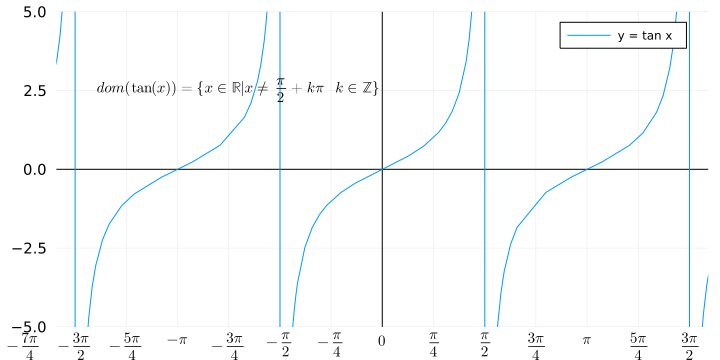

In [233]:
using Plots, LaTeXStrings
gr()

function pitick(start, stop, denom; mode=:text)
    a = Int(cld(start, π/denom))
    b = Int(fld(stop, π/denom))
    tick = range(a*π/denom, b*π/denom; step=π/denom)
    ticklabel = piticklabel.((a:b) .// denom, Val(mode))
    tick, ticklabel
end

function piticklabel(x::Rational, ::Val{:text})
    iszero(x) && return "0"
    S = x < 0 ? "-" : ""
    n, d = abs(numerator(x)), denominator(x)
    N = n == 1 ? "" : repr(n)
    d == 1 && return S * N * "π"
    S * N * "π/" * repr(d)
end

function piticklabel(x::Rational, ::Val{:latex})
    iszero(x) && return L"0"
    S = x < 0 ? "-" : ""
    n, d = abs(numerator(x)), denominator(x)
    N = n == 1 ? "" : repr(n)
    d == 1 && return L"%$S%$N\pi"
    L"%$S\frac{%$N\pi}{%$d}"
end

a, b = -2π, 2π

plot(tan, a, b; xtick=pitick(a, b, 4; mode=:latex), xlims=(-5,5), ylims=(-5,5),
    label="y = tan x", size=(720, 360), framestyle = :zerolines, tickfontsize=10)

annotate!([(-2.2,2.51, (L"dom(\tan(x)) = \{x \in \mathbb{R} | x \neq \frac{\pi}{2} + k \pi \quad k \in \mathbb{Z}\}", 10, :black))])

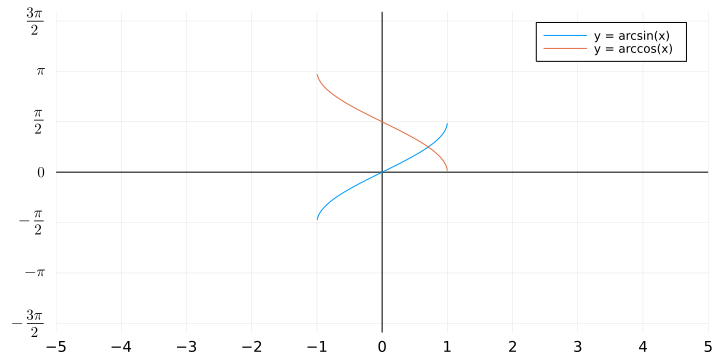

In [240]:
using Plots, LaTeXStrings
gr()

function pitick(start, stop, denom; mode=:text)
    a = Int(cld(start, π/denom))
    b = Int(fld(stop, π/denom))
    tick = range(a*π/denom, b*π/denom; step=π/denom)
    ticklabel = piticklabel.((a:b) .// denom, Val(mode))
    tick, ticklabel
end

function piticklabel(x::Rational, ::Val{:text})
    iszero(x) && return "0"
    S = x < 0 ? "-" : ""
    n, d = abs(numerator(x)), denominator(x)
    N = n == 1 ? "" : repr(n)
    d == 1 && return S * N * "π"
    S * N * "π/" * repr(d)
end

function piticklabel(x::Rational, ::Val{:latex})
    iszero(x) && return L"0"
    S = x < 0 ? "-" : ""
    n, d = abs(numerator(x)), denominator(x)
    N = n == 1 ? "" : repr(n)
    d == 1 && return L"%$S%$N\pi"
    L"%$S\frac{%$N\pi}{%$d}"
end

a, b = -2π, 2π

plot(asin, a, b; xticks = -5:1:5, ytick=pitick(a, b, 2; mode=:latex), xlims=(-5,5), ylims=(-5,5),
    label="y = arcsin(x)", size=(720, 360), framestyle = :zerolines, tickfontsize=10)
plot!(acos, a, b; xticks = -5:1:5, ytick=pitick(a, b, 2; mode=:latex), xlims=(-5,5), ylims=(-5,5),
    label="y = arccos(x)", size=(720, 360), framestyle = :zerolines, tickfontsize=10)

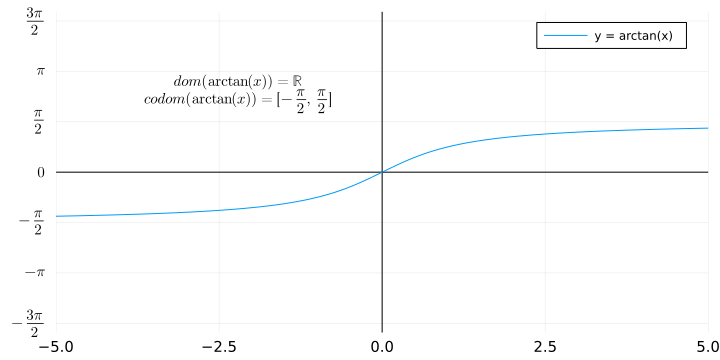

In [232]:
using Plots, LaTeXStrings
gr()

function pitick(start, stop, denom; mode=:text)
    a = Int(cld(start, π/denom))
    b = Int(fld(stop, π/denom))
    tick = range(a*π/denom, b*π/denom; step=π/denom)
    ticklabel = piticklabel.((a:b) .// denom, Val(mode))
    tick, ticklabel
end

function piticklabel(x::Rational, ::Val{:text})
    iszero(x) && return "0"
    S = x < 0 ? "-" : ""
    n, d = abs(numerator(x)), denominator(x)
    N = n == 1 ? "" : repr(n)
    d == 1 && return S * N * "π"
    S * N * "π/" * repr(d)
end

function piticklabel(x::Rational, ::Val{:latex})
    iszero(x) && return L"0"
    S = x < 0 ? "-" : ""
    n, d = abs(numerator(x)), denominator(x)
    N = n == 1 ? "" : repr(n)
    d == 1 && return L"%$S%$N\pi"
    L"%$S\frac{%$N\pi}{%$d}"
end

a, b = -2π, 2π

plot(atan, a, b; ytick=pitick(a, b, 2; mode=:latex), xlims=(-5,5), ylims=(-5,5),
    label="y = arctan(x)", size=(720, 360), framestyle = :zerolines, tickfontsize=10)

annotate!([(-2.2,2.81, (L"dom(\arctan(x)) = \mathbb{R}", 10, :black)),
           (-2.2,2.21, (L"codom(\arctan(x)) = [-\frac{\pi}{2}, \frac{\pi}{2}]", 10, :black))])

## Real Analysis Course 9 (July 28th 2022)

### Absolute Value (Modulus)

\begin{equation}
f(x) = |x| =
\begin{cases}
x, \quad \text{if} \ x \ge 0 \\
-x, \quad \text{if} \ x < 0 \\
\end{cases}
\end{equation}

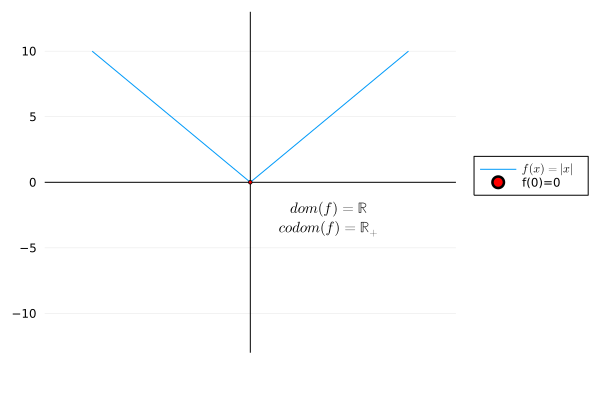

In [4]:
# example graph

using Plots, LaTeXStrings, Plots.PlotMeasures
gr()

f(x) = abs(x)  

plot(f,-10,10, xticks=false, xlims=(-13,13), ylims=(-13,13), 
    bottom_margin = 10mm, label=L"f(x) =  |x|", framestyle = :zerolines, 
    legend=:outerright)

scatter!([0], [f(0)], color = "red", label="f(0)=0", markersize = 2)

annotate!([(5,-2.05, (L"dom(f)=\mathbb{R}", 10, :black))])
annotate!([(5,-3.55, (L"codom(f)=\mathbb{R_{+}}", 10, :black))])

For $f: I \subseteq \mathbb{R} → \mathbb{R}$

\begin{equation}
|f(x)| =
\begin{cases}
f(x), \quad \text{if} \ f(x) \ge 0 \\
-f(x), \quad \text{if} \ f(x) < 0 \\
\end{cases}
\end{equation}

\begin{equation}
f(|x|) =
\begin{cases}
f(x), \quad \text{if} \ x \ge 0 \\
f(-x), \quad \text{if} \ x < 0 \\
\end{cases}
\end{equation}

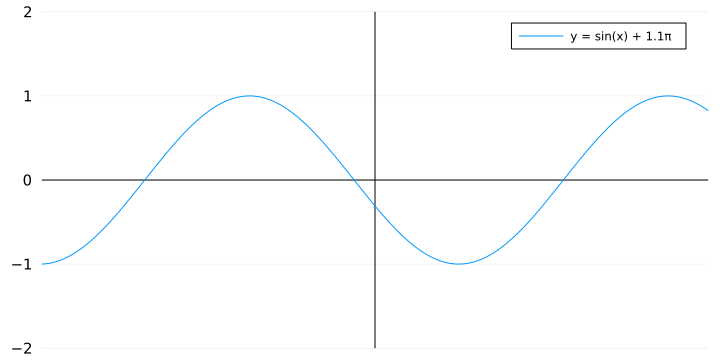

In [11]:
using Plots, LaTeXStrings
gr()

f(x) = sin(x+1.1π)
a, b = -2π, 2π

plot(f, a, b; xtick=false, xlims=(-5,5), ylims=(-2,2),
    label="y = sin(x) + 1.1π", size=(720, 360), framestyle = :zerolines, tickfontsize=10)

### Inequalities

General examples:

$f(x) < 0 \quad f(x) \ge 0 \quad f(x) \le g(x)$

#### Example

1) $x - 3 < 0 \quad x < 3$

The solution set is: 

$\{x \in \mathbb{R} \ | \ x < 3\} $

$ (- \infty,3)$

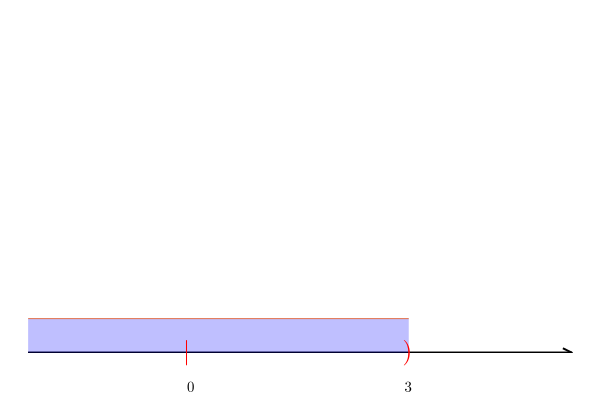

In [67]:
using Plots, LaTeXStrings, Plots.PlotMeasures

f(x) = 0.1
plot([0.5,1],[0,0],arrow=true,color=:black,linewidth=2, xticks=false, yticks=false,
     ylims=(0,1), showaxis=false, label="", bottom_margin = 10mm)
plot!(f,0.5,0.85, fill=(0, 0.25, :blue), label="")

annotate!([(0.65,0, (L"|", 17, :red))])
annotate!([(0.85,0, (L")", 17, :red))])
annotate!([(0.65,-0.1, (L"0", 10, :black))])
annotate!([(0.85,-0.1, (L"3", 10, :black))])

#### Example

2) 
\begin{equation}
\frac{1 - x}{1 + x} \le 0 \quad x \neq -1 
\end{equation}

These conditions below have to be fulfilled:
\begin{equation}
1 - x \le 0 \\
x \ge 1
\end{equation}

\begin{equation}
1 + x < 0 \\
x < -1 
\end{equation}
(we avoid the denominator of zero)

The solution set is: 

$ x < -1 \ ∨ \ x \ge 1$

$\{x \in \mathbb{R} \ | \ x < -1\} \cup \{x \in \mathbb{R} \ | \ x > 1 \}$

$(- \infty, -1) \cup [1, \infty)$

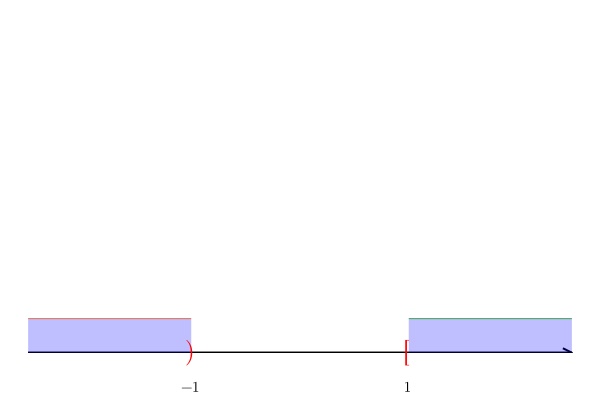

In [69]:
using Plots, LaTeXStrings, Plots.PlotMeasures

f(x) = 0.1
plot([0.5,1],[0,0],arrow=true,color=:black,linewidth=2, xticks=false, yticks=false,
     ylims=(0,1), showaxis=false, label="", bottom_margin = 10mm)
plot!(f,0.5,0.65, fill=(0, 0.25, :blue), label="")
plot!(f,0.85,1, fill=(0, 0.25, :blue), label="")

annotate!([(0.65,0, (L")", 17, :red))])
annotate!([(0.85,0, (L"[", 17, :red))])
annotate!([(0.65,-0.1, (L"-1", 10, :black))])
annotate!([(0.85,-0.1, (L"1", 10, :black))])

#### Example

3) 

\begin{equation}
\frac{3x - 1}{2 - 5x} < 0, \quad 2 - 5x \neq 0 \ → \ x \neq \frac{2}{5} \\
3x - 1 < 0 \\
x < \frac{1}{3}
\end{equation}

\begin{equation}
2 - 5x < 0 \\
x > \frac{2}{5}
\end{equation}

The solution set is: $ x < \frac{1}{3} ∨ x > \frac{2}{5}$

$\{x \in \mathbb{R} \ | \ x < \frac{1}{3}\} \cup \{x \in \mathbb{R} \ | \ x > \frac{2}{5} \}$

$(-\infty,\frac{1}{3}) \cup (\frac{2}{5}, + \infty)$

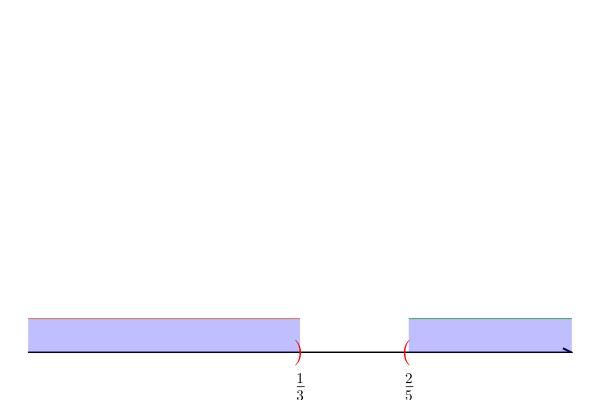

In [104]:
using Plots, LaTeXStrings, Plots.PlotMeasures

f(x) = 0.1
plot([0.5,1],[0,0],arrow=true,color=:black,linewidth=2, xticks=false, yticks=false,
     ylims=(0,1), showaxis=false, label="", bottom_margin = 10mm)
plot!(f,0.5,0.75, fill=(0, 0.25, :blue), label="")
plot!(f,0.85,1, fill=(0, 0.25, :blue), label="")

annotate!([(0.75,0, (L")", 17, :red))])
annotate!([(0.85,0, (L"(", 17, :red))])
annotate!([(0.75,-0.1, (L"\frac{1}{3}", 10, :black))])
annotate!([(0.85,-0.1, (L"\frac{2}{5}", 10, :black))])

#### Example

4) 

$f(x) = |x - 1 |$
\begin{equation}
|x - 1 | < 2 \\
f(x) = | x - 1 | =
\begin{cases}
x - 1 \quad \text{if} \quad x - 1 \ge 0 \\
1 - x \quad \text{if} \quad x - 1 < 0 
\end{cases}
\end{equation}

For $x - 1 \ge 0$, then $x \ge 1$ then we will have
\begin{equation}
x - 1 < 2 \\
x < 3
\end{equation}

For $x - 1 < 0$, then $x < 1$ then we will have
\begin{equation}
1 - x < 2 \\
x > -1
\end{equation}

Thus,

\begin{equation}
-2 < x - 1 < 2 \\
-1 < x < 3 
\end{equation}

The solution set is:

$\{x \in \mathbb{R} \ | \ -1 < x < 3 \}$

$(-1,3)$

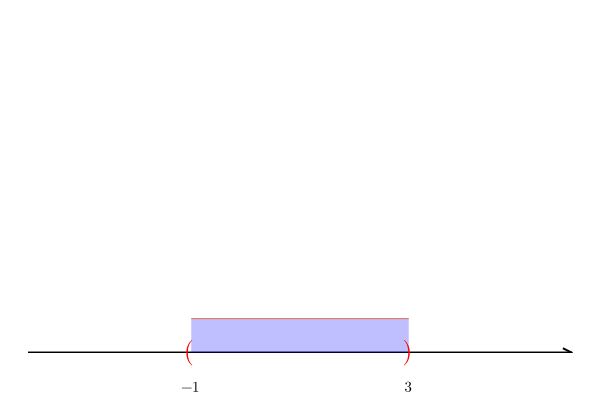

In [2]:
using Plots, LaTeXStrings, Plots.PlotMeasures

f(x) = 0.1
plot([0.5,1],[0,0],arrow=true,color=:black,linewidth=2, xticks=false, yticks=false,
     ylims=(0,1), showaxis=false, label="", bottom_margin = 10mm)
plot!(f,0.65,0.85, fill=(0, 0.25, :blue), label="")

annotate!([(0.65,0, (L"(", 17, :red))])
annotate!([(0.85,0, (L")", 17, :red))])
annotate!([(0.65,-0.1, (L"-1", 10, :black))])
annotate!([(0.85,-0.1, (L"3", 10, :black))])

#### Example

5) 

\begin{equation}
\begin{split}
\frac{x-3}{3x} + \frac{x}{6} & \le \frac{x^{2} + 9}{6x} - \frac{x+3}{x} \\
\frac{x^{2} + 9}{6x} - \frac{x+3}{x} - \frac{x-3}{3x} - \frac{x}{6} & \ge 0 \\
\frac{x-8x + 9 - 18 + 6}{6x} & \ge 0 \\
\frac{-8x - 3}{6x} & \ge 0
\end{split}
\end{equation}

To obtain the inequality above, the conditions below have to be fulfilled:

\begin{equation}
6x > 0
\end{equation}

\begin{equation}
-8x - 3 \ge 0 \\
x \le - \frac{3}{8}
\end{equation}

The points where the sign change at the interval notation are: $-\frac{3}{8}$ and $0$.

Try to input various values of $x$ (that satisfied the inequality above) to the equation $\frac{-8x - 3}{6x} \ge 0$ in order to obtain the negative and positive at the interval notation.

* For $x = -1$ then we will obtain  $\frac{-8(-1) - 3}{6(-1)} = \frac{5}{-6} < 0$ (negative sign at the interval notation but did not fulfill the condition of $\frac{-8x - 3}{6x} \ge 0$ thus it is not a solution set.

* For $x = 5$ then we will obtain  $\frac{-8(5) - 3}{6(5)} = \frac{-43}{30} < 0$ (negative sign at the interval notation but did not fulfill the condition of $\frac{-8x - 3}{6x} \ge 0$ thus it is not a solution set.

* For $x = - \frac{2}{8}$ then we will obtain  $\frac{-8(- \frac{2}{8}) - 3}{6(- \frac{2}{8})} = \frac{-1}{- \frac{12}{8}} = \frac{8}{12} \ge 0$ (positive sign at the interval notation and fulfill the condition of $\frac{-8x - 3}{6x} \ge 0$ thus it included in the solution set.

Thus, the solution set is:

$\{x \in \mathbb{R} \ | \ - \frac{3}{8} \le x < 0 \}$

$[-\frac{3}{8},0)$

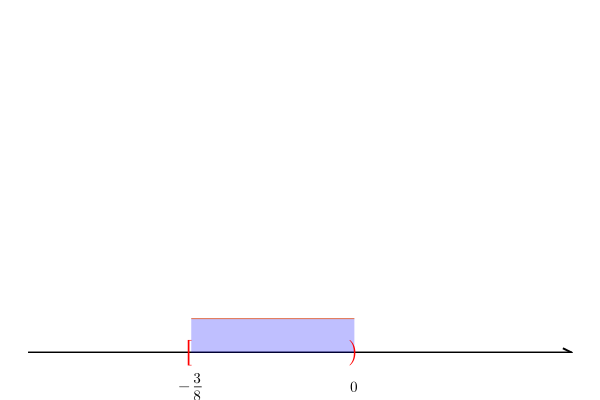

In [3]:
using Plots, LaTeXStrings, Plots.PlotMeasures

f(x) = 0.1
plot([0.5,1],[0,0],arrow=true,color=:black,linewidth=2, xticks=false, yticks=false,
     ylims=(0,1), showaxis=false, label="", bottom_margin = 10mm)
plot!(f,0.65,0.80, fill=(0, 0.25, :blue), label="")

annotate!([(0.65,0, (L"[", 17, :red))])
annotate!([(0.80,0, (L")", 17, :red))])
annotate!([(0.65,-0.1, (L"- \frac{3}{8}", 10, :black))])
annotate!([(0.80,-0.1, (L"0", 10, :black))])

If $x < y$ implies $f(x) < f(y)$

Consider $x, y \in \mathbb{R}, \quad x < y \quad a^{y} - a^{x} , a>0$

$a^{y} > a^{x} \quad \frac{a^{y}}{a^{x}} = a^{y - x} > 1$

$e^{-x}$ is a function that reflecting $e^{x}$ to the $y$-axis.

#### Statement

Let $a$ be a positive number and let $x, y \in \mathbb{R}$ be such that $ x < y$ then $a^{y} > a^{x}$.

Indeed, since $a^{x} > 0, \quad \frac{a^{y}}{a^{x}} = a^{y - x} > 1$ since $y - x >0$. Then $a^{y} > a^{x}$

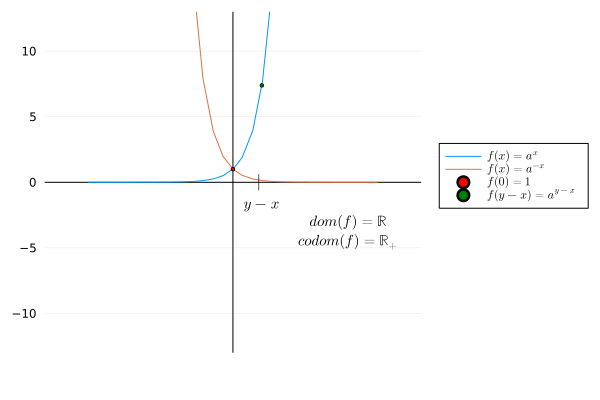

In [18]:
# example graph

using Plots, LaTeXStrings, Plots.PlotMeasures
gr()

f(x) = exp(x)  
g(x) = exp(-x)

plot(f,-10,10, xticks=false, xlims=(-13,13), ylims=(-13,13), 
    bottom_margin = 10mm, label=L"f(x) =  a^{x}", framestyle = :zerolines, 
    legend=:outerright)
plot!(g,-10,10, xticks=false, xlims=(-13,13), ylims=(-13,13), 
    bottom_margin = 10mm, label=L"f(x) =  a^{-x}", framestyle = :zerolines, 
    legend=:outerright)

scatter!([0], [f(0)], color = "red", label=L"f(0)=1", markersize = 2)
scatter!([2], [f(2)], color = "green", label=L"f(y-x)=a^{y-x}", markersize = 2)

annotate!([(2,0, (L"|", 11, :black))])
annotate!([(2,-1.85, (L"y-x", 10, :black))])
annotate!([(8,-3.05, (L"dom(f)=\mathbb{R}", 10, :black))])
annotate!([(8,-4.55, (L"codom(f)=\mathbb{R_{+}}", 10, :black))])

#### Examples

1) $2^{x} > \frac{1}{16} = 2^{-4} \quad 2^{x} > 2^{-4}$

Solution:
$x > -4$

In order to solve this is by using the monotonicity property, and then the secon property is if and only if we have the same base number.

2) $4^{5x -1} < 2$

Solution:
\begin{equation}
(2^{2})^{5x - 1} = 2^{2(5x - 1)} < 2^{1} \\
2(5x - 1) < 1 \\
10x < 3 \\
x < \frac{3}{10}
\end{equation}

3) $2^{\frac{x}{x+1}} > 1 = 2^{0}$

Solution:
\begin{equation}
\frac{x}{x + 1} > 0 \\
x > 0 \\
x + 1 > 0 \\
x \neq -1
\end{equation}

The solution set is: $ x < -1 ∨ x > 0$

$\{x \in \mathbb{R} \ | \ x < -1\} \cup \{x \in \mathbb{R} \ | \ x > 0 \}$

$(-\infty,-1) \cup (0, + \infty)$

4) 
\begin{equation}
\begin{pmatrix}
\begin{pmatrix}
\frac{1}{7}
\end{pmatrix}^{x+1}
\end{pmatrix}^{x} > \frac{1}{49}
\end{equation}

The Solution:
\begin{equation}
\begin{pmatrix}
\begin{pmatrix}
\frac{1}{7}
\end{pmatrix}^{x+1}
\end{pmatrix}^{x} > \frac{1}{7^{2}}
\end{equation}

\begin{equation}
7^{-x(x+1)} > 7^{-2}\\
x^{2} + x < 2 \\
x^{2} + x - 2 < 0
\end{equation}

By using quadratic formula to determine the root:

\begin{equation}
\frac{-1 \pm \sqrt{1+8}}{2} = \frac{-1 \pm 3}{2}
\end{equation}

The solution set is: $ -2 < x < 1$

$\{x \in \mathbb{R} \ | \ -2 < x < 1\}$

$(-2,1)$

#### Quadratic Equations

$f(x) = ax^{2} + bx + c$

$f(x) = 0$

\begin{equation}
x_{1,2} = \frac{-b \pm \sqrt{b^{2} - 4ac}}{2a}
\end{equation}


For $f(x) \ge 0, a < 0$

$x_{1} < x < x_{2}$


For $f(x) \ge 0, a > 0$

$x < x_{1} ∨ x_{2} < x$

In [60]:
# Returns quadratic roots

function quadratic(a, b, c)
          discr = b^2 - 4*a*c
          discr >= 0 ?   ( (-b + sqrt(discr))/(2a), (-b - sqrt(discr))/(2a) ) : error("Only complex roots")
end

quadratic(-1,0,5)

(-2.23606797749979, 2.23606797749979)

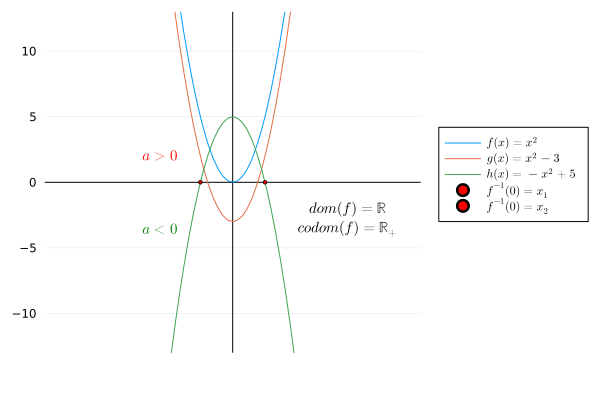

In [61]:
# example graph

using Plots, LaTeXStrings, Plots.PlotMeasures
gr()

f(x) = x^(2)  
g(x) = x^(2) - 3
h(x) = -x^(2) + 5 
 
plot(f,-10,10, xticks=false, xlims=(-13,13), ylims=(-13,13), 
    bottom_margin = 10mm, label=L"f(x) = x^{2}", framestyle = :zerolines, 
    legend=:outerright)
plot!(g,-10,10, xticks=false, xlims=(-13,13), ylims=(-13,13), 
    bottom_margin = 10mm, label=L"g(x) = x^{2} - 3", framestyle = :zerolines, 
    legend=:outerright)
plot!(h,-10,10, xticks=false, xlims=(-13,13), ylims=(-13,13), 
    bottom_margin = 10mm, label=L"h(x) = -x^{2} + 5", framestyle = :zerolines, 
    legend=:outerright)

scatter!([-2.23606797749979], [0], color = "red", label=L"f^{-1}(0)=x_{1}", markersize = 2)
scatter!([2.23606797749979], [0], color = "red", label=L"f^{-1}(0)=x_{2}", markersize = 2)

annotate!([(-5,2.05, (L"a>0", 10, :red))])
annotate!([(-5,-3.55, (L"a<0", 10, :green))])
annotate!([(8,-2.05, (L"dom(f)=\mathbb{R}", 10, :black))])
annotate!([(8,-3.55, (L"codom(f)=\mathbb{R_{+}}", 10, :black))])

#### Examples

1) 
\begin{equation}
\frac{x^{2} - 3x - 4}{x^{2} + 2x - 15} \le 0 \\
\end{equation}

$f(x) = x^{2} -3x - 4$

$g(x) = x^{2} + 2x - 15$

The roots for $f(x)$:

\begin{equation}
f(x) = 0 \\
x_{1,2} = \frac{-b \pm \sqrt{b^{2} - 4ac}}{2a} \\
x_{1,2} = \frac{3 \pm 5}{2} \\
x_{1}^{f} = -1 \\
x_{2}^{f} = 4 
\end{equation}

Thus, $f(x) = (x + 1)(x - 4)$

The roots for $g(x)$:

\begin{equation}
g(x) = 0 \\
x_{1,2} = \frac{-b \pm \sqrt{b^{2} - 4ac}}{2a} \\
x_{1,2} = \frac{-2 \pm \sqrt{4 + 60}}{2} \\
x_{1,2} = \frac{-2 \pm 8}{2} \\
x_{1}^{g} =-5 \\
x_{2}^{g} = 3 \\
\end{equation}

Thus, $g(x) = (x + 5)(x - 3)$

After we create the interval notation we will have:

* for $f(x)$ the value of $x \le 0$ occurs when $ -1 \le x \le 4$

* for $g(x)$ the value of $x \le 0$ occurs when $ -5 \le x \le 3$

Afterwards, we will combine both interval notation for $f(x)$ and $g(x)$ to get the interval notation for $\frac{x^{2} - 3x - 4}{x^{2} + 2x - 15} \le 0$

If you see the interval notation below for $\frac{x^{2} - 3x - 4}{x^{2} + 2x - 15} $ to obtain the required condition, the combination will need to have different value (positive and negative).

The solution set is: $ -5 < x \le -1 ∨ 3 < x \le 4$

$\{x \in \mathbb{R} \ | \ -5 < x \le -1 \} \cup \{x \in \mathbb{R} \ | \ 3 < x \le 4 \}$

$(-5,-1] \cup (3, 4]$


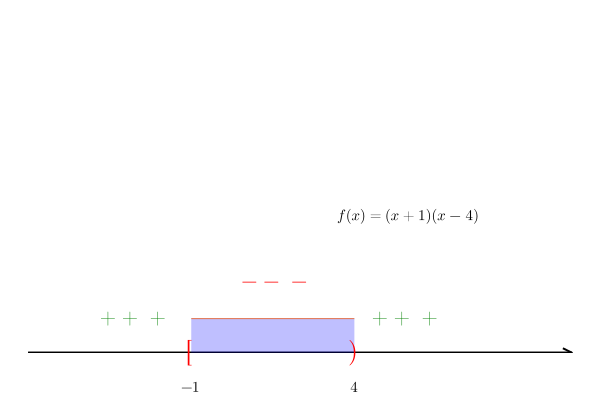

In [17]:
using Plots, LaTeXStrings, Plots.PlotMeasures

f(x) = 0.1

plot([0.5,1],[0,0],arrow=true,color=:black,linewidth=2, xticks=false, yticks=false,
     ylims=(0,1), showaxis=false, label="", bottom_margin = 10mm)
plot!(f,0.65,0.80, fill=(0, 0.25, :blue), label="")

annotate!([(0.73,0.2, (L"- - -", 14, :red))])
annotate!([(0.60,0.1, (L"+ + +", 14, :green))])
annotate!([(0.85,0.1, (L"+ + +", 14, :green))])
annotate!([(0.85,0.4, (L"f(x) = (x+1)(x-4)", 10, :black))])
annotate!([(0.65,0, (L"[", 17, :red))])
annotate!([(0.80,0, (L")", 17, :red))])
annotate!([(0.65,-0.1, (L"- 1", 10, :black))])
annotate!([(0.80,-0.1, (L"4", 10, :black))])

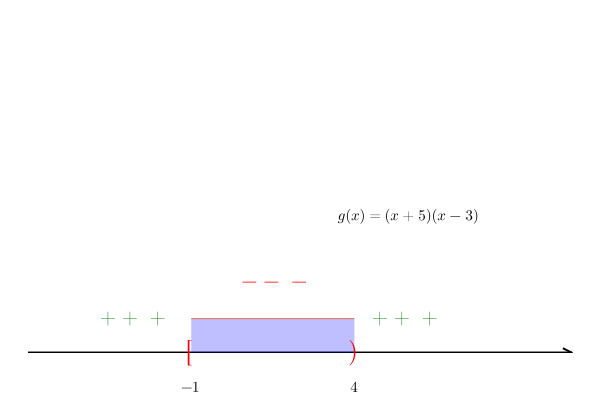

In [18]:
using Plots, LaTeXStrings, Plots.PlotMeasures

f(x) = 0.1

plot([0.5,1],[0,0],arrow=true,color=:black,linewidth=2, xticks=false, yticks=false,
     ylims=(0,1), showaxis=false, label="", bottom_margin = 10mm)
plot!(f,0.65,0.80, fill=(0, 0.25, :blue), label="")

annotate!([(0.73,0.2, (L"- - -", 14, :red))])
annotate!([(0.60,0.1, (L"+ + +", 14, :green))])
annotate!([(0.85,0.1, (L"+ + +", 14, :green))])
annotate!([(0.85,0.4, (L"g(x) = (x+5)(x-3)", 10, :black))])
annotate!([(0.65,0, (L"[", 17, :red))])
annotate!([(0.80,0, (L")", 17, :red))])
annotate!([(0.65,-0.1, (L"- 1", 10, :black))])
annotate!([(0.80,-0.1, (L"4", 10, :black))])

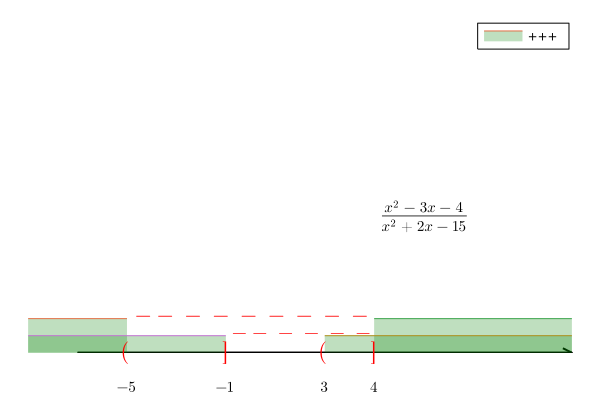

In [60]:
using Plots, LaTeXStrings, Plots.PlotMeasures

f(x) = 0.1
g(x) = 0.05

plot([0.5,1],[0,0],arrow=true,color=:black,linewidth=2, xticks=false, yticks=false,
     ylims=(0,1), showaxis=false, label="", bottom_margin = 10mm)
plot!(f,0.45,0.55, fill=(0, 0.25, :green), label="+++")
plot!(f,0.80,1, fill=(0, 0.25, :green), label="")
plot!(g,0.45,0.65, fill=(0, 0.25, :green), label="")
plot!(g,0.75,1, fill=(0, 0.25, :green), label="")

annotate!([(0.68,0.1, (L"- - -  - - - - - -", 14, :red))])
annotate!([(0.73,0.05, (L"- - - - - -", 13, :red))])
annotate!([(0.85,0.4, (L"\frac{x^{2} - 3x - 4}{x^{2} + 2x - 15}", 10, :black))])
annotate!([(0.55,0, (L"(", 15, :red))])
annotate!([(0.65,0, (L"]", 15, :red))])
annotate!([(0.75,0, (L"(", 15, :red))])
annotate!([(0.80,0, (L"]", 15, :red))])
annotate!([(0.55,-0.1, (L"- 5", 10, :black))])
annotate!([(0.65,-0.1, (L"- 1", 10, :black))])
annotate!([(0.75,-0.1, (L"3", 10, :black))])
annotate!([(0.80,-0.1, (L"4", 10, :black))])

#### Example

2) $x \ge \sqrt[3]{x^{3} - x^{2} + 1}$

\begin{equation}
x^{3} \ge (\sqrt[3]{x^{3} - x^{2} + 1})^{3} \\
x^{3} \ge x^{3} - x^{2} + 1 \\
x^{2} - 1 \ge 0
\end{equation}

$x_{1} = -1, \ x_{2} = 1$

The solution set is: $ x \le -1 ∨ x \ge 1$

$\{x \in \mathbb{R} \ | \ x \le -1 \} \cup \{x \in \mathbb{R} \ | \ x \ge 1 \}$

$(- \infty,-1] \cup [1, \infty)$

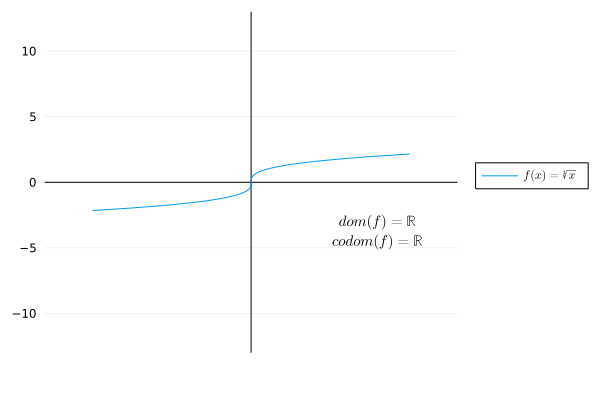

In [107]:
# example graph

using Plots, LaTeXStrings, Plots.PlotMeasures
gr()

f(x) = cbrt(x)  

plot(f,-10,10, xticks=false, xlims=(-13,13), ylims=(-13,13), 
    bottom_margin = 10mm, label=L"f(x) =  \sqrt[3]{x}", framestyle = :zerolines, 
    legend=:outerright)

annotate!([(8,-3.05, (L"dom(f)=\mathbb{R}", 10, :black))])
annotate!([(8,-4.55, (L"codom(f)=\mathbb{R}", 10, :black))])

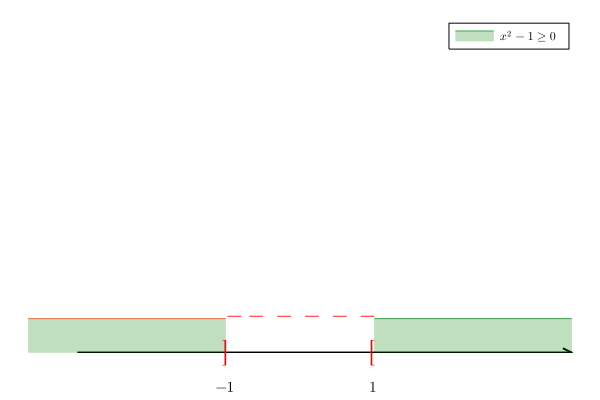

In [85]:
using Plots, LaTeXStrings, Plots.PlotMeasures

f(x) = 0.1

plot([0.5,1],[0,0],arrow=true,color=:black,linewidth=2, xticks=false, yticks=false,
     ylims=(0,1), showaxis=false, label="", bottom_margin = 10mm)
plot!(f,0.45,0.65, fill=(0, 0.25, :green), label="")
plot!(f,0.8,1, fill=(0, 0.25, :green), label=L"x^{2} - 1 \ ≥ \ 0")

annotate!([(0.73,0.1, (L"- - - - - -", 14, :red))])
annotate!([(0.65,0, (L"]", 17, :red))])
annotate!([(0.80,0, (L"[", 17, :red))])
annotate!([(0.65,-0.1, (L"- 1", 10, :black))])
annotate!([(0.80,-0.1, (L"1", 10, :black))])

#### Example

3) $x - 8 < \sqrt{x^{2} - 9x + 14}$

\begin{equation}
x^{2} - 9x + 14 \ge 0 \\ 
\frac{9 \pm \sqrt{81 - 56}}{2} = \frac{9 \pm \sqrt{25}}{2} = \frac{9 \pm 5}{2} \\
\end{equation}

We obtain the roots: $x_{1} = 2, \ x_{2} = 7$

The solution set is: $ x \le 2 ∨ x \ge 7$

$\{x \in \mathbb{R} \ | \ x \le 2 \} \cup \{x \in \mathbb{R} \ | \ x \ge 7 \}$

$(- \infty,2] \cup [7, \infty)$

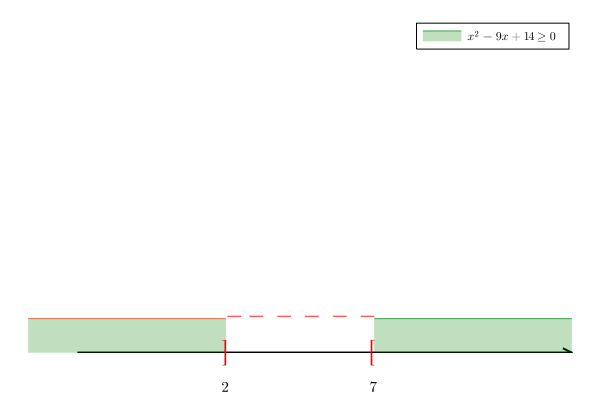

In [103]:
using Plots, LaTeXStrings, Plots.PlotMeasures

f(x) = 0.1

plot([0.5,1],[0,0],arrow=true,color=:black,linewidth=2, xticks=false, yticks=false,
     ylims=(0,1), showaxis=false, label="", bottom_margin = 10mm)
plot!(f,0.45,0.65, fill=(0, 0.25, :green), label="")
plot!(f,0.8,1, fill=(0, 0.25, :green), label=L"x^{2} -9x + 14 \ ≥ \ 0")

annotate!([(0.73,0.1, (L"- - - - - -", 14, :red))])
annotate!([(0.65,0, (L"]", 17, :red))])
annotate!([(0.80,0, (L"[", 17, :red))])
annotate!([(0.65,-0.1, (L"2", 10, :black))])
annotate!([(0.80,-0.1, (L"7", 10, :black))])

$∀ a,b \in \mathbb{R_{+}}, \quad a < b ↔ a^{2} < b^{2}$

in case of:
$ x < 8, \quad x-8 < 0 \le \sqrt{x^{2} - 9x + 14}$

$x \le 2$ or $7 \le x < 8$

in another case:

$ x \ge 8, \quad (x-8)^{2} < x^{2} - 9x + 14$

\begin{equation}
x^{2} - 16x + 64 < x^{2} - 9x + 14 \\
7x - 50 > 0 \\
x > \frac{50}{7}\\
7 + \frac{1}{7} = \frac{49 + 1}{7} = \frac{50}{7} < 8
\end{equation}

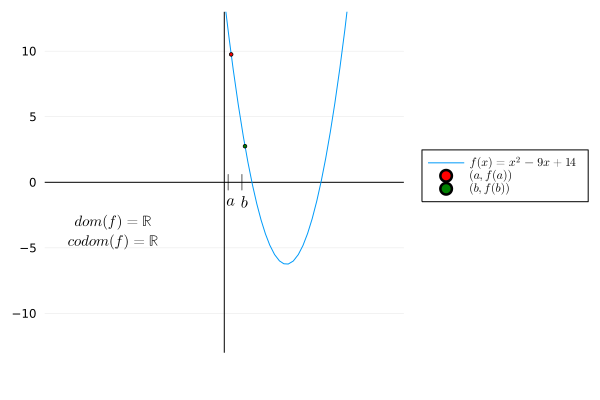

In [1]:
# example graph

using Plots, LaTeXStrings, Plots.PlotMeasures
gr()

f(x) = x^(2) -9x + 14 

plot(f,-10,10, xticks=false, xlims=(-13,13), ylims=(-13,13), 
    bottom_margin = 10mm, label=L"f(x) = x^{2} -9x + 14 ", framestyle = :zerolines, 
    legend=:outerright)

scatter!([0.5], [f(0.5)], color = "red", label=L"(a,f(a))", markersize = 2)
scatter!([1.5], [f(1.5)], color = "green", label=L"(b,f(b))", markersize = 2)

annotate!([(0.5,0, (L"|", 11, :black))])
annotate!([(1.5,0, (L"|", 11, :black))])
annotate!([(0.5,-1.5, (L"a", 11, :black))])
annotate!([(1.5,-1.5, (L"b", 11, :black))])
annotate!([(-8,-3.05, (L"dom(f)=\mathbb{R}", 10, :black))])
annotate!([(-8,-4.55, (L"codom(f)=\mathbb{R}", 10, :black))])

#### Example 

4) $|x + 2| \le |2x - 3| + 1$

\begin{equation}
|x + 2|
\begin{cases}
x + 2 \quad \text{if} \quad x \ge -2 \\
-x - 2 \quad \text{if} \quad x < -2 
\end{cases}
\end{equation}

\begin{equation}
|2x - 3|
\begin{cases}
2x - 3 \quad \text{if} \quad x \ge \frac{3}{2} \\
3 - 2x \quad \text{if} \quad x < \frac{3}{2} 
\end{cases}
\end{equation}

We are going to combine the cases in the left hand side ($|x + 2|$) with the cases in the right hand side ($|2x - 3|$).

First, for $x \ge -2$ consider
\begin{equation}
x \ge -2, \quad x \ge \frac{3}{2} \ | \ x \ge \frac{3}{2} \\
x + 2 \le 2x - 3 + 1 \\ 
0 \le x - 4 \\
x \ge 4
\end{equation}

Then for the second case,
\begin{equation}
x \ge -2, \quad x < \frac{3}{2} \ | \ -2 \le x < \frac{3}{2} \\
x + 2 \le 3 -2x + 1 \\ 
0 \le 2 - 3x \\ 
x \le \frac{2}{3}
\end{equation}

Secondly, for $x < -2$
\begin{equation}
x < -2, \quad x \ge \frac{3}{2} \ \\
\end{equation}

There is no intersection between the two sets thus the solution set for this is ø.

The last combination, consider
\begin{equation}
x < -2, \quad x < \frac{3}{2} \ | \ x < -2 \\
-x - 2 \le 3 -2x + 1 \\ 
x - 6 \le 0 \\ 
x \le 6
\end{equation}

Since $x \le 6$ does not belong to the cases' condition, thus we will take $x \le -2$ as the solution set.

The solution set is: $ x < 2 ∨ x \le \frac{3}{2} ∨ x \ge 4$

$\{x \in \mathbb{R} \ | \ x \le \frac{3}{2} \} \cup \{x \in \mathbb{R} \ | \ x \ge 4 \}$

$(- \infty,\frac{3}{2}] \cup [4, \infty)$

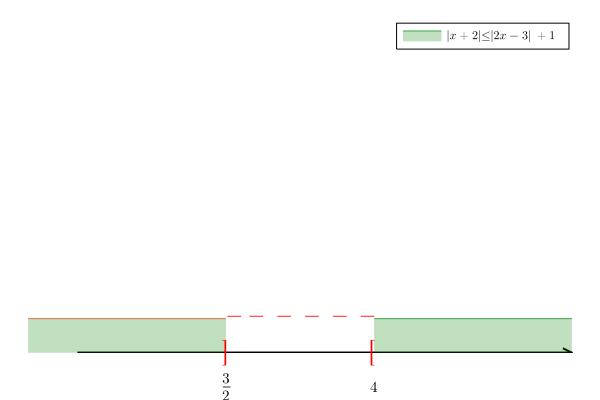

In [3]:
using Plots, LaTeXStrings, Plots.PlotMeasures

f(x) = 0.1

plot([0.5,1],[0,0],arrow=true,color=:black,linewidth=2, xticks=false, yticks=false,
     ylims=(0,1), showaxis=false, label="", bottom_margin = 10mm)
plot!(f,0.45,0.65, fill=(0, 0.25, :green), label="")
plot!(f,0.8,1, fill=(0, 0.25, :green), label=L"|x + 2| ≤ |2x - 3| + 1")

annotate!([(0.73,0.1, (L"- - - - - -", 14, :red))])
annotate!([(0.65,0, (L"]", 17, :red))])
annotate!([(0.80,0, (L"[", 17, :red))])
annotate!([(0.65,-0.1, (L"\frac{3}{2}", 10, :black))])
annotate!([(0.80,-0.1, (L"4", 10, :black))])

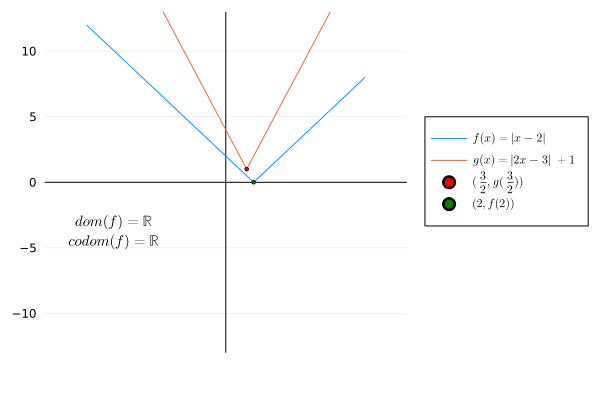

In [13]:
# example graph

using Plots, LaTeXStrings, Plots.PlotMeasures
gr()

f(x) = abs(x-2) 
g(x) = abs(2x - 3) + 1

plot(f,-10,10, xticks=false, xlims=(-13,13), ylims=(-13,13), 
    bottom_margin = 10mm, label=L"f(x) = |x - 2|", framestyle = :zerolines, 
    legend=:outerright)
plot!(g,-10,10, xticks=false, xlims=(-13,13), ylims=(-13,13), 
    bottom_margin = 10mm, label=L"g(x) = |2x - 3| + 1 ", framestyle = :zerolines, 
    legend=:outerright)

scatter!([1.5], [g(1.5)], color = "red", label=L"(\frac{3}{2},g(\frac{3}{2}))", markersize = 2)
scatter!([2], [f(2)], color = "green", label=L"(2,f(2))", markersize = 2)


annotate!([(-8,-3.05, (L"dom(f)=\mathbb{R}", 10, :black))])
annotate!([(-8,-4.55, (L"codom(f)=\mathbb{R}", 10, :black))])

#### log function

$0 < x < y$, $\log(x)$ and $\log(y)$ 

Since $x < y, \ \frac{x}{y} < 1$

\begin{equation}
\log(\frac{x}{y}) < 0 \\
\log(x) - \log(y) < 0 \\
\log(x) < \log(y)
\end{equation}

\begin{equation}
\log(x^{2} + 1) > \log(2x + 4) \\
x^{2} + 1 > 2x + 4 \\
x^{2} -2x - 3 > 0
\end{equation}

By using quadratic roots formula:
\begin{equation}
\frac{2 \pm \sqrt{4 + 12}}{2} \\
\frac{2 \pm 4}{2}
\end{equation}

We obtain the roots: $x_{1} < -1, \ x_{2} > 3$

Thus,

$\log(x^{2} + 1) \quad x^{2} + 1 > 0 \quad ∀x$

\begin{equation}
\log(2x + 4) \\
2x + 4 > 0 \\
x > -2
\end{equation}

The solution set is: $ -2 < x < -1 ∨ x > 3$

$\{x \in \mathbb{R} \ | \ -2  < x < -1 \} \cup \{x \in \mathbb{R} \ | \ x > 3 \}$

$(-2,-1) \cup (3, \infty)$

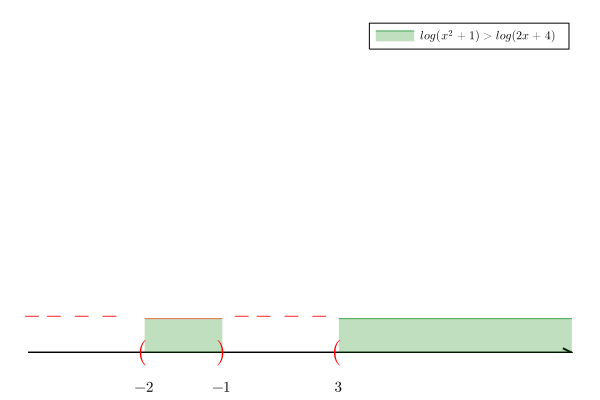

In [27]:
using Plots, LaTeXStrings, Plots.PlotMeasures

f(x) = 0.1

plot([0.3,1],[0,0],arrow=true,color=:black,linewidth=2, xticks=false, yticks=false,
     ylims=(0,1), showaxis=false, label="", bottom_margin = 10mm)
plot!(f,0.45,0.55, fill=(0, 0.25, :green), label="")
plot!(f,0.7,1, fill=(0, 0.25, :green), label=L"log(x^{2} + 1) > log(2x + 4)")

annotate!([(0.36,0.1, (L"- - - -", 14, :red))])
annotate!([(0.63,0.1, (L"- - - -", 14, :red))])
annotate!([(0.45,0, (L"(", 17, :red))])
annotate!([(0.55,0, (L")", 17, :red))])
annotate!([(0.70,0, (L"(", 17, :red))])
annotate!([(0.45,-0.1, (L"-2", 10, :black))])
annotate!([(0.55,-0.1, (L"-1", 10, :black))])
annotate!([(0.70,-0.1, (L"3", 10, :black))])

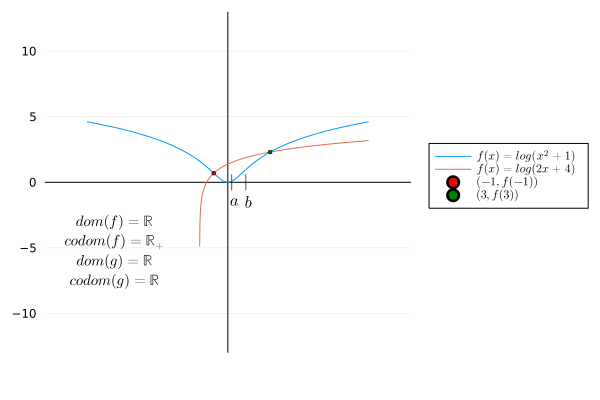

In [34]:
# example graph

using Plots, LaTeXStrings, Plots.PlotMeasures
gr()

f(x) = log(x^(2) + 1) 
g(x) = log(2x + 4) 

plot(f,-10,10, xticks=false, xlims=(-13,13), ylims=(-13,13), 
    bottom_margin = 10mm, label=L"f(x) = log(x^{2} + 1) ", framestyle = :zerolines, 
    legend=:outerright)
plot!(g,-10,10, xticks=false, xlims=(-13,13), ylims=(-13,13), 
    bottom_margin = 10mm, label=L"f(x) = log(2x + 4) ", framestyle = :zerolines, 
    legend=:outerright)

scatter!([-1], [f(-1)], color = "red", label=L"(-1,f(-1))", markersize = 2)
scatter!([3], [f(3)], color = "green", label=L"(3,f(3))", markersize = 2)

annotate!([(0.5,0, (L"|", 11, :black))])
annotate!([(1.5,0, (L"|", 11, :black))])
annotate!([(0.5,-1.5, (L"a", 11, :black))])
annotate!([(1.5,-1.5, (L"b", 11, :black))])
annotate!([(-8,-3.05, (L"dom(f)=\mathbb{R}", 10, :black))])
annotate!([(-8,-4.55, (L"codom(f)=\mathbb{R_{+}}", 10, :black))])
annotate!([(-8,-6.05, (L"dom(g)=\mathbb{R}", 10, :black))])
annotate!([(-8,-7.55, (L"codom(g)=\mathbb{R}", 10, :black))])

## Real Analysis Course 9  (August 1st 2022)

Consider $A \subseteq \mathbb{R}, A \neq ø$

#### Definition (Upper Bound)

We say that $M \in \mathbb{R}$ is an upper bound for $A \subseteq \mathbb{R}$ if 

$x \le M \quad ∀ x \in A$

#### Definition (Lower Bound)

We say that $M \in \mathbb{R}$ is a lower bound for $A \subseteq \mathbb{R}$ if

$x \ge m \quad ∀ x \in A$

#### Remark

i) It is crucial that $A \subseteq \mathbb{R}$ is ordered.

ii) No information on the fact that $M, m \in A$

#### Examples

1) $A = \{ x \in \mathbb{R} | -1 < x < 1 \}$

* 1 is an upper bound
* -1 is a lower bound

2) $A = \{ x \in \mathbb{R} | 0 < x \le 1 \ ∨ \ 2 \le x < 3 \}$

* 3 is an upper bound, 4 is an upper bound
* $\frac{3}{2}$ is not on upper bound (it is not in the domain)

3) $A = \{ x \in \mathbb{R} | x \ge 10 \}$

* ∄ upper bound for $A$
* 10 is a lower bound for $A$ (any number smaller than 10 is also a lower bound)

#### Exercise

For any set $A \subseteq \mathbb{R}$, the set of upper bounds is either empty or infinite.

#### Definition

We say that $M \in \mathbb{R}$ is a maximum (minimum) of $A$ if:

1) $M$ is an upper bound (lower bound) for $A$

2) $M \in A$

#### Examples

1) $A = \{x \in \mathbb{R} | x \ge 1 \}$

* No upper bound → no maximum
* $1, -3, 0, -10, \dots$ are lower bounds 
* $x_m = 1$ is a minimum

#### Definition

We say that $A$ is bounded from above if $A$ has at least an upper bound.

We say that $A$ is bounded from below if $A$ has at least a lower bound.

We say that $A$ is bounded if it is bounded from above and below.

#### Theorem

Let $A \subseteq \mathbb{R}, A \neq ø$ be bounded from above then the set of upper bound has a minimum that is $M \in \mathbb{R}$ such that

1) $M$ is an upper bound for $A$

2) $M \le \tilde{M} \quad ∀ \tilde{M}$ upper bound for $A$

We will call $M = sup(A)$ (also called least upper bound)

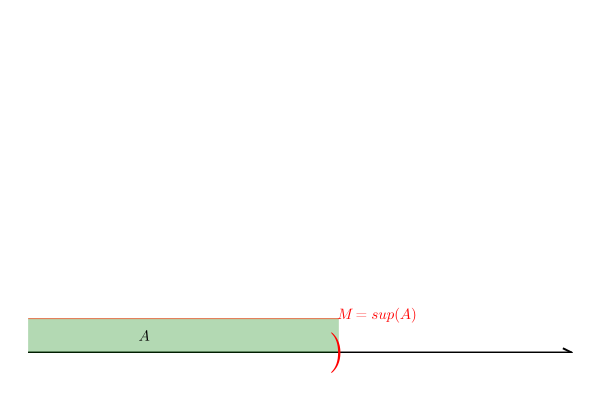

In [63]:
using Plots, LaTeXStrings, Plots.PlotMeasures

f(x) = 0.1

plot([0.3,1],[0,0],arrow=true,color=:black,linewidth=2, xticks=false, yticks=false,
     ylims=(0,1), showaxis=false, label="", bottom_margin = 10mm)
plot!(f,0.3,0.7, fill=(0, 0.3, :green), label="")

annotate!([(0.70,0, (L")", 27, :red))])
annotate!([(0.45,0.051, (L"A", 10, :black))])
annotate!([(0.75,0.11, (L"M = sup(A)", 10, :red))])

#### Proof (Axiom of Separation)

$M(A) = \{ M \in \mathbb{R} | M$ is an upper bound for $A\}$

$M(A^{C}) → M(A) \cup M(A)^{C} = \mathbb{R}$

$M(A) \cap M(A)^{C} = ø$

#### Notation

if $A$ is not bounded from above then $sup(A)= + \infty$

#### Theorem

If $A$ is bounded from below, then $∃! \ m \in \mathbb{R}$ such that

1) $m$ is a lower bound for $A$

2) $m \ge \tilde{m} \ ∀ \tilde{m}$ lower bound for $A$

$m = inf(A)$

If $A$ is not bounded from below $inf(A) = - \infty$

#### Theorem

Assume that the set $A \subseteq \mathbb{R}, \ A \neq ø$ has a maximum $M \in \mathbb{R}$, then $M = sup(A)$. Assume that $A$ has a minimum $m \in \mathbb{R}$, then $m = inf(A)$.

#### Proof

Let $m \in \mathbb{R}$ be a minimum for $A$

1) $m \in A$

2) $m$ is a lower bound for $A$

Assume that $∃ m_{1} > m$ that is a lower bound

\begin{equation}
\frac{m+m_{1}}{2} > m \quad \frac{m+m_{1}}{2} \in A \\
\frac{m+m_{1}}{2} < m_{1} → ∃ a \in A
\end{equation}
$m_{1}$ is not a lower bound.


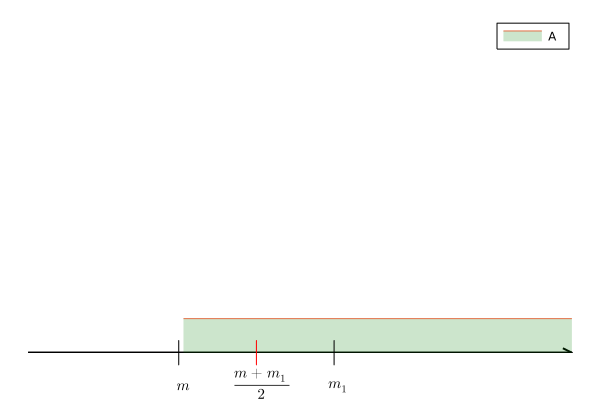

In [87]:
using Plots, LaTeXStrings, Plots.PlotMeasures

f(x) = 0.1

plot([0.3,1],[0,0],arrow=true,color=:black,linewidth=2, xticks=false, yticks=false,
     ylims=(0,1), showaxis=false, label="", bottom_margin = 10mm)
plot!(f,0.5,1, fill=(0, 0.2, :green), label="A")

annotate!([(0.5,0, (L"|", 17, :black))])
annotate!([(0.60,0, (L"|", 17, :red))])
annotate!([(0.70,0, (L"|", 17, :black))])
annotate!([(0.7,-0.1, (L"m_{1}", 10, :black))])
annotate!([(0.5,-0.1, (L"m", 10, :black))])
annotate!([(0.6,-0.091, (L"\frac{m+m_{1}}{2}", 10, :black))])

#### Examples

1) $A = \{x \in \mathbb{R} | 0 \le x < 1 \}$

* 1 is an upper bound
* 0 is a lower bound $0 \in A → 0$ is a minimum, $0 = inf(A)$

Claim: $1=sup(A)$

Assume $L = sup(A) < 1 → \frac{L + 1}{2}$ such that $L < \frac{L+1}{2} < 1, \quad \frac{L+1}{2} \in A$

$L$ is not an upper bound → $1 = \sup(A)$

1 is not a maximum since $1 \notin A$

2) $A = \{ x \in \mathbb{R} | -1 < x \le 1 \}$

#### Proposition

Assume $A$ bounded from above (below). Then $L=\sup(A) \ (l=\inf(A))$ is the unique $L \in \mathbb{R}$ such that

1) $a \le L \ ∀a \in A \ (l \le a \quad ∀a \in A)$

2) $∀ \lambda < L \ ∃ a_{\lambda} \in A$ such that $ \lambda < a_{\lambda}$

$∀ \lambda > l \ ∃ a_{\lambda} \in A$ such that $ \lambda > a_{\lambda}$


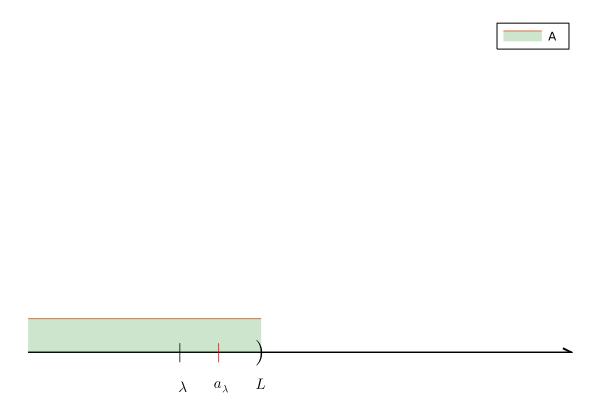

In [10]:
# Bounded from above by L

using Plots, LaTeXStrings, Plots.PlotMeasures

f(x) = 0.1

plot([0.3,1],[0,0],arrow=true,color=:black,linewidth=2, xticks=false, yticks=false,
     ylims=(0,1), showaxis=false, label="", bottom_margin = 10mm)
plot!(f,0.3,0.6, fill=(0, 0.2, :green), label="A")

annotate!([(0.5,0, (L"|", 13, :black))])
annotate!([(0.55,0, (L"|", 13, :red))])
annotate!([(0.6,0, (L")", 17, :black))])
annotate!([(0.5,-0.1, (L"\lambda", 10, :black))])
annotate!([(0.55,-0.1, (L"a_{\lambda}", 10, :black))])
annotate!([(0.6,-0.091, (L"L", 10, :black))])

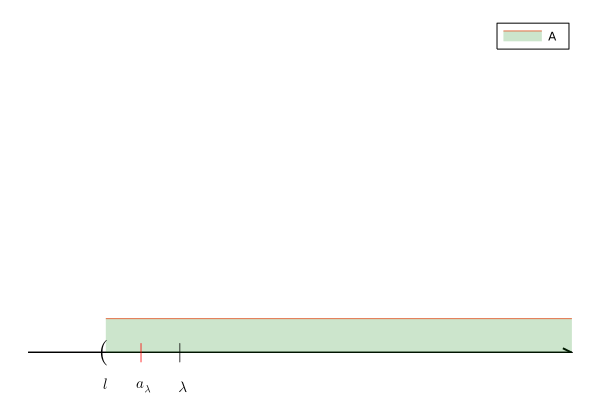

In [14]:
# Bounded from below by l

using Plots, LaTeXStrings, Plots.PlotMeasures

f(x) = 0.1

plot([0.3,1],[0,0],arrow=true,color=:black,linewidth=2, xticks=false, yticks=false,
     ylims=(0,1), showaxis=false, label="", bottom_margin = 10mm)
plot!(f,0.4,1, fill=(0, 0.2, :green), label="A")

annotate!([(0.4,0, (L"(", 17, :black))])
annotate!([(0.45,0, (L"|", 13, :red))])
annotate!([(0.5,0, (L"|", 13, :black))])
annotate!([(0.4,-0.091, (L"l", 10, :black))])
annotate!([(0.45,-0.1, (L"a_{\lambda}", 10, :black))])
annotate!([(0.5,-0.1, (L"\lambda", 10, :black))])

#### Exercise 1

$A = \{x \in \mathbb{R} | \ ∃ \ n \in \mathbb{N}$ such that $ x = \frac{1}{n}\}$

Find (if exist) $\sup(A), \ \inf(A), \ \max(A), \min(A)$

$\sup(A) = 1 = \max(A)$

$ ∀ n \in \mathbb{N} \setminus \{0\}$

$ n \ge 1 → \frac{1}{n} \le 1$, the inequality holds if and only if $n=1 \quad x_{1}=1$

Claim:

$0 = \inf(A)$

$ ∀x \in A \quad x \ge 0 \quad x = \frac{1}{n} > 0 \quad ∀n \in \mathbb{N} $

Set $\lambda > 0$, then we need to find $a_{\lambda} \in A$ such that $a_{\lambda} < \lambda$ 

if $a_{\lambda} \in A \ ∃ \tilde{n}$ such that $a_{\lambda} = \frac{1}{\tilde{n}}$ 

$\frac{1}{\tilde{n}} < \lambda → \tilde{n} > \frac{1}{\lambda}$

\begin{equation}
\begin{bmatrix}
\frac{1}{\lambda} 
\end{bmatrix} + 1 = n_{\lambda} > \frac{1}{\lambda} \quad a_{\lambda} = \frac{1}{n_{\lambda}}
\end{equation}

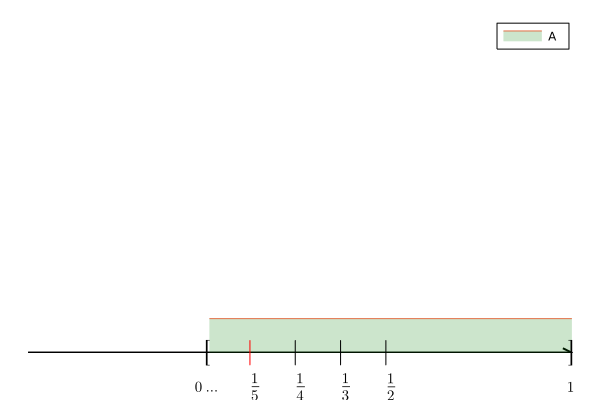

In [20]:
using Plots, LaTeXStrings, Plots.PlotMeasures

f(x) = 0.1

plot([0.3,0.9],[0,0],arrow=true,color=:black,linewidth=2, xticks=false, yticks=false,
     ylims=(0,1), showaxis=false, label="", bottom_margin = 10mm)
plot!(f,0.5,0.9, fill=(0, 0.2, :green), label="A")

annotate!([(0.5,0, (L"[", 17, :black))])
annotate!([(0.55,0, (L"|", 17, :black))])
annotate!([(0.60,0, (L"|", 17, :black))])
annotate!([(0.65,0, (L"|", 17, :black))])
annotate!([(0.7,0, (L"|", 17, :black))])
annotate!([(0.9,0, (L"]", 17, :black))])
annotate!([(0.5,-0.1, (L"0 \dots", 10, :black))])
annotate!([(0.55,-0.1, (L"\frac{1}{5}", 10, :black))])
annotate!([(0.6,-0.1, (L"\frac{1}{4}", 10, :black))])
annotate!([(0.65,-0.1, (L"\frac{1}{3}", 10, :black))])
annotate!([(0.7,-0.1, (L"\frac{1}{2}", 10, :black))])
annotate!([(0.9,-0.1, (L"1", 10, :black))])

#### Exercise 2

Let $A \subseteq \mathbb{R}$ be a finite set ($ |A| = N \in \mathbb{N}$)

$A = \{ a_{1}, a_{2} , \dots, a_{N} \}$

then $A$ has maximum and minimum.

Assume the $A$ has no maximum, → $L = \sup(A) \notin A$

Remember that $\sup$ is the least upper bound, thus $L$ is an upper bound as well.

$ L > a_{j} \quad j=1, \dots, N \quad L \neq a_{j} \ ∀j → L - a_{j} > 0$

\begin{equation}
\frac{L - a_{j}}{2} < \frac{L - a_{k}}{2} \quad ∀k=1,\dots,N \quad → L - \frac{L-a_{j}}{2} < L
\end{equation}

$L - \frac{L-a_{j}}{2}$ is still on upper bound is a contradiction, because $L - \frac{L-a_{j}}{2} < L$, it is impossible for a number smaller than $L$ to still be an upper bound. 

#### Exercise 3

$A = \{ y \in \mathbb{R} | y = \frac{x}{x^{2}+1}, x \in \mathbb{R} \}$

Find $\sup(A), \inf(A), \max(A), \min(A)$

Claim:

We will put some restrictions first:

\begin{equation}
\frac{x}{x^{2}+1} < 1  \\
x^{2} - x + 1 > 0 \quad ∀x \in \mathbb{R}
\end{equation}

The roots:
\begin{equation}
x_{1,2} = \frac{1 \pm \sqrt{1-4}}{2}  
\end{equation}

We have the $D = -x < 0$ (we have no real roots with negative determinant)

* 1 is an upper bound, thus:

$\frac{x}{x^{2}+1} \ge 0 ↔ x \ge 0$

* Let $a > 0$

\begin{equation}
\frac{x}{x^{2}+1} < a  \\
ax^{2} - x + a > 0 
\end{equation}

The roots:
\begin{equation}
x_{1,2} = \frac{1 \pm \sqrt{1-4a^{2}}}{2a}  
\end{equation}

Thus, we have the $D = 1 - 4a^{2} \ge 0$

\begin{equation}
1 - 4a^{2} \ge 0 \\
a^{2} \le \frac{1}{4} \\
0 < a \le \frac{1}{2}
\end{equation}

We will have 3 cases:

1) $a > \frac{1}{2} \quad ∀x \in \mathbb{R} $

2) $a = \frac{1}{2} \quad x_{1,2} = 1 \quad \frac{x}{x^{2} + 1} |_{x_{1,2}} = \frac{1}{2}$

3) $ a < \frac{1}{2}$

$\sup(A) = \frac{1}{2}$

$f(x) = \frac{x}{x^{2}} + 1 → f'(x) = \frac{x^{2} + 1 -2x^{2}}{(x^{2} + 1)^{2}} = \frac{1 - x^{2}}{(x^{2} + 1)^{2}} = 0 ↔ x_{1,2} = \pm 1$

$f(1) = \frac{1}{2} \quad f(-1) = - \frac{1}{2}$

$A=\{ y \in \mathbb{R} | -\frac{1}{2} \le y \le \frac{1}{2}\}$

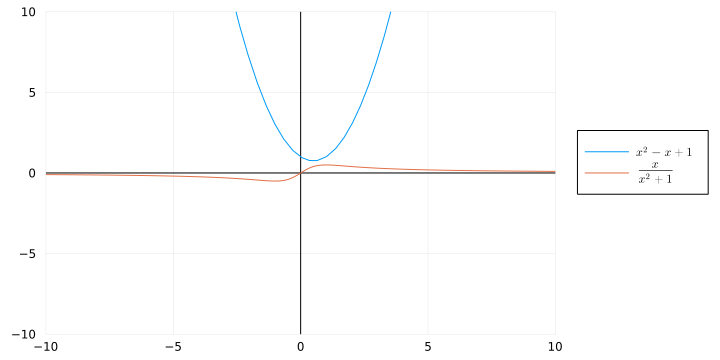

In [4]:
using Plots, LaTeXStrings
gr()

a, b = -10, 10

h(x) = x^(2) - x + 1
g(x) = x/(x^(2) + 1)

plot(h, a, b; legend=:outerright, label=L"x^{2} - x + 1", framestyle=:zerolines, 
    xlims = (-10,10), xticks = -10:5:10, 
    ylims = (-10,10), yticks = -10:5:10, 
    size=(720, 360))
plot!(g, a, b; legend=:outerright, label=L"\frac{x}{x^{2} + 1}", framestyle=:zerolines, 
    xlims = (-10,10), xticks = -10:5:10, 
    ylims = (-10,10), yticks = -10:5:10, 
    size=(720, 360))

#### Theorem (Archimedean Property of $\mathbb{R}$)

For all $a,b \in \mathbb{R}, \ a,b > 0 \ ∃ N \in \mathbb{N}$ such that $b < N_{a}$

#### Proof

1) $b < a → N = 1$

2) $b = a → ∀ N \in \mathbb{N} \setminus \{0,1\} \quad b < N_{a}$

3) $b > a$

Assume $ ∄ N \in \mathbb{N}$ such that $N_{a} > b → ∀N \in \mathbb{N} \quad N_{a} \le b$

$A =\{x = N_{a} | N \in \mathbb{N}\}$

$b$ is an upper bound for $A$

* $L \neq b$

* $L = \sup(A) < + \infty → ∀ \lambda < L$, $\lambda$ is not an upper bound for $A$.

* $L - a < L$ is not an upper bound for $A$

$ ∃ \bar{n} \in \mathbb{N}$ such that $L-a < \bar{n}a → L < a + \bar{n}a = (\bar{n} + 1)a \in A$

$(\bar{n}+1) \in A$, it generates a contradiction of which $L$ is $\sup$ of $A$.

#### Corollary

Given $a,b > 0 \quad ∃ N \in \mathbb{N}$ such that $a > \frac{b}{N}$

#### Remark

The set of $\mathbb{Q}$ satisfies the Archimedean property t

Consider two positive rational numbers $0 < r,s, \quad r,s \in \mathbb{Q} \quad r<s \quad r=\frac{p}{q} \quad s=\frac{m}{n} \quad p,q,m,n \in \mathbb{N}$

Find $N \in \mathbb{N}$ such that  $Nr > s$

$N\frac{p}{q} > \frac{m}{n} → N > \frac{mq}{pn}$

$Q = \{ r \in \mathbb{Q} | 0 \le r < e \}$

$e$ is not belong to rational number.

#### Remark

$∃ \sup$ (the existence of sup / lowest upper bound)$ →$  Axiom of separation

#### Proposition

$\mathbb{N}$ is unbounded from above

#### Proof

Consider $M \in \mathbb{R}$ such that $M$ is an upper bound for $\mathbb{N}, \quad M \ge n \quad ∀ n \in \mathbb{N}$

Take $a = 1, \ b = M$ and use the Archimedean property $ → ∃ N \in \mathbb{N}$ such that $b < Na →  M < N$

#### Theorem (Density of $\mathbb{Q}$ in $\mathbb{R}$)

Let $a,b \in \mathbb{R}$ with $a<b$, then $∃ r \in \mathbb{Q}$ such that $a < r < b$

#### Proof

$a < 0 < b \quad r=0$

$a=0, b>0$, using Archimedean Property with $1$ and $b \ ∃ n \in \mathbb{N}$ such that $nb>1 \quad b > \frac{1}{n} > 0$

$\frac{1}{n} = r$

Assume $0 < a < b \quad r = \frac{k}{N} \quad k,N \in \mathbb{N}$

##### From the Archimedean Property:

$∃ N \in \mathbb{N}$ such that $Nb> Na + 1$ thus

$b - a > \frac{1}{N}$

Consider

$\{j \in \mathbb{N} \ | \ a > \frac{j}{N}\} → ∃ h \in \mathbb{N} \quad h=\max\{j \in \mathbb{N} \ | \ a > \frac{j}{N}\}$

$k = h + 1 → \frac{k}{N} = \frac{h+1}{N} = \frac{h}{N} + \frac{1}{N}$ with $ b - a > \frac{1}{N}$

$ \frac{h}{N} = a \quad \frac{k}{N} = a + \frac{1}{N} < b$

$ \frac{k}{N} \quad \frac{h+1}{N} \ge b \quad \frac{h}{N} \ge b - \frac{1}{N} > a \quad \frac{1}{N} < b - a$


$ \frac{h}{N} > a $ contradicts the $h=\max\{j \in \mathbb{N} | a > \frac{j}{N}\}$ thus $\frac{k}{N} < b$ and $ a < \frac{k}{N} $

The rational number we are looking for exactly is

$ r = \frac{k}{N} $

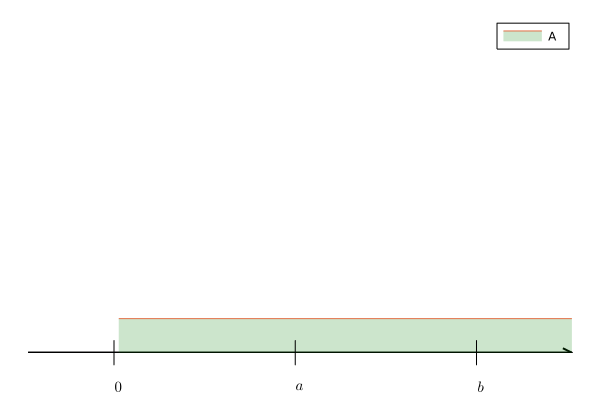

In [4]:
using Plots, LaTeXStrings, Plots.PlotMeasures

f(x) = 0.1

plot([0.3,0.9],[0,0],arrow=true,color=:black,linewidth=2, xticks=false, yticks=false,
     ylims=(0,1), showaxis=false, label="", bottom_margin = 10mm)
plot!(f,0.4,0.9, fill=(0, 0.2, :green), label="A")

annotate!([(0.4,0, (L"|", 17, :black))])
annotate!([(0.6,0, (L"|", 17, :black))])
annotate!([(0.8,0, (L"|", 17, :black))])
annotate!([(0.4,-0.1, (L"0", 10, :black))])
annotate!([(0.6,-0.1, (L"a", 10, :black))])
annotate!([(0.8,-0.1, (L"b", 10, :black))])

# Topology in $\mathbb{R}$

## Real Analysis Course 10  (August 2nd 2022)

#### Definition (Neighborhood)

Let $x_{0} \in m\mathbb{R}$ be fixed and $r > 0$. Then the set

$ I_{r}(x_{0}) = \{x \in \mathbb{R} \ | \ |x-x_{0}| < r\}$

is called neighborhood with center $x_{0}$ amd radius $r$.

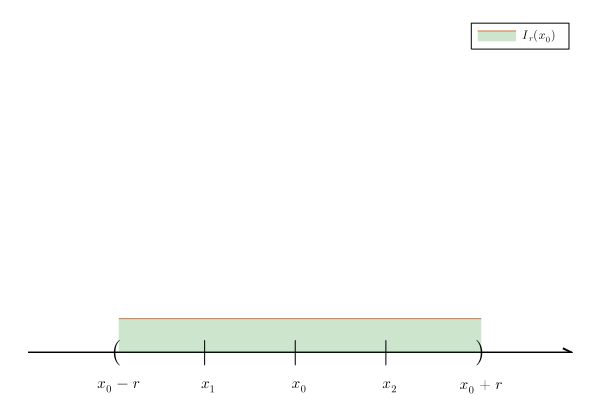

In [11]:
using Plots, LaTeXStrings, Plots.PlotMeasures

f(x) = 0.1

plot([0.3,0.9],[0,0],arrow=true,color=:black,linewidth=2, xticks=false, yticks=false,
     ylims=(0,1), showaxis=false, label="", bottom_margin = 10mm)
plot!(f,0.4,0.8, fill=(0, 0.2, :green), label=L"I_{r}(x_{0})")

annotate!([(0.4,0, (L"(", 17, :black))])
annotate!([(0.5,0, (L"|", 17, :black))])
annotate!([(0.6,0, (L"|", 17, :black))])
annotate!([(0.7,0, (L"|", 17, :black))])
annotate!([(0.8,0, (L")", 17, :black))])
annotate!([(0.4,-0.1, (L"x_{0} - r", 10, :black))])
annotate!([(0.5,-0.1, (L"x_{1} ", 10, :black))])
annotate!([(0.7,-0.1, (L"x_{2}", 10, :black))])
annotate!([(0.6,-0.1, (L"x_{0}", 10, :black))])
annotate!([(0.8,-0.1, (L"x_{0} + r", 10, :black))])

#### Definition (Open Set)

Let $A \subseteq \mathbb{R}$. The $A$ is called an open set if $ ∀x \in A \ ∃ r>0$ such that $I_{r}(x) \subseteq A$



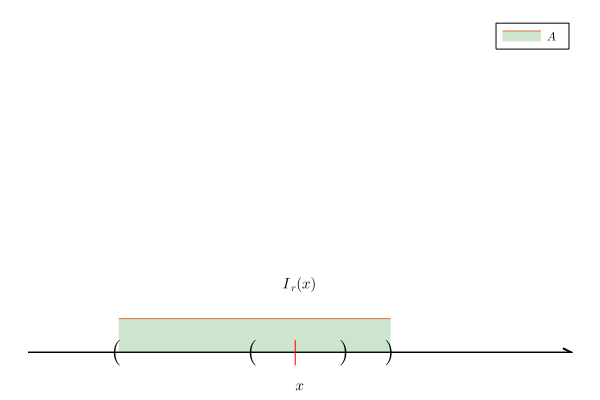

In [15]:
using Plots, LaTeXStrings, Plots.PlotMeasures

f(x) = 0.1

plot([0.3,0.9],[0,0],arrow=true,color=:black,linewidth=2, xticks=false, yticks=false,
     ylims=(0,1), showaxis=false, label="", bottom_margin = 10mm)
plot!(f,0.4,0.7, fill=(0, 0.2, :green), label=L"A")

annotate!([(0.4,0, (L"(", 17, :black))])
annotate!([(0.55,0, (L"(", 17, :black))])
annotate!([(0.6,0, (L"|", 17, :red))])
annotate!([(0.65,0, (L")", 17, :black))])
annotate!([(0.7,0, (L")", 17, :black))])
annotate!([(0.6,0.2, (L"I_{r}(x)", 10, :black))])
annotate!([(0.6,-0.1, (L"x", 10, :black))])


#### Examples

$(a,b) = \{x \in \mathbb{R} | a < x < b \} \quad [a,b]=\{ x \in \mathbb{R} | a \le x \le b\}$

$A = (0,1) = \{ x \in \mathbb{R} | 0 < x < 1 \}$

$x \in A \quad r=\min\{x,1-x\} \quad y \in I_{r}(x)$

\begin{equation}
|y-x|<r
\begin{cases}
x \quad -x < y-x < x \\
\quad |y-x| < x
1-x \quad 0 < y < 2x  
\end{cases}
\end{equation}

$|y-x|$ is modulus of $y-x$ less than $x$

$-1 < y < 1$ ($y$ is bounded from below by -1 and from above by 1)

$0 < y < 1$

$y \in A → I_{r} (x) \subseteq A$

$x \neq 0,1$

$A = (a,b)$ are open sets $∀ a <b$ in $\mathbb{R}$

\begin{equation}
\begin{pmatrix}
∀x \in (a,b) \\
r = \min\{x-a, b-x\}
\end{pmatrix}
\end{equation}

$A=[a,b)=\{x \in \mathbb{R} | a \le x < b\}$ is not open

$x=a \quad r>0 \quad I_{r} (a) = (a-r, a+r)$ and $a - \frac{r}{L} < a → a - \frac{r}{2} \notin A$

#### Definition (Closed Set)

$A \subseteq \mathbb{R}$ is called closed set if its complementary is Open.

$A=[a,b) \ a<b \quad A^{c} = (- \infty, a) \cup [b, + \infty)$ is not open $ → [a,b)$ is not closed.

$A^{c}$ is $A$ complementary.

#### Proposition 

The union of an arbitrary family of open sets is an open set.

Consider

\begin{equation}
\begin{split}
A & = \{A \subseteq \mathbb{R} | A \ \text{is open} \}
\ & = \{A_{\alpha} \subseteq \mathbb{R} \ \text{open} | \alpha \ \text{is an index}\}
\end{split}
\end{equation}

then

$A = \cup_{\alpha} A_{\alpha}$ is an open set.

#### Proof

Let $x \in A → ∃ \bar{\alpha}$ such that $x \in A_{\bar{\alpha}}$ but $A_{\bar{\alpha}}$ is open $→ ∃ r > 0$

$I_{r} (x) \subseteq A_{\bar{\alpha}} \subseteq{A} → I_{r} (x) \subseteq A$

$A_{n} = (-\frac{1}{n}, 1)$ with $n \in \mathbb{N}$

$A = \{A_{n} \subset \mathbb{R} | n \in \mathbb{N}\}$

$A_{n}$ are open $ \cup_{n \in \mathbb{N}} A_{n}$ is an open set.

Analyzing the graph below:
We have the interval of $(-1,1)$

Thus, $A = \cap_{n \mathbb{N}} A_{n} = [0,1)$

$∀n \quad A_{n+1} \subset A_{n}$

1) $A \subseteq [0,1)$

2) $A \supseteq [0,1)$

From 1) and 2) above $→ A=[0,1)$

To prove 2):
$[0,1) \subseteq A \quad [0,1) \subseteq A_{n} \ ∀ n \in \mathbb{N}$


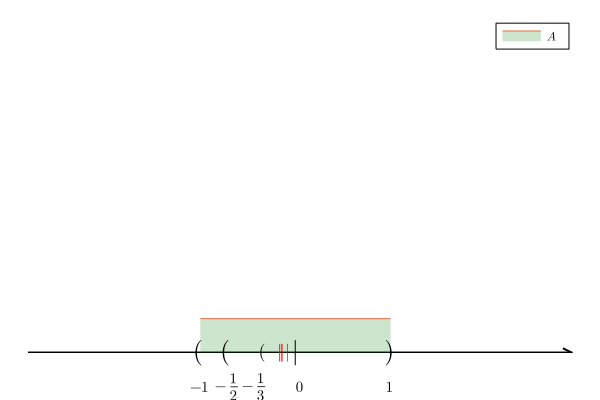

In [11]:
using Plots, LaTeXStrings, Plots.PlotMeasures

f(x) = 0.1

plot([0.3,0.9],[0,0],arrow=true,color=:black,linewidth=2, xticks=false, yticks=false,
     ylims=(0,1), showaxis=false, label="", bottom_margin = 10mm)
plot!(f,0.49,0.7, fill=(0, 0.2, :green), label=L"A")

annotate!([(0.49,0, (L"(", 17, :black))])
annotate!([(0.52,0, (L"(", 17, :black))])
annotate!([(0.56,0, (L"(", 12, :black))])
annotate!([(0.581,0, (L"|", 12, :red))])
annotate!([(0.583,0, (L"|", 12, :red))])
annotate!([(0.584,0, (L"|", 12, :red))])
annotate!([(0.59,0, (L"|", 12, :red))])
annotate!([(0.6,0, (L"|", 17, :black))])
annotate!([(0.7,0, (L")", 17, :black))])
annotate!([(0.49,-0.1, (L"-1", 10, :black))])
annotate!([(0.52,-0.1, (L"-\frac{1}{2}", 10, :black))])
annotate!([(0.55,-0.1, (L"-\frac{1}{3}", 10, :black))])
annotate!([(0.6,-0.1, (L"0", 10, :black))])
annotate!([(0.7,-0.1, (L"1", 10, :black))])

1) $A \subseteq [0,1)$ or equivalently $([0,1))^{c} \subseteq A^{c}$

$([0,1))^{c} = (- \infty, 0) \cup [1,+ \infty)$

* $x < 0 \quad ∃ \bar{n} \in \mathbb{N}$ such that $x< -\frac{1}{n} < 0 → x \notin A_{\bar{n}} → x \notin A \quad x \in A^{c}$

* $x \ge 1 \quad x \notin A_{n} \quad ∀ n \in \mathbb{N} → x \in A^{c}$

$A \subseteq [0,1)$

#### Proposition

Let $A_{1}, \dots, A_{k} \subseteq \mathbb{R}$ open sets, with $k \in \mathbb{N}$ fixed (finite number of open sets), then

$A = \cap_{i=1}^{k} A_{i}$

is an open set.

#### Proof

Let $x \in A → x \in A_{i} \quad ∀ i=1,\dots,k$

Since $A_{i}$ is open $∃ r_{i} > 0$ (there exists a radius)

$I_{r_{i}} (x) \subseteq A_{i} \quad ∀ i=1, \dots, k$

Note that in general $r_{i} \neq r_{j}$ if $i \neq j \quad i,j = 1, \dots, k$

Consider:

$r = \min\{r_{1}, \dots, r_{k}\} > 0$

$I_{r} (x) \subseteq I_{r_{i}} (x) \subseteq A_{i} \quad ∀ i = 1, \dots, k → I_{r} (x) \subset A_{i} \ ∀i$

$ I_{r} (x) \subseteq \cap_{i=1}^{k} A_{i}$

The interval

$C = [a,b]$ is closed since $C^{c} = (- \infty, a) \cup (b, + \infty)$ is the union of two open sets. 

with $a < b$

* $a=b$

$C = \{a\}$ is closed since $C^{c} = (- \infty, a) \cup (a, + \infty)$ is the union of two open sets.

#### Proposition

The interaction of an arbitrary family of closed sets is a closed set.

#### Proof

Consider the family $C=\{C_{\alpha}\}_{\alpha} → A =\{A_{\alpha}\}_{\alpha} \quad A_{\alpha} = C_{\alpha}^{c}$.

Since $C_{\alpha}$ is closed $→ A_{\alpha}$ is open.

$\cap_{\alpha} C_{\alpha} = \cap_{\alpha} A_{\alpha}^{c} = \cap(\mathbb{R} \setminus A_{\alpha}) = \mathbb{R} \setminus (\cup_{\alpha} A_{\alpha}) = \mathbb{R} \setminus A = A^{c}$

$\cup_{\alpha} A_{\alpha}$ is an open set.

$\cap_{\alpha} C_{\alpha}$ is the complementary of an open set.

#### Proposition

The finite union of closed sets is a closed set.

#### Proof

Let $X$ be a metric space with distance function $d(p,q)$. If $F_{i} \subset X$ is closed for $1 \le i \le n$, prove that $\cup_{i=1}^{n} F_{i}$ is also closed.

For any $p \in X$, the neighborhood $N_{r} (p)$ is the set $\{x \in X | d(p,x) < r\}$.

Any $p \in X$ is a limit point of $E$ if $∀r>0, \ N_{r} (p) \cap E \neq \{p\}$ and $E \neq ø$.

* Any subset $E$ of $X$ is closed if it contains all of its limit points.

* Let $F$ and $G$ be two closed sets and let $x$ be a limit point of $F \cup G$. Now, if $x$ is a limit point of $F$ and $G$ it is clearly contained in $F \cup G$.

Suppose that $x$ is not a limit point of $F$ and $G$ both. Thus, there are radii $\alpha$ and $\beta$ such that $N_{\alpha} (x)$ and $N_{\beta} (x)$ don't intersect with $F$ and $G$ respectively except possibly for $x$, which contradicts $x$ being a limit point.

The proof can be extended easily to finitely many closed sets.

#### Remark

* $\mathbb{R}$ is open

* $ø$ is open ($∀x \in ø \ ∃r \dots $)

* $\mathbb{R}$ is closed

* $ø$ is closed

#### Definition (Limit Point)

Given $A \subseteq \mathbb{R}$, we say that $x_{0} \in \mathbb{R}$ is a limit point for $A$ if $∀ r > 0 \quad I_{r} (x_{0})$ contain at least one point of $A$ except $x_{0}$.

$A = (0,1) \quad x_{0}=1$ is a limit point.

Indeed take $r>0$

$I_{r} (1) = \{x \in \mathbb{R} | |x-1|<r\} = (1-r,1+r)$

$1-r<1$

$1-r + \varepsilon < 1$

$1-r + \varepsilon \in (0,1)$

$r + \varepsilon < 1$


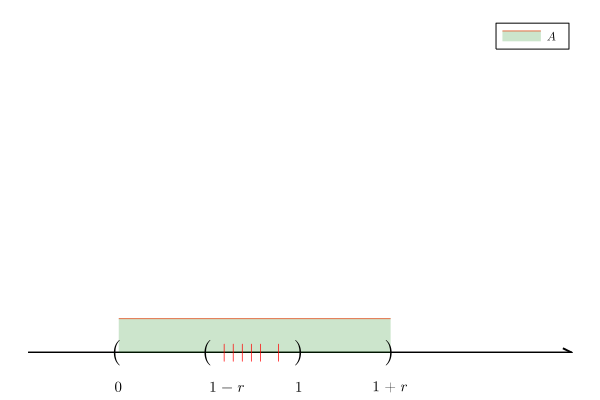

In [18]:
using Plots, LaTeXStrings, Plots.PlotMeasures

f(x) = 0.1

plot([0.3,0.9],[0,0],arrow=true,color=:black,linewidth=2, xticks=false, yticks=false,
     ylims=(0,1), showaxis=false, label="", bottom_margin = 10mm)
plot!(f,0.4,0.7, fill=(0, 0.2, :green), label=L"A")

annotate!([(0.4,0, (L"(", 17, :black))])
annotate!([(0.5,0, (L"(", 17, :black))])
annotate!([(0.52,0, (L"|", 12, :red))])
annotate!([(0.53,0, (L"|", 12, :red))])
annotate!([(0.54,0, (L"|", 12, :red))])
annotate!([(0.55,0, (L"|", 12, :red))])
annotate!([(0.56,0, (L"|", 12, :red))])
annotate!([(0.58,0, (L"|", 12, :red))])
annotate!([(0.6,0, (L")", 17, :black))])
annotate!([(0.7,0, (L")", 17, :black))])
annotate!([(0.4,-0.1, (L"0", 10, :black))])
annotate!([(0.52,-0.1, (L"1-r", 10, :black))])
annotate!([(0.6,-0.1, (L"1", 10, :black))])
annotate!([(0.7,-0.1, (L"1+r", 10, :black))])

$A=(a,b) \quad a \le c \le b \quad c$ is a limit point.

$A = \{x \in \mathbb{R} | x = \frac{1}{n}, \ n \in \mathbb{N}\}$ and $x_{0} = 0$

$∀ r > 0 \quad ∃n \in \mathbb{N}$ such that $\frac{1}{n} < r$

$I_{r} (0) = \{x \in \mathbb{R} | |x| < r\} = (-r,r)$

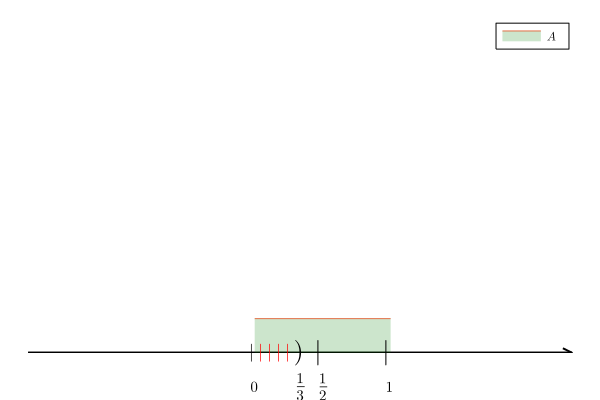

In [27]:
using Plots, LaTeXStrings, Plots.PlotMeasures

f(x) = 0.1

plot([0.3,0.9],[0,0],arrow=true,color=:black,linewidth=2, xticks=false, yticks=false,
     ylims=(0,1), showaxis=false, label="", bottom_margin = 10mm)
plot!(f,0.55,0.7, fill=(0, 0.2, :green), label=L"A")

annotate!([(0.55,0, (L"|", 12, :black))])
annotate!([(0.56,0, (L"|", 12, :red))])
annotate!([(0.57,0, (L"|", 12, :red))])
annotate!([(0.58,0, (L"|", 12, :red))])
annotate!([(0.59,0, (L"|", 12, :red))])
annotate!([(0.6,0, (L")", 17, :black))])
annotate!([(0.625,0, (L"|", 17, :black))])
annotate!([(0.7,0, (L"|", 17, :black))])
annotate!([(0.55,-0.1, (L"0", 10, :black))])
annotate!([(0.6,-0.1, (L"\frac{1}{3}", 10, :black))])
annotate!([(0.625,-0.1, (L"\frac{1}{2}", 10, :black))])
annotate!([(0.7,-0.1, (L"1", 10, :black))])

$x_{0} = 1$ is not a limit point.

$∀ r$ such that $1 - r > \frac{1}{2}$

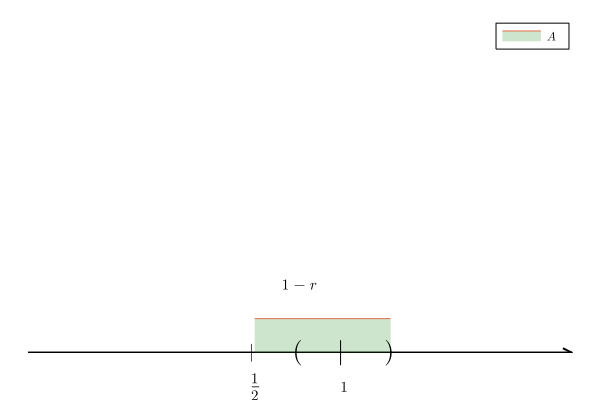

In [30]:
using Plots, LaTeXStrings, Plots.PlotMeasures

f(x) = 0.1

plot([0.3,0.9],[0,0],arrow=true,color=:black,linewidth=2, xticks=false, yticks=false,
     ylims=(0,1), showaxis=false, label="", bottom_margin = 10mm)
plot!(f,0.55,0.7, fill=(0, 0.2, :green), label=L"A")

annotate!([(0.55,0, (L"|", 12, :black))])
annotate!([(0.6,0, (L"(", 17, :black))])
annotate!([(0.65,0, (L"|", 17, :black))])
annotate!([(0.7,0, (L")", 17, :black))])
annotate!([(0.55,-0.1, (L"\frac{1}{2}", 10, :black))])
annotate!([(0.6,0.2, (L"1-r", 10, :black))])
annotate!([(0.65,-0.1, (L"1", 10, :black))])


$A=\{x \in \mathbb{R} | x = (-1)^{n} \frac{n}{n-1} \quad ∀ n \ge 2, \ n \in \mathbb{N}\}$


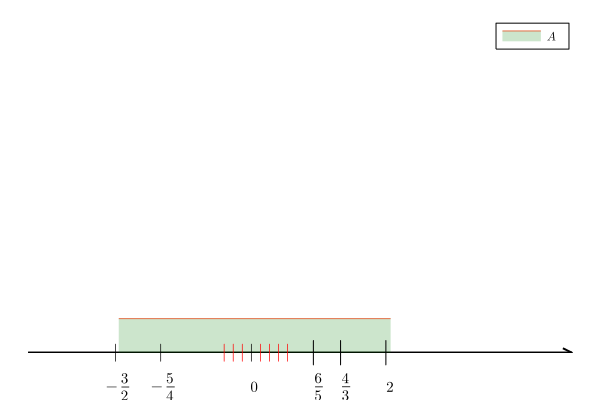

In [41]:
using Plots, LaTeXStrings, Plots.PlotMeasures

f(x) = 0.1

plot([0.3,0.9],[0,0],arrow=true,color=:black,linewidth=2, xticks=false, yticks=false,
     ylims=(0,1), showaxis=false, label="", bottom_margin = 10mm)
plot!(f,0.4,0.7, fill=(0, 0.2, :green), label=L"A")

annotate!([(0.4,0, (L"|", 12, :black))])
annotate!([(0.45,0, (L"|", 12, :black))])
annotate!([(0.52,0, (L"|", 12, :red))])
annotate!([(0.53,0, (L"|", 12, :red))])
annotate!([(0.54,0, (L"|", 12, :red))])
annotate!([(0.55,0, (L"|", 12, :black))])
annotate!([(0.56,0, (L"|", 12, :red))])
annotate!([(0.57,0, (L"|", 12, :red))])
annotate!([(0.58,0, (L"|", 12, :red))])
annotate!([(0.59,0, (L"|", 12, :red))])
annotate!([(0.62,0, (L"|", 17, :black))])
annotate!([(0.65,0, (L"|", 17, :black))])
annotate!([(0.7,0, (L"|", 17, :black))])
annotate!([(0.55,-0.1, (L"0", 10, :black))])
annotate!([(0.4,-0.1, (L"-\frac{3}{2}", 10, :black))])
annotate!([(0.45,-0.1, (L"-\frac{5}{4}", 10, :black))])
annotate!([(0.62,-0.1, (L"\frac{6}{5}", 10, :black))])
annotate!([(0.65,-0.1, (L"\frac{4}{3}", 10, :black))])
annotate!([(0.7,-0.1, (L"2", 10, :black))])

Claim:

$x_{0} = 1$ and $x_{0} = -1$ are both limit point.

#### Proposition

If $x_{0}$ is a limit point for $A$ then every neighborhood $I_{r} (x_{0}$ contains infinitely many points of $A$.

#### Proof

Assume $∃ r > 0$ such that $ I_{r} (x_{0})$ only finite number of elements of $A$.

$a_{1}, \dots, a_{N} \in A, \quad N \in \mathbb{N}$ fixed

$a_{j} \neq x_{0}$

$|x - a_{j}| > 0 \quad ∀j=1, \dots ,N$.

Define $d = \min_{j=1, \dots,N}|x-a_{j}|$

Consider $I_{\frac{d}{2}} (x_{0})$ contains no points of $A →$ this is a contradiction with the definition of limit point. 

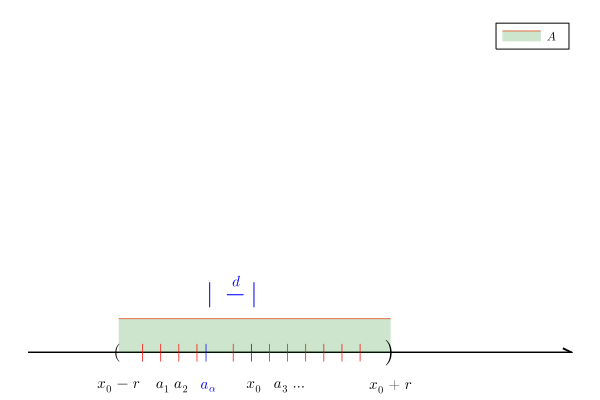

In [62]:
using Plots, LaTeXStrings, Plots.PlotMeasures

f(x) = 0.1

plot([0.3,0.9],[0,0],arrow=true,color=:black,linewidth=2, xticks=false, yticks=false,
     ylims=(0,1), showaxis=false, label="", bottom_margin = 10mm)
plot!(f,0.4,0.7, fill=(0, 0.2, :green), label=L"A")

annotate!([(0.4,0, (L"(", 12, :black))])
annotate!([(0.43,0, (L"|", 12, :red))])
annotate!([(0.45,0, (L"|", 12, :red))])
annotate!([(0.47,0, (L"|", 12, :red))])
annotate!([(0.49,0, (L"|", 12, :red))])
annotate!([(0.5,0, (L"|", 12, :blue))])
annotate!([(0.53,0, (L"|", 12, :red))])
annotate!([(0.55,0, (L"|", 12, :blue))])
annotate!([(0.57,0, (L"|", 12, :red))])
annotate!([(0.59,0, (L"|", 12, :red))])
annotate!([(0.61,0, (L"|", 12, :red))])
annotate!([(0.63,0, (L"|", 12, :red))])
annotate!([(0.65,0, (L"|", 12, :red))])
annotate!([(0.67,0, (L"|", 12, :red))])
annotate!([(0.7,0, (L")", 17, :black))])
annotate!([(0.53,0.17, (L"|-|", 17, :blue))])
annotate!([(0.53,0.21, (L"d", 10, :blue))])
annotate!([(0.45,-0.1, (L"a_{1}", 10, :black))])
annotate!([(0.47,-0.1, (L"a_{2}", 10, :black))])
annotate!([(0.5,-0.1, (L"a_{\alpha}", 10, :blue))])
annotate!([(0.55,-0.1, (L"x_{0}", 10, :black))])
annotate!([(0.58,-0.1, (L"a_{3}", 10, :black))])
annotate!([(0.6,-0.1, (L"\dots", 10, :black))])
annotate!([(0.4,-0.1, (L"x_{0} - r", 10, :black))])
annotate!([(0.7,-0.1, (L"x_{0} + r", 10, :black))])

## Real Analysis Course 11 (August 3rd 2022)

#### Theorem

Let $C \in \mathbb{R}$ be a subset of $\mathbb{R}$, then the following are equivalent

1) $C$ is closed

2) $C$ contains all its limit points

#### Proof

1) $→$ 2) Let $x \in \mathbb{R}$ be a limit point for $C$.

By contradiction, assume $x \notin C → C^{c}$ is open $→ ∃r > 0$ such that

$I_{r} (x) \subseteq C^{c}$

but this is a contradiction with the fact that $x$ is a limit point.

$x \in C$

2) $→$ 1) assume that $C$ contains all its limit points.

Assume $C^{c}$ is not open $∃x \in C^{c} ( x \notin C)$ such that $∀ r > 0 \quad I_{r} (x) \nsubseteq C^{c} → I_{r} (x)$ contains points of $C → x$ is a limit point for $C$.

Contradiction.

$x \in C$

$C^{c}$ is open $→ \ C$ is closed 

#### Definition (Closure of a set)

Let $A \subseteq \mathbb{R}$. Define

$\bar{A} = \cap \{ C \subseteq \mathbb{R} | C \ \text{is closed}, \ A \subseteq C\}$

$\bar{A}$ is closure of $A$.

$\bar{A}$ is a closed set.

#### Theorem

Let $A \subseteq \mathbb{R}$ be a subset of $\mathbb{R}$, then the following are equivalent

1) $A$ is closed

2) $A = \bar{A}$

#### Theorem

Let $A \subseteq \mathbb{R}$ be a subset of $\mathbb{R}$. Define $Д_{A} = \{x \in \mathbb{R} | x \ \text{is a limit point of} \ A\}$ (Д is the cyrillic of D).

Then

$\bar{A} = A \cup Д_{A}$

#### Example

Consider $\mathbb{Q} \subset \mathbb{R}$. $\mathbb{Q}$ is not open.

Consider $r \in \mathbb{Q}$ and $\varepsilon > 0$

$\mathbb{Q}$ is not closed, $\mathbb{R} \setminus \mathbb{Q}$ is not open.

$\bar{\mathbb{Q}} = \mathbb{R}$

* $\bar{\mathbb{Q}} \subseteq \mathbb{R}$ is trivial

* $\mathbb{R} \subseteq \bar{\mathbb{Q}} $ assume that $x \in \mathbb{R}$ but $x \notin \bar{\mathbb{Q}}$

$\bar{\mathbb{Q}}$ is a closed set.

* $\mathbb{R} \setminus \bar{\mathbb{Q}}$ is open $∃ \varepsilon > 0$ such that $I_{\varepsilon} (x) \subseteq \mathbb{R} \setminus \bar{\mathbb{Q}}$

$∃ q \in \mathbb{Q}$ such that $q \in I_{\varepsilon} (x)$

Contradiction. 

$x \in \mathbb{Q}$

$\bar{\mathbb{Q}} = \mathbb{R}$

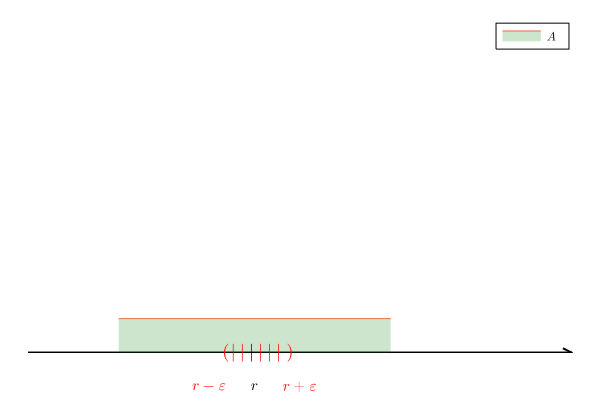

In [6]:
using Plots, LaTeXStrings, Plots.PlotMeasures

f(x) = 0.1

plot([0.3,0.9],[0,0],arrow=true,color=:black,linewidth=2, xticks=false, yticks=false,
     ylims=(0,1), showaxis=false, label="", bottom_margin = 10mm)
plot!(f,0.4,0.7, fill=(0, 0.2, :green), label=L"A")

annotate!([(0.52,0, (L"(", 12, :red))])
annotate!([(0.53,0, (L"|", 12, :red))])
annotate!([(0.54,0, (L"|", 12, :red))])
annotate!([(0.55,0, (L"|", 12, :black))])
annotate!([(0.56,0, (L"|", 12, :red))])
annotate!([(0.57,0, (L"|", 12, :red))])
annotate!([(0.58,0, (L"|", 12, :red))])
annotate!([(0.59,0, (L")", 12, :red))])
annotate!([(0.5,-0.1, (L"r - \varepsilon", 10, :red))])
annotate!([(0.6,-0.1, (L"r + \varepsilon", 10, :red))])
annotate!([(0.55,-0.1, (L"r", 10, :black))])

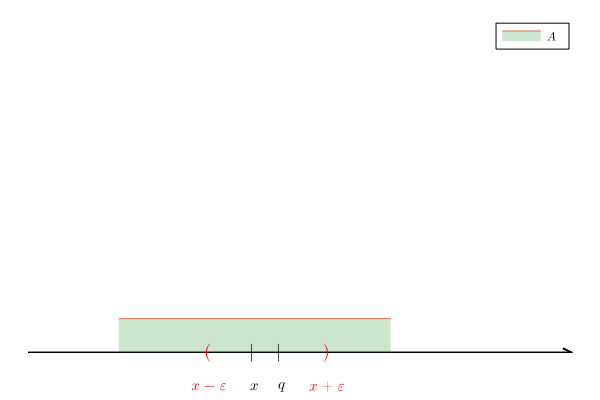

In [9]:
using Plots, LaTeXStrings, Plots.PlotMeasures

f(x) = 0.1

plot([0.3,0.9],[0,0],arrow=true,color=:black,linewidth=2, xticks=false, yticks=false,
     ylims=(0,1), showaxis=false, label="", bottom_margin = 10mm)
plot!(f,0.4,0.7, fill=(0, 0.2, :green), label=L"A")

annotate!([(0.5,0, (L"(", 12, :red))])
annotate!([(0.55,0, (L"|", 12, :black))])
annotate!([(0.58,0, (L"|", 12, :black))])
annotate!([(0.63,0, (L")", 12, :red))])
annotate!([(0.5,-0.1, (L"x - \varepsilon", 10, :red))])
annotate!([(0.63,-0.1, (L"x + \varepsilon", 10, :red))])
annotate!([(0.55,-0.1, (L"x", 10, :black))])
annotate!([(0.58,-0.1, (L"q", 10, :black))])

#### Theorem (Bolzano-Weierstrass)

Let $E \subseteq \mathbb{R}$. Assume that $E$ is bounded and infinite. Then $E$ has at least one limit point.

#### Proof

$∃ a,b \in \mathbb{R} \quad a < b$ such that $E \subseteq[a,b]$ ($E$ is bounded).

\begin{equation}
\begin{split}
[a,b] & = E_{1} \cup E_{2} \\
E_{1} & = [a, \frac{a+b}{2}) \\
E_{2} & = [\frac{a+b}{2},b]
\end{split}
\end{equation}

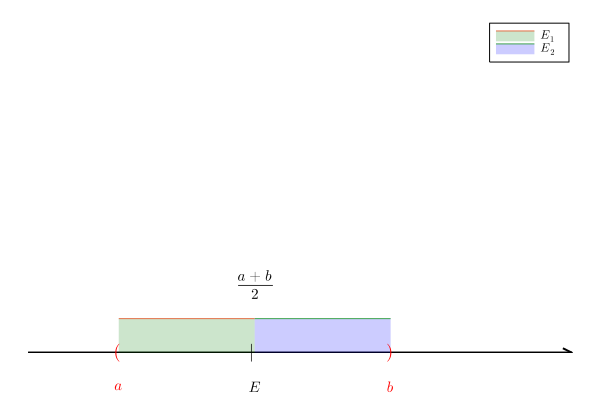

In [16]:
using Plots, LaTeXStrings, Plots.PlotMeasures

f(x) = 0.1

plot([0.3,0.9],[0,0],arrow=true,color=:black,linewidth=2, xticks=false, yticks=false,
     ylims=(0,1), showaxis=false, label="", bottom_margin = 10mm)
plot!(f,0.4,0.55, fill=(0, 0.2, :green), label=L"E_{1}")
plot!(f,0.55,0.7, fill=(0, 0.2, :blue), label=L"E_{2}")


annotate!([(0.4,0, (L"(", 12, :red))])
annotate!([(0.55,0, (L"|", 12, :black))])
annotate!([(0.7,0, (L")", 12, :red))])
annotate!([(0.4,-0.1, (L"a", 10, :red))])
annotate!([(0.7,-0.1, (L"b", 10, :red))])
annotate!([(0.55,-0.1, (L"E", 10, :black))])
annotate!([(0.55,0.2, (L"\frac{a+b}{2}", 10, :black))])


$E_{1}$ or $E_{2}$ contain infinite elements of $E!$ ($E$ is infinite).

Say $E_{1}$, define $a_{1}$ and $b_{1}$

$a_{1} = a$

$b_{1} = \frac{a+b}{2}$

We will introduce:

$E_{3} = [a_{1}, \frac{a_{1} + b_{1}}{2})$

$E_{4} = [\frac{a_{1} + b_{1}}{2}, b_{1})$

Some procedure produce $[a_{2}, b_{2}]$

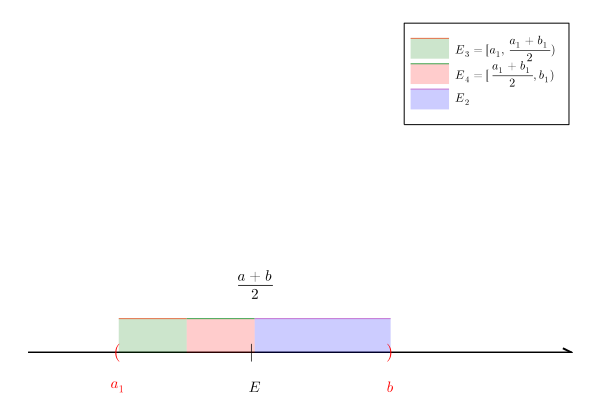

In [20]:
using Plots, LaTeXStrings, Plots.PlotMeasures

f(x) = 0.1

plot([0.3,0.9],[0,0],arrow=true,color=:black,linewidth=2, xticks=false, yticks=false,
     ylims=(0,1), showaxis=false, label="", bottom_margin = 10mm)
plot!(f,0.4,0.475, fill=(0, 0.2, :green), label=L"E_{3} = [a_{1}, \frac{a_{1} + b_{1}}{2})")
plot!(f,0.475,0.55, fill=(0, 0.2, :red), label=L"E_{4} = [\frac{a_{1} + b_{1}}{2}, b_{1})")
plot!(f,0.55,0.7, fill=(0, 0.2, :blue), label=L"E_{2}")

annotate!([(0.4,0, (L"(", 12, :red))])
annotate!([(0.55,0, (L"|", 12, :black))])
annotate!([(0.7,0, (L")", 12, :red))])
annotate!([(0.4,-0.1, (L"a_{1}", 10, :red))])
annotate!([(0.7,-0.1, (L"b", 10, :red))])
annotate!([(0.55,-0.1, (L"E", 10, :black))])
annotate!([(0.55,0.2, (L"\frac{a+b}{2}", 10, :black))])


We construct

$a \le a_{1} \le a_{2} \le \dots \le a_{k} \le \dots$

$b \ge b_{1} \ge b_{2} \ge \dots \ge b_{k} \ge \dots$

Thus,

$[a_{k}, b_{k}] \quad |b_{k} - a_{k}| = \frac{b-a}{2^{k}}  \quad ∀k$

$a_{k} \le b_{k}$

$A = \{a_{k} | k \in \mathbb{N}\} \subseteq E$

$B = \{b_{k} | k \in \mathbb{n}\} \subseteq E$

$A$ and $B$ are bounded.

$\sup(A) \le b_{k} \quad ∀k$
$\inf(B) \ge a_{k} \quad ∀k$

$\inf(B) - \sup(A) \ge b_{k} - a_{k} \ge 0$

$0 \le \inf(B) - \sup(A) \ge \frac{b-a}{2^{k}}$

Assume $\inf(B) - \sup(A) = \varepsilon > 0$

$\inf(B) = \sup(A) = L$

$0 < \varepsilon \le \frac{b-a}{2^{k} \le \frac{b-a}{k}} \quad ∀k \in \mathbb{N}$

For $\varepsilon \le \frac{b-a}{k} \quad N \in \mathbb{N}$ such that $0 < \frac{b-a}{N} < \varepsilon$ it generates a contradiction.

By Archimedean Property $\varepsilon$ and $b-a \quad ∃n \in \mathbb{N}$ such that

$0 < \frac{b-a}{N} < \varepsilon$

$L$ is a limit point for $E$.

$a_{k} \le L \le b_{k} \quad ∀ k \in \mathbb{N}$

Fix $r>0$ and take $k$ such that $\frac{b-a}{2k} < 2r$. $[a_{k}, b_{k}]$ by constructs contains infinitely many point of $E$ and

$[a_{k}, b_{k}] \subset I_{r} (L)$.

$I_{r} (L)$ contains infinitely many points of $E$.

#### Definition

The point $x_{0} \in \mathbb{R}$ is a boundary point for $A \subseteq \mathbb{R}$ if $∀r > 0, \ I_{r} (x_{0})$ contains both points of $A$ and $A^{c}$. The set of all boundary points is called boundary of $бA$ (б is the cyrillic of b).

$I_{r} (x_{0})$ is a neighborhood with radius $r$ and center at $x_{0}$.

#### Theorem

$\mathbb{R}$ is uncountable.

#### Proof

Let $f: \mathbb{N} → \mathbb{R}$ be one to one, then $f$ is not onto.

Consider a bijection from $\mathbb{R}$ to $(0,1) \ (g(x) = \frac{1}{\pi}(\frac{\pi}{2} + \arctan(x)))$

it is enough to prove that $\nexists$ surjective function $1:1 \ f:\mathbb{N} → (0,1)$

$f: \mathbb{N} →(0,1) \quad 1:1$

\begin{equation}
\begin{split}
f(1) & = 0, a_{1}^{1}, a_{2}^{1}, a_{3}^{1}, \dots, a_{j}^{1}, \dots \\
f(2) & = 0, a_{1}^{2}, a_{2}^{2}, a_{3}^{2}, \dots, a_{j}^{2}, \dots \\
\vdots \\
f(n) & = 0, a_{1}^{n}, a_{2}^{n}, a_{3}^{n}, \dots, a_{j}^{n}, \dots \\
\vdots
\end{split}
\end{equation}

$∃ x \in (0,1)$ such that $x \neq f(n) \quad ∀n \in \mathbb{N}$

$x = 0,b_{1}, b_{2}, \dots$

$b_{1} \notin \{a_{1}^{1}, 9\}$

For instance, assume that:

$a_{1}^{1} = 1, \quad b_{1} \neq 1, \quad b_{2} \notin \{a_{2}^{2},9\}, \dots b_{n} \notin \{a_{n}^{n}, 9\}$

$a_{1}^{1} \neq 1 \quad b_{1} = 1$

Thus

$x \neq f(n) \quad ∀n$

# Complex Numbers $\mathbb{C}$

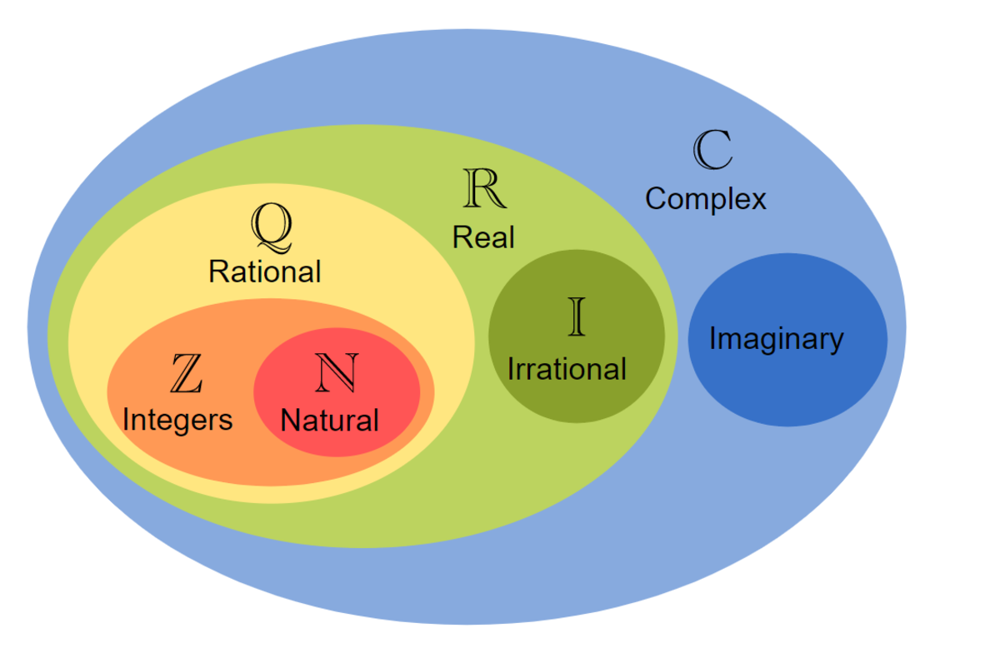

$x^{2} + 1 = 0 \quad \nexists x \in \mathbb{R}$ that solves the equation.

$x^{\frac{m}{n}}$ if $x < 0$ and $n$ even?

Introduce a quantity $i$ such that

$i^{2} = -1$ (imaginary unity)

$z = a + ib$ (complex number)

$a,b \in \mathbb{R}$

* In order to define a complex number you need 2 real numbers.

$z ↔ (a,b) \quad \mathbb{C} \cong \mathbb{R}^{2} = \mathbb{R} \times \mathbb{R}$

### Sum Operation on $\mathbb{R}^{2}$ (also on $\mathbb{C}$)

$(a_{1}, b_{1}), (a_{2}, b_{2}) \in \mathbb{R}^{2} \quad (a_{1}, b_{1}) \pm (a_{2}, b_{2}) = (a_{1} \pm a_{2}, b_{1} \pm b_{2})$

### New structure on $\mathbb{R}^{2}$ "Product"

$(a_{1}, b_{1}), (a_{2}, b_{2}) \in \mathbb{R}^{2}$

$(a_{1}, b_{1}) \cdot (a_{2}, b_{2}) = (a_{1}a_{2} - b_{1}b_{2}, a_{1}b_{2} + a_{2}b_{1}) \in \mathbb{R}^{2}$

We define the set of complex numbers as $\mathbb{R}^{2}$ endowed with the sum and "product" operations ($\mathbb{C}$ is a field).

1) "+" and "$\cdot$" are commutative and associative

2) Distributive property

$(a_{1}, b_{1}) \cdot ( (a_{2}, b_{2}) + (a_{3}, b_{3}) ) = (a_{1}, b_{1}) \cdot (a_{2}, b_{2}) + (a_{1}, b_{1}) \cdot (a_{3}, b_{3})$

3) Identity

$(a,b) \cdot (1,0) = (a,b)$

$(a,b) + (0,0) = (a,b) $

4) Opposite

$(a,b) + (-a,-b) = (0,0)$

5) Inverse $∀ \ (a,b) \neq (0,0) \ ∃ (c,d)$ such that

$(a,b) \cdot (c,d) = (1,0)$

$(c,d) = \left( \frac{a}{a^{2}+b^{2}} \ , - \frac{b}{a^{2}+b^{2}} \right)$

$z_{1} = a_{1} + ib_{1} \quad z_{2} = a_{2} + ib_{2}$ (the sum is trivial)

\begin{equation}
\begin{split}
z_{1} \cdot z_{2} = (a_{1} + ib_{1}) \cdot (a_{2} + ib_{2}) & = a_{1}a_{2} + ia_{1}b_{2} + ia_{2}b_{1} + i^{2}b_{1}b_{2} \\
\ & = a_{1}a_{2}  - b_{1}b_{2} + i(a_{2}b_{1} + a_{1}b_{2})
\end{split}
\end{equation}

#### Remarks

1) $\mathbb{R} \subset \mathbb{C}$ since $∀x \in \mathbb{R} \quad (x,0) \in \mathbb{C}$

2) "$(0,1) \notin \mathbb{R}$" for sure $(0,1) \in \mathbb{C} \quad (0,1) \cdot (0,1)=$

$(0 \cdot 0 - 1 \cdot 1, 0 \cdot 1 - 0 \cdot 1) = (-1,0) \in \mathbb{R}$

$i = (0,1) \in \mathbb{C} \quad i^{2} = -1$

$(a,b) \in \mathbb{C} \quad z = a + ib$ is called the algebraic form of a complex number.

$a_{i} = $ real part of $z$ ($a = \text{Re}(z)$)

$b_{i} =$ imaginary part of $z \ (b = \text{Im}(z)$) 

$z = 2 + i5 \quad \text{Re}(z) = 2 \quad \text{Im}(z) = 5$

$z = 1 - i4 \quad \text{Re}(z) = 1 \quad \text{Im}(z) = -4$

$z = - 3i \quad \text{Re}(z) = 0 \quad \text{Im}(z) = -3$

$z = 3 \quad \text{Re}(z) = 3 \quad \text{Im}(z) = 0$


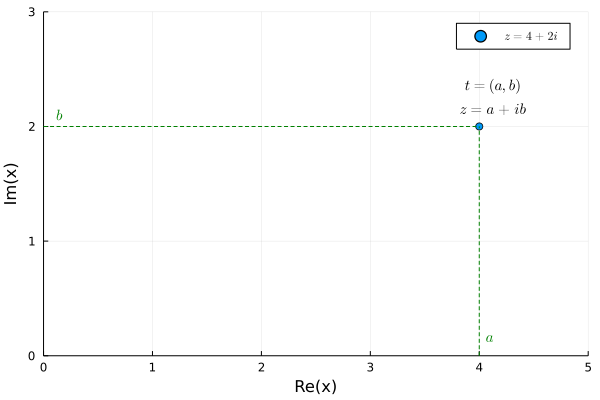

In [71]:
using Plots, LaTeXStrings

z = 4+2im

plot([z], xlims=(0,5), ylims=(0,3), label=L"z = 4 + 2i"; st=:scatter)

# vertical green line connecting the dots
plot!([0,4],[2,2], label="", linecolor=:green, linestyle=:dash)
plot!([4,4],[0,2], label="", linecolor=:green, linestyle=:dash)

annotate!([(4.13,2.35, (L"t = (a,b) ", 10, :black)),
           (4.13,2.15, (L"z = a + ib", 10, :black)),
           (4.1,0.15, (L"a", 10, :green)),
           (0.15,2.1, (L"b", 10, :green))])

#### Definition

Given $z = a + ib \ \in \mathbb{C}$ we define the conjugate of $z$

$\bar{z} = a - ib$


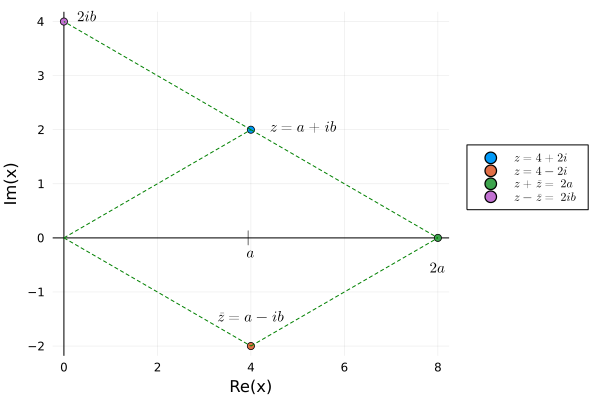

In [84]:
using Plots, LaTeXStrings

z1 = 4+2im
z2 = 4-2im
z3 = z1+z2
z4 = z1-z2

plot([z1], framestyle = :zerolines, label=L"z = 4 + 2i"; st=:scatter, legend=:outerright)
plot!([z2], label=L"z = 4 - 2i"; st=:scatter)
plot!([z3], label=L"z + \bar{z} = \ 2a"; st=:scatter)
plot!([z4], label=L"z - \bar{z} = \ 2ib"; st=:scatter)
    
# vertical green line connecting the dots

plot!([z1,z4], label="", linecolor=:green, linestyle=:dash)
plot!([z1,z3], label="", linecolor=:green, linestyle=:dash)
plot!([z2,z3], label="", linecolor=:green, linestyle=:dash)
plot!([0,4],[0,2], label="", linecolor=:green, linestyle=:dash)
plot!([0,4],[0,-2], label="", linecolor=:green, linestyle=:dash)

annotate!([(5.13,2.05, (L"z = a + ib", 10, :black)),
           (4,-1.45, (L"\bar{z} = a - ib", 10, :black)),
           (0.5,4.1, (L"2ib", 10, :black)),
           (4,0, (L"|", 10, :black)),
           (4,-0.3, (L"a", 10, :black)),
           (8,-0.55, (L"2a", 10, :black))])

#### Properties

1) $\overline{(z_{1} + z_{2})} = \overline{(a_{1} + a_{2} + i(b_{1} + b_{2}))} = (a_{1} + a_{2}) - i(b_{1} + b_{2}) = \bar{z_{1}} + \bar{z_{2}}$

2) 

\begin{equation}
\begin{split}
\overline{z_{1} \cdot z_{2}} & = \overline{(a_{1} + ib_{1}) \cdot (a_{2} + ib_{2})} \\
\ & = \overline{a_{1}a_{2} - b_{1}b_{2} + i(a_{1}b_{2} + a_{2}b_{1})} \\
\ & = a_{1}a_{2} - b_{1}b_{2} - i(a_{1}b_{2} + a_{2}b_{1}) \\
\ & = (a_{1} - ib_{1}) \cdot (a_{2} - i(b_{2}) \\
\ & = \bar{z_{1}} \cdot \bar{z_{2}}
\end{split}
\end{equation}

3) $z \cdot \bar{z} = (a + ib) \cdot (a - ib) = a^{2} + b^{2} -i(ba-ab) = a^{2} + b^{2}$

$\sqrt{a^{2}+b^{2}} = |z|$

$z \cdot \bar{z} = |z|^{2}$

4) $|z| = |\bar{z}|$

5) $|\text{Re}(+)| \le |z|, \ |\text{Im}(t)| \le |z|$

$|a| \le \sqrt{a^{2} + b^{2}}$

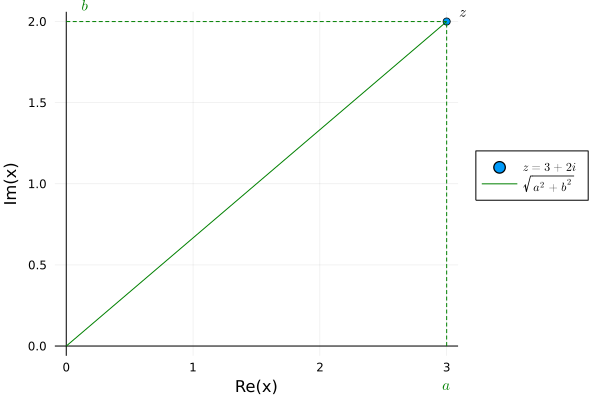

In [82]:
using Plots, LaTeXStrings

z1 = 3+2im


plot([z1], framestyle = :zerolines, label=L"z = 3 + 2i"; st=:scatter, legend=:outerright)
    
# vertical green line connecting the dots

plot!([0,3],[0,2], label=L"\sqrt{a^{2}+b^{2}}", linecolor=:green, linestyle=:solid)
plot!([0,3],[2,2], label="", linecolor=:green, linestyle=:dash)
plot!([3,3],[0,2], label="", linecolor=:green, linestyle=:dash)

annotate!([(3.13,2.05, (L"z ", 10, :black)),
           (4,-1.45, (L"\bar{z} = a - ib", 10, :black)),
           (0.15,2.1, (L"b", 10, :green)),
           (3,-0.25, (L"a", 10, :green))])

6) $|z_{1} + z_{2}| \le |z_{1}| + |z_{2}|$

$|z_{1} + z_{2}| = \sqrt{(a_{1} + a_{2})^{2} + (b_{1} + b_{2})^{2}}$

$|z_{1}| + |z_{2}| = \sqrt{a_{1}^{2} + b_{1}^{2}} + \sqrt{a_{2}^{2} + b_{2}^{2}}$

$(|z_{1}| + |z_{2}|)^{2} = a_{1}^{2} + b_{1}^{2} + a_{2}^{2} + b_{2}^{2} + 2 \sqrt{a_{1}^{2} + b_{1}^{2}} \cdot \sqrt{a_{2}^{2} + b_{2}^{2}}$

$|z_{1} + z_{2}|^{2} = (a_{1} + a_{2})^{2} + (b_{1} + b_{2})^{2}$

$\sqrt{a_{1}^{2} + b_{2}^{2}} \cdot \sqrt{a_{2}^{2} + b_{2}^{2}} \ge a_{1}a_{2} + b_{1}b_{2}$ (★)

$(a_{1}^{2} + b_{1}^{2})(a_{2}^{2} + b_{2}^{2}) = a_{1}^{2}a_{2}^{2} + a_{1}^{2}b_{2}^{2} + a_{2}^{2}b_{1}^{2} + b_{1}^{2}b_{2}^{2}$

$2a_{1}a_{2}b_{1}b_{2} \le a_{1}^{2}b_{2}^{2} + a_{2}^{2}b_{1}^{2}$ (𝚫)

since $(a_{1}b_{2} - a_{2}b_{1})^{2} \ge 0$.

Take the square both side in (★) and use (𝚫).

### Quotient in $\mathbb{C}$

Consider $z_{1}$ and $z_{2} \neq 0$.

\begin{equation}
\begin{split}
\frac{z_{1}}{z_{2}} = \frac{a_{1} + ib_{1}}{a_{2} + ib_{2}} \cdot \frac{a_{2} - ib_{2}}{a_{2} - ib_{2}}\\
\ & = \frac{a_{1}a_{2} + b_{1}b_{2} + i(a_{2}b_{1} - a_{1}b_{2})}{a_{2}^{2} + b_{2}^{2}} \\
\ & = \frac{a_{1}a_{2} + b_{1}b_{2}}{a_{2}^{2} + b_{2}^{2}} + i \frac{a_{2}b_{1} - a_{1}b_{2}}{a_{2}^{2} + b_{2}^{2}}
\end{split}
\end{equation}

#### Example

$z = a + ib \quad z^{2} = z \cdot z = a^{2} - b^{2} + 2iab$

Find all $z \in \mathbb{C}$ such that $z^{2} + i \ \text{Im}(z) + 2 \bar{z} = 0$

$a^{2} - b^{2} + 2iab + ib + 2(a -ib)=0$

\begin{equation}
\begin{cases}
a^{2} - b^{2} + 2a = 0 \\
2ab + b - 2b \rightarrow b(2a-1)=0 \quad \text{thus}
\begin{cases}
b=0 \\
2a-1=0
\end{cases}
\end{cases}
\end{equation}

* If $b = 0 $
\begin{equation}a^{2} + 2a=0
\begin{cases}
a_{1} = 0 \quad z_{1}=0 \\
a_{2} = -2 \quad z_{2}=-2
\end{cases}
\end{equation}

* If $2a - 1 = 0$

$a = \frac{1}{2}$

for $a^{2} - b^{2} + 2a = 0$

$\frac{1}{4} - b^{2} + 1 = 0$

$b = \pm \frac{\sqrt{5}}{2}$

$z_{3} = \frac{1}{2} + i \frac{\sqrt{5}}{2}$

$z_{4} = \frac{1}{2} - i \frac{\sqrt{5}}{2}$

## Real Analysis Course 12  (August 4th 2022)

### Polar Coordinates Trigonometric Form of Complex Numbers

$\mathbb{C} \cong \mathbb{R}^{2}$

\begin{equation}
\begin{cases}
a = ρ \ \cos \ \theta \\
b = ρ \ \sin \ \theta
\end{cases}
\end{equation}

$ρ = |z| →$ modulus of $z$

$\theta$ is called (principal) argument.

$z = a + ib = ρ(\cos \ \theta + i \ \sin \ \theta)$


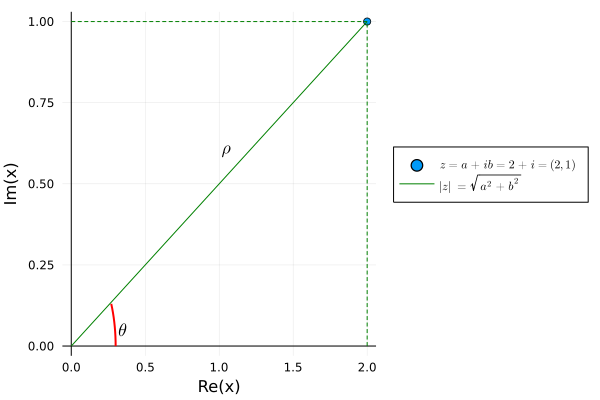

In [41]:
using Plots, LaTeXStrings

z1 = 2+im


plot([z1], framestyle = :zerolines, label=L"z = a + ib = 2 + i = (2,1)"; st=:scatter, legend=:outerright)
    
# vertical green line connecting the dots

plot!([0,2],[0,1], label=L"|z| = \sqrt{a^{2}+b^{2}}", linecolor=:green, linestyle=:solid)
plot!([0,2],[1,1], label="", linecolor=:green, linestyle=:dash)
plot!([2,2],[0,1], label="", linecolor=:green, linestyle=:dash)
plot!(Plots.partialcircle(0,1//7*pi,10,0.3), label="", color=:red, linewidth=2)

annotate!([(3.13,2.05, (L"z ", 10, :black)),
           (4,-1.45, (L"\bar{z} = a - ib", 10, :black)),
           (0.35,0.05, (L"\theta", 12, :black)),
           (0.15,2.1, (L"b", 10, :green)),
           (1.05,0.6, (L"ρ", 12, :black)),
           (3,-0.25, (L"a", 10, :green))])

#### Example

$z = \sqrt{3} + i$

$\text{Re}(z) = \sqrt{3} = a \quad \text{Im}(z) = 1 = b$

$|z| = ρ = \sqrt{3+1} = 2$

\begin{equation}
\begin{cases}
\sqrt{3} = 2 \ \cos \ \theta \quad → \quad \cos \ \theta = \frac{\sqrt{3}}{2}\\
1 = 2 \ \sin \ \theta \quad → \quad \sin \ \theta = \frac{1}{2}
\end{cases}
\end{equation}

Thus, 

$\theta = \frac{\pi}{6}$

$z = 2 \left( cos \left( \frac{\pi}{6} \right) + i \ \sin \left( \frac{\pi}{6} \right) \right)$

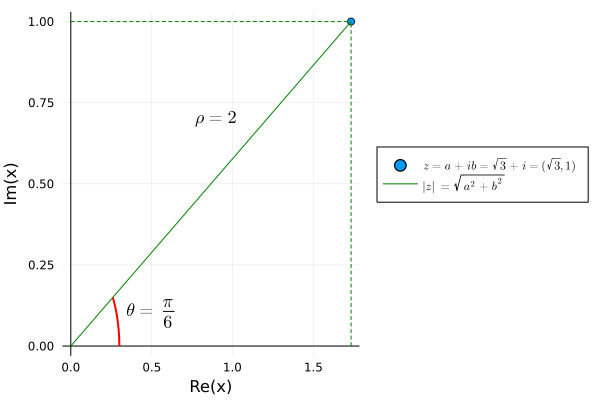

In [53]:
using Plots, LaTeXStrings

z1 = 3^(1/2)+im


plot([z1], framestyle = :zerolines, label=L"z = a + ib = \sqrt{3} + i = (\sqrt{3},1)"; st=:scatter, legend=:outerright)
    
# vertical green line connecting the dots

plot!([0,3^(1/2)],[0,1], label=L"|z| = \sqrt{a^{2}+b^{2}}", linecolor=:green, linestyle=:solid)
plot!([0,3^(1/2)],[1,1], label="", linecolor=:green, linestyle=:dash)
plot!([3^(1/2),3^(1/2)],[0,1], label="", linecolor=:green, linestyle=:dash)
plot!(Plots.partialcircle(0,1//6*pi,10,0.3), label="", color=:red, linewidth=2)

annotate!([(3.13,2.05, (L"z ", 10, :black)),
           (4,-1.45, (L"\bar{z} = a - ib", 10, :black)),
           (0.5,0.1, (L"\theta = \frac{\pi}{6}", 12, :black)),
           (0.15,2.1, (L"b", 10, :green)),
           (0.9,0.7, (L"ρ = 2", 12, :black)),
           (3,-0.25, (L"a", 10, :green))])

$z_{1}$ and $z_{2}$ complex numbers

$z_{j} = ρ_{j} (\cos \ \theta_{j} + i \ \sin \ \theta_{j}) \quad j=1,2$

\begin{equation}
\begin{split}
z_{1} \cdot z_{2} & = ρ_{1}ρ_{2} (\cos \theta_{1} + i \ \sin \theta_{1})(\cos \theta_{2} + i \ \sin \theta_{2}) \\
\ & = ρ_{1}ρ_{2}(\cos \theta_{1} \cos \theta_{2} - \sin \theta_{1} \sin \theta_{2} + \ i(\cos \theta_{1} \sin \theta_{2} + \cos \theta_{2} \sin \theta_{1})) \\
\ & = ρ_{1}ρ_{2} \ (\cos(\theta_{1} + \theta_{2}) + \ i \ \sin(\theta_{1} + \theta_{2})) \\
\ & = ρ_{1} e^{i \theta_{1}} \cdot ρ_{2} e^{i \theta_{2}} \\
z_{1} \cdot z_{2} & = ρ_{1}ρ_{2}e^{i(\theta_{1} + \theta_{2})}
\end{split}
\end{equation}

thus,
\begin{equation}
z = ρ e^{i \theta}
\end{equation}

with

\begin{equation}
e^{i \theta} = \cos \theta + \ i \sin \theta
\end{equation}

\begin{equation}
z \cdot z = z^{2} = ρ^{2} \ e^{i 2 \theta}
\end{equation}

De Moivre' Formula:
\begin{equation}
e^{i \theta} = \cos \theta + \ i \sin \theta
\end{equation}


#### Example

\begin{equation}z = 1 + i \quad z^{7} \ → \ ρ = \sqrt{1+1} = \sqrt{2} \quad
\begin{cases}
\cos \ \theta = \frac{1}{\sqrt{2}}\\
\sin \ \theta = \frac{1}{\sqrt{2}}
\end{cases}
\end{equation}

\begin{equation}
\begin{split}
z & = \sqrt{2} \left( \cos  \left( \frac{\pi}{4} \right) + i \sin \left( \frac{\pi}{4} \right) \right) \\
\ & = \sqrt{2} \ e^{i \frac{\pi}{4}}
\end{split}
\end{equation}

\begin{equation}
\begin{split}
z^{7} = (\sqrt{2})^{7} \left( \cos  \left( 7 \frac{\pi}{4} \right) + i \sin \left( 7 \frac{\pi}{4} \right) \right) & = 2^{\frac{7}{2}} \left( \frac{\sqrt{2}}{2} - i\frac{\sqrt{2}}{2} \right)\\
\ & = 2^{\frac{7}{2}} \left( \frac{\sqrt{2}}{2}\right) ( 1 - i) \\
\ & = 2^{\frac{7}{2} + \frac{1}{2} - 1} (1-i)\\
\ & = 8 - i8
\end{split}
\end{equation}

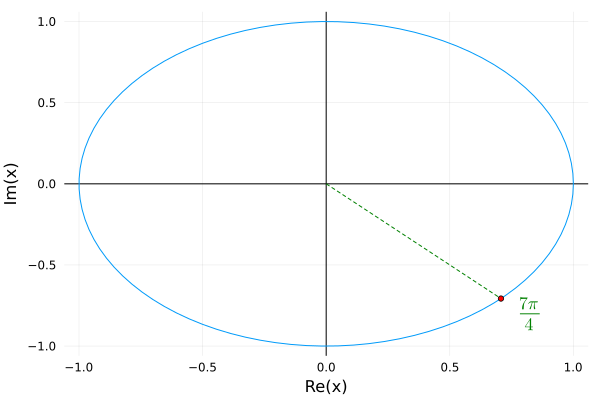

In [7]:
# Plot imaginary circle 
using Plots, LaTeXStrings

plot(exp.(im*range(0, 2π; length=100)), label="", framestyle = :zerolines)

# 315 = 7π/4
# cos 7π/4 = 0.707106781
# sin 7π/4 = -0.707106781

plot!([0,0.707106781],[0,-0.707106781], label="", linecolor=:green, linestyle=:dash)

scatter!([0.707106781], [-0.707106781], color = "red", label="", markersize = 3)
annotate!([(0.82,-0.8, (L"\frac{7π}{4}", 12, :green))])


### $n$-th Roots of a Complex Number

Take $z = a + ib \in \mathbb{C}$ on $ n \in \mathbb{N}$.

Find $ w \in \mathbb{C}$ such that

\begin{equation}
w^{n} = z
\end{equation}

$z = ρ(\cos \theta + i \sin \theta)$

$w = \sigma(\cos \varphi + i \sin \varphi)$

$w^{n} = \sigma^{n} (\cos(nρ) + i \sin(nρ)) = ρ(\cos \theta + i \sin \theta)$

$\sigma^{n} = ρ$

The second De Moivre's formula:
\begin{equation}
\sigma = \sqrt[n]{ρ}
\end{equation}

$n \varphi - \theta = 2 \pi k \quad k \in \mathbb{N}$

$n \varphi = \theta + \frac{2 \pi k}{n}$

This is also the second De Moivre's formula:
\begin{equation}
\varphi_{k} = \frac{\theta}{n} + \frac{2k}{n} \pi
\end{equation}

$\varphi_{0} = \frac{\theta}{n}$

$\varphi_{1} = \frac{\theta}{n} + \frac{2 \pi}{n}$ 

$\vdots$

$\varphi_{n-1} = \frac{\theta}{n} + \frac{2(n-1)}{n}π$

#### Example

Find all $z \in \mathbb{C}$ such that $z^{3} = 1 \quad z = ρ(\cos \theta + i \sin \theta)$

$1 = \cos(0) + i \sin(0) \quad → \quad z^{3} = ρ^{3} (\cos(3 \theta) + i \sin(3 \theta))$

$ρ^{3} = 1 \quad ρ = 1$

\begin{equation}
\begin{cases}
\theta_{0} = \frac{0}{3} \quad  \quad \quad \quad \quad  z_{0} = 1(\cos(0) + i \sin(0) = 1\\
\theta_{1} = \frac{0}{3} + \frac{2π}{3} = \frac{2π}{3} \quad z_{1} = 1(\cos(\frac{2π}{3}) + i \sin(\frac{2π}{3}) = - \frac{1}{2} + i \frac{\sqrt{3}}{2}\\
\theta_{2} = \frac{0}{3} + \frac{4π}{3} = \frac{4π}{3} \quad z_{1} = 1(\cos(\frac{4π}{3}) + i \sin(\frac{4π}{3}) = - \frac{1}{2} - i \frac{\sqrt{3}}{2}\\
\end{cases}
\end{equation}

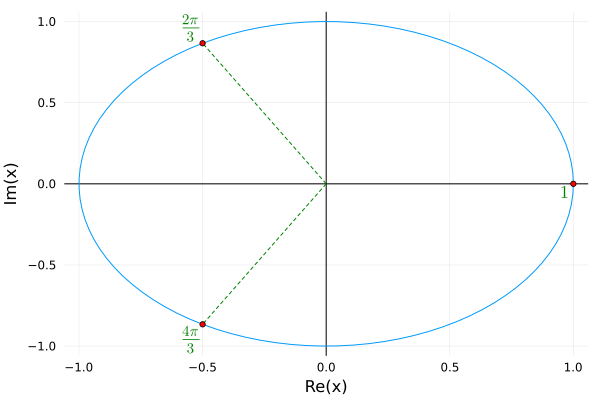

In [26]:
# Plot imaginary circle 
using Plots, LaTeXStrings

plot(exp.(im*range(0, 2π; length=100)), label="", framestyle = :zerolines)

# 315 = 7π/4
# cos 7π/4 = 0.707106781
# sin 7π/4 = -0.707106781

# at 2π/3
plot!([0,-0.5],[0,0.866025404], label="", linecolor=:green, linestyle=:dash)
scatter!([-0.5], [0.866025404], color = "red", label="", markersize = 3)

# at 4π/3
plot!([0,-0.5],[0,-0.866025404], label="", linecolor=:green, linestyle=:dash)
scatter!([-0.5], [-0.866025404], color = "red", label="", markersize = 3)

# at 0
scatter!([1], [0], color = "red", label="", markersize = 3)

annotate!([(0.97,-0.05, (L"1", 12, :green))])
annotate!([(-0.55,0.96, (L"\frac{2π}{3}", 10, :green))])
annotate!([(-0.55,-0.96, (L"\frac{4π}{3}", 10, :green))])

#### Example

$z^{2} + 1 = 0 \quad z^{2} = -1$

\begin{equation}
\begin{cases}
z^{2a} = ρ^{2} (\cos(2 \theta) + i \sin(2 \theta)) \\
-1 = 1(\cos(\pi) + i \sin(\pi))
\end{cases}
\end{equation}

* p = 1

$\theta_{0} = \frac{\pi}{2}$

$\theta_{1} = \frac{\pi}{2} + \frac{2 \pi}{2} = \frac{\pi}{2} + \pi = \frac{3 \pi}{2}$

\begin{equation}
\begin{split}
z_{0} & = 1 \left( \cos \left( \frac{\pi}{2} \right ) + i \sin \left( \frac{\pi}{2} \right )\right) = i \\
z_{1} & = 1 \left( \cos \left( \frac{3 \pi}{2} \right ) + i \sin \left( \frac{3 \pi}{2} \right )\right) = -i 
\end{split}
\end{equation}

### Solutions to Algebraic Equations in $mathbb{C}$

Given a polynomial 

\begin{equation}
p(z) = a_{n} z^{n} + a_{n-1}z^{n-1} + \dots + a_{1} z + a_{0}
\end{equation}

$a_{j} \in \mathbb{C}$

A root of $p$ in $\mathbb{C}$ is a number $z \in \mathbb{C}$ such that

$p(z) = 0$

$\bar{z}$ is a root of multiplicity $k$ if

\begin{equation}
p(z) = (z - z_{0})^{k} Q(z)
\end{equation}

with $Q(z)$ polynomial of degree $n-k, \quad a_{n} = 1, \quad a_{j} = 0, \quad j=1,2, \dots, n-1$

\begin{equation}
z^{n} = a_{0}
\end{equation}
has exactly $n$ roots.

#### Theorem (Fundamental Theorem of Algebra)

The equation $p(z) = 0$, if $a_{n} \neq 0$ has exactly $n$ roots each of them counted with its multiplicity, that is $∃ N \le n$ and

$z_{1}, \dots, z_{N} \in \mathbb{C}$

$m_{1}, \dots, m_{N} \in \mathbb{N}$

such that $z_{j}$ is a root of multiplicity $m_{j}$ and $m_{1} + \dots + m_{N} = n$.

Moreover, if $a_{0}, a_{1}, \dots, a_{n} \in \mathbb{R}$, then $z \in \mathbb{C}$ is a root, $\bar{z}$ is also a root.

#### Examples

1) $z^{2} + z + 1 = 0$ 

\begin{equation}
z_{1,2} = \frac{-1 \pm \sqrt{1-4}}{2} = \frac{-1 \pm \sqrt{-3}}{2} = \frac{-1 \pm \sqrt{i^{2} 3}}{2} = \frac{-1 \pm i \sqrt{3}}{2}
\end{equation}

\begin{equation}\frac{-1 \pm i \sqrt{3}}{2}
\begin{cases}
- \frac{1}{2} + i \frac{\sqrt{3}}{2} \\
- \frac{1}{2} - i \frac{\sqrt{3}}{2}
\end{cases}
\end{equation}

with another method:

\begin{equation}
\begin{split}
z^{2} + z + 1 = (z+a)^{2} + b = z^{2} + 2az + a^{2} + b & = \left( z + \frac{1}{2} \right)^{2} - \frac{1}{4} + 1 \\
\ & = \left( z + \frac{1}{2} \right)^{2} + \frac{3}{4} = 0
\end{split}
\end{equation}

From the first equation we have $2a = 1, \quad a = \frac{1}{2}$

Continuing on the second equation:
\begin{equation}
\begin{split}
z^{2} + z + 1 & = \left( z + \frac{1}{2} \right)^{2} + \frac{3}{4} = 0 \\
\ & = ρ^{2} (\cos(2 \theta) + i \sin(2 \theta)) = - \frac{3}{4} 
\end{split}
\end{equation}

Thus,we will have

$w^{2} = - \frac{3}{4}$

$w_{1} = i \frac{\sqrt{3}}{2}$

$w_{2} = -i \frac{\sqrt{3}}{2}$

Afterwards

\begin{equation}
\begin{split}
w^{2} & = - \frac{3}{4} \\
\left( z + \frac{1}{2} \right)^{2} & = - \frac{3}{4} \\
w & = z + \frac{1}{2}
\end{split}
\end{equation}

Then the roots are

\begin{equation}
\begin{split}
z_{1} & = - \frac{1}{2} + i \frac{\sqrt{3}}{2} \\
z_{2} & = - \frac{1}{2} - i \frac{\sqrt{3}}{2}
\end{split}
\end{equation}

#### Example

2) $z^{2} + 2iz - i \sqrt{3} = 0$

\begin{equation}
\begin{split}
z^{2} + 2iz - i \sqrt{3} & = z^{2} + 2iz - 1 + 1 - i \sqrt{3}\\
\ & = (z+i)^{2} + 1 - i \sqrt{3} = 0\\
\end{split}
\end{equation}

$w = z + i$

Thus, the roots for $w$:
\begin{equation}
\begin{split}
w^{2} & = -1 + i \sqrt{3}\\
w_{1} & = i \frac{\sqrt{6} - 2}{2} \\
w_{2} & = -i \frac{\sqrt{6} + 2}{2} 
\end{split}
\end{equation}


Then the roots for $z$:
\begin{equation}
\begin{split}
z_{1} & = \frac{\sqrt{2}}{2} + i \frac{\sqrt{6} - 2}{2} \\
z_{2} & = \frac{\sqrt{2}}{2} - i \frac{\sqrt{6} + 2}{2} 
\end{split}
\end{equation}

#### Examples

3) $z^{6} + 2z^{3} - 3 = 0 \quad z^{3} = w$

$w^{2} + 2w - 3 = 0$

$w^{2} + 2w + 1 - 1 - 3 = (2 + 1)^{2} - 4$

\begin{equation} \frac{-2 \pm \sqrt{4+12}}{2} = \frac{-2 \pm 2 \sqrt{1+3}}{2} = -1 \pm 2
\begin{cases}
w_{1} = -3 \\
w_{2} = 1
\end{cases}
\end{equation}

$z = ρ( \cos (\theta) + i \sin(\theta))$

with
\begin{equation}
\begin{split}
z^{3} & = -3 \\
\ & = ρ^{3} (\cos(3 \theta) + i \sin(3 \theta)) = -3 \\
\ & = 3(\cos(\pi) + i \sin(\pi))
\end{split}
\end{equation}

$z^{3} = 1$

$ρ^{3} = 3 \quad ρ = \sqrt[3]{3}$

\begin{equation}
\begin{split}
\theta_{0} & = \frac{\pi}{3} \\
\theta_{1} & = \frac{\pi}{3} + \frac{2 \pi}{3} = \pi \\
\theta_{2} & = \frac{\pi}{3} + \frac{4 \pi}{3} = \frac{5 \pi}{3}
\end{split}
\end{equation}

Thus, we will have:

\begin{equation}
\begin{split}
z_{0} & = \sqrt[3]{3} \left( \cos \left( \frac{\pi}{3} \right) + i \sin \left( \frac{\pi}{3} \right) \right) \\
\ & = \sqrt[3]{3} \left( \frac{1}{2} + i \frac{\sqrt{3}}{2} \right)
\end{split}
\end{equation}

\begin{equation}
\begin{split}
z_{1} & = \sqrt[3]{3} \left( \cos (\pi) + i \sin (\pi) \right) \\
\ & = - \sqrt[3]{3} 
\end{split}
\end{equation}

\begin{equation}
\begin{split}
z_{2} & = \sqrt[3]{3} \left( \cos \left( \frac{5 \pi}{3} \right) + i \sin \left( \frac{5 \pi}{3} \right) \right) \\
\ & = \sqrt[3]{3}  \left( \frac{1}{2} - i \frac{\sqrt{3}}{2} \right)
\end{split}
\end{equation}

#### Exercise

1) Find $\sup, \inf, \max$ and $\min$ (if there exists) of

\begin{equation}
A = \{x \in \mathbb{R} | 2 < x^{2} \le x^{4} \}
\end{equation}

\begin{equation} 
\begin{cases}
2 < x^{2} \quad \quad \quad x < - \sqrt{2} \ \text{or} \ x > \sqrt{2}\\
x^{2} \le x^{4} \quad \quad \quad x^{2}(x^{2} - 1) \ge 0 \quad x \ge 1 \ \text{or} \ x \le -1
\end{cases}
\end{equation}

thus,

$A = (- \infty, - \sqrt{2}) \cup (\sqrt{2}, + \infty)$

$\inf(A) = - \infty$

$\sup(A) = + \infty$

$\nexists \max(A)$ and $\min(A)$

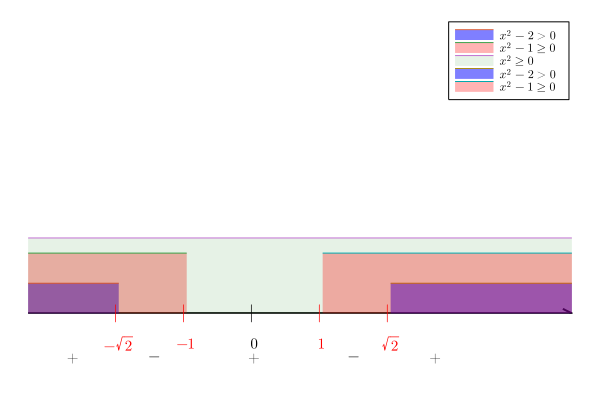

In [53]:
using Plots, LaTeXStrings, Plots.PlotMeasures

f(x) = 0.1
g(x) = 0.2
h(x) = 0.25

plot([0.3,0.9],[0,0],arrow=true,color=:black,linewidth=2, xticks=false, yticks=false,
     ylims=(0,1), showaxis=false, label="", bottom_margin = 20mm)
plot!(f,0.3,0.4, fill=(0, 0.5, :blue), label=L"x^{2} - 2 > 0")
plot!(g,0.3,0.475, fill=(0, 0.3, :red), label=L"x^{2} - 1 \ ≥ \ 0")
plot!(h,0.3,0.9, fill=(0, 0.1, :green), label=L"x^{2} \ ≥ \ 0")
plot!(f,0.7,0.9, fill=(0, 0.5, :blue), label=L"x^{2} - 2 > 0")
plot!(g,0.625,0.9, fill=(0, 0.3, :red), label=L"x^{2} - 1 \ ≥ \ 0")

annotate!([(0.4,0, (L"|", 12, :red))])
annotate!([(0.475,0, (L"|", 12, :red))])
annotate!([(0.55,0, (L"|", 12, :black))])
annotate!([(0.625,0, (L"|", 12, :red))])
annotate!([(0.7,0, (L"|", 12, :red))])
annotate!([(0.4,-0.1, (L"- \sqrt{2}", 10, :red))])
annotate!([(0.475,-0.1, (L"-1", 10, :red))])
annotate!([(0.625,-0.1, (L"1", 10, :red))])
annotate!([(0.7,-0.1, (L"\sqrt{2}", 10, :red))])
annotate!([(0.55,-0.1, (L"0", 10, :black))])
annotate!([(0.44,-0.15, (L"-", 10, :black))])
annotate!([(0.66,-0.15, (L"-", 10, :black))])
annotate!([(0.55,-0.15, (L"+", 10, :black))])
annotate!([(0.75,-0.15, (L"+", 10, :black))])
annotate!([(0.35,-0.15, (L"+", 10, :black))])

#### Exercise

2) 
\begin{equation}
A = \left\{ x = \frac{2n^{2}}{n^{2} + 1} | n \in \mathbb{N} \right\}
\end{equation}

\begin{equation}
\begin{split}
n = 1 & x = 1 \\
n = 2 & x = \frac{8}{5} \\
n = 3 & x = \frac{18}{10} = \frac{9}{5} \\
n = 4 & x = \frac{32}{17}
\end{split}
\end{equation}

Claim $\min(A)=\inf(A)=1$

\begin{equation}
\begin{split}
\frac{1(n+1)^{2}}{(n+1)^{2} + 1} & \ge \frac{2n^{2}}{n^{2} + 1} \quad x_{n} \le x_{n+1} \\
\frac{(n+1)^{2}}{(n+1)^{2} + 1} - \frac{n^{2}}{n^{2} + 1} & \ge 0 \\
(n+1)^{2} (n^{2} + 1) -n^{2}((n+1)^{2} + 1) & \ge 0 \\
2n + 1 & \ge 0 \quad ∀n \in \mathbb{N}
\end{split}
\end{equation}

$x_{1} \le x_{2} \le x_{3} \dots \ → \ \min(A)=\inf(A)=x_{1}=1$

$x_{n} = \frac{2n^{2}}{n^{2} + 1} < \frac{2n^{2}}{n^{2}} < 2$

$\nexists \ n$ such that $2n^{2} = 2(n^{2} + 1)$

Assume $L = \sup(A) \quad L<2$ then

$\frac{L+2}{2}$ is the upper bound for $A$.

$∀n \frac{2n^{2}}{n^{2}+1} < \frac{L+2}{2} = \frac{L}{2} + 1$

\begin{equation}
\begin{split}
2n^{2} & \le (n^{2} + 1) \left( \frac{L}{2} + 1 \right) \\
n^{2} \left( 2 - \left( \frac{L}{2} + 1 \right) \right) & \le \frac{L}{2} + 1 \\
n^{2} \left( 1 - \frac{L}{2} \right) & \le \frac{L}{2} + 1 \\
n < n^{2} & \le \frac{\frac{L}{2} + 1}{1 - \frac{L}{2}}
\end{split}
\end{equation}

Thus,

$n^{2} \le \frac{\frac{L}{2} + 1}{1 - \frac{L}{2}} \quad ∀n$

$\mathbb{N}$ is bounded $→$ 2

$\sup(A)=2$

$L=2$

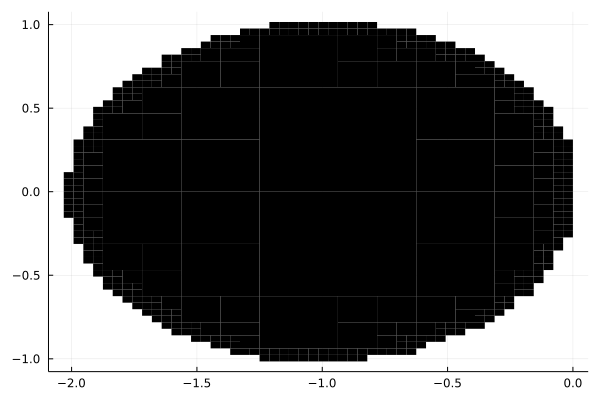

In [83]:
# Plot |z - (-1)| < 1
# with z element of Complexes, which is equivalent of a circle of radius 1 centered in (x,y)=(-1,0).

using ImplicitEquations, Plots

f(a,b) = sqrt((a+1)^2 + b^2)
plot(f ≪ 1)

# Sequences of Real Numbers

## Real Analysis Course 13  (September 5th 2022)

#### Definition

A function $\mathbb{N} → A$ is a sequence of $n \in mathbb{N} → a_{n} \in A$ elements of $A$.

$\mathbb{N} $ set of natural numbers $\{1,2,3,4.\dots,n,dots\}$ for the set $A \subset \mathbb{R}$ is a subset of real numbers (example: $A=(0, + \infty), [1,2], \dots)$

#### Notations:

$\{a_{n}\}_{n}, \{a_{n}\}, \{a_{1},a_{2},\dots,a_{n},\dots\} $

#### Examples

* $n → a_{n} = n$

Read: $n$ natural number associated with $a_{n}$

The sequence $\{a_{n}\} = \{n\} → \{1,2,3,\dots,n,\dots\}$

* $n → a_{n} = n!$

$n! = n\cdot(n-1)\cdot(n-2)\dots(2)\cdot(1)$

For example 

$4! = 4 \cdot 3 \cdot 2 \cdot 1$

$2! = 2 \cdot 1$

$0! = 1$

$\{a_{1},a_{2},a_{3},\dots\}=\{1!,2!,3!,\dots\} = \{1,2,6,\dots\}$

* Binomial coefficient

Let $k \in \mathbb{N}$ be fixed and consider $n \ge k$ then we can define the quantity

\begin{equation} a_{n} =
\begin{pmatrix}
n \\
k
\end{pmatrix} = \frac{n!}{k! (n-k)!}
\end{equation}

#### Example

If $k=3$ and consider $n \ge 3$

\begin{equation} a_{n} =
\begin{pmatrix}
n \\
3
\end{pmatrix} = \frac{n!}{3! (n-3)!} = \frac{n \cdot (n-1) \cdot (n-2) \cdot (n-3)!}{3! \cdot (n-3)!} = \frac{n \cdot (n-1) \cdot (n-2)}{6}
\end{equation}

* Sum of the first $n$ integers

$a_{n} = 1+2+3+ \dots + n = \sum_{k=1}^{n} k$

It is possible to prove (by induction) that 

$\sum_{k=1}^{n} k = \frac{n(n+1)}{2}$

Gauss' Proof:

\begin{equation}
\begin{split}
1 & + 2 & + 3 & + \dots & + n \\
n & + (n-1) & + (n-2) & + \dots & + n
\end{split}
\end{equation}

$(n+1)$ is repeated $n$ times, thus

\begin{equation}
\begin{split}
2(1 + \dots + n) & = (n+1) \cdot n \\
2 \sum_{k=1}^{n} k & = (n+1) \cdot n \\
2 \ a_{n} & = (n+1) \cdot n \\
a_{n} & = \frac{(n+1) \cdot n}{2}
\end{split}
\end{equation}

* $a_{n} = \frac{1}{n} → \{\frac{1}{1}, \frac{1}{2}, \frac{1}{3}, \frac{1}{4}, \dots, \frac{1}{n}, \dots\}$

* $a_{n} = (-1)^{n} → \{-1, 1, -1, 1, \dots, -1, 1, \dots\}$ 

* 

\begin{equation}
a_{n}
\begin{cases}
\frac{2}{n}\quad \text{if $n$ even} \quad \{\frac{1}{2}, 1, \frac{1}{4}, \frac{1}{2}, \frac{1}{6},\frac{1}{3}\} \\
\frac{1}{1 + n}\quad \text{if $n$ odd} \quad\{\frac{1}{2}, 1, \frac{1}{4}, \frac{1}{2}, \frac{1}{6},\frac{1}{3}\} 
\end{cases}
\end{equation}

* $a_{n} = 1 \quad ∀n \in \mathbb{N} → \{1,1,1,1,1, \dots \}$

#### Definition of finite limit of a sequence

Let $\{a_{n}\}$ be a sequence of real numbers and let $l \in \mathbb{R}$. We say that the limit of $\{a_{n}\}$ when $n → + \infty$ is $l$, and we write 

\begin{equation}
\lim_{n \rightarrow + \infty} a_{n} = l
\end{equation}

If $∀ \varepsilon > 0$ there exists a real number $N = N(\varepsilon)$ such that $∀ n \ge N$ we have

$|a_{n} - l| < \varepsilon$

this means that $a_{n} \in (l - \varepsilon, l + \varepsilon)$.

You can picture a sequence in this way

In [ ]:
using Plots, LaTeXStrings
gr()

a, b = -10, 10

h(x) = -20

plot(h, a, b; legend=:outerright, label="", framestyle=:zerolines, 
    xlims = (0,10), xticks = 0:1:10, 
    ylims = (-3,3), yticks = -3:1:3, 
    size=(720, 360))
plot!([1], seriestype="hline", linestyle=:dash, color=:black, label="")
plot!([-1], seriestype="hline", linestyle=:dash, color=:black, label="")

scatter!([1], [-1], color = "red", label=L"a_{n}=(-1)^{n}", markersize = 4)
scatter!([2], [1], color = "red", label="", markersize = 4)
scatter!([3], [-1], color = "red", label="", markersize = 4)
scatter!([4], [1], color = "red", label="", markersize = 4)
scatter!([5], [-1], color = "red", label="", markersize = 4)
scatter!([6], [1], color = "red", label="", markersize = 4)

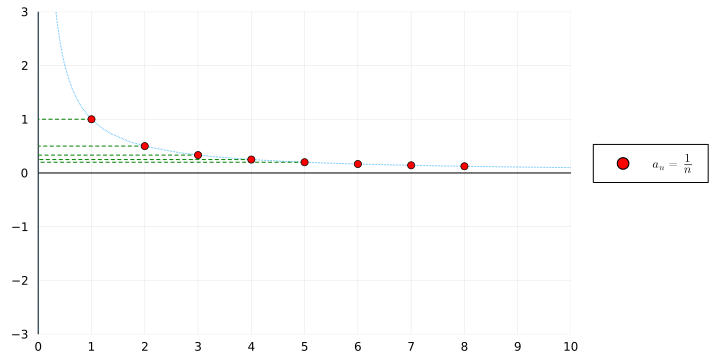

In [34]:
using Plots, LaTeXStrings
gr()

a, b = -10, 10

h(x) = 1/x

plot(h, a, b; legend=:outerright, label="", framestyle=:zerolines, 
    xlims = (0,10), xticks = 0:1:10, 
    ylims = (-3,3), yticks = -3:1:3, 
    linestyle=:dot, size=(720, 360))
plot!([1,0],[1,1], label="", linecolor=:green, linestyle=:dash)
plot!([2,0],[1/2,1/2], label="", linecolor=:green, linestyle=:dash)
plot!([3,0],[1/3,1/3], label="", linecolor=:green, linestyle=:dash)
plot!([4,0],[1/4,1/4], label="", linecolor=:green, linestyle=:dash)
plot!([5,0],[1/5,1/5], label="", linecolor=:green, linestyle=:dash)

scatter!([1], [1], color = "red", label=L"a_{n}=\frac{1}{n}", markersize = 4)
scatter!([2], [1/2], color = "red", label="", markersize = 4)
scatter!([3], [1/3], color = "red", label="", markersize = 4)
scatter!([4], [1/4], color = "red", label="", markersize = 4)
scatter!([5], [1/5], color = "red", label="", markersize = 4)
scatter!([6], [1/6], color = "red", label="", markersize = 4)
scatter!([7], [1/7], color = "red", label="", markersize = 4)
scatter!([8], [1/8], color = "red", label="", markersize = 4)


The definition of limit means that for any given $\varepsilon > 0$ there is some $N = N(\varepsilon) > 0$ such that $∀ n \ge N$ one has

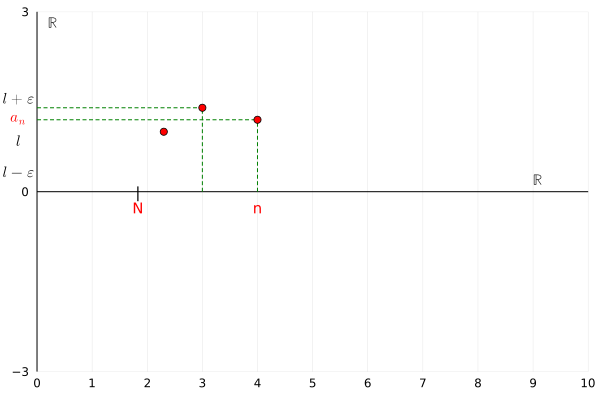

In [35]:
using Plots, LaTeXStrings
gr()

a, b = -10, 10

h(x) = 1/x

plot([0,4],[1.2,1.2],xlims = (0,10), xticks = 0:1:10, 
    ylims = (-3,3), yticks = -3:3:3, framestyle=:zerolines, 
    label="", linecolor=:green, linestyle=:dash)
plot!([0,3],[1.4,1.4], label="", linecolor=:green, linestyle=:dash)

plot!([4,4],[0,1.2], label="", linecolor=:green, linestyle=:dash)
plot!([3,3],[0,1.4], label="", linecolor=:green, linestyle=:dash)

scatter!([2.3], [1], color = "red", label="", markersize = 4)
scatter!([3], [1.4], color = "red", label="", markersize = 4)
scatter!([4], [1.2], color = "red", label="", markersize = 4)

annotate!([(9.1,0.2, (L"\mathbb{R}", 10, :black)), 
           (0.3,2.82, (L"\mathbb{R}", 10, :black)),
           (-0.33,1.55, (L"l + \varepsilon", 10, :black)),
           (-0.33,1.2, (L"a_{n}", 10, :red)),
           (-0.33,0.85, (L"l", 10, :black)),
           (-0.33,0.33, (L"l - \varepsilon", 10, :black)),
           (4,-0.27, ("n", 10, :red)),
           (1.83,-0.01, ("|", 10, :black)),
           (1.83,-0.27, ("N", 10, :red))])

#### Example

$a_{n} = \frac{1}{n} \quad l = 0$

Take $\varepsilon >0$ arbitrarily fixed

$ |a_{n} - l| < \varepsilon $ is $|\frac{1}{n} - 0| < \varepsilon$

observe that

$|\frac{1}{n} - 0| = |\frac{1}{n}| = \frac{1}{n}$

thus

$|\frac{1}{n} - 0| < \varepsilon ↔ \frac{1}{n} < \varepsilon ↔ n > \frac{1}{\varepsilon}$

thus once $\varepsilon>0$ is fixed we can choose $N=\frac{1}{\varepsilon}$ and then for every $n > N = \frac{1}{\varepsilon}$ we have

$n > \frac{1}{\varepsilon} ↔ |\frac{1}{n} - 0| < \varepsilon$

$|a_{n} - l| < \varepsilon$

since $\varepsilon$ was arbitrary, this argument holds for every $\varepsilon > 0$.

* $a_{n} = \frac{1}{n^{2}}$

The limit of the sequence is 0.

#### Restatements of the Definition of finite limit

\begin{equation}
\lim_{n \rightarrow + \infty} a_{n} = l \quad (\in \mathbb{R})
\end{equation}

if and only if

1) For any neighborhood $I(l, \varepsilon) → (l - \varepsilon, l + \varepsilon)$ there exists $N = N(\varepsilon)$ such that for any $n > N$ one has that $a_{n} \in I(l,\varepsilon)$ ($a_{n}$ stays in the interval of $(l,\varepsilon)$)

2) For any neighborhood$I(l, \varepsilon)$ all the elements $a_{n}$, but a finite number, belong to $I(l,\varepsilon)$.

#### Definition of infinite limit of a sequence

A sequence $\{a_{n}\}$ has limit $ + \infty$, and we write

\begin{equation}
\lim_{n \rightarrow + \infty} a_{n} = + \infty
\end{equation}

if $∀ M > 0$ (you can write $∀ M > 0$ with "take $ M > c > 0$"), there exists a real number $N = N(M)$ such that $∀n > N$ we have

$a_{n} > M$

Actually the interval $(M, + \infty)$ is a neighborhood of $+ \infty$.

$M$ is a big positive number.

Analogously, a sequence $\{a_{n}\}$ has limit $- \infty$ and we write 

\begin{equation}
\lim_{n \rightarrow + \infty} a_{n} = - \infty
\end{equation}

if $∀M > 0$ there exists a real number $N = N(M)$ such that $∀ n > N$ we have

$a_{n} < -M$

Actually, the interval $(- \infty, -M)$ is a neighborhood of $- \infty$

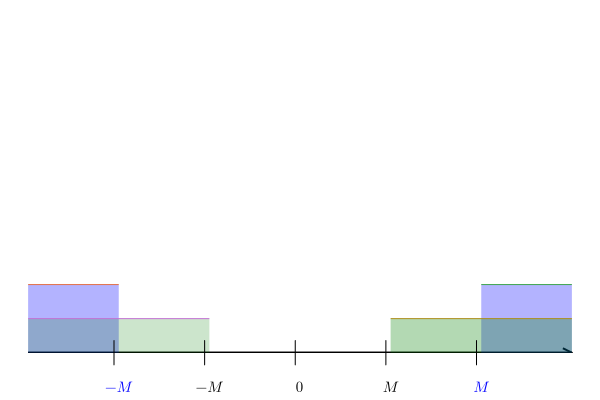

In [43]:
using Plots, LaTeXStrings, Plots.PlotMeasures
gr()

f(x) = 0.1
g(x) = 0.2

plot([0.3,0.9],[0,0],arrow=true,color=:black,linewidth=2, xticks=false, yticks=false,
     ylims=(0,1), showaxis=false, label="", bottom_margin = 10mm)
plot!(g,0.3,0.4, fill=(0, 0.3, :blue), label="")
plot!(g,0.8,0.9, fill=(0, 0.3, :blue), label="")
plot!(f,0.3,0.5, fill=(0, 0.2, :green), label="")
plot!(f,0.7,0.9, fill=(0, 0.3, :green), label="")

annotate!([(0.4,0, (L"|", 17, :black))])
annotate!([(0.5,0, (L"|", 17, :black))])
annotate!([(0.6,0, (L"|", 17, :black))])
annotate!([(0.7,0, (L"|", 17, :black))])
annotate!([(0.8,0, (L"|", 17, :black))])
annotate!([(0.4,-0.1, (L"-M", 10, :blue))])
annotate!([(0.5,-0.1, (L"-M", 10, :black))])
annotate!([(0.6,-0.1, (L"0", 10, :black))])
annotate!([(0.7,-0.1, (L"M", 10, :black))])
annotate!([(0.8,-0.1, (L"M", 10, :blue))])

#### Example

$a_{n} = n$

$∀ n > N = M → n > M$

$a_{n} > M$

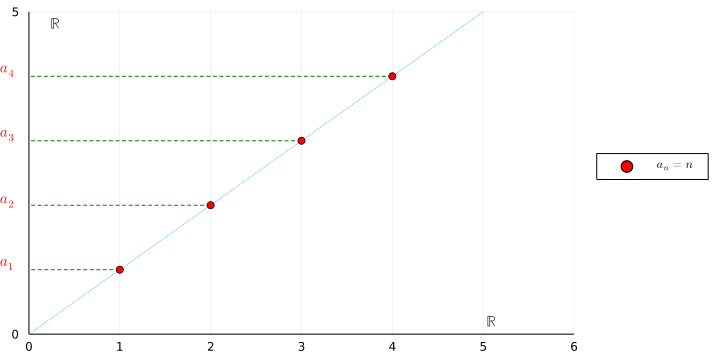

In [2]:
using Plots, LaTeXStrings
gr()

a, b = -10, 10

h(x) = x

plot(h, a, b; legend=:outerright, label="", framestyle=:zerolines, 
    xlims = (0,6), xticks = 0:1:6, 
    ylims = (0,5), yticks = 0:5:5, 
    linestyle=:dot, size=(720, 360))
plot!([1,0],[1,1], label="", linecolor=:green, linestyle=:dash)
plot!([2,0],[2,2], label="", linecolor=:green, linestyle=:dash)
plot!([3,0],[3,3], label="", linecolor=:green, linestyle=:dash)
plot!([4,0],[4,4], label="", linecolor=:green, linestyle=:dash)

scatter!([1], [1], color = "red", label=L"a_{n}=n", markersize = 4)
scatter!([2], [2], color = "red", label="", markersize = 4)
scatter!([3], [3], color = "red", label="", markersize = 4)
scatter!([4], [4], color = "red", label="", markersize = 4)

annotate!([(5.1,0.2, (L"\mathbb{R}", 10, :black)), 
           (0.3,4.82, (L"\mathbb{R}", 10, :black)),
           (-0.23,1.08, (L"a_{1}", 10, :red)),
           (-0.23,2.05, (L"a_{2}", 10, :red)),
           (-0.23,3.08, (L"a_{3}", 10, :red)),
           (-0.23,4.08, (L"a_{4}", 10, :red))])

Alternative unified definition of limit $\{a_{n}\}$ has limit $l$ (finite or $ + \infty$ or $- \infty$) if for any neighborhood $I$ of $l$ there exists a number $N \in \mathbb{R}$ such that $∀ n > N$ we have that $a_{n} \in I$

#### Examples

1) $a_{n} = 1 \quad ∀ n \in \mathbb{N}$

\begin{equation}
\lim_{n \rightarrow + \infty} a_{n} = l = 1
\end{equation}

$∀ \varepsilon > 0$ arbitrary fixed, we want to find $N = N(\varepsilon)$ such that $∀ n > N$ we have 

$|a_{n} - 1| < \varepsilon$

observe that

$ |a_{n} - 1| = |1 - 1| = |0| =0 < \varepsilon $

condition always satisfied, hence we can take $N=0$ because then $∀ n > N = 0$ we get

$ |a_{n} - 1| = 0 < \varepsilon$

#### Example
2) 

\begin{equation}
a_{n} = \frac{(-1)^{n}}{n}
\begin{cases}
\frac{1}{n}\quad \text{if $n$ even} \\
\frac{-1}{n}\quad \text{if $n$ odd} 
\end{cases}
\end{equation}

Graphically, the limit exists and is $l=0$

Let us prove that 

\begin{equation}
\lim_{n \rightarrow + \infty} a_{n} = 0
\end{equation}

Take $\varepsilon > 0$ arbitrary fixed and look for $N = N(\varepsilon)$ such that $∀ n > N$ we have $|a_{n} - 0| < \varepsilon$

Observe that

$|a_{n} - 0| = \left| \frac{(-1)^{n}}{n} - 0 \right| = \left| \frac{(-1)^{n}}{n} \right| = \frac{|(-1)^{n}|}{n} = \frac{1}{n}$

thus

$ |a_{n} - 0| < \varepsilon ↔ \frac{1}{n} < \varepsilon ↔ n > \frac{1}{\varepsilon} $

Given $\varepsilon > 0$ arbitrary fixed, we can consider $N = \frac{1}{\varepsilon} ( \in \mathbb{R})$ and if $n > N = \frac{1}{\varepsilon}$ we get $n > \frac{1}{\varepsilon} ↔ \frac{1}{n} < \varepsilon ↔ |a_{n} - 0| < \varepsilon$ and the definition of limit is satisfied.

#### Remark

If $\{a_{n}\}$ is a sequence such that

\begin{equation}
\lim_{n \rightarrow + \infty} |a_{n}| = 0
\end{equation}

then also

\begin{equation}
\lim_{n \rightarrow + \infty} a_{n} = 0
\end{equation}

#### Proof

Take $ \varepsilon > 0$ arbitrary fixed, then we need to show that $∃ N \in N(\varepsilon)$ such that $∀n > N$ one has $|a_n - 0| < \varepsilon$.

We can use: 

\begin{equation}
\lim_{n \rightarrow + \infty} |a_{n}| = 0
\end{equation}

we know that for some $\varepsilon > 0$ that we fixed above there is some $\bar{N} = \bar{N}(\varepsilon)$ such that $∀ n > \bar{N}$ we have

$| |a_{n}| - 0| < \varepsilon$

and now we observe

$||a_{n}| - 0| = ||a_{n}|| = |a_{n}| = |a_{n}-0|$

thus when $n > \bar{N}$ we know by assumption that

$||a_{n}| - 0| < \varepsilon$

and thanks to the identities above this means that

$|a_{n} - 0| < \varepsilon$

and finally we can conclude by taking $N = \bar{N}$


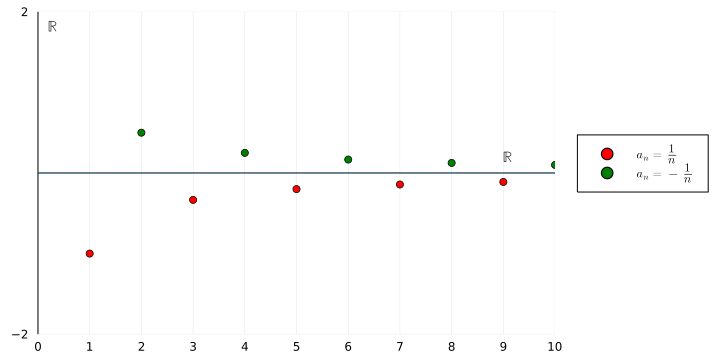

In [16]:
using Plots, LaTeXStrings
gr()

a, b = -10, 10

h(x) = 0

plot(h, a, b; legend=:outerright, label="", framestyle=:zerolines, 
    xlims = (0,10), xticks = 0:1:10, 
    ylims = (-2,2), yticks = -2:4:2, 
    linestyle=:dot, size=(720, 360))

scatter!([1], [-1], color = "red", label=L"a_{n}=\frac{1}{n}", markersize = 4)
scatter!([2], [1/2], color = "green", label=L"a_{n}=- \frac{1}{n}", markersize = 4)
scatter!([3], [-1/3], color = "red", label="", markersize = 4)
scatter!([4], [1/4], color = "green", label="", markersize = 4)
scatter!([5], [-1/5], color = "red", label="", markersize = 4)
scatter!([6], [1/6], color = "green", label="", markersize = 4)
scatter!([7], [-1/7], color = "red", label="", markersize = 4)
scatter!([8], [1/8], color = "green", label="", markersize = 4)
scatter!([9], [-1/9], color = "red", label="", markersize = 4)
scatter!([10], [1/10], color = "green", label="", markersize = 4)

annotate!([(9.1,0.2, (L"\mathbb{R}", 10, :black)), 
           (0.3,1.82, (L"\mathbb{R}", 10, :black))])

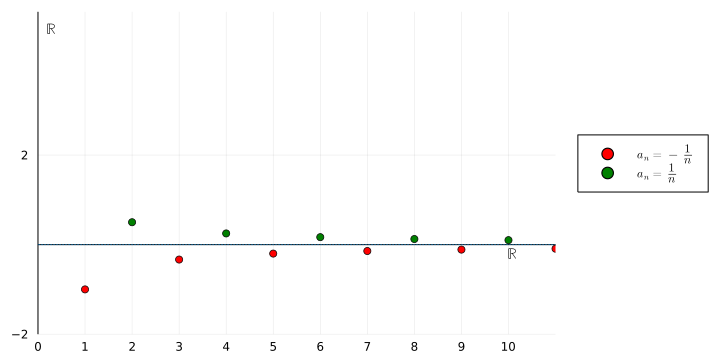

In [19]:
# Alternative 2
using Plots
using LaTeXStrings
gr()

p = hline([0]; legend=:outerright, label="", framestyle=:zerolines, 
    xlims = (0,11), xticks = 0:1:10, 
    ylims = (-2,5.2), yticks = -2:4:2, 
    linestyle=:dot, size=(720, 360))

scatter!(p, 1:2:13, n->(-1)^isodd(n)/n; color=:red, label=L"a_n=-\frac{1}{n}", markesize=4) 
scatter!(p, 2:2:13, n->(-1)^isodd(n)/n; color=:green, label=L"a_n=\frac{1}{n}", markesize=4)

annotate!(p, (10.1,-0.2, (L"\mathbb{R}", 10, :black)), 
             (0.3,4.82, (L"\mathbb{R}", 10, :black)))

display(p)

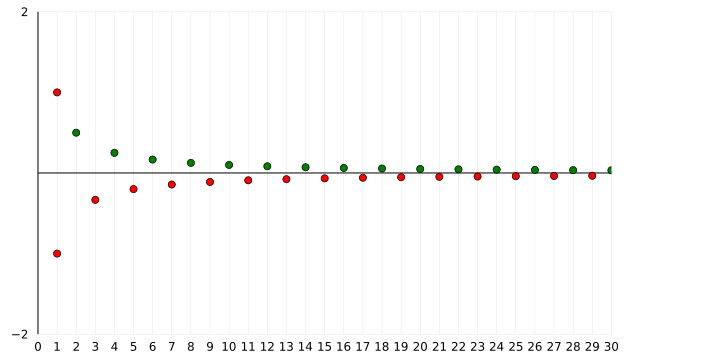

In [62]:
# Alternative 3
using Plots
using LaTeXStrings
gr()

p = scatter([1], [1], color = "red", markersize = 4,
   legend=:outerright, label="", framestyle=:zerolines, 
   xlims = (0,30), xticks = 0:1:30, 
   ylims = (-2,2), yticks = -2:4:2, 
   linestyle=:dot, size=(720, 360))

for i in 1:2:33
   scatter!([i], [(-1)^(i)/i], color = "red", label="", markersize = 4)
end

for i in 2:2:33
   scatter!([i], [(-1)^(i)/i], color = "green", label="", markersize = 4)
end

display(p)

#### Example

3) $a_{n} = n^{2}$

Graphically, the limit is

\begin{equation}
\lim_{n \rightarrow + \infty} n^{2} = + \infty 
\end{equation}

Take $M > 0$ arbitrary and we look for $N=N(M)$ such that $∀ n > N$ we have 

$a_{n} > M$

observe that

$n^{2} > M ↔ n > \sqrt{M}$

then we can take $N = \sqrt{M} > 0$ and hence if $n > N, n \in \mathbb{N}$ then $n > \sqrt{M}$ and

$n^{2} > M$

$a_{n} > M$

and the definition of limit is satisfied.

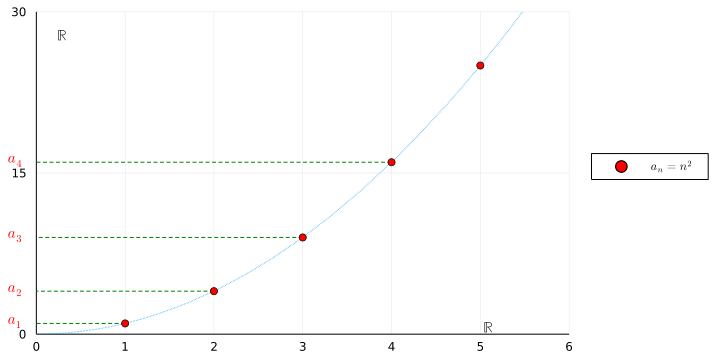

In [77]:
using Plots, LaTeXStrings
gr()

a, b = -10, 10

h(x) = x^(2)

plot(h, a, b; legend=:outerright, label="", framestyle=:zerolines, 
    xlims = (0,6), xticks = 0:1:6, 
    ylims = (0,30), yticks = 0:15:30, 
    linestyle=:dot, size=(720, 360))
plot!([1,0],[1,1], label="", linecolor=:green, linestyle=:dash)
plot!([2,0],[4,4], label="", linecolor=:green, linestyle=:dash)
plot!([3,0],[9,9], label="", linecolor=:green, linestyle=:dash)
plot!([4,0],[16,16], label="", linecolor=:green, linestyle=:dash)

scatter!([1], [1], color = "red", label=L"a_{n}=n^{2}", markersize = 4)
scatter!([2], [4], color = "red", label="", markersize = 4)
scatter!([3], [9], color = "red", label="", markersize = 4)
scatter!([4], [16], color = "red", label="", markersize = 4)
scatter!([5], [25], color = "red", label="", markersize = 4)


annotate!([(5.1,0.64, (L"\mathbb{R}", 10, :black)), 
           (0.3,27.82, (L"\mathbb{R}", 10, :black)),
           (-0.23,1.08, (L"a_{1}", 10, :red)),
           (-0.23,4.05, (L"a_{2}", 10, :red)),
           (-0.23,9.08, (L"a_{3}", 10, :red)),
           (-0.23,16.08, (L"a_{4}", 10, :red))])

#### Example

4) $a_{n} = n! = n \cdot (n-1) \cdot (n-2) \dots 2 \cdot 1$

also in this case 

\begin{equation}
\lim_{n \rightarrow + \infty} n! = + \infty
\end{equation}

Take $M>0$ arbitrary fixed, we want to find $N=N(M)$ such that if $n > N$ we have $a_n > M$.

Observe that 

$n! > M ↔ n \cdot (n-1) \cdot (n-2) \dots 2 \cdot 1 > M$

if $M$ is natural number then $M! > M$

if $M$ is not a natural number then there exists anyway the smallest natural number bigger than $M$, let us call it $\bar{N}$. Then

$\bar{N}! > \bar{N} > M$

now call $N:=\bar{N}$ then if $n>N$ we have that

$n! > N! = \bar{N}! > \bar{N} > M$

and hence we get

$n! > M$

#### Example

5) 

\begin{equation}
a_{n} =
\begin{cases}
\frac{2}{n}\quad \text{if $n$ even} \\
\frac{1}{n+1}\quad \text{if $n$ odd} 
\end{cases}
\end{equation}

Graphically

\begin{equation}
\lim_{n \rightarrow + \infty} a_{n} = 0
\end{equation}

Take $\varepsilon > 0$ arbitrary and look for $N = N(\varepsilon)$ such that $∀ n > N$ we have $|a_{n} - 0| < \varepsilon$.

observe that

$ |a_{n} - 0| = |a_{n}| = a_{n}$

because $a_{n} > 0$ by construction, thus

$ |a_{n} - 0| < \varepsilon ↔ a_{n} < \varepsilon$

moreover we can also observe that

$\frac{1}{n+1} \le \frac{1}{n} \le \frac{2}{n} \quad ∀n \in \mathbb{N}$

thus

$a_{n} \le \frac{2}{n} \quad ∀ n \in \mathbb{N}$

and this means that

$|a_{n} - 0| = a_{n} \le \frac{2}{n} \quad ∀n \in \mathbb{N}$

Given $\varepsilon > 0$ fixed arbitrary then we have 

$\frac{2}{n} < \varepsilon ↔ n > \frac{2}{\varepsilon}$

thus we can choose $N = \frac{2}{\varepsilon}$ and deduce that

$∀ n > N$ then $ n > \frac{2}{\varepsilon} ↔ \frac{2}{n} < \varepsilon → |a_{n} - 0| < \varepsilon$

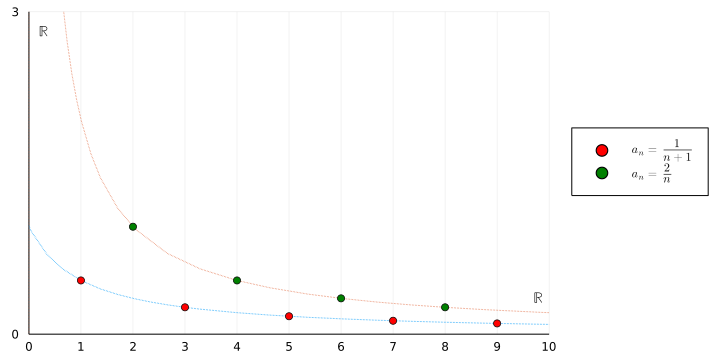

In [21]:
using Plots, LaTeXStrings
gr()

a, b = -10, 10

h(x) = 1/(x+1)
g(x) = 2/x

plot(h, a, b; legend=:outerright, label="", framestyle=:zerolines, 
    xlims = (0,10), xticks = 0:1:10, 
    ylims = (0,3), yticks = 0:3:3, 
    linestyle=:dot, size=(720, 360))
plot!(g, a, b; legend=:outerright, label="", framestyle=:zerolines, 
    xlims = (0,10), xticks = 0:1:10, 
    ylims = (0,3), yticks = 0:3:3, 
    linestyle=:dot, size=(720, 360))

scatter!([1], [1/2], color = "red", label=L"a_{n}=\frac{1}{n+1}", markersize = 4)
scatter!([2], [1], color = "green", label=L"a_{n}=\frac{2}{n}", markersize = 4)
scatter!([3], [1/4], color = "red", label="", markersize = 4)
scatter!([4], [1/2], color = "green", label="", markersize = 4)
scatter!([5], [1/6], color = "red", label="", markersize = 4)
scatter!([6], [1/3], color = "green", label="", markersize = 4)
scatter!([7], [1/8], color = "red", label="", markersize = 4)
scatter!([8], [1/4], color = "green", label="", markersize = 4)
scatter!([9], [1/10], color = "red", label="", markersize = 4)

annotate!([(9.81,0.34, (L"\mathbb{R}", 10, :black)), 
           (0.3,2.82, (L"\mathbb{R}", 10, :black))])

#### Example

6) 

$a_{n} = \frac{n^{2} + 1}{n^{2} + 2n - 1}$

\begin{equation}
\frac{n^{2} + 1}{n^{2} + 2n - 1} = \frac{1 + \frac{1}{n^{2}}}{1 + \frac{2}{n} - \frac{1}{n^{2}}}
\end{equation}

\begin{equation}
\lim_{n \rightarrow + \infty} \frac{1 + \frac{1}{n^{2}}}{1 + \frac{2}{n} - \frac{1}{n^{2}}} = \frac{1+0}{1+0-0} = 1
\end{equation}

thus in the limit of $n \rightarrow + \infty$ the candidate limit value is $\frac{1}{1} = 1$.

Take $\varepsilon > 0$ arbitrary fixed, observe that

\begin{equation}
|a_{n} - 1| =
\begin{vmatrix}
\frac{n^{2} + 1}{n^{2} + 2n - 1} - 1
\end{vmatrix} =
\begin{vmatrix}
\frac{-2n + 2}{n^{2} + 2n - 1}
\end{vmatrix} = \frac{2n - 2}{n^{2} + 2n - 1}
\end{equation}

we look for $N = N(\varepsilon)$ such that $∀ n > N$ we have

$ \frac{2n - 2}{n^{2} + 2n - 1} < \varepsilon$

observe again that

$\frac{2n - 2}{n^{2} + 2n - 1} < \frac{2n}{n^{2}}$

$\frac{2n - 2}{n^{2} + 2n - 1} < \frac{2}{n}$

($2n-1 > 0$, since $n \in \mathbb{N}$)

thus if we impose that $\frac{2}{n} < \varepsilon ↔ n > \frac{2}{\varepsilon}$ and taking $N = \frac{2}{\varepsilon}$ we get that $∀ n > N$ then $n > \frac{2}{\varepsilon}$ we obtain

$\frac{2}{n} < \varepsilon$

but also

$\frac{2}{n} > \frac{2n - 2}{n^{2} + 2n - 1} = |a_{n} - 1|$

$\varepsilon > |a_{n} - 1|$

#### Example 

7) $a_{n} = (-1)^{n}$

in this case 

\begin{equation}
\lim_{n \rightarrow + \infty} (-1)^{n}
\end{equation}

does not exist.

There are infinitely many terms $a_{n}$ which are not in the neighborhood $I(l, \varepsilon)$, no matter what $l$ is.

Indeed if $\varepsilon < 2$ then

$ a_{n} \notin I(-1, \varepsilon) \quad ∀n$ even (because $a_{n} = 1$ if $n$ even)

and

$ a_{n} \notin I(1, \varepsilon) \quad ∀n$ odd (because $a_{n} = -1$ if $n$ odd)


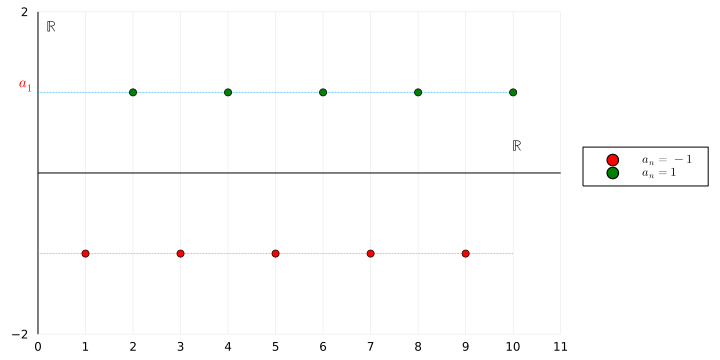

In [97]:
using Plots, LaTeXStrings
gr()

a, b = -10, 10

h(x) = 1
g(x) = -1

plot(h, a, b; legend=:outerright, label="", framestyle=:zerolines, 
    xlims = (0,11), xticks = 0:1:11, 
    ylims = (-2,2), yticks = -2:4:2, 
    linestyle=:dot, size=(720, 360))
plot!(g, a, b; legend=:outerright, label="", framestyle=:zerolines, 
    xlims = (0,11), xticks = 0:1:11, 
    ylims = (-2,2), yticks = -2:4:2, 
    linestyle=:dot, size=(720, 360))

scatter!([1], [-1], color = "red", label=L"a_{n}=-1", markersize = 4)
scatter!([2], [1], color = "green", label=L"a_{n}=1", markersize = 4)
scatter!([3], [-1], color = "red", label="", markersize = 4)
scatter!([4], [1], color = "green", label="", markersize = 4)
scatter!([5], [-1], color = "red", label="", markersize = 4)
scatter!([6], [1], color = "green", label="", markersize = 4)
scatter!([7], [-1], color = "red", label="", markersize = 4)
scatter!([8], [1], color = "green", label="", markersize = 4)
scatter!([9], [-1], color = "red", label="", markersize = 4)
scatter!([10], [1], color = "green", label="", markersize = 4)


annotate!([(10.1,0.34, (L"\mathbb{R}", 10, :black)), 
           (0.3,1.82, (L"\mathbb{R}", 10, :black)),
           (-0.23,1.08, (L"a_{1}", 10, :red)),
           (-0.23,4.05, (L"a_{2}", 10, :red)),
           (-0.23,9.08, (L"a_{3}", 10, :red)),
           (-0.23,16.08, (L"a_{4}", 10, :red))])

# Sequence of Real Numbers

## Real Analysis Course 14  (September 6th 2022)

#### Proposition

A sequence of real numbers has at most one limit.

It is impossible that a sequence of numbers approaching two different numbers (has two different limit).

#### Proof

We discuss the one of finite limit, prove as exercise the cases $\pm \infty$

We are in the case

\begin{equation}
\lim_{n \rightarrow + \infty} a_{n} = l \in \mathbb{R}
\end{equation}

Assume by contradiction that there are two numbers $l_{1}, l_{2} \in \mathbb{R} \ l_{1} \neq l_{2}$ and

\begin{equation}
\lim_{n \rightarrow + \infty} a_{n} = l_{1} \quad \text{&} \quad \lim_{n \rightarrow + \infty} a_{n} = l_{2}
\end{equation}

$∀ \varepsilon > 0$ up to a finite number of elements we have that $a_{n} \in I(l_{1}, \varepsilon)$, $I \in (l_{1} - \varepsilon, l_{1} + \varepsilon)$

$∀ \varepsilon > 0$ up to a finite number of elements we have that $a_{n} \in I(l_{2}, \varepsilon)$, $I \in (l_{2} - \varepsilon, l_{2} + \varepsilon)$

If we take $\varepsilon= \frac{|l_{1} - l_{2}|}{2} > 0$

We get that $I(l_{1}, \varepsilon) \cap I(l_{2}, \varepsilon) = ø$

* $\varepsilon$ must be smaller than $|l_{1} - l_{2}|$

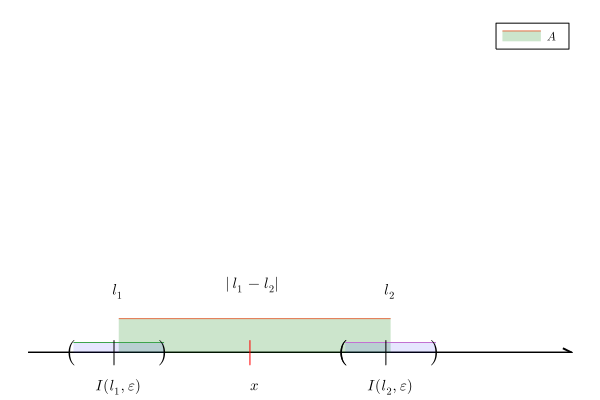

In [56]:
using Plots, LaTeXStrings, Plots.PlotMeasures

f(x) = 0.1
g(x) = 0.03

plot([0.3,0.9],[0,0],arrow=true,color=:black,linewidth=2, xticks=false, yticks=false,
     ylims=(0,1), showaxis=false, label="", bottom_margin = 10mm)
plot!(f,0.4,0.7, fill=(0, 0.2, :green), label=L"A")

plot!(g,0.35,0.45, fill=(0, 0.1, :blue), label="")
plot!(g,0.65,0.75, fill=(0, 0.1, :blue), label="")

annotate!([(0.35,0, (L"(", 17, :black))])
annotate!([(0.4,0, (L"|", 17, :black))])
annotate!([(0.45,0, (L")", 17, :black))])
annotate!([(0.55,0, (L"|", 17, :red))])
annotate!([(0.65,0, (L"(", 17, :black))])
annotate!([(0.7,0, (L"|", 17, :black))])
annotate!([(0.55,0.2, (L"|l_{1} - l_{2}|", 10, :black))])
annotate!([(0.4,-0.1, (L"I(l_{1}, \varepsilon)", 10, :black))])
annotate!([(0.65,0, (L"(", 17, :black))])
annotate!([(0.7,-0.1, (L"I(l_{2}, \varepsilon)", 10, :black))])
annotate!([(0.75,0, (L")", 17, :black))])
annotate!([(0.4,0.18, (L"l_{1}", 10, :black))])
annotate!([(0.7,0.18, (L"l_{2}", 10, :black))])
annotate!([(0.55,-0.1, (L"x", 10, :black))])

Given $0 < \varepsilon < \frac{|l_{1} - l_{2}|}{2}$ there is $N = N(\varepsilon) \in \mathbb{R}$ such that $∀ n > N$ one has

$|a_{n} - l_{1}| < \varepsilon ↔ a_{n} \in (l_{1} - \varepsilon, l_{1} + \varepsilon)$

for the same $\varepsilon$ there is also $\bar{N}=\bar{N}(\varepsilon) \in \mathbb{R}$ such that $∀n > \bar{N}$ one has

$|a_{n} - l_{2}| < \varepsilon ↔ a_{n} \in (l_{2} - \varepsilon, l_{2} + \varepsilon)$

but then for $n > \max\{N,\bar{N}\}$ we get that

$a_{n} \in (l_{1} - \varepsilon, l_{1} + \varepsilon) \ \text{&} \ a_{n} \in (l_{2} - \varepsilon, l_{2} + \varepsilon )$

but this is a contradiction because

$(l_{1} - \varepsilon, l_{1} + \varepsilon) \cap (l_{2} - \varepsilon, l_{2} + \varepsilon) = ø$

Contradiction.

Hence, it is not possible that $l_{1} \neq l_{2}$, thus

$l_{1} = l_{2}$

#### Proposition

If 

\begin{equation}
\lim_{n \rightarrow + \infty} a_{n} = l 
\end{equation}

where $l \in \mathbb{R}$ is finite (we say that "$a_{n}$ converges to $l$"), then the sequence $\{a_{n}\}$ is bounded.

#### Proof

by definition of converging sequence we know that $∀ \varepsilon>0 \ ∃ N=N(\varepsilon) \in \mathbb{R}$ such that $∀ n > N$ we have

$|a_{n} - l| < \varepsilon$

if we take $\varepsilon=1$ then there is some $N$ such that $∀ n >N$ we have

$|a_{n} - l| < 1 ↔ l-1 < a_{n} < l+1$

since $N>0$ is a finite real number there is a natural number that is the biggest possible but smaller than $N$

$[N]$ is the biggest natural number < $N$ (it means that $N \in ([N],[N]+1)$

example: $[2]=2$

We can consider the value 

$c=|a_{1}|+|a_{2}|+\dots+|a_{[N]}|+|l|+1$

and we claim that 

$|a_{n}| < c \quad ∀ n \in \mathbb{N}$

indeed if

1) 
$n \le N → |a_{n}| \le |a_{1}|+|a_{2}|+\dots+ |a_{n}| + \dots + |a_{[N]}|+|l|+1$

2) 
$n > N → |a_{n}| < |l|+1+|a_{1}|+|a_{2}|+\dots+|a_{[N]}|$

hence $|a_{n}| \le c \quad ∀n \in \mathbb{N}$

#### Remark: Is the Converse is True?

Meaning: is it true that if your sequence is bounded then it converges to a finite limit? No.

Example:

$a_{n} = (-1)^{n}$

$\{a_{n}\}$ is bounded because 

$|(-1)^{n}| \le 1 \quad ∀n \in \mathbb{N}$

but the limit does not exist.

#### Remark: Interesting Inequality

$h \in \mathbb{R}$ such that $h \ge -1$ then

$(1+h)^{n} \ge 1 + nh \quad ∀n \in \mathbb{N}$

Proof by induction:

$n=1 \quad (1+h)^{1} = 1+h = 1 + 1 \dot h \ge 1 + 1 \dot h$

assume now that for generic $n$ it is true that 

$(1+h)^{n} \ge 1 + nh$

we want to show that

$(1+h)^{n+1} \ge 1+(n+1)h$

observe that

$(1+h)^{n+1} = (1+h)^{n} \dot (1+h)$

$1+h \ge 0$

We use the assumption of $(1+h)^{n}  \cdot (1+h) \ge (1 + nh) \cdot (1+h)$

\begin{equation}
\begin{split}
(1+h)^{n+1} & = (1+h)^{n} \dot (1+h) \ge (1+nh) \dot (1+h) \\
\ & = 1 + nh + h + nh^{2} \\
\ & = 1 + h(n+1) + nh^{2} \\
\ & \ge 1 + (n+1)h
\end{split}
\end{equation}

#### Examples of interesting sequences

1) $p \in \mathbb{R}, p>0$ we consider the sequence

$a_{n} = \sqrt[n]{p}$

and we want to study

\begin{equation}
\lim_{n \rightarrow + \infty} \sqrt[n]{p}
\end{equation}

for the different values of $p$.

Actually

\begin{equation}
\lim_{n \rightarrow + \infty} \sqrt[n]{p} = 1
\end{equation}

for any $p>0$.

* Case $p=1 → a_{n} = \sqrt[n]{1} = 1 \quad ∀n$

\begin{equation}
\lim_{n \rightarrow + \infty} a_{n} = \lim_{n \rightarrow + \infty} 1 = 1
\end{equation}

* Case $p>1 → \sqrt[n]{p} > 1$

$\sqrt[n]{p} \cdot \sqrt[n]{p} \cdot \sqrt[n]{p} \dots \sqrt[n]{p} > 1$

$\sqrt[n]{p} = 1 + \sigma_{n}$ where $\sigma_{n} > 0 \ ∀n$

$p = \sqrt[n]{p} \cdot \sqrt[n]{p} \cdot \sqrt[n]{p} \dots \sqrt[n]{p} = (\sqrt[n]{p})^{n} = (1 + \sigma_{n})^{n}$

use 

$(1+h)^{n} \ge 1 + nh \quad ∀n \in \mathbb{N}$

thus

$\ge 1 + n \sigma_{n} → p \ge 1 + n \cdot \sigma_{n}$

\begin{equation}
\begin{split}
p & = \sqrt[n]{p} \cdot \sqrt[n]{p} \cdot \sqrt[n]{p} \dots \sqrt[n]{p} = (\sqrt[n]{p})^{n} = (1 + \sigma_{n})^{n} \\
\ & \ge 1 + n \sigma_{n}
p & \ge 1 + n \sigma_{n} 
\end{split}
\end{equation}

In particular,

$\sigma_{n} \le \frac{p-1}{n}$

but also we know that $\sigma_{n} > 0 \quad ∀n$, thus

$0 < \sigma_{n} \le \frac{p-1}{n}$

this implies that 

\begin{equation}
\lim_{n \rightarrow + \infty} \sigma_{n} = 0
\end{equation}

let $\varepsilon > 0$ be fixed arbitrary then we can observe that

$\frac{p-1}{n} < \varepsilon ↔ n > \frac{p-1}{\varepsilon}$

and 

$\left| \frac{p-1}{n} - 0 \right| = \frac{p-1}{n}$ because $p-1>0$

thus, we can take $N= \frac{p-1}{\varepsilon}$ and deduce that if $n > N$ it holds

$n> \frac{p-1}{\varepsilon} ↔ \left| \frac{p-1}{n} - 0 \right| < \varepsilon$

and hence

\begin{equation}
\lim_{n \rightarrow + \infty} \frac{p-1}{n} = 0
\end{equation}

Moreover, for the same $\varepsilon$ and $N=\frac{p-1}{\varepsilon}$ we have that if $n>N$ it holds

$n > \frac{p-1}{\varepsilon} ↔ \frac{p-1}{n} < \varepsilon → \sigma_{n} \le \frac{p-1}{n} < \varepsilon$

$ \sigma_{n} < \varepsilon ↔ |\sigma_{n} - 0| < \varepsilon$

as a consequence

\begin{equation}
\lim_{n \rightarrow + \infty} \sigma_{n} = 0
\end{equation}

recalling that $\sqrt[n]{p} = 1 + \sigma_{n}$, we get that $\sigma_{n} = \sqrt[n]{p} - 1 \quad ∀n$ and deduce that

\begin{equation}
0 = \lim_{n \rightarrow + \infty} \sigma_{n} = \lim_{n \rightarrow + \infty} (\sqrt[n]{p} - 1) = (\lim_{n \rightarrow + \infty} \sqrt[n]{p}) - 1
\end{equation}

which means that

\begin{equation}
\lim_{n \rightarrow + \infty} \sqrt[n]{p} = 1
\end{equation}

* case $ 0 < p < 1 → \sqrt[n]{p} < 1 \quad ∀n$ 

it means that we can write

$\sqrt[n]{p} = \frac{1}{1+k_{n}}$

for some $k_{n} > 0$

\begin{equation}
p = (\sqrt[n]{p})^{n}
\begin{pmatrix}
\frac{1}{1+k_{n}}
\end{pmatrix}=
\frac{1}{(1+k_{n})^{n}} \le \frac{1}{1+n \cdot k_{n}}
\end{equation}

\begin{equation}
p \le \frac{1}{1+n \cdot k_{n}}\\
1 + n \ k_{n} \le \frac{1}{p} \\
k_{n} \le \frac{\frac{1}{p} - 1}{n} \quad ∀n
\end{equation}

and we know by construction that $k_{n} > 0 \quad ∀n$

in particular

$0 < k_{n} \le \frac{(k_{n} - 1)}{n} \quad ∀n$

observe that $\frac{1}{p} - 1 > 0$ since we are in the case $ 0 < p < 1$. Moreover, as before, it is easy to see that

\begin{equation}
\lim_{n \rightarrow + \infty} \frac{\frac{1}{p} - 1}{n} = 0
\end{equation}

as a consequence

\begin{equation}
\lim_{n \rightarrow + \infty} k_{n} = 0
\end{equation}

since $\sqrt[n]{p} = \frac{1}{1+k_{n}}$ we can write

$ |1 - \sqrt[n]{p}| = 1 - \sqrt[n]{p} = 1 - \frac{1}{1+ k_{n}} = \frac{1 + k_{n} - 1}{1 + k_{n}} = \frac{k_{n}}{1+ k_{n}} = \frac{1}{1 + k_{n}} \cdot k_{n} < k_{n}$

thus we see in the situation

$ 0 < |1 - \sqrt[n]{p}| < k_{n} \quad ∀n$

and we know that 

\begin{equation}
\lim_{n \rightarrow + \infty} k_{n} = 0
\end{equation}

then

\begin{equation}
\lim_{n \rightarrow + \infty} 1 - \sqrt[n]{p} = 0
\end{equation}

and this implies

\begin{equation}
\lim_{n \rightarrow + \infty} 1 - \sqrt[n]{p} = 0 \\
1 - \lim_{n \rightarrow + \infty} \sqrt[n]{p} = 0 \\
\lim_{n \rightarrow + \infty} \sqrt[n]{p} = 1
\end{equation}

2) $\alpha \subset \mathbb{R}$ and we consider the sequence 

$ a_{n} = \alpha^{n} \quad ∀n \in \mathbb{N}$

and we study 

\begin{equation}
\lim_{n \rightarrow + \infty} \alpha^{n}
\end{equation}

for the different values of $\alpha \in \mathbb{R}$.

* case $\alpha=1$

we have that $a_{n} = 1^{n} = 1 \quad ∀n \in \mathbb{N}$ then

\begin{equation}
\lim_{n \rightarrow + \infty} a_{n} = \lim_{n \rightarrow + \infty} 1^{n} = \lim_{n \rightarrow + \infty} 1 = 1
\end{equation}

* case $ 0 < \alpha < 1$

in this case we can write

$\alpha = \frac{1}{\alpha + h}$

for some $h>0$

then 

$ 0 < \alpha^{n} = (\frac{1}{1+h})^{n} = \frac{1}{(1+h)^{n}} \le \frac{1}{1 + nh} \le \frac{1}{nh} = \frac{1}{h} \cdot \frac{1}{n}$

in particular 

$ 0 < \alpha^{n} \le \frac{(1/h)}{n} \quad  ∀n \in \mathbb{N}$

and 

\begin{equation}
\lim_{n \rightarrow + \infty} \frac{(1/h)}{n} = 0
\end{equation}

Then, exactly as the previous example, we get that 

\begin{equation}
\lim_{n \rightarrow + \infty} \alpha^{n} = 0
\end{equation}

* Case $-1 < \alpha < 0$

in this case we observe that 

$0 < |\alpha| < 1$

and from the previous case we know 

\begin{equation}
\lim_{n \rightarrow + \infty} |\alpha|^{n} = 0
\end{equation}

Thanks to the property we saw yesterday, we know that 

\begin{equation}
\lim_{n \rightarrow + \infty} |\alpha_{n}| = 0 → \lim_{n \rightarrow + \infty} \alpha_{n} = 0
\end{equation}

then we can apply this property to 

$a_{n} = \alpha^{n}$

because $|a_{n}| = |\alpha^{n}| = |\alpha|^{n}$ and we know that

\begin{equation}
\lim_{n \rightarrow + \infty} |\alpha|^{n} = 0
\end{equation}

thus

\begin{equation}
\lim_{n \rightarrow + \infty} \alpha^{n} = 0
\end{equation}

* Case $\alpha = 0$ we get $\alpha^{n} = 0^{n} = 0$

\begin{equation}
\lim_{n \rightarrow + \infty} \alpha^{n} = 0
\end{equation}

* Case $\alpha = -1$ 

in this case $\alpha^{n}=(-1)^{n} \quad ∀n$ but then the limit

\begin{equation}
\lim_{n \rightarrow + \infty} (-1)^{n} 
\end{equation}

does not exist.

* Case $\alpha > 1$ 

in this case we know that 

$\alpha = 1 + k$ for some $k>0$ then

$ \alpha^{n} = (1+k)^{n} \ge 1 + kn$

We want to prove that 

\begin{equation}
\lim_{n \rightarrow + \infty} \alpha^{n} = + \infty
\end{equation}

thus we need to show that $∀M>0$ there is some $N=N(M)$ such that $∀n > N$ one has

$ \alpha^{n} > M$

thus let $M>0$ be fixed arbitrary then we observe that 

$1 + k \cdot n > M ↔ n > \frac{M-1}{k}$

thus we can take $N = \frac{M-1}{k}$ and hence for $n>N$ we get

$n > \frac{M-1}{k} ↔ 1 + k \cdot n > M → M < 2^{n}$

* Case $\alpha < -1$

in this case the limit does not exist because

$\alpha^{n} > 1$ if $n$ even
$\alpha^{n} < -1$ if $n$ odd



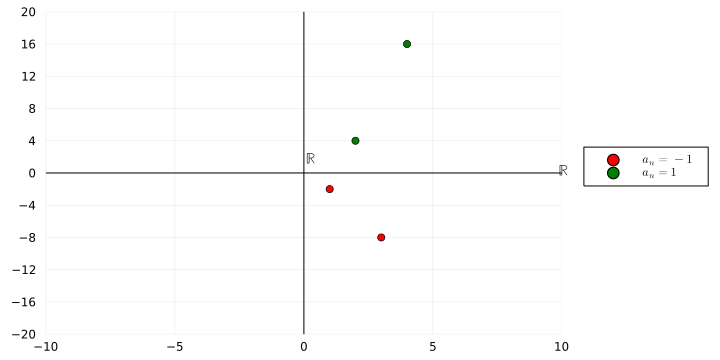

In [24]:
# alpha -2
using Plots, LaTeXStrings
gr()

a, b = -10, 10

h(x) = (-2)^(x)


plot(h, a, b; legend=:outerright, label="", framestyle=:zerolines, 
    xlims = (-10,10), xticks = -10:5:10, 
    ylims = (-20,20), yticks = -20:4:20, 
    linestyle=:dot, size=(720, 360))

scatter!([1], [h(1)], color = "red", label=L"a_{n}=-1", markersize = 4)
scatter!([2], [h(2)], color = "green", label=L"a_{n}=1", markersize = 4)
scatter!([3], [h(3)], color = "red", label="", markersize = 4)
scatter!([4], [h(4)], color = "green", label="", markersize = 4)
scatter!([5], [h(5)], color = "red", label="", markersize = 4)
scatter!([6], [h(6)], color = "green", label="", markersize = 4)
scatter!([7], [h(7)], color = "red", label="", markersize = 4)
scatter!([8], [h(8)], color = "green", label="", markersize = 4)

annotate!([(10.1,0.34, (L"\mathbb{R}", 10, :black)), 
           (0.3,1.82, (L"\mathbb{R}", 10, :black))])

Assume by contradiction that

\begin{equation}
\lim_{n \rightarrow + \infty} \alpha^{n} = + \infty
\end{equation}

then for $M = 1000$ there exists some $N$ such that $∀n > N$ one has

$ \alpha^{n} > 1000$

but if we take an odd number $n > N$ we get that 

$ \alpha^{n}$ is a negative number

and so $\alpha < 0$ and it is not possible that $ \alpha^{n} > 1000$. Contradiction.

It is not possible 

\begin{equation}
\lim_{n \rightarrow + \infty} \alpha^{n} = + \infty
\end{equation}

#### Summarizing:

\begin{equation}
\lim_{n \rightarrow + \infty} \alpha^{n}
\begin{cases}
0 \quad \text{if} \quad -1 < \alpha < 1 \\
1 \quad \text{if} \quad \alpha = 1 \\
+ \infty \quad \text{if} \quad \alpha > 1 \\
\text{does not exist} \quad \text{if} \quad \alpha \le -1 
\end{cases}
\end{equation}

3) Consider a sequence $\{a_{n}\}$ and the sequence generated by the partial sums

\begin{equation}
\begin{split}
S_{n} & = a_{1} + a_{2} + \dots + a_{n} \\
\ & = \sum_{k=1}^{\infty} a_{k}
\end{split}
\end{equation}

in this way we obtain the sequence $\{S_{n}\}$

\begin{equation}
\lim_{n \rightarrow + \infty} S_{n} = \sum_{k=1}^{\infty} a_{k}
\end{equation}

we saw that if $a_{n} = n$ then $S_{n} = \sum_{k=1}^{\infty} k = \frac{n(n+1)}{2}$

But, for generic sequences $\{a_{n}\}$ it is not always possible to find an explicit formula for $S_{n}$.

One case where we can find an explicit formula is the case of the "geometric series"

$a_{n} = \alpha^{n}$ for some $|\alpha| < 1$ ($-1 < \alpha < 1$)

in this case

\begin{equation}
\begin{split}
S_{n} & = a_{0} + a_{1} + a_{2} + \dots + a_{n} \\
\ & = 1 + \alpha^{1} + \dots + \alpha^{n} \\
\ & = \sum_{k=1}^{\infty} \alpha^{k}
\end{split}
\end{equation}

by induction (prove it as an exercise) you can prove that

\begin{equation}
S_{n} = \frac{1 - \alpha^{n+1}}{1 - \alpha} \\
\end{equation}

and hence it is possible to study

\begin{equation}
\begin{split}
\lim_{n \rightarrow + \infty} S_{n} & = \lim_{n \rightarrow + \infty} \frac{1 - \alpha^{n+1}}{1 - \alpha} \\
\ & = \lim_{n \rightarrow + \infty} ( \frac{1}{1 - \alpha} - \frac{\alpha^{n+1}}{1 - \alpha}) \\
\ & = \frac{1}{1 - \alpha} - \lim_{n \rightarrow + \infty} \frac{\alpha^{n+1}}{1 - \alpha} \\
\ & = \frac{1}{1 - \alpha} - \lim_{n \rightarrow + \infty} \frac{\alpha}{1 - \alpha} \cdot \alpha^{n}
\end{split}
\end{equation}

we saw in example (2) that

\begin{equation}
\lim_{n \rightarrow + \infty} \alpha^{n} = 0 \quad \text{if} \quad |\alpha|<1
\end{equation}

observe that
\begin{equation}
\lim_{n \rightarrow + \infty} (\frac{\alpha}{1 - \alpha}) \cdot \alpha^{n} = (\frac{\alpha}{1 - \alpha}) \cdot \lim_{n \rightarrow + \infty} \alpha^{n} = 0
\end{equation}

as a consequence

\begin{equation}
\lim_{n \rightarrow + \infty} S_{n} = \frac{1}{1 - \alpha} - 0 = \frac{1}{1 - \alpha}
\end{equation}

\begin{equation}
\lim_{n \rightarrow + \infty} \alpha^{n} = \frac{1}{1 - \alpha} \quad \text{whenever} \quad |\alpha|<1
\end{equation}

4) Consider $A>1$ and the sequence

$a_{n} = \frac{k}{A^{a}}$

we prove that 

\begin{equation}
\lim_{n \rightarrow + \infty} \frac{n}{A^{n}} = 0
\end{equation}

#### Proof:

Since $A > 1$ then $\sqrt{A}>1$ and hence there is same $h>0$ such that

$\sqrt{A} = 1+h$

then $(\sqrt{A})^{a} = (1+h)^{n} \ge 1 + nh$

this implies that

$ \frac{1}{1+nh} \ge \frac{1}{(\sqrt{A})^{n}} \quad (>0)$

passing to power two we obtain

$\frac{1}{(1+nh)^{2}} \ge \frac{1}{(\sqrt{A})^{2n}} = \frac{1}{A^{n}}$

also observe that

$ \frac{1}{(1+nh)^{2}} \le \frac{1}{nh^{2}}$

hence

$ \frac{1}{A^{n}} \le \frac{1}{(nh)^{2}}$

then multiplying by $n$ both sides we obtain

$ (a_{n}=) \frac{n}{A^{n}} \le \frac{n}{(nh)^{2}} = \frac{1}{n \cdot h^{2}} = \frac{(1/h^{2})}{n}$

since $\frac{n}{A^{n}} > 0$ we get

$ 0 < \frac{n}{A^{n}} \le \frac{(1/h^{2})}{n}$

but 

\begin{equation}
\lim_{n \rightarrow + \infty} \frac{(1/h^{2})}{n} = 0
\end{equation}

then also 

\begin{equation}
\lim_{n \rightarrow + \infty} \frac{n}{A^{n}} = 0
\end{equation}

#### Remark:

\begin{equation}
\begin{split}
a_{n} & = \frac{n^{3} + Z_{n} + 1}{A^{n}}\\
\ & =  \frac{n^{3}}{A^{n}} + \frac{Z_{n}}{A^{n}} + \frac{1}{A^{n}}\\
\end{split}
\end{equation}

$\frac{1}{A^{n}} = 0$

$\frac{n}{A^{n}} = 0$

$\frac{n^{3}}{A^{n}} = \frac{n \cdot n \cdot n}{A^{n/3} \cdot A^{n/3} \cdot A^{n/3}} = \frac{n}{(A^{1/3})^{n}} \cdot \frac{n}{(A^{1/3})^{n}} \cdot \frac{n}{(A^{1/3})^{n}}$

if $A > 1 → A^{1/3} > 1$ call $B:= A^{1/3}$ and still $B>1$

$\frac{n^{3}}{A^{n}} = \frac{n}{B^{n}} \cdot \frac{n}{B^{n}} \cdot \frac{n}{B^{n}} $

$ \frac{n}{B^{n}} = 0$

5) Let again $A > 1$ be fixed and consider the sequence

$ a_{n} = \frac{A^{n}}{n!}$

still we want to prove that

\begin{equation}
\lim_{n \rightarrow + \infty} \frac{A^{n}}{n!} = 0
\end{equation}

Since $A$ is fixed we can consider some natural number $n_{0} > A$/ $n_{0}$ is fixed because $A$ is fixed.

Observe that if $n > n_{0}$ then

$0 < \frac{A^{n}}{n!} = \frac{A \cdot A \cdot A \cdot A \dots \cdot A}{n \cdot (n-1) \cdot (n-2) \dots 1} $

\begin{equation}
\begin{split}
0 < \frac{A^{n}}{n!} & = \frac{A \cdot A \cdot A \cdot A \dots \cdot A}{n \cdot (n-1) \cdot (n-2) \dots 1} \\
\ & = \frac{A \cdot A \cdot A \dots \cdot A \cdot (A)^{n_{0}}}{n \cdot (n-1) \cdot (n-2) \dots n_{0}!} \\
\ & = \frac{A^{n_{0}}}{n_{0}!} \cdot \frac{A}{n} \cdot \frac{A}{n-1} \cdot \dots \frac{A}{(n - n_{0} + 1)} \\
\ & \le \frac{A^{n_{0}}}{n_{0}!} \cdot \frac{A}{n_{0}} \cdot \frac{A}{n_{0}} \dots \frac{A}{n_{0}} \\
\ & = \frac{A^{n_{0}}}{n_{0}!} \cdot (\frac{A}{n_{0}})^{-n_{0}} \cdot (\frac{A}{n_{0}})^{n}
\end{split}
\end{equation}

$\frac{A^{n_{0}}}{n_{0}!} \cdot (\frac{A}{n_{0}})^{-n_{0}}$ does not depend on $n$ and it is just a finite fixed number because $A$ and $n_{0}$ are fixed from the beginning

Observe that $\frac{A}{n_{0}} > 0$ and also $\frac{A}{n_{0}} < 1$ because we chose $n_{0} > A$ so we can call $\alpha = \frac{A}{n_{0}}$ and get $0 < \alpha < 1$.

In particular

$0 < \frac{A^{n}}{n!} \le (\frac{A^{n_{0}}}{n_{0}!} \cdot (\frac{A}{n_{0}})^{n_{0}}) \cdot \alpha^{n}$

$ \frac{A^{n}}{n!} \le C \cdot \alpha^{n} \quad ∀n > n_{0}$

we know that 

\begin{equation}
\lim_{n \rightarrow + \infty} \alpha^{n} = 0
\end{equation}

by exercise (2) since $0 < \alpha < 1$ then we deduce that

\begin{equation}
\lim_{n \rightarrow + \infty} C \cdot \alpha^{n} = 0
\end{equation}

and so we deduce that

\begin{equation}
\lim_{n \rightarrow + \infty} \frac{A^{n}}{n!} = 0
\end{equation}

#### Remark:

If 

\begin{equation}
\lim_{n \rightarrow + \infty} a_{n} = L
\end{equation}

then

\begin{equation}
\lim_{n \rightarrow + \infty} |a_{n}| = |L|
\end{equation}

#### Proof:

if $a,b \in \mathbb{R}$

$ |a| - |b| \le |a - b| $

$ |b| - |a| \le |a - b| $

then

$ | |a| - |b| | \le |a - b| $

and we can apply this in the proof using $a=a_{n}$ and $b=l$

$ | |a_{n}| - |l| | \le | a_{n} - l| $

$ 0 < | |a_{n}| - |l| | \le | a_{n} - l| $

we know that 

\begin{equation}
\lim_{n \rightarrow + \infty} a_{n} = l
\end{equation}

which is equivalent to

\begin{equation}
\lim_{n \rightarrow + \infty} |a_{n} - l| = 0
\end{equation}

and so we deduce that

\begin{equation}
\lim_{n \rightarrow + \infty} | |a_{n}| -|l| | = 0
\end{equation}

and this is equivalent to

\begin{equation}
\lim_{n \rightarrow + \infty} |a_{n}| = |l| 
\end{equation}


## Real Analysis Course 15  (September 7th 2022)

#### Proposition

Let $\{a_{n}\} \ \{b_{n}\}$ are sequences such that 

$\lim_{n \rightarrow + \infty} a_{n} = a$ 

and 

$\lim_{n \rightarrow + \infty} b_{n} = b$ 

for some $a,b \in \mathbb{R}$, then

i) $\lim_{n \rightarrow + \infty} a_{n} \pm b_{n} = a \pm b$

ii) $\lim_{n \rightarrow + \infty} a_{n} \cdot b_{n} = a \cdot b$

iii) if $b_{n} \neq 0$ and $b \neq 0$ then also

$\lim_{n \rightarrow + \infty} \left( \frac{a_{n}}{b_{n}} \right) = \frac{a}{b}$

#### Proof:

ii) observe that

\begin{equation}
\begin{split}
a_{n} \cdot b_{n} - a \cdot b & = a_{n} \cdot b_{n} + (-a_{n} \cdot b + a_{n} \cdot b) - a \cdot b \\
\ & = a_{n}(b_{n} - b) + b(a_{n} - a)
\end{split}
\end{equation}

$∀n \in \mathbb{N}$

$|x+y| \le |x| + |y| \quad ∀x,y \in \mathbb{R}$

thus

\begin{equation}
\begin{split}
0 < |a_{n} \cdot b_{n} - a \cdot b| & = |a_{n} (b_{n} - b) + b(a_{n} - a)|\\
\ & \le |a_{n}| \cdot |(b_{n} - b| + |b| \cdot |(a_{n} - a|
\end{split}
\end{equation}

since $\{a_{n}\}$ is a convergent sequence then we know that $\{a_{n}\}$ is bounded and hence $∃ c > 0$ such that

$|a_{n}| < c \quad ∀n \in \mathbb{N}$

then

$0 < |a_{n} \cdot b_{n} - a \cdot b| \le c \cdot |b_{n} - b| + |b| \cdot |a_{n} - a|$

$|b_{n} - b| \rightarrow 0$ because $b_{n} \rightarrow b$

$|a_{n} - a| \rightarrow 0$ because $a_{n} \rightarrow a$

from here it is possible to see that $∀ \varepsilon > 0$ there is $N$ such that

$∀n > N$ one has

$c \cdot |b_{n} - b| + |b| \cdot |a_{n} - a| < \varepsilon$

thus also $|a_{n} \cdot b_{n} - a \cdot b| < \varepsilon$ and hence

$\lim_{n \rightarrow + \infty} a_{n} \cdot b_{n} = a \cdot b$

iii) by assumption we know that $b \neq 0$ so also $|b| \neq 0$ and $∀ \varepsilon > 0 \ ∃ N$ such that $∀n > N$ one has $b_{n} \in (|b| - \varepsilon,|b| + \varepsilon)$ if we choose $\varepsilon = \frac{|b|}{2}$ then we find some $N$ such that $∀n \ge N$ it holds that

$|b_{n}| \in (|b| - \frac{|b|}{2}, |b| + \frac{|b|}{2})$

$|b_{n}| \in (\frac{|b|}{2}, |b| + \frac{3}{2}|b|)$

in particular we deduce that

$\frac{|b|}{2} \le |b_{n}| \le \frac{3}{2} |b| \quad ∀n > N$

$\frac{1}{|b_{n}|} \le \frac{2}{|b|} \quad ∀n > N$

thus we get that the sequence $\{\frac{a}{|b_{n}|}\}$ is bounded. Indeed

If $[N]$ is the biggest natural number $<N$ we get that

$\frac{1}{|b_{n}|} \le \frac{1}{|b_{1}|} + \frac{1}{|b_{2}|} + \dots + \frac{1}{|b_{[N]}|} + \frac{2}{|b|} \quad ∀n \in \mathbb{N}$

$\frac{1}{|b_{1}|} + \frac{1}{|b_{2}|} + \dots + \frac{1}{|b_{[N]}|} + \frac{2}{|b|} =: D$

$D>0$

Then we observe that

\begin{equation}
\begin{split}
0 < \left| \frac{a_{n}}{b_{n}} - \frac{a}{b} \right| & = \left| \frac{a_{n} \cdot b - a \cdot b_{n}}{b \cdot b_{n}} \right| = \left| \frac{a_{n} \cdot b - ab + ab - ab_{n}}{b \cdot b_{n}} \right| \\
\ & \le \frac{|b| \cdot |a_{n} - a|}{|b_{n}| \cdot |b|} + \frac{|a| \cdot |b_{n} - b|}{|b| \cdot |b_{n}|} \\
\ & \frac{1}{|b_{n}|} \cdot |a_{n} - a| + \frac{|a|}{|b|} \cdot \frac{1}{|b_{n}|} \cdot |b_{n} - b| \\
\ & \le D \cdot |a_{n} - a| + \frac{|a|}{|b|} \cdot D \cdot |b_{n} - b|
\end{split}
\end{equation}

we deduce that 

$\lim_{n \rightarrow + \infty} \frac{a_{n}}{b_{n}} = \frac{a}{b}$

#### Remark

We used heavily that 

$a_{n} \rightarrow a$ and $b_{n} \rightarrow b$ and the numbers $a,b \in \mathbb{R}$ are finite.

When at least one of the limits ($a$ or $b$) is infinite these rules are not always true.

Not determined forms:

$ \infty - \infty \ ; \ 0 \cdot \infty \ ; \ \frac{\infty}{\infty} \ ; \ \frac{0}{0}$

#### Theorem ("Two Policemen")

Let $\{a_{n}\}, \{b_{n}\},\{c_{n}\}$ be such that $∃n_{0} \in \mathbb{N}$ for which $∀n \ge n_{0}$ it holds

$ a_{n} \le b_{n} \le c_{n}$

If we know that 

$\lim_{n \rightarrow + \infty} a_{n} = l$

and

$\lim_{n \rightarrow + \infty} c_{n} = l$

then also

$\lim_{n \rightarrow + \infty} b_{n} = l$

#### Proof

Let $ \varepsilon > 0$ be fixed arbitrary

since $a_{n}, c_{n} \rightarrow l$ then for this $\varepsilon$ there is some $N$ such that $∀n > N$ one has

$|a_{n} - l| < \varepsilon$

$|c_{n} - l| < \varepsilon$

in particular $∀n > N$ we can say that

$l - \varepsilon < a_{n}$ and $c_{n} < l + \varepsilon$

Let now $n > \max\{n_{0}, N\}$ then we obtain

$l - \varepsilon < a_{n} \le b_{n} \le c_{n} < l + \varepsilon$

in particular

$l - \varepsilon < b_{n} < l + \varepsilon ↔ |b_{n} - l| < \varepsilon$

and this means that

$\lim_{n \rightarrow + \infty b_{n} = l}$

#### Theorem ("Keeping the sign")

Let $\{a_{n}\}$ be a sequence such that 

$\lim_{n \rightarrow + \infty} a_{n} = l > 0$

then $\{a_{n}\}$ is definitely positive, namely all but finitely many terms are positive.

#### Proof:

since

$\lim_{n \rightarrow + \infty} a_{n} = l > 0$

$∀ \varepsilon > 0$ there is $N = N(\varepsilon)$ such that $∀n > N$ one has

$|a_{n} - l| < \varepsilon ↔ l - \varepsilon < a_{n} < l + \varepsilon$

choose $\varepsilon = l $, then there is some $N$ such that if $n>N$ then

$|a_{n} - l| ↔ l - l < a_{n} < l + l$

$|a_{n} - l| ↔ 0 < a_{n} < 2l$

### Series of Real Numbers

Let $\{a_{n}\}$ be a sequence of real numbers then consider the partial sums

\begin{equation}
\begin{split}
s_{1} & = a_{1} \\
s_{2} & = a_{1} + a_{2} \\
\vdots \\
s_{n} & = a_{1} + a_{2} + \dots + a_{n} = \sum_{k=1}^{n} a_{k}\\
\end{split}
\end{equation}

The pairs $(\{a_{n}, \{s_{n}\})$ is called "series of geometric term $a_{n}$"

Notation: 

$\sum_{k=1}^{+ \infty} a_{k}$

#### Remark

Notice that the definition of $s_{n}$ can be given recursively

$s_{2} = s_{1} + a_{2}$

$s_{k} = s_{k-1} + a_{k} \quad ∀k \in \mathbb{N}$

#### Example

$a_{n} = n \quad ∀n \in \mathbb{N}$

$s_{n} = \sum_{k=1}^{n} k = \frac{n \cdot (n+1)}{2}$

#### Definition

We say that the series

$\sum_{k=1}{+ \infty} a_{k}$

is convergent if

$\lim_{n \rightarrow + \infty} s_{n} = s \in \mathbb{R}$

the limit exists and is finite.

In this case, the number $s$ is called "sum of the series" and we write

$\sum_{k=1}{+ \infty} a_{k} = s$

#### Example

1) If $a_{n} = n$ then $s_{n} = \frac{n(n+1)}{2}$

since

$\lim_{n \rightarrow + \infty} \frac{n(n+1)}{2} = + \infty$

then

$\sum_{k=1}^{+ \infty} k = + \infty$

2) If $-1 < \alpha < 1$ then we can consider

$a_{n} = \alpha^{n} → s_{n} = \sum_{k=0}^{n} \alpha^{k}$

by induction it is possible to prove that

$\sum_{k=0}^{n} \alpha^{k} = \frac{1-\alpha^{n+1}}{1-\alpha}$

thus

$s_{n} = \frac{1-\alpha^{n+1}}{1-\alpha}$

\begin{equation}
\begin{split}
\lim_{n \rightarrow + \infty} s_{n} & = \lim_{n \rightarrow + \infty} \frac{1-\alpha^{n+1}}{1-\alpha} \\
\ & = \frac{1}{1 - \alpha} - \lim_{n \rightarrow + \infty} \frac{\alpha}{1 - \alpha} \cdot \alpha^{n} \\
\ & = \frac{1}{1 - \alpha} - 0 = \frac{1}{1 - \alpha}
\end{split}
\end{equation}

in this example the limit for $s_{n}$ exists and it is finite, it is $s = \frac{1}{1-\alpha}$ then the series 

$\sum_{k=0}^{+ \infty} \alpha^{k}$ is convergent and

$\sum_{k=0}^{+ \infty} \alpha^{k} = \frac{1}{1-\alpha}$

3) If $\alpha = -1$ we have that $a_{n} = (-1)^{n}$ and hence

\begin{equation}
\begin{split}
s_{1} & = a_{1} = (-1)^{1} = -1 \\
s_{2} & = s_{1} + a_{2} = -1 + (-1)^{2} = 0 \\
s_{3} & = s_{2} + a_{3} = 0 + (-1)^{3} = -1 \\
s_{4} & = 0 \\
s_{5} & = -1 \\
s_{6} & = 0 
\end{split}
\end{equation}

The sequence $\{s_{n}\}$ oscillates between $-1$ and $0$

\begin{equation}s_{n}
\begin{cases}
-1 \quad \text{if} \ n \ \text{odd} \\
0 \quad \text{if} \ n \ \text{even} \\
\end{cases}
\end{equation}

then the $lim_{n \rightarrow + \infty} s_{n}$ does not exist and hence we say that the series

$\sum_{k=1}^{+ \infty} (-1)^{k}$ is indetermined.

Similarly, if $\alpha < -1$ then $\sum_{k=1}^{+ \infty} \alpha^{k}$ is indetermined.

#### Necessary condition to get convergence

If 

$\sum_{k=1}^{+ \infty} a_{k} = s \in \mathbb{R}$

($=$ if the series is convergent)

then

$\lim_{n \rightarrow + \infty} a_{n} = 0$

#### Proof

by assumption, since $\sum_{k=1}^{+ \infty} a_{k} = s \in \mathbb{R}$, we have that

$\lim_{n \rightarrow + \infty} s_{n} = s \in \mathbb{R}$

we observed before that

$s_{n} = s_{n-1} + a_{n} \quad ∀n \in \mathbb{N}$

$a_{n} = s_{n} - s_{n-1} \quad ∀n \in \mathbb{N}$

\begin{equation}
\begin{split}
\lim_{n \rightarrow + \infty} a_{n} & = \lim_{n \rightarrow + \infty} (s_{n} - s_{n-1}) \\
\ & = s - s = 0
\end{split}
\end{equation}

This condition is nevessary but not sufficient to get the convergence.

Indeed if $a_{n} = \frac{1}{n}$ then 

$\lim_{n \rightarrow + \infty} \frac{1}{n} = 0$

but

$\sum_{k=1}^{+ \infty} \frac{1}{k} = + \infty$

### Series with Positive Terms

(monotone sequences)

#### Definition

We say that the sequence $\{a_{n}\}$ is

* Increasing if $a_{n} \le a_{n+1} \quad ∀n \in \mathbb{N}$

* Strictly increasing if $a_{n} < a_{n+1} \quad ∀n \in \mathbb{N}$

* Decreasing if $a_{n} \ge a_{n+1} \quad ∀n \in \mathbb{N}$

* Strictly decreasing if $a_{n} > a_{n+1} \quad ∀n \in \mathbb{N}$

#### Theorem

If $\{a_{n}\}$ is an increasing sequence then $\{a_{n}\}$ has a limit (finite or infinite) and it holds

$\lim_{n \rightarrow + \infty} a_{n} = \sup_{n \in \mathbb{N}} a_{n}$

#### Proof

There are two cases:

1)  $\sup_{n \in \mathbb{N}} a_{n} = l \in \mathbb{R}$ is finite

2) $\sup_{n \in \mathbb{N}} a_{n} = + \infty$

* Case 1)

since 

$\sup_{n \in \mathbb{N}} a_{n} = l < + \infty$

then we can take $\varepsilon>0$ arbitrary fixed and observe that

$a_{n} \le \sup_{n \in \mathbb{N}} a_{n} = l < l + \varepsilon \quad ∀n \in \mathbb{N}$

on the other hand $l - \varepsilon < l = \sup_{n \in \mathbb{N}} a_{n}$ by definition of supremum we know that there must be a natural number $\bar{n} \in \mathbb{N}$ such that $l - \varepsilon < a_{\bar{n}}$

(otherwise it is not possible that $\sup_{n \in \mathbb{N}} a_{n}$ is strictly bigger than $l - \varepsilon$.

Now observe that since $a_{n}$ is increasing we know that

$a_{\bar{n}} \le a_{\bar{n}+1} \le a_{\bar{n}+2} \le \dots$

thus we deduce that $∀n \ge \bar{n}$

$l - \varepsilon < a_{\bar{n}} \le a_{n}$

summarizing, given $\varepsilon>0$ we can take $N = \bar{n}$ and get that $∀n \ge \bar{n}$ it holds

$l - \varepsilon < a_{n} < a_{n} < l + \varepsilon ↔ |a_{n} - l| < \varepsilon$

and this means that

$\lim_{n \rightarrow + \infty} a_{n} = l = \sup_{n \in \mathbb{N}} a_{n}$

* Case 2)

since

$\sup_{n \in \mathbb{N}} a_{n} = + \infty$

and hence the sequence $\{a_{n}\}$ is not bounded from above. This means that $∀ c > 0 \ ∃ \bar{n} = \bar{n} (c)$ such that $a_{\bar{n}} > c$

Fix some $M > 0$ arbitrary, then there is some $\bar{n} = \bar{n}(M)$ such that

$a_{\bar{n}} > M$

but since $\{a_{n}\}$ is increasing then we know that

$a_{\bar{n}} \le a_{\bar{n} + 1} \le a_{\bar{n} + 2} \le \dots$

implying that $∀ n \ge \bar{n}$

$M < a_{\bar{n}} \le a_{n}$

then given $M$ we can take $N = \bar{n}$ and obtain that $∀n \ge \bar{n}$ it holds

$a_{n} > M$

and this means that

$\lim_{n \rightarrow + \infty} a_{n} = + \infty$

#### Exercise

Prove that if $\{a_{n}\}$ is decreasing then

$\lim_{n \rightarrow + \infty} a_{n} = \inf_{n \in \mathbb{N}} a_{n}$

First take $\varepsilon>0$ arbitrary fixed and observe that

$ l - \varepsilon < l =  \inf_{n \in \mathbb{N}} a_{n} \le a_{n} \quad ∀n \in \mathbb{N}$

by definition of infimum:

$ l =  \inf_{n \in \mathbb{N}} a_{n} < l + \varepsilon$

there must be a natural number $\bar{n} \in \mathbb{N}$ such that $a_{\bar{n}} < l + \varepsilon$

since $\{a_{n}\}$ is decreasing then

$\dots \le a_{\bar{n} - 2} \le a_{\bar{n} - 1} \le a_{\bar{n}} \le $

thus we deduce that $∀ n \le \bar{n}$

$a_{n} \le a_{bar{n}} < l + \varepsilon$

Given $\varepsilon>0$ we can take $N=\bar{n}$ and get that $∀n \ge \bar{n}$ it holds

$l - \varepsilon < a_{n} < l + \varepsilon ↔ |a_{n} - l| < \varepsilon$ 

this means that

$ \lim_{n \rightarrow + \infty} a_{n} = l = \inf_{n \in \mathbb{N}}a_{n}$

#### Exercise

Prove similar results when the sequence $\{a_{n}\}$ is definitively increasing or definitively decreasing.

$\{a_{n}\}$ is definitively increasing when $∃ \bar{n} \in \mathbb{N}$ such that $∀ n \ge \bar{n}$ then 

$a_{n} < a_{n+1}$

If $\{a_{n}\}$ is definitively increasing then

$\lim_{n \rightarrow + \infty} a_{n} = \sup_{n \ge \bar{n}} a_{n}$

#### Example


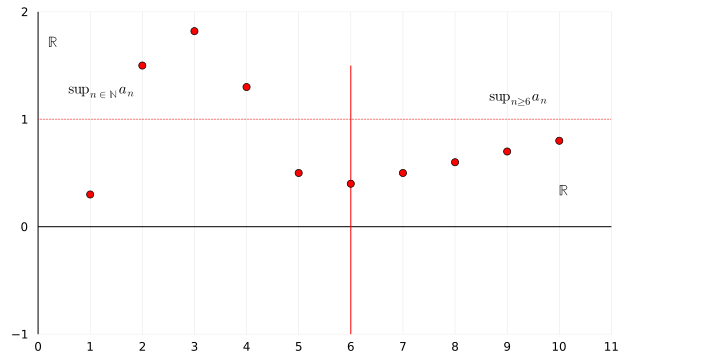

In [21]:
using Plots, LaTeXStrings
gr()

a, b = -1, 11

h(x) = 1

plot(h, a, b; legend=:outerright, label="", color = "red", framestyle=:zerolines, 
    xlims = (0,11), xticks = 0:1:11, 
    ylims = (-1,2), yticks = -1:1:2, 
    linestyle=:dot, size=(720, 360))
plot!([6,6],[-1,1.5], label="", linecolor=:red, linestyle=:solid)

scatter!([1], [0.3], color = "red", label="", markersize = 4)
scatter!([2], [1.5], color = "red", label="", markersize = 4)
scatter!([3], [1.82], color = "red", label="", markersize = 4)
scatter!([4], [1.3], color = "red", label="", markersize = 4)
scatter!([5], [0.5], color = "red", label="", markersize = 4)
scatter!([6], [0.4], color = "red", label="", markersize = 4)
scatter!([7], [0.5], color = "red", label="", markersize = 4)
scatter!([8], [0.6], color = "red", label="", markersize = 4)
scatter!([9], [0.7], color = "red", label="", markersize = 4)
scatter!([10], [0.8], color = "red", label="", markersize = 4)

annotate!([(10.1,0.34, (L"\mathbb{R}", 10, :black)), 
           (0.3,1.72, (L"\mathbb{R}", 10, :black)),
           (9.23,1.18, (L"\sup_{n ≥ 6} a_{n}", 10, :black)),
           (1.23,1.25, (L"\sup_{n \in \mathbb{N}} a_{n}", 10, :black))])

#### Remark

In general, we say that a sequence $\{a_{n}\}$ satisfies a property definitively (from a given index $\bar{n}$) if that property holds $∀n \ge \bar{n}$

Series of positive terms are of this form:

$\sum_{k=1}^{+ \infty} a_{k} \quad , \quad a_{k} \ge 0 \quad ∀k \ge 1$

Then the sequence 

$s_{n} = \sum_{k=1}^{n} a_{k}$

is monotone increasing because

$s_{n} = s_{n-1} + a_{n} \ge s_{n-1} \quad ∀n \in \mathbb{N}$

$a_{n} \ge 0$

Thanks to the theorem we proved before we get that $\lim_{n \rightarrow + \infty} s_{n}$ always exists.

Two possibilities

\begin{equation} \lim_{n \rightarrow + \infty} s_{n}
\begin{cases}
s \in \mathbb{R} \\
+ \infty
\end{cases}
\end{equation}

this means that

$\sum_{k=1}^{+ \infty} a_{k}$

cannot be indetermined.

thus the only possibilities are

$\sum_{k=1}^{+ \infty} a_{k} = s \in \mathbb{R}$

or

$\sum_{k=1}^{+ \infty} a_{k} = + \infty$

In this case, to prove that $\sum_{k=1}^{+ \infty} a_{k}$ is convergent, it is enough to show that there is an upper bound for $\{s_{n}\}$.

#### Theorem (comparison)

Let $\{a_{n}\}$ and $\{b_{n}\}$ be two sequences with positive terms. Assume that there exists some $n_{0} \in \mathbb{N}$ such that

$(0<) a_{n} \le b_{n} \quad ∀n \ge n_{0}$

Then, if the series $\sum_{k=1}^{+ \infty} b_{k}$ is convergent, then also $\sum_{k=1}^{+ \infty} a_{k}$ is convergent. Similarly, if $\sum_{k=1}^{+ \infty} a_{k} = + \infty$ then also $\sum_{k=1}^{+ \infty} b_{k} = + \infty$.

#### Proof

We are assuming that $\sum_{k=1}^{+ \infty} b_{k}$ is convergent.

Denote

$ρ_{n} = \sum_{k=1}^{n} a_{k}$

$σ_{n} = \sum_{k=1}^{n} b_{k}$

then observe that if $n \ge n_{0}$ then

\begin{equation}
\begin{split}
s_{n} & = a_{1} + a_{2} + \dots + a_{n_{0}} + \dots + a_{n} \\
\ & = ρ_{n_{0}} + a_{n_{0}+1} + \dots + a_{n} \\
\ & = ρ_{n_{0}} + \sum_{k=n_{0} + 1}^{n} a_{k} \\
\ & \le ρ_{n_{0}} + \sum_{k=n_{0} + 1}^{n} b_{k} \\
\ & = σ_{n_{0}} + b_{n_{0}+1} + \dots + b_{n} \\
\ & = σ_{n_{0}} + (σ_{n} - σ_{n_{0}})
\end{split} 
\end{equation}

since $\sum_{k=1}^{+ \infty} b_{k}$ is convergent then there exists some $σ \in \mathbb{R}$ such that

$\sum_{k=1}^{+ \infty} b_{k} = σ = \lim_{n \rightarrow + \infty} σ_{n} = \sup_{n \in \mathbb{N}} σ_{n}$

Since $σ_{n}$ is monotone increasing because $b_{n} \ge 0$ thus $\lim_{n \rightarrow + \infty} σ_{n} = \sup_{n \in \mathbb{N}} σ_{n}$.

in particular $σ_{n} \le σ \quad ∀n \in \mathbb{N}$

then we get

$s_{n} = s_{n_{0}} + (σ_{n} - σ_{n_{0}}) \le ρ_{n_{0}} - σ_{n_{0}} + σ$

with $ρ_{n_{0}} - σ_{n_{0}}$ is bounded and finite, and $σ$ is finite $∀n \in \mathbb{N}$

In particular we found an upper bound for $ρ_{n}$, and since $\{ρ_{n}\}$ is a monotone increasing sequence (because $a_{n} \ge 0$) then it must converge to a finite number. We call this number $ρ \in \mathbb{R}$, then we have that

$\sum_{k=1}^{+ \infty} a_{k} = \lim_{n \rightarrow + \infty} ρ_{n} = ρ$

and thus $\sum_{k=1}^{+ \infty} a_{k}$ is convergent.

#### Example

Consider 

$a_{n} = \frac{1}{n!}$

this is a sequence of positive terms and hence $\{s_{n}\}$ is a strictly monotone increasing sequence

$\sum_{n=0}^{+ \infty} \frac{1}{n!}$

We want to show that $\sum_{n=0}^{+ \infty} \frac{1}{n!}$ is convergent.

We want to find some $\{b_{n}\}_{n}$ such that $b_{n} \ge 0 \ ∀n$ and there exists some $n_{0} \in \mathbb{N}$ such that

$\frac{1}{n!} \le b_{n} \quad ∀n \ge n_{0}$

Idea: Choose $b_{n} = \frac{1}{2^{n}}$

we proved yesterday that

$\lim_{n \rightarrow + \infty} \frac{A^{n}}{n!} = 0 \quad \text{if} \ A>1$

in particular if we take $A=2$ we get

$\lim_{n \rightarrow + \infty} \frac{2^{n}}{n!} = 0$

then $∀ \varepsilon > 0$ there is some $N=N(\varepsilon)$ such that $∀n > N$

$\left| \frac{2^{n}}{n!} - 0 \right| < \varepsilon$

Take $\varepsilon = 1$ then there is some $N$ such that $∀ n > N$

$ \frac{2^{n}}{n!} = \left| \frac{2^{n}}{n!} - 0 \right| < 1$

this implies

$\frac{1}{n!} < \frac{1}{2^{n}}$

then we can call $n_{0}$ the smallest natural number $>N$ (i.e. $n_{0}=[N]+1$) and deduce that if $n \ge n_{0} \ (\ge N)$ then

$\frac{1}{n!} < \frac{1}{2^{n}} = b_{n} \rightarrow \frac{1}{n!} \le b_{n} \quad ∀n \ge n_{0}$

observe that

$\sum_{n=0}^{+ \infty} b_{n} = \sum_{n=0}^{+ \infty} \frac{1}{2^{n}} = \sum_{n=0}^{+ \infty} \left( \frac{1}{2} \right)^{n}$

$\frac{1}{2} = \alpha \in (-1,1)$

we know that

$\sum_{n=0}^{+ \infty} \alpha^{n} = \frac{1}{1- \frac{1}{2}} = 2$

then we can apply the comparison theorem to deduce that

$\sum_{n=0}^{+ \infty} \frac{1}{n!}$ 

is convergent.

Thus, there exists a finite number (positive) $s \in \mathbb{R}$ such that

$\sum_{n=0}^{+ \infty} \frac{1}{n!} = s$

this number $s$ is called Nepier constant and it is usually denoted by $e$, thus we write

$e = \sum_{n=0}^{+ \infty} \frac{1}{n!}$

this is an irrational number ($e \approx 2.7 \dots$)


## Real Analysis Course 16  (September 8th 2022)

Nepero number: 

$e = \sum_{n=0}^{+ \infty} \frac{1}{n!} \in \mathbb{R}$

$e$ is a finite number

We prove that $e = \lim_{n \rightarrow + \infty} (1 + \frac{1}{n})^{n}$ in different steps.

* 1 step

$a_{n} = (1 + \frac{1}{n})$ is increasing

(we want to show that $a_{n} \le a_{n+1} \ ∀n$)

\begin{equation}
\begin{split}
a_{n} = \left(1 + \frac{1}{n}^{n} \right) & = \sum_{k=0}^{n}
\begin{pmatrix}
n \\
k
\end{pmatrix} \cdot
\begin{pmatrix}
1 \\
n
\end{pmatrix}^{k} \cdot 1^{n-k} \\
\ & = \sum_{k=0}^{n} \frac{n!}{k! (n-k)!} \cdot \frac{1}{n^{k}} \\
\ & = \sum_{k=0}^{n} \frac{(n+1)\cdot n!}{!} \cdot \frac{1}{n^{k}} \\
\ & = \sum_{k=0}^{n} \frac{(n+1)!}{k! (n-k+1)!} \cdot \frac{1}{n^{k}} \cdot \frac{n+1-k}{n+1} \\
\ & = \sum_{k=0}^{n} 
\begin{pmatrix}
n+1 \\
k
\end{pmatrix} \cdot
\frac{1}{n^{k}} \cdot \left(1 - \frac{k}{n+1} \right) \\
\end{split}
\end{equation}

recall that 

$(1+hk) \le (1+h)^{k} \quad ∀k \in \mathbb{N}$

as soon as $h \ge -1$

We use $(1+hk) \le (1+h)^{k} \quad ∀k \in \mathbb{N}$ with 

$h = \frac{-1}{n+1}$ which is a good choice because

$\frac{-1}{n+1} \ge -1$

Then we get

\begin{equation}
\begin{split}
a_{n} = \dots & = \sum_{k=0}^{n} 
\begin{pmatrix}
n+1 \\
k
\end{pmatrix} \cdot \frac{1}{n^{k}} \cdot \left( 1 - \frac{k}{n+1} \right) \\
\ & \le \sum_{k=0}^{n} 
\begin{pmatrix}
n+1 \\
k
\end{pmatrix} \cdot \frac{1}{n^{k}} \cdot \left( 1 - \frac{1}{n+1} \right)^{k} \\
\ & = \sum_{k=0}^{n} 
\begin{pmatrix}
n+1 \\
k
\end{pmatrix} \cdot \frac{1}{n^{k}} \cdot  \frac{n^{k}}{(n+1)^{k}} \\
\ & = \sum_{k=0}^{n} 
\begin{pmatrix}
n+1 \\
k
\end{pmatrix} \cdot \frac{1}{(n+1)^{k}}\\
\ & = \sum_{k=0}^{n} 
\begin{pmatrix}
n+1 \\
k
\end{pmatrix} \cdot \frac{1}{(n+1)^{k}} \cdot 1^{(n+1-k)}\\
\ & \le \sum_{k=0}^{n+1} 
\begin{pmatrix}
n+1 \\
k
\end{pmatrix} \cdot \frac{1}{(n+1)^{k}} \cdot 1^{(n+1-k)} \\
\ & = \left( 1 + \frac{1}{n+1} \right)^{n+1} = a_{n+1} \\
\end{split}
\end{equation}

Summarizing, we showed that $a_{n} \le a_{n+1} \quad ∀n \in \mathbb{N}$

Thus $\{a_{n}\}$ is a monotone increasing sequence of positive numbers.

Thanks to the Theorem we saw yesterday, we deduce that

$\lim_{n \rightarrow + \infty} a_{n} = \lim_{n \rightarrow + \infty} \left( 1 + \frac{1}{n} \right)^{n}$ 

exists

and also

$\lim_{n \rightarrow + \infty} \left( 1 + \frac{1}{n} \right)^{n} = \sup_{n \in \mathbb{N}} a_{n} = \sup_{n \in \mathbb{N}} \left( 1 + \frac{1}{n}\right)^{n}$

* 2 Step

We show that $\{a_{n}\}$ is bounded from above by $e$.

\begin{equation}
\begin{split}
a_{n} = \left( 1 + \frac{1}{n} \right)^{n} & = \sum_{k=0}^{n} 
\begin{pmatrix}
n \\
k
\end{pmatrix} \frac{1}{n^{k}} \\
\ & = \sum_{k=0}^{n} \frac{n!}{k!(n-k)!} \cdot \frac{1}{n^{k}}\\
\ & = \sum_{k=0}^{n} \frac{n \cdot (n-1) \dots (n-k+1) \cdot (n-k)!}{k! \cdot (n-k)!} \cdot \frac{1}{n^{k}}\\
\ & = \sum_{k=0}^{n} \frac{n}{n} \cdot \frac{(n-1)}{n} \dots \frac{n-k+1}{n} \cdot \frac{1}{k!}\\
\ & < \sum_{k=0}^{n} \frac{1}{k!} < \sum_{k=0}^{+ \infty} \frac{1}{k!} = e \\
\end{split}
\end{equation}

then we deduce that
$a_{n} = e \quad ∀n \in \mathbb{N}$

and hence

$\lim_{n \rightarrow + \infty} a_{n} \le e$

* 3 step

We want to show that 

$\lim_{n \rightarrow + \infty} a_{n} \ge e$

Fix a number $m \in \mathbb{N}$ and take $n > m$.

If $n > m$ we have that

\begin{equation}
\begin{split}
a_{n} & = \sum_{k=0}^{n} 
\begin{pmatrix}
n \\
k
\end{pmatrix} \frac{1}{n^{k}} \\
\ & \ge \sum_{k=0}^{m} 
\begin{pmatrix}
n \\
k
\end{pmatrix} \cdot \frac{1}{n^{k}} = \sum_{k=0}^{m} \frac{n}{n} \cdot \frac{(n-1)}{n} \dots \frac{n-k+1}{n} \cdot {1}{k!}\\
\end{split}
\end{equation}

Notice that $m$ is fixed while we can send $n \rightarrow + \infty$. In other words we want to understand who is

$\lim_{n \rightarrow + \infty} \frac{n}{n} \cdot \frac{(n-1)}{n} \dots \frac{(n-k+1)}{n}$

We can see that

$\lim_{n \rightarrow + \infty} \frac{n}{n} \cdot \frac{(n-1)}{n} \dots \frac{(n-k+1)}{n} = 1$

indeed

$\lim_{n \rightarrow + \infty} 1 \cdot \frac{n(1-\frac{1}{n}}{n} \cdot \frac{n(1-\frac{2}{n})}{n} \dots \frac{n(1-\frac{k}{n} + \frac{1}{n})}{n} = 1$

then

$\lim_{n \rightarrow + \infty} \sum_{k=0}^{m} \frac{n}{n} \cdot \frac{(n-1)}{n} \dots \frac{(n-k+1)}{n} \cdot \frac{1}{k!} = \sum_{k=0}^{m} \left( \lim_{n \rightarrow + \infty} \frac{n}{n} \cdot \frac{(n-1)}{n} \dots \frac{(n-k+1)}{n} \right) \cdot \frac{1}{k!} = \sum_{k=0}^{m} 1 \cdot \frac{1}{k!}$

summarizing we obtained 

$\lim_{n \rightarrow + \infty} a_{n} \ge \lim_{n \rightarrow + \infty} \sum_{k=0}^{m} \frac{n}{n} \cdot \frac{(n-1)}{n} \dots \frac{(n-k+1)}{n} \cdot \frac{1}{k!} $

so

$\lim_{n \rightarrow + \infty} a_{n} \ge \sum_{k=0}^{m} \frac{1}{k!} $

and we are now allowed to send $m \rightarrow + \infty$ and this gives

\begin{equation}
\begin{split}
\lim_{m \rightarrow + \infty} \left( \lim_{n \rightarrow + \infty} a_{n} \right) & \ge \lim_{m \rightarrow + \infty} \sum_{k=0}^{m} \frac{1}{k!} \\
\ & = \sum_{k=0}^{+ \infty} \frac{1}{k!} \\
\ & = e
\end{split}
\end{equation}

observe

$\lim_{m \rightarrow + \infty} \left( \lim_{n \rightarrow + \infty} a_{n} \right) = \lim_{n \rightarrow + \infty} a_{n}$

so in the end we obtain

$\lim_{n \rightarrow + \infty} a_{n} \ge e$

To conclude, we prove in step 1 that $\lim_{n \rightarrow + \infty} a_{n}$ exists because $\{a_{n}\}$ increasing. Then in step 2 and 3 we proved that

$e \le \lim_{n \rightarrow + \infty} a_{n}$ and $\lim_{n \rightarrow + \infty} a_{n} \le e$

so we deduce that

$ e = \lim_{n \rightarrow + \infty} a_{n}$

### Example of series of positive terms: Harmonic Series

$\sum_{n=1}^{+ \infty} \frac{1}{n^{2}}$ for some $\alpha > 0$

we have that

$\sum_{n=1}^{+ \infty} \frac{1}{n^{2}}$ converges if $\alpha > 1$

$\sum_{n=1}^{+ \infty} \frac{1}{n^{2}} = + \infty$ if $0 < \alpha \le 1$

Here we prove that

$\sum_{n=1}^{+ \infty} \frac{1}{n} = + \infty$ and that $\sum_{n=1}^{+ \infty} \frac{1}{n^{2}}$ converges.

Let's prove $\sum_{n=1}^{+ \infty} \frac{1}{n} = + \infty$

$s_{1} = a_{1} = 1$

$s_{2} = s_{1} + a_{2} = 1 + \frac{1}{2} = 1 + 1 \cdot \frac{1}{2}$

$s_{4} = s_{2} + s_{3} + a_{4} = s_{2} + \frac{1}{3} + \frac{1}{4}$

$s_{4} > s_{2} + \frac{1}{4} + \frac{1}{4} = s_{2} + \frac{1}{2}$

$s_{4} = 1 + 1 \cdot \frac{1}{2} + \frac{1}{2} = 1 + 2 \cdot (\frac{1}{2})$

\begin{equation}
\begin{split}
s_{8} = s_{4} + a_{5} + a_{6} + a_{7} + a_{8} & = s_{4} + \frac{1}{5} + \frac{1}{6} + \frac{1}{7} + \frac{1}{8} \\
\ & > s_{4} + \frac{1}{8} + \frac{1}{8} + \frac{1}{8} + \frac{1}{8} \\
\ & = s_{4} + \frac{1}{2} \\
\ & > 1 + 2 \left( \frac{1}{2} \right) + \frac{1}{2} \\
\ & = 1 + 3 \cdot \left( \frac{1}{2} \right)
\end{split}
\end{equation}

by induction we can prove that

$s_{2^{4}} \ge 1 + n \cdot (\frac{1}{2}) \quad ∀n \in \mathbb{N}$

$n=1 → s_{2} = s_{1} + a_{2} = 1 + \frac{1}{2} = 1 + 1 \cdot \frac{1}{2}$

Assume that $s_{2^{4}} \ge 1 + n(\frac{1}{2})$ holds and we want to prove that the sequence inequality is true for $n+1$

\begin{equation}
\begin{split}
s_{2^{n+1}} & = s_{2^{4}} + a_{2^{n} + 1} + a_{2^{n} + 2}  + \dots + a_{2^{n+1}} \\
\ & = s_{2^{n}} + \frac{1}{2^{n}+1} + \frac{1}{2^{n}+2} + \dots + \frac{1}{2 \cdot 2^{n}} \\
\ & > s_{2^{n}} + \frac{1}{2 \cdot 2^{n}} \cdot 2^{n} = s_{2n} + \frac{1}{2} \\
\ & \ge 1 + n \left( \frac{1}{2} \right) + \frac{1}{2} = 1 + (n+1) \cdot \frac{1}{2}
\end{split}
\end{equation}

thus all the terms of the for $s_{2^{n}}$ of the sequence $\{s_{n}\}$ satisfy the inequality

$s_{2^{n}} \ge 1 + n \cdot \frac{1}{2}$

Since $\{s_{n}\}$ is monotone increasing then the limit $\lim_{n \rightarrow + \infty} s_{n}$ exists and it is either finite or $+ \infty$

but 

$ \lim_{n \rightarrow + \infty} 1 + n \cdot \frac{1}{2} = + \infty$

thus

$ \lim_{n \rightarrow + \infty} s_{2^{n}} = + \infty$

$ \lim_{n \rightarrow + \infty} s_{n} = + \infty$

$ \sum_{n=1}^{+ \infty} \frac{1}{n} = + \infty$

let us now show that 

$ \sum_{n=1}^{+ \infty} \frac{1}{n^{2}} $ converges.

Observe that

$0 < \frac{1}{n^{2}} < \frac{1}{n(n-1)}$ if $n \ge 2$

$ \lim_{n \rightarrow + \infty} s_{n} = \lim_{n \rightarrow + \infty} 1 - \frac{1}{n+1} = 1$

in particular

$ \sum_{n=2}^{+ \infty} \frac{1}{n^{2}} \le \sum_{n=2}^{+ \infty} \frac{1}{n \cdot (n-1)}$

$\sum_{n=2}^{+ \infty} \frac{1}{n \cdot (n-1)} = \sum_{n=1}^{+ \infty} \frac{1}{(n+1) \cdot n}$

### Mengali series $\sum_{n=1}^{+ \infty} \frac{1}{(n+1)n}$

interesting because

\begin{equation}
\begin{split}
\frac{1}{(n+1) \cdot n} & = \frac{1+n-n}{(n+1) \cdot n} = \frac{1+n}{(n+1) \cdot n} - \frac{n}{(n+1) \cdot n} \\
\ & = \frac{1}{n} - \frac{1}{n+1} \\
\sum_{n=1}^{+ \infty} \frac{1}{(n+1)n} & = \sum_{n=1}^{+ \infty} \left( \frac{1}{n} - \frac{1}{n+1} \right) 
\end{split}
\end{equation}

\begin{equation}
\begin{split}
s_{1} & = \frac{1}{1} - \frac{1}{2} \\
s_{2} & = s_{1} + a_{2} = 1 - \frac{1}{2} + \frac{1}{2} - \frac{1}{3} = 1 - \frac{1}{3} \\
s_{3} & = s_{2} + a_{3} = 1 - \frac{1}{3} + \frac{1}{3} - \frac{1}{4} = 1 - \frac{1}{4} \\
\vdots \\
s_{n} & = 1 - \frac{1}{(n+1)}
\end{split}
\end{equation}

$\lim_{n \rightarrow + \infty} s_{n} = \lim_{n \rightarrow + \infty} 1 - \frac{1}{n+1} = 1$

in particular

$\sum_{n=1}^{+ \infty} \frac{1}{(n+1)n} = 1$

we recall that

\begin{equation}
\begin{split}
1 & = \sum_{n=1}^{+ \infty} \frac{1}{(n+1) \cdot n} \ge \sum_{n=2}^{+ \infty} \frac{1}{n^{2}} \\
\ & \rightarrow \sum_{n=2}^{+ \infty} \frac{1}{n^{2}} \le 1 \\
\ & \rightarrow \left( \sum_{n=1}^{+ \infty} \frac{1}{n^{2}} \right) - 1 \le 1 \\
\ & \rightarrow \sum_{n=1}^{+ \infty} \frac{1}{n^{2}} \le 2
\end{split}
\end{equation}

$\sum_{n=1}^{+ \infty} \frac{1}{n^{2}} \le 2$ is finite, and the series converges.

#### Remark

If $ 0 < \alpha < 1$ then

$\frac{1}{n} < \frac{1}{n^{2}}$ (because $n^{2} < n^{1}$)

$ \rightarrow \sum_{n=1}^{+ \infty} \frac{1}{n} \le \sum_{n=1}^{+ \infty} \frac{1}{n^{2}}$

and we know that $\sum_{n=1}^{+ \infty} \frac{1}{n} = + \infty$

thus by the comparison theorem we get that

$\sum_{n=1}^{+ \infty} \frac{1}{n^{2}} = + \infty$

* If $ \alpha > 2$ then

$ \frac{1}{n^{\alpha}} < \frac{1}{n^{2}}$ (because $n^{2} < n^{\alpha}$)

$ \rightarrow \sum_{n=1}^{+ \infty} \frac{1}{n^{2}} \le \sum_{n=1}^{+ \infty} \frac{1}{n^{2}} \le 2$

thus by the comparison theorem we get that

$\sum_{n=1^{+ \infty}} \frac{1}{n^{2}}$ converges.

* The case of $ 1 < \alpha < 2$ is a bit more involved, but the argument to show the convergence is similar to that of $\alpha = 2$ once you notive that you can use the

Bernoulli inequality for $\alpha>1$

$\frac{(\alpha - 1)}{(n+1)^{2}} < \frac{1}{n^{2-1}} - \frac{1}{(n+1)^{2-1}} \quad ∀n \in \mathbb{N}$


### Maximum and Minimum Limits of Sequences of Real Numbers

#### Definitions

Let $\{a_{n}\}$ be a sequence. In general we do not know whether $\lim_{n \rightarrow + \infty} a_{n}$ exists.

If $\{a_{n}\}$ does not have an upper bound (meaning that $\sup_{n \in \mathbb{N}} a_{n} = + \infty$), then we say that the maximum limit of $a_{n}$ 

$ \max \lim_{n \rightarrow + \infty} a_{n} = + \infty$

Analogously, if $\{a_{n}\}$ does not have a lower bound (meaning that $\inf_{n \in \mathbb{N}} a_{n} = - \infty$) then we say that the minimum limit of $a_{n}$ is $- \infty$

$ \min \lim_{n \rightarrow + \infty} a_{n} = - \infty$

so we defined

$\sup_{n \in \mathbb{N}} a_{n} = + \infty → \max \lim_{n \rightarrow + \infty} a_{n} = + \infty$

$\inf_{n \in \mathbb{N}} a_{n} = - \infty → \min \lim_{n \rightarrow + \infty} a_{n} = - \infty$

#### Definitions

Let $\{a_{n}\}$ be a sequence of real numbers then a real number $M \in \mathbb{R}$ is an upper bound definitively for $\{a_{n}\}$ if there exists $\bar{n} \in \mathbb{N}$ such that

$ a_{n} \le M \quad ∀ n \ge \bar{n}$

We call Maximum Limit of $\{a_{n}\}$ the $\inf$ of the set of all the upper bounds definitively of $\{a_{n}\}$

$\max \lim_{n \rightarrow + \infty} a_{n} := \inf\{M \in \mathbb{R}\}$

$M$ is an upper bound definitively for $\{a_{n}\}$

A real number $l \in \mathbb{R}$ is a lower bound definitively for  $\{a_{n}\}$ if there exists a $\tilde{n} \in \mathbb{N}$ such that

$a_{n} \ge l \quad ∀n \ge \tilde{n}$

We call minimum limit of $\{a_{n}\}$ the $\sup$ of the set $y_{0}$ of all the lower bounds definitively of $\{a_{n}\}$

$ \min \lim_{n \rightarrow + \infty} a_{n} := \sup\{l \in \mathbb{R}\}$

$l$ is a lower bound definitively for $\{a_{n}\}$

#### Notation:

$ \max \lim_{n \rightarrow + \infty} a_{n} = \bar{\lim_{n \rightarrow + \infty}} a_{n}$

$ \min \lim_{n \rightarrow + \infty} a_{n} = \underline{\lim}_{n \rightarrow + \infty} a_{n}$

#### Remark:

By definition of $\max \lim$ and $\min \lim$ we get that

$\inf_{n \in \mathbb{N}} a_{n} \le \min \lim_{n \rightarrow + \infty} a_{n} \le \max \lim_{n \rightarrow + \infty} a_{n} \le \sup_{n \in \mathbb{N}} a_{n}$

#### Examples

$\inf_{n \in \mathbb{N}} a_{n} = \min{n \in \mathbb{N}} a_{n} $

$\sup_{n \in \mathbb{N}} a_{n} = \max{n \in \mathbb{N}} a_{n} $



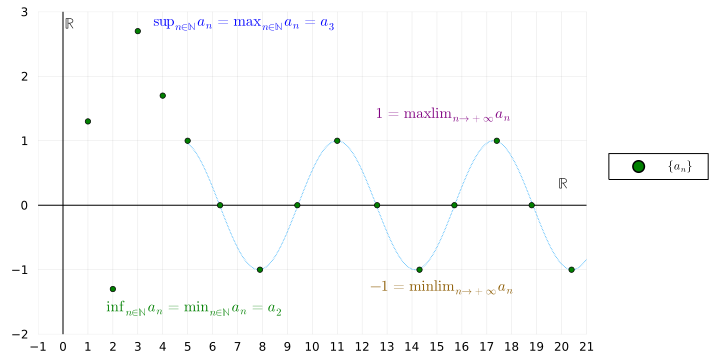

In [47]:
using Plots, LaTeXStrings
gr()

a, b = 5, 21
g(x) = sin.(x+pi)

plot(g, a, b; legend=:outerright, label="", framestyle=:zerolines, 
    xlims = (-1,21), xticks = -10:1:21, 
    ylims = (-2,3), yticks = -2:1:3, 
    linestyle=:dot, size=(720, 360))

scatter!([1], [1.3], color = "green", label=L"\{a_{n}\}", markersize = 3)
scatter!([2], [-1.3], color = "green", label="", markersize = 3)
scatter!([3], [2.7], color = "green", label="", markersize = 3)
scatter!([4], [1.7], color = "green", label="", markersize = 3)
scatter!([5], [1], color = "green", label="", markersize = 3)
scatter!([11], [1], color = "green", label="", markersize = 3)
scatter!([17.4], [1], color = "green", label="", markersize = 3)
scatter!([7.9], [-1], color = "green", label="", markersize = 3)
scatter!([14.3], [-1], color = "green", label="", markersize = 3)
scatter!([20.4], [-1], color = "green", label="", markersize = 3)
scatter!([6.3], [0], color = "green", label="", markersize = 3)
scatter!([9.4], [0], color = "green", label="", markersize = 3)
scatter!([12.6], [0], color = "green", label="", markersize = 3)
scatter!([15.7], [0], color = "green", label="", markersize = 3)
scatter!([18.8], [0], color = "green", label="", markersize = 3)

annotate!([(20.1,0.34, (L"\mathbb{R}", 10, :black)), 
           (0.3,2.82, (L"\mathbb{R}", 10, :black)),
           (5.3,-1.6, (L"\inf_{𝑛∈ℕ} a_{n} = \min_{𝑛∈ℕ} a_{n} = a_{2}", 10, :green)),
           (7.3,2.8, (L"\sup_{𝑛∈ℕ} a_{n} = \max_{𝑛∈ℕ} a_{n} = a_{3}", 10, :blue)),
           (15.3,1.4, (L"1 = \max \lim_{n → + ∞} a_{n}", 10, :purple)),
           (15.23,-1.28, (L"-1 = \min \lim_{n → + ∞} a_{n}", 10, :orange4))])

#### Exercises

Compute $\max \lim$ and $\min \lim$ for

1) $a_{n} = (-1)^{n}$ in this case $\lim_{n \rightarrow + \infty} (-1)^{n}$ does not exist

2) $b_{n} = \frac{(-1)^{n}}{n}$ in this case $\lim_{n \rightarrow + \infty} \frac{(-1)^{n}}{n} = 0$

#### Theorem

Let $\{a_{n}\}$ be a sequence that has limit $L$ if and only if $\max \lim_{n \rightarrow + \infty} a_{n} = \min \lim_{n \rightarrow + \infty} a_{n}$

#### Proof

We assume that $\{a_{n}\}$ has a limit $L$, and we want to show that $\max \lim_{n \rightarrow + \infty} a_{n} = \min \lim_{n \rightarrow + \infty} a_{n}$

$∀ \varepsilon>0 \ ∃ N$ such that $∃n > N$ we have 

$|a_{n} - L| < \varepsilon ↔ L - \varepsilon < a_{n} < L + \varepsilon$

$ L + \varepsilon$ is an upper bound definitively

$ L - \varepsilon$ is a lower bound definitively

$  L - \varepsilon \le \min \lim_{n \rightarrow + \infty} a_{n} \le \max \lim_{n \rightarrow + \infty} a_{n} \le L + \varepsilon \qquad (*)$

The inequalitis (*) are satisfied for every $\varepsilon>0$ thus we can take the limit as $\varepsilon \rightarrow 0$

\begin{equation}
\begin{split}
L & \le \min \lim_{n \rightarrow + \infty} a_{n} \le \max \lim_{n \rightarrow + \infty} a_{n} \le L \\
\rightarrow L & = \min \lim_{n \rightarrow + \infty} a_{n} = \max \lim_{n \rightarrow + \infty} a_{n} 
\end{split}
\end{equation}

We now assume that

$\max \lim_{n \rightarrow + \infty} a_{n} = \min \lim_{n \rightarrow + \infty} a_{n} \qquad (**)$

and we want to prove that $\lim_{n \rightarrow + \infty} a_{n}$ exists and it is equal to the number (**)

* Call

$L =  \max \lim_{n \rightarrow + \infty} a_{n} = \min \lim_{n \rightarrow + \infty} a_{n}$

Let $\varepsilon>0$ be fixed arbitrary, then

* $L + \varepsilon$ is upper bound definitively

Because $L + \varepsilon > L = \max \lim_{n \rightarrow + \infty} a_{n}$

thus $\bar{n} \in \mathbb{N}$ such that

$ a_{n} \le L + \varepsilon \quad ∀n \ge \bar{n}$

* Analogously, $L - \varepsilon$ is a lower bound definitively because

$ L - \varepsilon < L = \min \lim_{n \rightarrow + \infty} a_{n}$

thus $ ∃ \tilde{n} \in \mathbb{N}$ such that

$a_{n} \ge L - \varepsilon \quad ∀n \ge \tilde{n}$

but then if $n \ge \max\{\bar{n},\tilde{n}\}$ we get that

$L - \varepsilon \le a_{n} \le L + \varepsilon ↔ |a_{n} - L| \le \varepsilon$

thus given $\varepsilon>0$ arbitrary fixed, we found $N = \max\{\bar{n}, \tilde{n}\}$ such that if $n>N$ one has

$|a_{n} - L| \le \varepsilon$

thus the definition of limit is satisfied

$\lim_{n \rightarrow + \infty} a_{n} = L$

## Real Analysis Course 17  (September 12th 2022)


#### Proposition

Let $a_{n}$ a bounded sequence, then

$\max \lim_{n \rightarrow + \infty} a_{n} = \inf_{n \in \mathbb{N}} \sup_{k \ge n} a_{k}$

$\min \lim_{n \rightarrow + \infty} a_{n} = \sup_{n \in \mathbb{N}} \sup_{k \ge n} a_{k}$

#### Exercises

1) 

\begin{equation}a_{n}
\begin{cases}
n \cdot e^{-n} \quad \text{if} \ n \ \text{even} \\
n \cdot e^{n} \quad \text{if} \ n \ \text{odd} \\
\end{cases}
\end{equation}

2) 

$a_{n} = \sin \left( n \cdot \frac{\pi}{2} \right)$

3) 

$a_{n} = n^{1+(-1)^{n}}$

4) 

$a_{n} = (-1)^{n} \cdot \frac{n^{2}}{2n^{2} - 1}$

5) 

$a_{n} = \frac{1 + (-1)^{n} \cdot n}{1 + n}$

Sequences of real numbers and topology of $\mathbb{R}$

#### Theorem

Let $A \subset \mathbb{R}$, then $x_{0} \in \bar{A}$ if and only if there exists a sequence $\{x_{n}\}$ of points of $A$ converging to $x_{0}$.

#### Proof

Assume that there is some $\{x_{n}\}$ with $x_{n} \in A \quad ∀n$ such that $x_{n} \rightarrow x_{0}$.

By contradiction we say that $x_{0} \notin \bar{A}$, meaning that $x_{0} \in \bar{A}^{c} = \mathbb{R} \setminus \bar{A}$ then there exists a neighborhood of $x_{0}$ that we call $I(x_{0}, π) = (x_{0} - π, x_{0} + π)$ for some $π > 0$ such that

$x_{0} \in I(x_{0}, π) \subset \bar{A}^{c}$

(this is true because $\bar{A}$ closed thus $\bar{A}^{c}$ open)

in $I(x_{0}, π)$ there are no poiints of $\bar{A}$, in particular there are no points of $A$. In particular, $x_{0}$ cannot be a limit of $\{x_{n}\}$ since $\{x_{n}\} \in A \quad ∀n$ and hence there should be infinitely many $x_{n}$ inside $I(x_{0}, π)$. Contradiction!

thus,

$x_{0} \in \bar{A}$

$\rightarrow \quad$ we assume that $x_{0} \in \bar{A}$.

Recall that

$\bar{A} = A \cup ∂A$

$∂A$ is a set of all limit points of $A$.

Since

\begin{equation}x_{0} \in \bar{A}
\begin{cases}
x_{0} \in A \\
x_{0} \in ∂A
\end{cases}
\end{equation}

* If $x_{0} \in A$ then we can select

$x_{n} = x_{0} \quad ∀n$

and so this $\{x_{n}\}$ is a sequence of points of $A$ that converges to $x_{0}$.

* If $x_{0} \in ∂A$

then by definition this means that any neighborhood $I(x_{0}, π)$ of $x_{0}$ intersects $A$.

$∀ π > 0$ we can find a point 

$x_{π} \in I(x_{0}, π) \cap A = (x_{0} - π, x_{0} + π) \cap A$

Let $n \in \mathbb{N}$, take $π = \frac{1}{n}$ then call

$x_{n} := x_{π}$

thus $x_{n} \in \mathbb{A}$ and $x_{n} \in \left( x_{0} - \frac{1}{n}, x_{0} + \frac{1}{n} \right)$

$|x_{n} - x_{0}| < \frac{1}{n}$

Doing this argument for every $n \in \mathbb{N}$ we create in this way a sequence $\{x_{n}\}$ of points of $A$ such that $∀n \in \mathbb{N}$ it holds

$|x_{n} - x_{0}| < \frac{1}{n}$

this implies that $x_{n} \rightarrow x_{0}$

#### Corollary

A set $A \subset \mathbb{R}$ is closed if and only if for any sequence $\{x_{n}\}$ of points of $A$ converging to $x_{0}$, then $x_{0} \in A$.

#### Proof

$\rightarrow$ assume that $A$ is closed and consider $\{x_{n}\}$ a sequence of points of $A$ that is converging to some $x_{0} \in \mathbb{R}$.

We want to show that $x_{0} \in A$.

From the previous theorem we know that

$x_{0} \in \bar{A}$

but $A$ is closed hence $\bar{A} = A$, thus $x_{0} \in \bar{A} = A \rightarrow x_{0} \in A$

$\leftarrow$ assume that if $\{x_{n}\}$ is a sequence of points of $A$ such $x_{n} \rightarrow x_{0} \in \mathbb{R}$ then $x_{0} \in A$. We want to show that $A$ is closed.

To prove that $A$ is closed, it is enough to show that $\bar{A} \subseteq A \ (\subseteq \bar{A})$

$\bar{A} = A \cup ∂A$

what we really need to show is that $∂A \subseteq A$

Let $x_{0} \in ∂A$ then by definition of $∂A$ (set of limit points of $A$) we know that $∀π>0$ the neighborhood $I(x_{0}, π)$ intersects $A$ and hence there exists some $x_{π} \in I(x_{0}, π) \cap A$

as before let consider 

$π = \frac{1}{n}$ for $n \in \mathbb{N}$

and call $x_{n} = x_{π}$

then

$x_{n} \in A$ and $|x_{n} - x_{0}| < \frac{1}{n}$

In particular, we constructed a sequence $\{x_{n}\}$ of points of $A$ such that $x_{n} \rightarrow x_{0}$.

But the assumption of this case tells us that then $x_{0} \in A$

and hence we get $∂A \subseteq A$

thus also

$A \cup ∂A \subseteq A$

$\bar{A} \subseteq A (\subseteq \bar{A})$

$\rightarrow A = \bar{A}$

$\rightarrow A$ closed


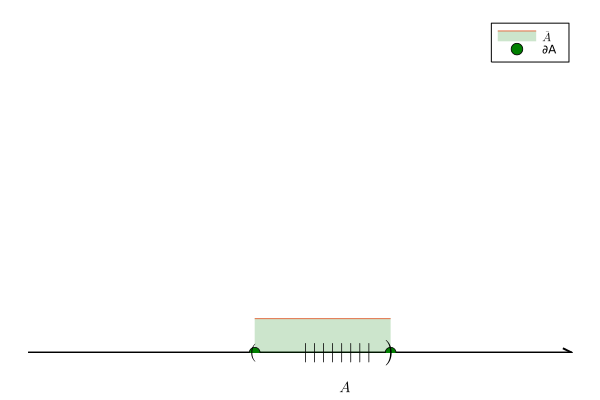

In [6]:
using Plots, LaTeXStrings, Plots.PlotMeasures

f(x) = 0.1

plot([0.3,0.9],[0,0],arrow=true,color=:black,linewidth=2, xticks=false, yticks=false,
     ylims=(0,1), showaxis=false, label="", bottom_margin = 10mm)
plot!(f,0.55,0.7, fill=(0, 0.2, :green), label=L"\bar{A}")

annotate!([(0.55,0, (L"(", 12, :black))])
annotate!([(0.61,0, (L"|", 13, :black))])
annotate!([(0.62,0, (L"|", 13, :black))])
annotate!([(0.63,0, (L"|", 13, :black))])
annotate!([(0.64,0, (L"|", 13, :black))])
annotate!([(0.65,0, (L"|", 13, :black))])
annotate!([(0.66,0, (L"|", 13, :black))])
annotate!([(0.67,0, (L"|", 13, :black))])
annotate!([(0.68,0, (L"|", 13, :black))])
annotate!([(0.7,0, (L")", 17, :black))])
annotate!([(0.65,-0.1, (L"A", 10, :black))])

scatter!([0.55], [0], color = "green", label="∂A", markersize = 6)
scatter!([0.7], [0], color = "green", label="", markersize = 6)

Sequence of points of $A$ can only approach numbers inside $A$ or onto $∂A$.

Thus if you know a priori that all the limits are in $A$ then it means that the boundary of $A$ is included in $A \rightarrow A$ closed

#### Definition

Let $\{a_{n}\}, \{b_{n}\}$ be two sequences. we say that $\{b_{n}\}$ is a subsequence of $\{a_{n}\}$ if there exits a strictly increasing sequence of natural numbers $\{k_{n}\}$ such that

$b_{n} = a_{k_{n}} \quad ∀n \in \mathbb{N}$

examples:

$k_{n} = 2n$ even indexes

$k_{n} = 2n - 1$ odd indexes

$n = 1,2,3, \dots$

#### Theorem

If $\{a_{n}\}$ has limit $l$

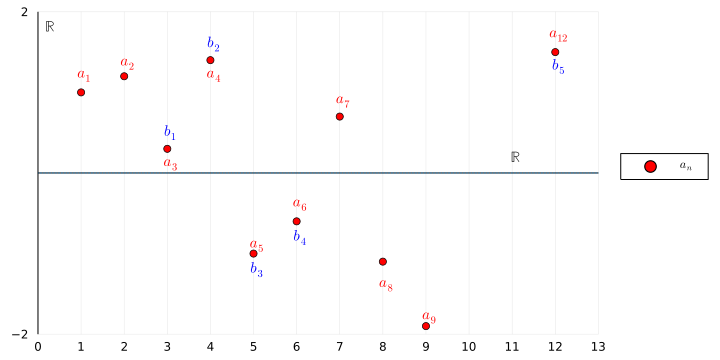

In [38]:
using Plots, LaTeXStrings
gr()

a, b = -13, 13

h(x) = 0

plot(h, a, b; legend=:outerright, label="", framestyle=:zerolines, 
    xlims = (0,13), xticks = 0:1:13, 
    ylims = (-2,2), yticks = -2:4:2, 
    linestyle=:dot, size=(720, 360))

scatter!([1], [1], color = "red", label=L"a_{n}", markersize = 4)
scatter!([2], [1.2], color = "red", label="", markersize = 4)
scatter!([3], [0.3], color = "red", label="", markersize = 4)
scatter!([4], [1.4], color = "red", label="", markersize = 4)
scatter!([5], [-1], color = "red", label="", markersize = 4)
scatter!([6], [-0.6], color = "red", label="", markersize = 4)
scatter!([7], [0.7], color = "red", label="", markersize = 4)
scatter!([8], [-1.1], color = "red", label="", markersize = 4)
scatter!([9], [-1.9], color = "red", label="", markersize = 4)
scatter!([12], [1.5], color = "red", label="", markersize = 4)

annotate!([(11.1,0.2, (L"\mathbb{R}", 10, :black)), 
           (1.1,1.2, (L"a_{1}", 10, :red)), 
           (2.1,1.35, (L"a_{2}", 10, :red)), 
           (3.1,0.1, (L"a_{3}", 10, :red)), 
           (4.1,1.2, (L"a_{4}", 10, :red)), 
           (5.1,-0.91, (L"a_{5}", 10, :red)), 
           (6.1,-0.4, (L"a_{6}", 10, :red)), 
           (7.1,0.88, (L"a_{7}", 10, :red)), 
           (8.1,-1.4, (L"a_{8}", 10, :red)), 
           (9.1,-1.8, (L"a_{9}", 10, :red)), 
           (12.1,1.7, (L"a_{12}", 10, :red)), 
           (3.1,0.5, (L"b_{1}", 10, :blue)), 
           (4.1,1.6, (L"b_{2}", 10, :blue)), 
           (5.1,-1.2, (L"b_{3}", 10, :blue)), 
           (6.1,-0.8, (L"b_{4}", 10, :blue)), 
           (12.1,1.32, (L"b_{5}", 10, :blue)), 
           (0.3,1.82, (L"\mathbb{R}", 10, :black))])

The graph above tells that

$a_{3}$ corresponds to $b_{1}$

$a_{4}$ corresponds to $b_{2}$

$a_{5}$ corresponds to $b_{3}$

$\vdots$

$a_{12}$ corresponds to $b_{5}$

#### Theorem

If $\{a_{n}\}$ has limit $l$, then any subsequence $b_{n} = a_{k_{n}}$ of $a_{n}$ has the same limit $l$.

#### Proof

#### Remark

If $\{a_{n}\}$ has subsequences with different limits, then $\{a_{n}\}$ does not have limit.

example:

\begin{equation} a_{n} = (-1)^{n}
\begin{cases}
b_{n} = a_{2n} = 1 \quad ∀n \\
c_{n} = a_{2n - 1} = -1 \quad ∀n
\end{cases}
\end{equation}

#### Theorem

Any sequence $\{a_{n}\}$ has a subsequence $\{b_{n}\}$ such that

$\lim_{n \rightarrow + \infty} b_{n} = \max \lim_{n \rightarrow + \infty} a_{n}$

#### Proof

We prove the case where

$\max \lim_{n \rightarrow + \infty} a_{n} = l < + \infty$

We know that $∀ \varepsilon > 0$ then

$l - \varepsilon < a_{i} < l + \varepsilon$ for infinitely many $i \in \mathbb{N}$

choose $\varepsilon=1$ and call $a_{k_{1}}$ one of the points of $a_{i}$ such that

$l - 1 < a_{i} < l + 1$

thus we fix $a_{k_{1}}$ such that 

$l - 1 < a_{k_{1}} < l + 1$

choose then $\varepsilon = \frac{1}{2}$ and call $a_{k_{2}}$ one of the $a_{i}$ such that

$l - \frac{1}{2} < a_{i} < l + \frac{1}{2} \quad$ and $i > k_{1}$

thus we fix $a_{k_{2}}$ with $k_{2} > k_{1}$ such that

$l - \frac{1}{2} < a_{k_{2}} < l + \frac{1}{2}$

we constructed in this way a subsequence $a_{k_{n}} = b_{n}$ satisfying

$l - \frac{1}{n} < a_{k_{n}} < l + \frac{1}{n}$

$l - \frac{1}{n} < b_{n} < l + \frac{1}{n}$

$ |b_{n} - l| < \frac{1}{n}$

thus

$\lim_{n \rightarrow + \infty} b_{n} = l = \max \lim_{n \rightarrow + \infty} a_{n}$

#### Exercise

Do the proof for $l = + \infty$ and for the case of $\min \lim_{n \rightarrow + \infty} a_{n}$

both when

$\min \lim_{n \rightarrow + \infty} a_{n} = l > - \infty$

$\min \lim_{n \rightarrow + \infty} a_{n} = l = - \infty$

#### Theorem

Let $\{a_{n}\}$ be a sequence and let $a \in \mathbb{R}$.

If for any subsequence of $\{a_{n}\}$ you can extract a subsubsequence converging to $a$, then

$\lim_{n \rightarrow + \infty} a_{n} = a$

#### Proof

let $l = \max \lim_{n \rightarrow + \infty} a_{n}$ and consider the subsequence $\{b_{n}\}$ of $\{a_{n}\}$ that is converging to $l$

(we know this holds thanks to the previous theorem)

By assumption we know that we can extract a subsequence $\{a_{n}\}$ of $\{b_{n}\}$ converging to $a$.

$\lim_{n \rightarrow + \infty} c_{n} = a$

observe that, since $\{c_{n}\}$ is a subsequence of $\{b_{n}\}$ and $\{b_{n}\}$ is the subsequence of $\{a_{n}\}$ converging to $\max \lim_{n \rightarrow + \infty} a_{n} = l$

we deduce that

$a = \lim_{n \rightarrow + \infty} c_{n} = \lim_{n \rightarrow + \infty} b_{n} = \max \lim_{n \rightarrow + \infty} a_{n} = l$

we get $a = l = \max \lim_{n \rightarrow + \infty} a_{n}$

on the other hand, we can call

$L = \min \lim_{n \rightarrow + \infty} a_{n}$ and consider the subsequence $\{d_{n}\}$ of $\{a_{n}\}$ such that

$\lim_{n \rightarrow + \infty} d_{n} = \min \lim_{n \rightarrow + \infty} a_{n} = L$

(this sequence exists by the previous theorem)

by assumption we know that we can extract a subsequence $\{e_{n}\}$ of $\{d_{n}\}$ such that

$\lim_{n \rightarrow + \infty} e_{n} = a$

But then it holds

$a = \lim_{n \rightarrow + \infty} e_{n} = \lim_{n \rightarrow + \infty} d_{n} = \min \lim_{n \rightarrow + \infty} a_{n} = L$

we get $a = L = \min \lim_{n \rightarrow + \infty} a_{n}$

Summarizing, we obtain

$a = \max \lim_{n \rightarrow + \infty} a_{n} = \min \lim_{n \rightarrow + \infty} a_{n}$

$\rightarrow$ then $\lim_{n \rightarrow + \infty} a_{n}$ exists and is equal to $a$

$\lim_{n \rightarrow + \infty} a_{n} = a$

#### Theorem (Weierstrass)

From any bounded sequence, one can extract a converging subsequence (converging to a finite limit).

#### Proof

If $\{a_{n}\}$ is bounded then

$\max \lim_{n \rightarrow + \infty} a_{n} < + \infty$

and we know that there is a subsequence $\{b_{n}\}$ of $\{a_{n}\}$ such that

$\lim_{n \rightarrow + \infty} b_{n} = \max \lim_{n \rightarrow + \infty} a_{n} < + \infty$

thus $\{b_{n}\}$ is a converging subsequence of $\{a_{n}\}$.


#### Definition (Sequentially compact sets)

A set $k \subset \mathbb{R}$ is (sequentially) compact if from any sequence taking values on $k$ one can extract a subsequence converging to a point of $k$.

#### Theorem

A set $k \subset \mathbb{R}$ is compact if and only if $k$ is closed and bounded.

#### Proof

"$\leftarrow \quad$" assume that $k$ is bounded and closed. Take $\{x_{n}\}$ sequence of points of $k$, we need to show that it is possible to extract a subsequence of $\{x_{n}\}$ that is converging to a point of $k$.

Since $k$ is bounded, then the sequence $\{x_{n}\}$ is also bounded then by weierstrass theorem we get that there is a subsequence $\{y_{n}\}$ of $\{x_{n}\}$ that is converging to a finite limit $x \in \mathbb{R}$.

$\lim_{n \rightarrow + \infty} y_{n} = x \in \mathbb{R}$ (finite)

But $k$ is closed and thus we know that any converging sequence of points of $k$ has limit in $k$.

$\{y_{n}\}$ in a sequence of points of $k$ (because it is a subsequence of $\{x_{n}\}$ and $x_{n} \in k \quad ∀n \in \mathbb{N}$) and $\{y_{n}\}$ is a converging sequence.

$k$ closed $\rightarrow$ the limit of $\{y_{n}\}$ must be in $k$

$\rightarrow \quad \lim_{n \rightarrow + \infty} y_{n} = x \in k$

thus we started from a sequence $\{x_{n}\}$ of points of $k$, we could extract a subsequence $y_{n}$ such that

$\lim_{n \rightarrow + \infty} y_{n} = x \quad$ and $x \in k$

this is precisely the definition of compact set.

"$\rightarrow$" assume now that $k$ is compact and we want to prove that $k$ is bounded and closed.

We first show that $k$ is bounded:

by contradiction say that it is not true and hence

$\sup k = + \infty$ or $\inf k= - \infty$.

We develop the case $\sup k = + \infty$

then $∃ x_{n} \in k$ such that

$\lim_{n \rightarrow + \infty} x_{n} = + \infty$

$∀ M > 0 \quad ∃ \bar{n} \in \mathbb{N}$ such that $∀ n \ge \bar{n}$

$x_{n} > M$

you can take all the values 

$M = 1, \quad M = 2, \quad M = 3, \dots, \quad M \in \mathbb{N}$

we can construct a sequence in this way:

* given $M=1$ we call $y_{1} = x_{\bar{n}}$ with $\bar{n}$ of $M=1$

* given $M=2$ we call $y_{2} = x_{\bar{n}}$ with $\bar{n}$ of $M=2$

thus the sequence $\{y_{M}\}_{M \in \mathbb{N}}$ satisfies

$y_{M} > M \quad M \in \mathbb{N}$

$\{y_{M}\}$ does not have a subsequence converging to a point of $k$.

This is against the assumption that $k$ is compact. Contradiction!

$\rightarrow \quad$ $k$ must be bounded

Let us now prove that $k$ is closed:

To prove that $k$ is closed we need to show that if $\{x_{n}\}$ is a converging sequence of elements of $k$ then the limit must be a point of $k$.

Thus let $\{x_{n}\}$ be a sequence of points of $k$ and assume that $\{x_{n}\}$ is converging to some limit $x \in \mathbb{R}$.

We need to show that $x \in k$.

Being $k$ compact, we know that there exists a subsequence $\{y_{n}\}$ of $\{x_{n}\}$ converging toa  apoint $y \in k$.

But $\{x_{n}\}$ is a converging sequence and $\{y_{n}\}$ is its subsequence, hence

$\lim_{n \rightarrow + \infty} y_{n} = \lim_{n \rightarrow + \infty} x_{n}$

but

$\lim_{n \rightarrow + \infty} x_{n} = x \in \mathbb{R}$

and

$\lim_{n \rightarrow + \infty} y_{n} = y \in k$

the only possibility is that

$x = y \rightarrow x \in k$

thus this means that $k$ is closed.

### Cauchy's Criterion

#### Definition

A sequence $\{a_{n}\}$ of real numbers is a Cauchy's sequence if for any $\varepsilon>0$ there exists $N \in \mathbb{R}$ such that $∀n,m > N$ we have that

$|a_{n} - a_{m}| < \varepsilon$

#### Theorem

A sequence $\{a_{n}\}$ of real numbers converges to a finite limit $l$ if and only if $\{a_{n}\}$ is a Cauchy's sequence.

#### Proof

"$\rightarrow \quad$" we assume that $\lim_{n \rightarrow + \infty} a_{n} = l \in \mathbb{R}$

Take $\frac{\varepsilon}{2} > 0 $ arbitrary fixed, then by definition of the limit

$∃ N \in \mathbb{R}$ such that if $n > N$ we have

$|a_{n} - l| < \frac{\varepsilon}{2}$

if now $n,m >N$ we get that

\begin{equation}
\begin{split}
|a_{n} - a_{m}| & = |a_{n}-l + l-a_{m}|\\
\ & \le |a_{n} - l| + |l - a_{m}| \\
\ < \frac{\varepsilon}{2} + \frac{\varepsilon}{2} = \varepsilon
\end{split}
\end{equation}

"$\leftarrow \quad$" assume now that $\{a_{n}\}$ is a Cauchy sequence, we want to prove that $\lim_{n \rightarrow + \infty} a_{n} = l \in \mathbb{R}$.

We want to use Weierstrass theorem, and in order to do this we need to show that $\{a_{n}\}$ is a bounded.

Take $\varepsilon=1$ in the definition of Cauchy sequence:

$\varepsilon=1 \rightarrow ∃N \in \mathbb{R}$ such that if $n,m > N$ then

$|a_{n} - a_{m}| < 1$

in particular if $[N]$ (the integer part of $N$) then

$|a_{n} - a_{m}| < 1 \quad ∀n,m > [N] \in \mathbb{N}$

choose $m=[N]+1 \in \mathbb{N}$ then

$|a_{n} - a_{[N]+1}| < 1 \quad ∀n \ge [N] + 1$

$a_{[N]+1} - 1 < a_{n} < a_{[N]+1} + 1 \quad ∀n \ge [N]+1$

and hence the sequence $\{a_{n}\}$ is bounded from above by

$M = |a_{1}| + |a_{2}| + \dots + |a_{[N]}| + (|a_{[N]+1}|+1)$

because if $n \le [N]$ then

\begin{equation}
\begin{split}
|a_{n}| & \le |a_{1}| + \dots + |a_{[N]}| \\
\ & \le |a_{1}| + \dots + |a_{[N]}| + (|a_{[N]+1}|+1) \\
\ & = M
\end{split}
\end{equation}

if $n \ge [N] + 1$ then

\begin{equation}
\begin{split}
|a_{n}| & \le |a_{[N]+1}| + 1 \\
\ & \le |a_{[N]+1}| + 1 + |a_{1}| + \dots + |a_{[N]}| \\
\ & = M
\end{split}
\end{equation}

since $\{a_{n}\}$ is bounded then weierstrass theorem ensures that there exists a subsequence $\{a_{k_{n}}\}$ that converges to a finite limit $l \in \mathbb{R}$.

we are not finished because we want to show that the whole sequence $\{a_{n}\}$ converges to the limit $l$.

Take $\frac{\varepsilon}{2}>0$ arbitrary fixed.

by the Cauchy property we know that $∃ N \in \mathbb{R}$ such that $∀n,m > N$

$|a_{n} - a_{m}| < \frac{\varepsilon}{2}$

since $\{a_{k_{n}}\}$ has limit $l$, only a finite number of elements of $\{a_{k_{n}}\}$ are not in $I(l, \frac{\varepsilon}{2}) = (l - \frac{\varepsilon}{2}, l + \frac{\varepsilon}{2})$.

In particular there exists some $k \in \mathbb{R}$ such that if $k_{n} > k$ then

$|a_{k_{n}} - l| < \frac{\varepsilon}{2}$

thus if $n$ and $k_{n}$ are bigger than $\max\{N,k\}$ then we get that

$|a_{n} - a_{k_{n}}| < \frac{\varepsilon}{2}$

$| a_{k_{n}} - l| < \frac{\varepsilon}{2}$

this means that

\begin{equation}
\begin{split}
|a_{n} - l| & \le |a_{n} = a_{k_{n}}| + |a_{k_{n}} - l| \\
\ & < \frac{\varepsilon}{2} + \frac{\varepsilon}{2} = \varepsilon
\end{split}
\end{equation}

Summarizing, given $\varepsilon > 0$ we have that if $n > \max\{N,k\}$ then

$|a_{n} - l| < \varepsilon$

this is exactly the definition of convergence to a finite limit $l$.

thus

$\lim_{n \rightarrow + \infty} a_{n} = l$

Functions in $\mathbb{R}$: properties

$f: D \rightarrow \mathbb{R}$

$D \subset \mathbb{R}$ domain of definition of $f$

$x \in D \rightarrow f(x) \in \mathbb{R}$

* The set of the couples $(x, f(x))$ when $x \in D$ is called graph of $f$

#### Remark

A function associates only one single real number to $x$.

#### Definition

A function $f: D \rightarrow \mathbb{R}$ is bounded from above if $∃ M \in \mathbb{R}$ such that

$f(x) \le M \quad ∀x \in D$

A function $f: D \rightarrow \mathbb{R}$ is bounded from below if $∃m \in \mathbb{R}$ such that

$f(x) \ge m \quad ∀x \in D$

we say that $f$ is bounded if it is at the same time bounded from above and below hence

$m \le f(x) \le M \quad ∀x \in D$

#### Examples

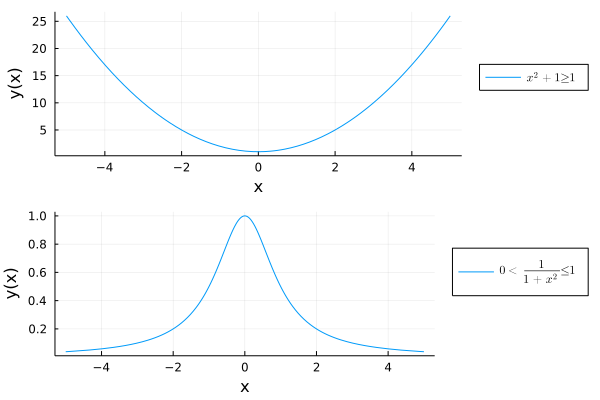

In [13]:
using Plots, LaTeXStrings
gr()

# write pi or π is the same

f(x) = x^(2) + 1
g(x) = 1/(1 + x^(2))

p1 = plot(f, -5, 5)
p2 = plot(g, -5, 5)

s1 = L"x^{2} + 1 ≥ 1 ";
s2 = L"0 < \frac{1}{1+x^{2}} ≤ 1";

plot(p1, p2, layout = (2, 1), legend=:outerright,
     xaxis = "x", yaxis = "y(x)", label=[s1 s2])

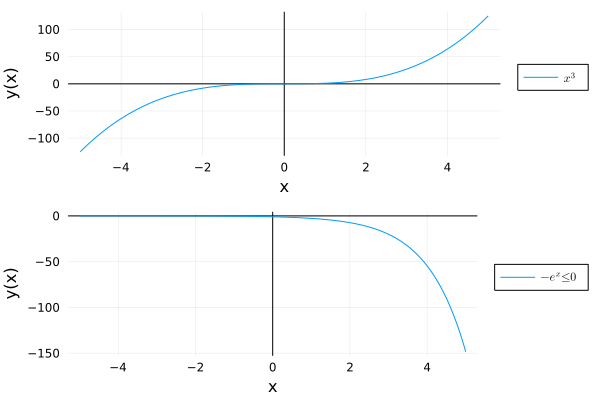

In [12]:
using Plots, LaTeXStrings
gr()

f(x) = x^(3)
g(x) = -(exp(x))

p1 = plot(f, -5, 5)
p2 = plot(g, -5, 5)

s1 = L"x^{3} " ;
s2 = L"-e^{x} ≤ 0";

plot(p1, p2, layout = (2, 1),framestyle =:zerolines, legend=:outerright,
     xaxis = "x", yaxis = "y(x)", label=[s1 s2])

#### Definition

A function $f: D \rightarrow \mathbb{R}$ is even when

$f(x) = f(-x) \quad ∀ x \in D$

(in this case the graph of $F$ is symmetric with respect to $y$-axis)

A function $f: D \rightarrow \mathbb{R}$ is odd when

$f(-x) = -f(x) \quad ∀ x \in D$

(in this case the graph of $F$ is symmetric with respect to the original)

#### Examples

Even functions (see the graphs below)

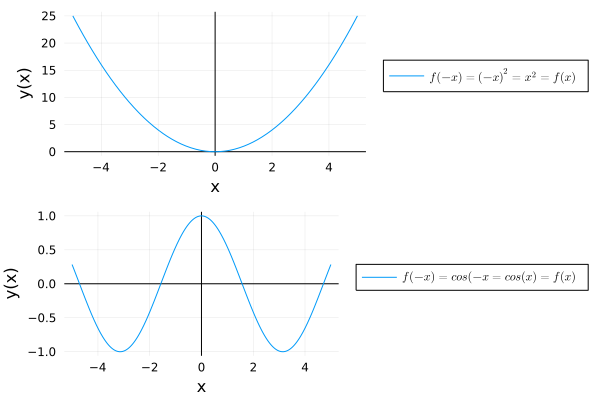

In [11]:
using Plots, LaTeXStrings
gr()

# write pi or π is the same

f(x) = x^(2)
g(x) = cos.(x)

p1 = plot(f, -5, 5)
p2 = plot(g, -5, 5)

s1 = L"f(-x)=(-x)^{2} = x^{2} = f(x)";
s2 = L"f(-x)= cos(-x = cos(x) = f(x)";

plot(p1, p2, layout = (2, 1), framestyle=:zerolines, legend=:outerright, 
     xaxis = "x", yaxis = "y(x)", label=[s1 s2])

#### Examples

Odd functions (see the graphs below)

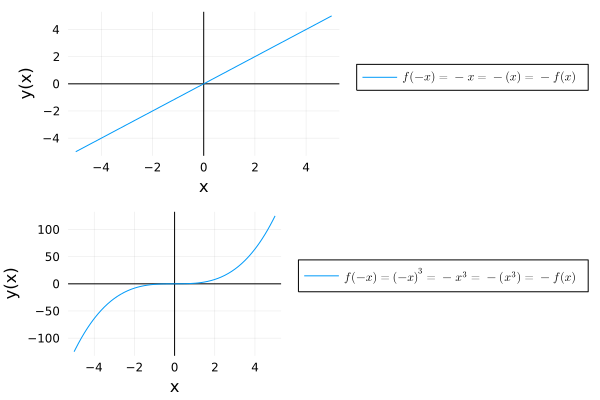

In [14]:
using Plots, LaTeXStrings
gr()

# write pi or π is the same

f(x) = x
g(x) = x^(3)

p1 = plot(f, -5, 5)
p2 = plot(g, -5, 5)

s1 = L"f(-x)= -x = -(x) = - f(x)";
s2 = L"f(-x)= (-x)^{3} = -x^{3} = -(x^{3}) = - f(x)";

plot(p1, p2, layout = (2, 1), framestyle=:zerolines, legend=:outerright, 
     xaxis = "x", yaxis = "y(x)", label=[s1 s2])

#### Definition

* a function $f: D \rightarrow \mathbb{R}$ is monotone increasing if for any $x_{1}, x_{2} \in D$ one has

$x_{1} < x_{2}$ implies $f(x_{1}) \le f(x_{2})$

* the function is strictly monotone increasing if for any $x_{1}, x_{2} \in D$ one has

$x_{1} < x_{2}$ implies $f(x_{1}) < f(x_{2})$

* a function $f: D \rightarrow \mathbb{R}$ is monotone decreasing if for any $x_{1}, x_{2} \in D$ one has

$x_{1} < x_{2}$ implies $f(x_{1}) \ge f(x_{2})$

* the function is strictly monotone increasing if for any $x_{1}, x_{2} \in D$ one has

$x_{1} < x_{2}$ implies $f(x_{1}) > f(x_{2})$

#### Remark

If $f$ is strictly monotone (increasing or decreasing) then

$x_{1} \neq x_{2} \rightarrow $ either $x_{1} > x_{2}$ or $x_{1} < x_{2} \ \rightarrow f(x_{1}) \neq f(x_{2})$

this means that $f$ is injective (one-to-one) and hence $f$ is invertible on its image.

$f: D \rightarrow \mathbb{R}$

$f: D \rightarrow f(D) \subset \mathbb{R}$

$f(D)$ is image of $f$.

$f$ is injective and surjective between $D$ and $f(D)$ and hence we can define

$f^{-1} : f(D) \rightarrow D$

## Real Analysis Course 18  (September 13th 2022)

### Exponential function and Logarithm

Let $a > 0, a \neq 1$

$ f(x) = a^{x}$ exponential function

$f: \mathbb{R} \rightarrow \mathbb{R}^{+}$

$g(x) = \log_{a} (x)$ logarithm with base $e$

$g: \mathbb{R}^{+} \rightarrow \mathbb{R}$

$x = a^{\log_{a} x}$ fundamental relation

if $x = a^{y},  \quad ↔ \quad y = \log_{a} (x)$

when $a = e$ then the logarithm is called natural logarithm and you write

$\ln(x)$ instead of $\log_{e}(x)$

$f(x) = a^{x}$

if $a > 1 \quad$ if $0 < a < 1$


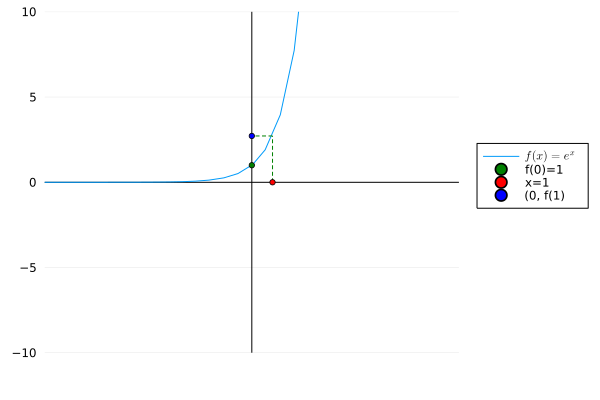

In [24]:
# if a > 1 / strictly increasing
using Plots, LaTeXStrings, Plots.PlotMeasures
gr()

f(x) = exp(x)

plot(f,-10,10, xticks=false, xlims=(-10,10), ylims=(-10,10), 
    bottom_margin = 10mm, label=L"f(x) = e^{x}", framestyle = :zerolines, 
    legend=:outerright)

plot!([1,1],[0,f(1)], label="", linecolor=:green, linestyle=:dash)
plot!([1,0],[f(1),f(1)], label="", linecolor=:green, linestyle=:dash)

scatter!([0], [f(0)], color = "green", label="f(0)=1", markersize = 3)
scatter!([1], [0], color = "red", label="x=1", markersize = 3)
scatter!([0], [f(1)], color = "blue", label="(0, f(1)", markersize = 3)

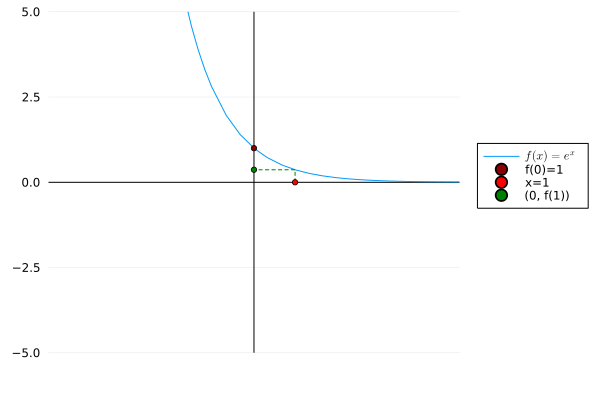

In [23]:
# if 0 < a < 1 / strictly decreasing
using Plots, LaTeXStrings, Plots.PlotMeasures
gr()

f(x) = exp(-x)

plot(f,-5,5, xticks=false, xlims=(-5,5), ylims=(-5,5), 
    bottom_margin = 10mm, label=L"f(x) = e^{x}", framestyle = :zerolines, 
    legend=:outerright)

plot!([1,1],[0,f(1)], label="", linecolor=:green, linestyle=:dash)
plot!([1,0],[f(1),f(1)], label="", linecolor=:green, linestyle=:dash)

scatter!([0], [f(0)], color = "red4", label="f(0)=1", markersize = 3)
scatter!([1], [0], color = "red1", label="x=1", markersize = 3)
scatter!([0], [f(1)], color = "green", label="(0, f(1))", markersize = 3)

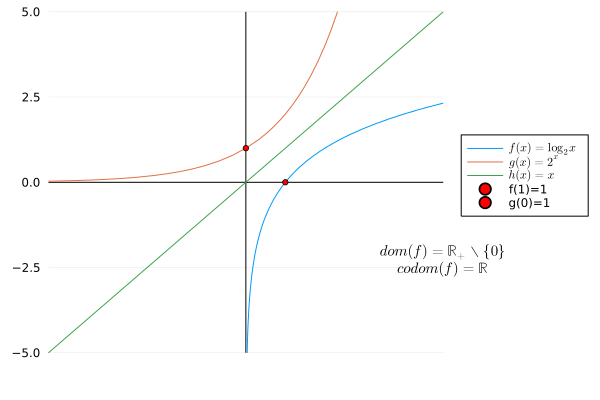

In [19]:
# all basic functions are strictly increasing
# x_{1} < x_{2} but f(x_{1}) > f(x_{2})

using Plots, LaTeXStrings, Plots.PlotMeasures
gr()

f(x) = log2(x)  
g(x) = 2^(x)
h(x) = x

plot(f,-10,10, xticks=false, xlims=(-5,5), ylims=(-5,5), 
    bottom_margin = 10mm, label=L"f(x) =  \log_{2} {x}", framestyle = :zerolines, 
    legend=:outerright)
plot!(g,-5,5, xticks=false, xlims=(-5,5), ylims=(-5,5), 
    bottom_margin = 10mm, label=L"g(x) =  2^{x}", framestyle = :zerolines, 
    legend=:outerright)
plot!(h,-10,10, xticks=false, xlims=(-5,5), ylims=(-5,5), 
    bottom_margin = 10mm, label=L"h(x) =  x", framestyle = :zerolines, 
    legend=:outerright)

scatter!([1], [f(1)], color = "red", label="f(1)=1", markersize = 3)
scatter!([0], [g(0)], color = "red", label="g(0)=1", markersize = 3)

annotate!([(5,-2.05, (L"dom(f)=\mathbb{R_{+}} \setminus \{0\}", 10, :black))])
annotate!([(5,-2.55, (L"codom(f)=\mathbb{R}", 10, :black))])



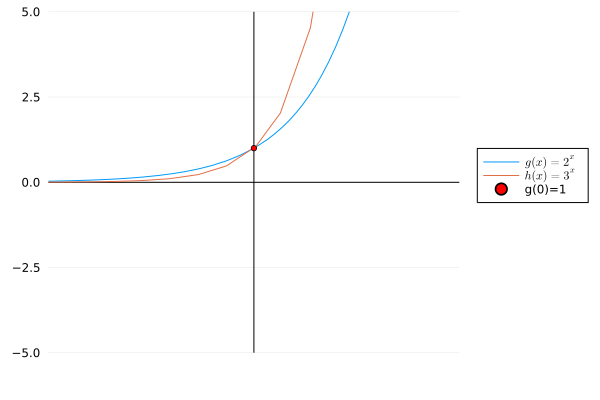

In [25]:
using Plots, LaTeXStrings, Plots.PlotMeasures
gr()

g(x) = 2^(x)
h(x) = 3^(x)


plot(g,-5,5, xticks=false, xlims=(-5,5), ylims=(-5,5), 
    bottom_margin = 10mm, label=L"g(x) =  2^{x}", framestyle = :zerolines, 
    legend=:outerright)
plot!(h,-10,10, xticks=false, xlims=(-5,5), ylims=(-5,5), 
    bottom_margin = 10mm, label=L"h(x) =  3^{x}", framestyle = :zerolines, 
    legend=:outerright)

scatter!([0], [g(0)], color = "red", label="g(0)=1", markersize = 3)


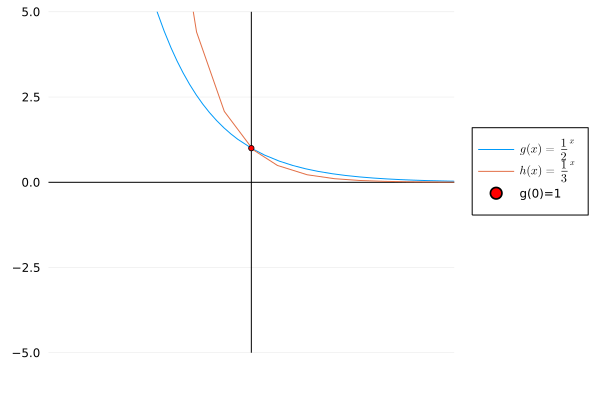

In [27]:
using Plots, LaTeXStrings, Plots.PlotMeasures
gr()

g(x) = (1/2)^(x)
h(x) = (1/3)^(x)


plot(g,-5,5, xticks=false, xlims=(-5,5), ylims=(-5,5), 
    bottom_margin = 10mm, label=L"g(x) = \frac{1}{2}^{x}", framestyle = :zerolines, 
    legend=:outerright)
plot!(h,-10,10, xticks=false, xlims=(-5,5), ylims=(-5,5), 
    bottom_margin = 10mm, label=L"h(x) = \frac{1}{3}^{x}", framestyle = :zerolines, 
    legend=:outerright)

scatter!([0], [g(0)], color = "red", label="g(0)=1", markersize = 3)

The graph of $a^{x}$ is symmetric (with respect to $y$-axis) to that of $\left( \frac{1}{2} \right) = a^{-x}$ if $a > 1$

$g(x) = \log_{a} (x)$

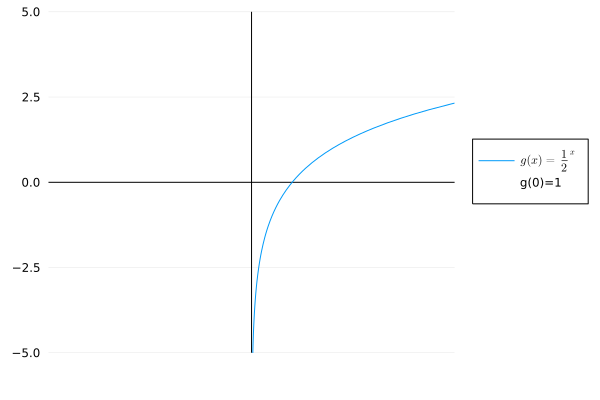

In [28]:
# for a>1
# strictly increasing
using Plots, LaTeXStrings, Plots.PlotMeasures
gr()

g(x) = log2(x)

plot(g,-5,5, xticks=false, xlims=(-5,5), ylims=(-5,5), 
    bottom_margin = 10mm, label=L"g(x) = \log_{2} (x)", framestyle = :zerolines, 
    legend=:outerright)

scatter!([0], [g(0)], color = "red", label="g(0)=1", markersize = 3)

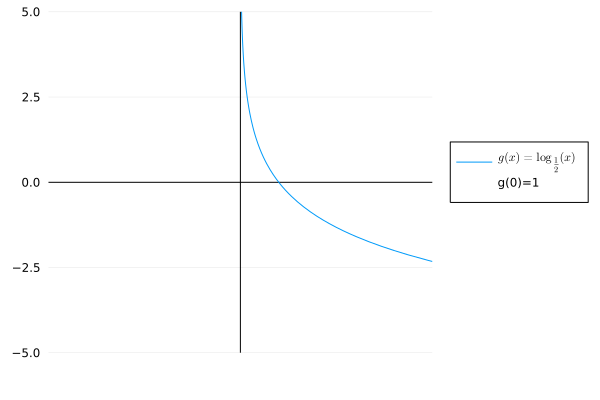

In [33]:
# for 0 < a < 1
# strictly decreasing
using Plots, LaTeXStrings, Plots.PlotMeasures
gr()

g(x) = log(1/2,x)

plot(g,-5,5, xticks=false, xlims=(-5,5), ylims=(-5,5), 
    bottom_margin = 10mm, label=L"g(x) = \log_{\frac{1}{2}} (x)", framestyle = :zerolines, 
    legend=:outerright)

scatter!([0], [g(0)], color = "red", label="g(0)=1", markersize = 3)

$\log_{a} (x)$ is the inverse function of $a^{x}$ (we can say that $a^{x}$ is invertible because $a^{x}$ is both injective and surjective on $\mathbb{R}^{+}$ because it is strictly increasing

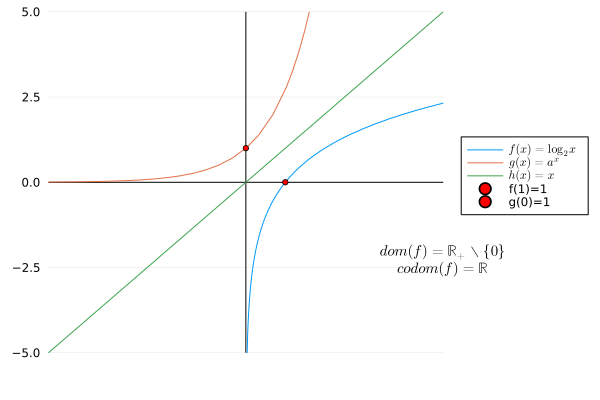

In [34]:
# a > 1
using Plots, LaTeXStrings, Plots.PlotMeasures
gr()

f(x) = log2(x)  
g(x) = exp(x)
h(x) = x

plot(f,-10,10, xticks=false, xlims=(-5,5), ylims=(-5,5), 
    bottom_margin = 10mm, label=L"f(x) =  \log_{2} {x}", framestyle = :zerolines, 
    legend=:outerright)
plot!(g,-5,5, xticks=false, xlims=(-5,5), ylims=(-5,5), 
    bottom_margin = 10mm, label=L"g(x) =  a^{x}", framestyle = :zerolines, 
    legend=:outerright)
plot!(h,-10,10, xticks=false, xlims=(-5,5), ylims=(-5,5), 
    bottom_margin = 10mm, label=L"h(x) =  x", framestyle = :zerolines, 
    legend=:outerright)

scatter!([1], [f(1)], color = "red", label="f(1)=1", markersize = 3)
scatter!([0], [g(0)], color = "red", label="g(0)=1", markersize = 3)

annotate!([(5,-2.05, (L"dom(f)=\mathbb{R_{+}} \setminus \{0\}", 10, :black))])
annotate!([(5,-2.55, (L"codom(f)=\mathbb{R}", 10, :black))])

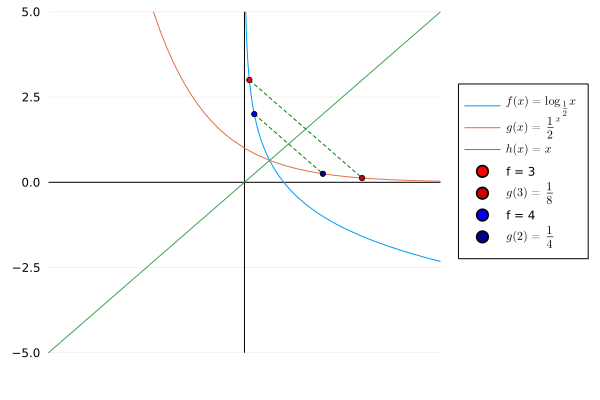

In [64]:
# 0 < a < 1
using Plots, LaTeXStrings, Plots.PlotMeasures
gr()

f(x) = log(1/2,x)  
g(x) = 1/2^(x)
h(x) = x

plot(f,-10,10, xticks=false, xlims=(-5,5), ylims=(-5,5), 
    bottom_margin = 10mm, label=L"f(x) =  \log_{\frac{1}{2}} {x}", framestyle = :zerolines, 
    legend=:outerright)
plot!(g,-5,5, xticks=false, xlims=(-5,5), ylims=(-5,5), 
    bottom_margin = 10mm, label=L"g(x) =  \frac{1}{2}^{x}", framestyle = :zerolines, 
    legend=:outerright)
plot!(h,-10,10, xticks=false, xlims=(-5,5), ylims=(-5,5), 
    bottom_margin = 10mm, label=L"h(x) =  x", framestyle = :zerolines, 
    legend=:outerright)

# Line connecting the mirror of f and g
plot!([g(3),3],[3,g(3)], linecolor=:green, label="", linestyle=:dash)
plot!([g(2),2],[2,g(2)], linecolor=:green, label="", linestyle=:dash)

scatter!([g(3)], [3], color = "red1", label="f = 3", markersize = 3)
scatter!([3], [g(3)], color = "red3", label=L"g(3) = \frac{1}{8}", markersize = 3)
scatter!([g(2)], [2], color = "blue2", label="f = 4", markersize = 3)
scatter!([2], [g(2)], color = "blue4", label=L"g(2) = \frac{1}{4}", markersize = 3)


We have this relation:

$f(x) = a^{x} \rightarrow x = \log_{a} (y)$

$y = a^{x}$

$x = \log_{a} (y) \rightarrow y = \log_{a} (x)$

### Hyperbolic Elementary Functions

$\sinh (x) = \frac{e^{x} - e^{-x}}{2}$

$\cosh (x) = \frac{e^{x} + e^{-x}}{2}$

$\tanh (x) = \frac{\sinh (x)}{\cosh (x)} = \frac{e^{x} - e^{-x}}{e^{x} + e^{-x}}$

* $\sinh$ is an odd function

\begin{equation}
\begin{split}
\sinh (-x) & = \frac{e^{-x} - e^{-(-x)}}{2} \\
\ & = \frac{e^{-x} - e^{x}}{2} \\
\ & = - \frac{e^{x} - e^{-x}}{2}
\ & = - \sinh (x)
\end{split}
\end{equation}

we get $f = - \sinh$

$f(-x) = - f(x)$ odd function

* $\cosh$ is an even function

\begin{equation}
\begin{split}
\cosh (-x) & = \frac{e^{-x} + e^{-(-x)}}{2} \\
\ & = \frac{e^{-x} + e^{x}}{2} \\
\ & = \frac{e^{x} + e^{-x}}{2}
\ & = \cosh (x)
\end{split}
\end{equation}

we get $f = \cosh$

$f(-x) = f(x)$ even function

$\sinh(0) = \frac{e^{-x} - e^{-x}}{2} = \frac{1 - 1}{2} = 0$

$\cosh(0) = \frac{e^{x} + e^{-x}}{2} = \frac{1+1}{2} = 1$

since the domain of $e^{x}$ is $\mathbb{R}$ then the domain of $\sinh, \ \cosh$ is also $\mathbb{R}$

$ ∀ x \in \mathbb{R}$ we have

$\sinh(x) \le \frac{1}{2} e^{x} \le \cosh(x)$

indeed

$\frac{e^{x} - e^{-x}}{2} = \frac{e^{x}}{2} - \frac{e^{-x}}{2} \le \frac{e^{x}}{2} \le \frac{e^{x}}{2} + \frac{e^{-x}}{2}$

with $\frac{e^{-x}}{2} >0$

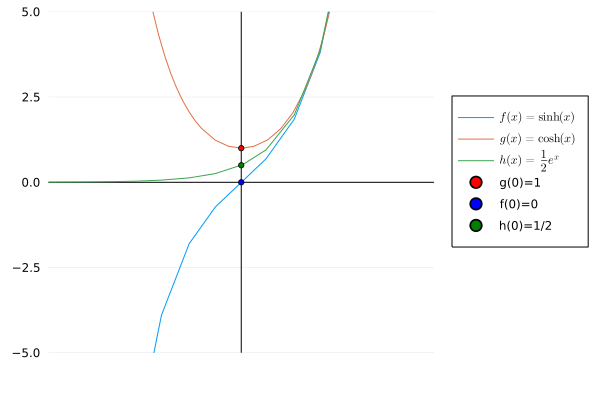

In [70]:
# a > 1
using Plots, LaTeXStrings, Plots.PlotMeasures
gr()

f(x) = sinh(x)  
g(x) = cosh(x)
h(x) = (1/2)*exp(x)

plot(f,-10,10, xticks=false, xlims=(-5,5), ylims=(-5,5), 
    bottom_margin = 10mm, label=L"f(x) =  \sinh (x)", framestyle = :zerolines, 
    legend=:outerright)
plot!(g,-5,5, xticks=false, xlims=(-5,5), ylims=(-5,5), 
    bottom_margin = 10mm, label=L"g(x) = \cosh (x)", framestyle = :zerolines, 
    legend=:outerright)
plot!(h,-10,10, xticks=false, xlims=(-5,5), ylims=(-5,5), 
    bottom_margin = 10mm, label=L"h(x) = \frac{1}{2} e^{x}", framestyle = :zerolines, 
    legend=:outerright)

scatter!([0], [g(0)], color = "red", label="g(0)=1", markersize = 3)
scatter!([0], [f(0)], color = "blue", label="f(0)=0", markersize = 3)
scatter!([0], [h(0)], color = "green", label="h(0)=1/2", markersize = 3)

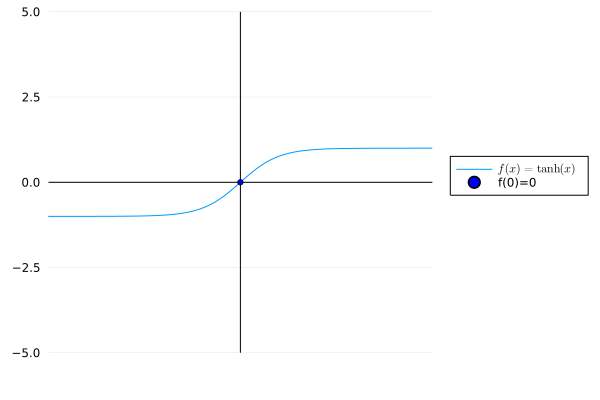

In [72]:
using Plots, LaTeXStrings, Plots.PlotMeasures
gr()

f(x) = tanh(x)  


plot(f,-10,10, xticks=false, xlims=(-5,5), ylims=(-5,5), 
    bottom_margin = 10mm, label=L"f(x) =  \tanh (x)", framestyle = :zerolines, 
    legend=:outerright)

scatter!([0], [f(0)], color = "blue", label="f(0)=0", markersize = 3)


### Composition and Inverse

$f: D \rightarrow \mathbb{R} \quad g: E \rightarrow \mathbb{R}$

where $D,E \subseteq \mathbb{R}$

$x \in D \xrightarrow{f} f(x) \quad y \in E \xrightarrow{g} g(y)$

If $f(x) \in E$ then it makes sense to consider $g(y)$ where $y=f(x)$ thus you get $g(f(x))$.

The composition between $f, g$ is defined as

$g \circ f (x) = g(f(x))$

and it is well defined only when

$f(x) \in E \quad ∀ x \in D$

In other words

$f: D \rightarrow \mathbb{R} \quad g: E \rightarrow \mathbb{R}$

if $f(D) \subset E$ then we automatically have that $f(x) \in E \quad ∀x \in D$ and hence $g \circ f (x) = g(f(x))$ makes always sense.

#### Remark

If $f: D \rightarrow \mathbb{R}$ is injective (one-to-one) then

$x \in D$ if and only if $f(x) \in f(D)$

Not injective: have different $x$ values with the same $f(x)$: $x_{1} \neq x_{2}$ and $f(x_{1}) = f(x_{2})$

In other words:

for any $y \in f(D)$ there exists exactly one $x \in D$ such that

$y = f(x)$

in this case $f$ is invertible and we call $f^{-1}$ the inverse function.

\begin{equation}
\begin{cases}
x \in D \\
y = f(x)
\end{cases}
\end{equation}

equivalent to

\begin{equation}
\begin{cases}
x = f^{-1} (y) \\
y \in f(D)
\end{cases}
\end{equation}

then $f \circ f^{-1} (y) = f(f^{-1} (y))$ is the identity of $f(D)$

$f^{-1} \circ f (x) = f^{-1}(f (x))$ is the identity of $D$

$y = f(x) \rightarrow x = f^{-1} (y)$

if $f$ exponential $a^{x}$ then $f^{-1}$ is $\log_{a} (x)$

if $f$ power

\begin{equation}
\begin{cases}
x^{2} \\
x \ge 0
\end{cases}
\end{equation}

then $f^{-1}$ is 

\begin{equation}
\begin{cases}
x^{1/2} \\
x \ge 0
\end{cases}
\end{equation}

### Operation on Graphs

$y = f(x)$

$y_{1} = f(x-a)$ where $a \in \mathbb{R}$ 

$f(x-a)$ is a translation of the graph, with rules:

* the graph $f(x)$ is shifted to the right for $a$ units if $a > 0$.

* the graph $f(x)$ is shifted to the left for $a$ units if $a < 0$.


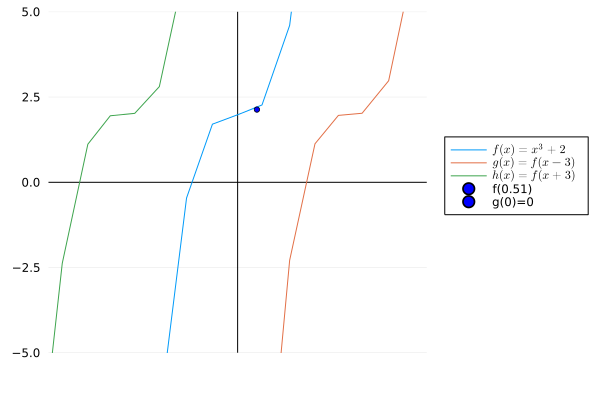

In [1]:
using Plots, LaTeXStrings, Plots.PlotMeasures
gr()

f(x) = x^3 + 2
g(x) = f(x-3)
h(x) = f(x+3)

plot(f,-10,10, xticks=false, xlims=(-10,10), ylims=(-10,10), 
    bottom_margin = 10mm, label=L"f(x) = x^{3} + 2", framestyle = :zerolines, 
    legend=:outerright)
plot!(g,-10,10, xticks=false, xlims=(-5,5), ylims=(-5,5), 
    bottom_margin = 10mm, label=L"g(x) = f(x-3)", framestyle = :zerolines, 
    legend=:outerright)
plot!(h,-10,10, xticks=false, xlims=(-5,5), ylims=(-5,5), 
    bottom_margin = 10mm, label=L"h(x) = f(x+3)", framestyle = :zerolines, 
    legend=:outerright)

scatter!([0.51], [f(0.51)], color = "blue", label="f(0.51)", markersize = 3)

scatter!([0], [g(0)], color = "blue", label="g(0)=0", markersize = 3)

$y_{1}$ is a composition

$x \xrightarrow{g} x-a \xrightarrow{f} f(x-a)$

$f \circ g = f(g(x)) = f(x-a)$

$y_{2} = kf(x) \quad k>0$

scaling in vertical direction.

when $k>1$ amplifying the graph of $f$

$0 < k < 1$ shrinking the graph of $f$

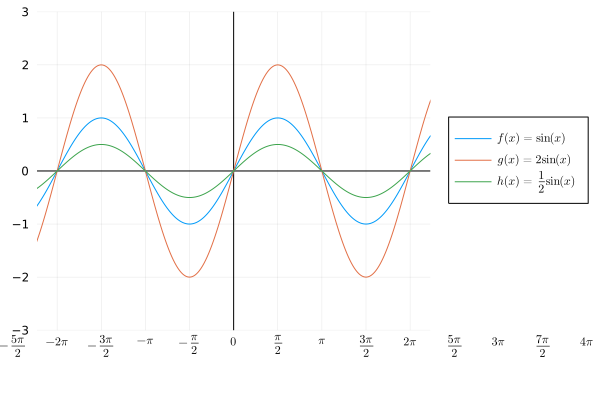

In [97]:
using Plots, LaTeXStrings
gr()

function pitick(start, stop, denom; mode=:text)
    a = Int(cld(start, π/denom))
    b = Int(fld(stop, π/denom))
    tick = range(a*π/denom, b*π/denom; step=π/denom)
    ticklabel = piticklabel.((a:b) .// denom, Val(mode))
    tick, ticklabel
end

function piticklabel(x::Rational, ::Val{:text})
    iszero(x) && return "0"
    S = x < 0 ? "-" : ""
    n, d = abs(numerator(x)), denominator(x)
    N = n == 1 ? "" : repr(n)
    d == 1 && return S * N * "π"
    S * N * "π/" * repr(d)
end

function piticklabel(x::Rational, ::Val{:latex})
    iszero(x) && return L"0"
    S = x < 0 ? "-" : ""
    n, d = abs(numerator(x)), denominator(x)
    N = n == 1 ? "" : repr(n)
    d == 1 && return L"%$S%$N\pi"
    L"%$S\frac{%$N\pi}{%$d}"
end

a, b = -4π, 4π

f(x) = sin(x)
g(x) = 2sin(x)
h(x) = (1/2)*sin(x)

plot(f,a,b, xtick=pitick(a, b, 2; mode=:latex), xlims=(-7,7), ylims=(-3,3), 
    bottom_margin = 10mm, label=L"f(x) = \sin(x)", framestyle = :zerolines, 
    legend=:outerright)
plot!(g,a,b, xtick=pitick(a, b, 2; mode=:latex), xlims=(-7,7), ylims=(-3,3), 
    bottom_margin = 10mm, label=L"g(x) = 2\sin(x)", framestyle = :zerolines, 
    legend=:outerright)
plot!(h,a,b, xtick=pitick(a, b, 2; mode=:latex), xlims=(-7,7), ylims=(-3,3), 
    bottom_margin = 10mm, label=L"h(x) = \frac{1}{2}\sin(x)", framestyle = :zerolines, 
    legend=:outerright)

when $k < 0$ you are amplifying or shrinking the graph of $f$ and also flipping it with respect to $x$-axis

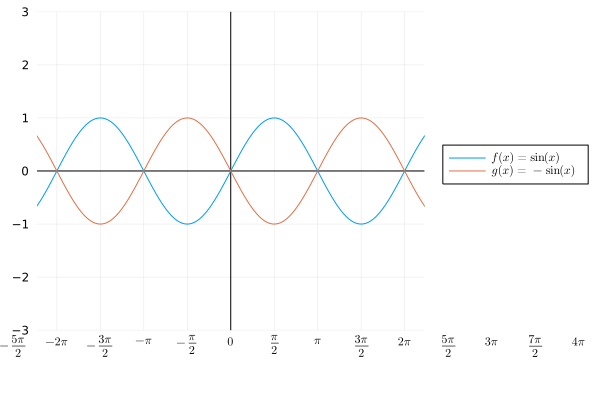

In [100]:
using Plots, LaTeXStrings
gr()

function pitick(start, stop, denom; mode=:text)
    a = Int(cld(start, π/denom))
    b = Int(fld(stop, π/denom))
    tick = range(a*π/denom, b*π/denom; step=π/denom)
    ticklabel = piticklabel.((a:b) .// denom, Val(mode))
    tick, ticklabel
end

function piticklabel(x::Rational, ::Val{:text})
    iszero(x) && return "0"
    S = x < 0 ? "-" : ""
    n, d = abs(numerator(x)), denominator(x)
    N = n == 1 ? "" : repr(n)
    d == 1 && return S * N * "π"
    S * N * "π/" * repr(d)
end

function piticklabel(x::Rational, ::Val{:latex})
    iszero(x) && return L"0"
    S = x < 0 ? "-" : ""
    n, d = abs(numerator(x)), denominator(x)
    N = n == 1 ? "" : repr(n)
    d == 1 && return L"%$S%$N\pi"
    L"%$S\frac{%$N\pi}{%$d}"
end

a, b = -4π, 4π

f(x) = sin(x)
g(x) = -f(x)

plot(f,a,b, xtick=pitick(a, b, 2; mode=:latex), xlims=(-7,7), ylims=(-3,3), 
    bottom_margin = 10mm, label=L"f(x) = \sin(x)", framestyle = :zerolines, 
    legend=:outerright)
plot!(g,a,b, xtick=pitick(a, b, 2; mode=:latex), xlims=(-7,7), ylims=(-3,3), 
    bottom_margin = 10mm, label=L"g(x) = - \sin (x)", framestyle = :zerolines, 
    legend=:outerright)


$y_{3} = f(kx) \quad k \in \mathbb{R}$

change of scale on $x$

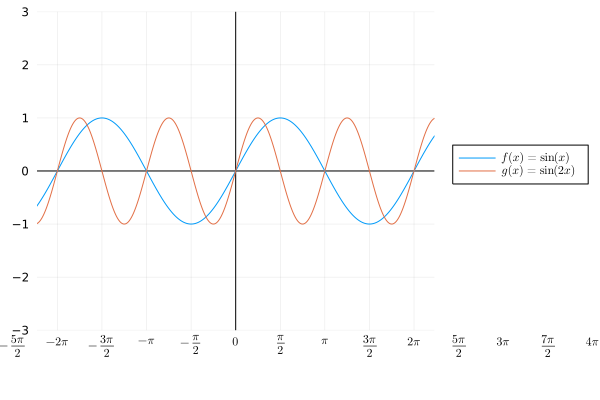

In [103]:
using Plots, LaTeXStrings
gr()

function pitick(start, stop, denom; mode=:text)
    a = Int(cld(start, π/denom))
    b = Int(fld(stop, π/denom))
    tick = range(a*π/denom, b*π/denom; step=π/denom)
    ticklabel = piticklabel.((a:b) .// denom, Val(mode))
    tick, ticklabel
end

function piticklabel(x::Rational, ::Val{:text})
    iszero(x) && return "0"
    S = x < 0 ? "-" : ""
    n, d = abs(numerator(x)), denominator(x)
    N = n == 1 ? "" : repr(n)
    d == 1 && return S * N * "π"
    S * N * "π/" * repr(d)
end

function piticklabel(x::Rational, ::Val{:latex})
    iszero(x) && return L"0"
    S = x < 0 ? "-" : ""
    n, d = abs(numerator(x)), denominator(x)
    N = n == 1 ? "" : repr(n)
    d == 1 && return L"%$S%$N\pi"
    L"%$S\frac{%$N\pi}{%$d}"
end

a, b = -4π, 4π

f(x) = sin(x)
g(x) = f(2x)

plot(f,a,b, xtick=pitick(a, b, 2; mode=:latex), xlims=(-7,7), ylims=(-3,3), 
    bottom_margin = 10mm, label=L"f(x) = \sin(x)", framestyle = :zerolines, 
    legend=:outerright)
plot!(g,a,b, xtick=pitick(a, b, 2; mode=:latex), xlims=(-7,7), ylims=(-3,3), 
    bottom_margin = 10mm, label=L"g(x) = \sin (2x)", framestyle = :zerolines, 
    legend=:outerright)


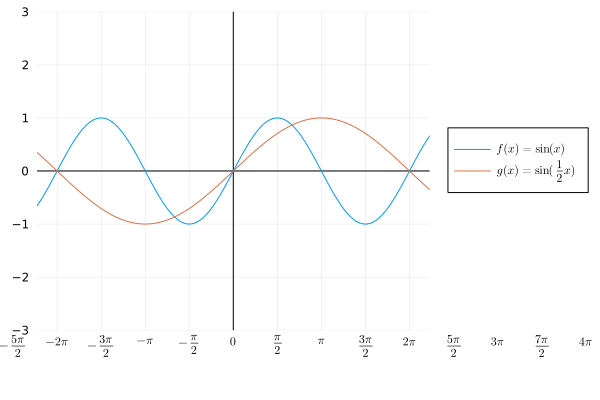

In [105]:
using Plots, LaTeXStrings
gr()

function pitick(start, stop, denom; mode=:text)
    a = Int(cld(start, π/denom))
    b = Int(fld(stop, π/denom))
    tick = range(a*π/denom, b*π/denom; step=π/denom)
    ticklabel = piticklabel.((a:b) .// denom, Val(mode))
    tick, ticklabel
end

function piticklabel(x::Rational, ::Val{:text})
    iszero(x) && return "0"
    S = x < 0 ? "-" : ""
    n, d = abs(numerator(x)), denominator(x)
    N = n == 1 ? "" : repr(n)
    d == 1 && return S * N * "π"
    S * N * "π/" * repr(d)
end

function piticklabel(x::Rational, ::Val{:latex})
    iszero(x) && return L"0"
    S = x < 0 ? "-" : ""
    n, d = abs(numerator(x)), denominator(x)
    N = n == 1 ? "" : repr(n)
    d == 1 && return L"%$S%$N\pi"
    L"%$S\frac{%$N\pi}{%$d}"
end

a, b = -4π, 4π

f(x) = sin(x)
g(x) = f((1/2)*x)

plot(f,a,b, xtick=pitick(a, b, 2; mode=:latex), xlims=(-7,7), ylims=(-3,3), 
    bottom_margin = 10mm, label=L"f(x) = \sin(x)", framestyle = :zerolines, 
    legend=:outerright)
plot!(g,a,b, xtick=pitick(a, b, 2; mode=:latex), xlims=(-7,7), ylims=(-3,3), 
    bottom_margin = 10mm, label=L"g(x) = \sin (\frac{1}{2}x)", framestyle = :zerolines, 
    legend=:outerright)


$y_{4} = |f(x)| \rightarrow$ flips the graph of $f$ below $x$-axis

\begin{equation}|f(x)|
\begin{cases}
f(x) \quad \text{if} \ f(x) \ge 0 \\
-f(x) \quad \text{if} \ f(x) < 0
\end{cases}
\end{equation}


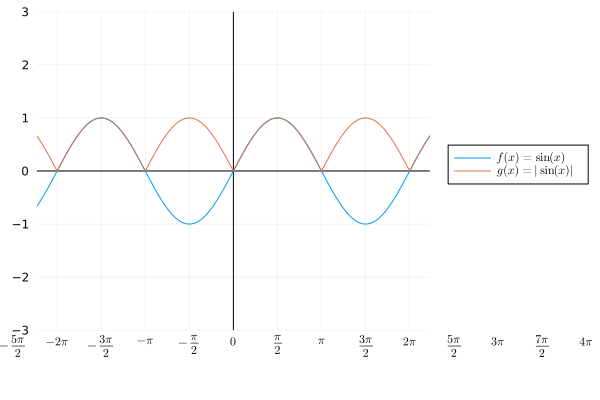

In [107]:
using Plots, LaTeXStrings
gr()

function pitick(start, stop, denom; mode=:text)
    a = Int(cld(start, π/denom))
    b = Int(fld(stop, π/denom))
    tick = range(a*π/denom, b*π/denom; step=π/denom)
    ticklabel = piticklabel.((a:b) .// denom, Val(mode))
    tick, ticklabel
end

function piticklabel(x::Rational, ::Val{:text})
    iszero(x) && return "0"
    S = x < 0 ? "-" : ""
    n, d = abs(numerator(x)), denominator(x)
    N = n == 1 ? "" : repr(n)
    d == 1 && return S * N * "π"
    S * N * "π/" * repr(d)
end

function piticklabel(x::Rational, ::Val{:latex})
    iszero(x) && return L"0"
    S = x < 0 ? "-" : ""
    n, d = abs(numerator(x)), denominator(x)
    N = n == 1 ? "" : repr(n)
    d == 1 && return L"%$S%$N\pi"
    L"%$S\frac{%$N\pi}{%$d}"
end

a, b = -4π, 4π

f(x) = sin(x)
g(x) = abs(f(x))

plot(f,a,b, xtick=pitick(a, b, 2; mode=:latex), xlims=(-7,7), ylims=(-3,3), 
    bottom_margin = 10mm, label=L"f(x) = \sin(x)", framestyle = :zerolines, 
    legend=:outerright)
plot!(g,a,b, xtick=pitick(a, b, 2; mode=:latex), xlims=(-7,7), ylims=(-3,3), 
    bottom_margin = 10mm, label=L"g(x) = |\sin (x)|", framestyle = :zerolines, 
    legend=:outerright)


$y_{5}= f(|x|)$ flips the graph of $f$ with respect to $y$-axis.

\begin{equation}|x|
\begin{cases}
x \quad \text{if} \ x \ge 0 \\
-x \quad \text{if} \ x < 0
\end{cases}
\end{equation}

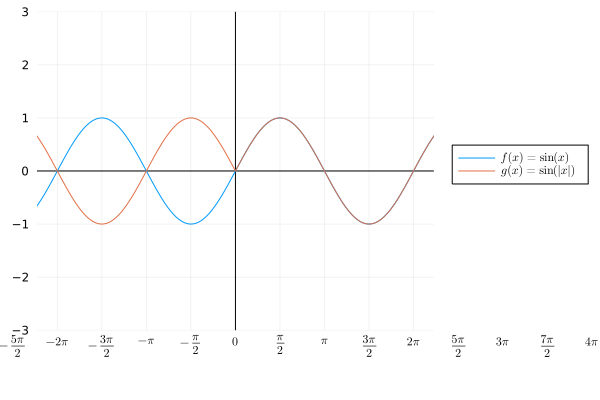

In [50]:
using Plots, LaTeXStrings
gr()

function pitick(start, stop, denom; mode=:text)
    a = Int(cld(start, π/denom))
    b = Int(fld(stop, π/denom))
    tick = range(a*π/denom, b*π/denom; step=π/denom)
    ticklabel = piticklabel.((a:b) .// denom, Val(mode))
    tick, ticklabel
end

function piticklabel(x::Rational, ::Val{:text})
    iszero(x) && return "0"
    S = x < 0 ? "-" : ""
    n, d = abs(numerator(x)), denominator(x)
    N = n == 1 ? "" : repr(n)
    d == 1 && return S * N * "π"
    S * N * "π/" * repr(d)
end

function piticklabel(x::Rational, ::Val{:latex})
    iszero(x) && return L"0"
    S = x < 0 ? "-" : ""
    n, d = abs(numerator(x)), denominator(x)
    N = n == 1 ? "" : repr(n)
    d == 1 && return L"%$S%$N\pi"
    L"%$S\frac{%$N\pi}{%$d}"
end

a, b = -4π, 4π

f(x) = sin(x)
g(x) = sin.(abs.(x))

plot(f,a,b, xtick=pitick(a, b, 2; mode=:latex), xlims=(-7,7), ylims=(-3,3), 
    bottom_margin = 10mm, label=L"f(x) = \sin(x)", framestyle = :zerolines, 
    legend=:outerright)
plot!(g,a,b, xtick=pitick(a, b, 2; mode=:latex), xlims=(-7,7), ylims=(-3,3), 
    bottom_margin = 10mm, label=L"g(x) = \sin (|x|)", framestyle = :zerolines, 
    legend=:outerright)


# Real Analysis Foundation Exam 1 (30 September 2022)

1) Using induction principle, prove

$n ! \ge 2^{n-1}$

(i) For $n=1$, we have $1! = 1$ and $2^{0} = 1$

Therefore $1 \ge 1$ is verified

(ii) Assume inequality true for $n=k$ that is

$k! \ge 2^{k-1}$

##### Thesis: Prove $(k+1)! \ge 2^{k+1-1} = 2^{k}$

For this

$(k+1)! = (k+1)k! \ge (k+1)2^{k-1}$

moreover,

$k+1 \ge 2$ for any $k \ge 1$, thus

$(k+1)2^{k-1} \ge 2 \cdot 2^{k-1} = 2^{k}$

Therefore $(k+1)! \ge 2^{k}$ for $k \ge 1$. Hence, the property is true for $n=1$ and it is inductive $∀n \ge 1$ and therefore the property is true for $∀n \ge 1$ by induction principle.

2) Find $\sup$ and $\inf$ of the following set

\begin{equation}
A = 
\begin{bmatrix}
x = \frac{n^{2}}{n+2} ; n \in \mathbb{N} 
\end{bmatrix}
\end{equation}

Is the $\sup$ a maximum for $A$ ? Is the $\inf$ a minimum for $A$?

##### Solution

We start observing that calling $x_{n} = \frac{n^{2}}{n+2}$ we have that  $x_{n} < x_{n+1}$, indeed

$\frac{(n+1)^{2}}{n+3} - \frac{n^{2}}{n+2} = \frac{(n^{2} + 2n + 1)(n+2) - (n+3)n^{2}}{(n+3)(n+2)} = \frac{n^{2} + 5n + 2}{(n+2)(n+3)} > 0$

$∀n \in \mathbb{N}$

Thus $A$ is composed of strictly increasing elements (with respect to $n \in \mathbb{N}$).

As a consequence we can deduce that

$\frac{1}{3} = x_{1} < x_{n} \quad ∀ n \in \mathbb{N}, \quad n \neq 1$

then

$\inf \ A = \frac{1}{3} = \min \ A$ since $\frac{1}{3} \in A$

and $\sup \ A = + \infty$ (then no maximum exists for $A$)

3) Solve in $\mathbb{C} $z^{2} + i \sqrt{3}z + 6 = 0$

$z^{2} + i \sqrt{3} z + 6 = z^{2} + i \sqrt{3} z - \frac{3}{4} + \frac{3}{4} + 6 = \left( z + i \frac{\sqrt{3}}{2} \right)^{2} + \frac{27}{4} = 0$

Set $w = z + i \frac{\sqrt{3}}{2}$, then

\begin{equation}w^{2} = - \frac{27}{4}
\begin{cases}
w_{1} = i \frac{\sqrt{27}}{2} = i \frac{3 \sqrt{3}}{2}\\
w_{2} = -i \frac{\sqrt{27}}{2} = -i \frac{3 \sqrt{3}}{2}
\end{cases}
\end{equation}

$z_{1} = w_{1} - i \frac{\sqrt{3}}{2} = i \frac{3 \sqrt{3}}{2} - i \frac{\sqrt{3}}{2} = i \sqrt{3}$

$z_{2} = w_{2} - i \frac{\sqrt{3}}{2} = -i \frac{\sqrt{3}}{2} (3+1) = -2i \sqrt{3}$

$z_{1} = i \sqrt{3}$

$z_{2} = -2i \sqrt{3}$

4) Compute the following limit and verify the definition

$\lim_{n \rightarrow + \infty} (\sin(n) - 2) \cdot \frac{n^{2}}{2n + \cos(n)}$

Computation:

\begin{equation}
\begin{split}
\lim_{n \rightarrow + \infty} (\sin(n) - 2) \cdot \frac{n^{2}}{2n + \cos(n)} & = \lim_{n \rightarrow + \infty} \frac{n^{2}}{n} \cdot \frac{(\sin(n) - 2)}{2 + \frac{\cos(n)}{n}} \\
\ & = \lim_{n \rightarrow + \infty} n \cdot \frac{(\sin(n) - 2)}{2 + \frac{\cos(n)}{n}} \\
\ & = - \infty
\end{split}
\end{equation}

$\lim_{n \rightarrow + \infty} \sin(n) - 2 \rightarrow \le -1$

$\lim_{n \rightarrow + \infty} \frac{\cos(n)}{n} \rightarrow 0$

Verification:

Let $M > 0$ be given arbitrary then observe

\begin{equation}
\begin{split}
(\sin(n) - 2) \cdot \frac{n^{2}}{2n + \cos(n)} & \le -1 \cdot \frac{n^{2}}{2n(1 + \frac{\cos(n)}{2n})} \\
\ & \le \frac{-n}{2} \cdot \frac{1}{1+ \frac{\cos(n)}{2n}} \\
\ & \le \frac{-n}{2} \cdot \frac{1}{1-\frac{1}{2}} \\
\ & \le \frac{-n}{2} \cdot 2 \\
\ & \le -n
\end{split}
\end{equation}

then if we take $N=M$ and $n>N$ we get that $-n < -M$ and from the above estimate

$\sin(n) - 2 \cdot \frac{n^{2}}{2n + \cos(n)} \le -n < -M$

5) Compute the $maxlim$ and the $minlim$ as $n \rightarrow + \infty$ of the following sequence

$a_{n} = \ln \left( 1 + \left( \frac{1}{n}\right)^{1+(-1)^{n}} \right)$

* if $n$ even then $a_{n} = \ln \left( 1+ \frac{1}{n^{2}} \right) \rightarrow \ln (1)=0$

* if $n$ odd then $a_{n} = \ln \left( 1 + \left( \frac{1}{n} \right)^{0} \right) \rightarrow \ln (2) = \ln (2)$

$maxlim_{n \rightarrow + \infty} \ a_{n} = \ln (2)$

$minlim_{n \rightarrow + \infty} \ a_{n} = 0$

6) Sketch the graphs of the following function

$f(x) = |e^{(x-1)} - 2| $

(see the sketch below)


In [ ]:
using Plots, LaTeXStrings
gr()

# write pi or π is the same

f(x) = exp(x)
g(x) = exp(x-1)
h(x) = exp(x-1) - 2
i(x) = abs(exp(x-1) - 2)

p1 = plot(f, -5, 5)
p2 = plot(g, -5, 5)
p3 = plot(h, -5, 5)
p4 = plot(i, -5, 5)

s1 = L"e^{x}";
s2 = L"e^{x-1}";
s3 = L"e^{x-1} - 2";
s4 = L"|e^{x-1} - 2|";

plot(p1, p2, p3, p4, layout = (2, 2), legend=:outerright,
     xaxis = "x", yaxis = "y(x)", label=[s1 s2 s3 s4])

# Tutorial for Julia and LazySets

source: 

It's all Set: A hands-on introduction to JuliaReach | Workshop | JuliaCon 2021

https://www.youtube.com/watch?v=P4I7pTvQ4nk

https://nbviewer.org/github/JuliaReach/JuliaCon-2021-Workshop-Its-All-Set/blob/main/2_LazySets.ipynb

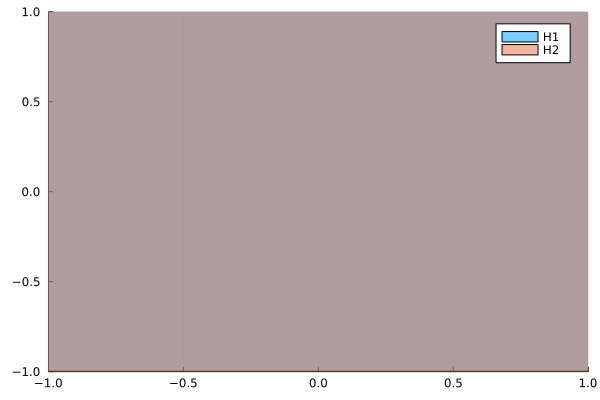

In [12]:
using Plots, LazySets, Symbolics

H = HalfSpace([1.0, -1.0], 0.0)

var = @variables x y

H′ = HalfSpace(x ≤ y, var)  # for `′`, type H\prime[TAB]

isequivalent(H, H′)

#H9 = \left\{ x ∈ \mathbb{R}^{9} : \sum_{i=1}^{9} i x_i ≤ 10 \right\}.

var = @variables x[1:9]

expr = sum(i*x[i] for i in 1:9) ≤ 10.0
H9 = HalfSpace(expr, var)
A = Interval(0, 1)
B = Interval(2, 3)

C = A × B
H = convert(Hyperrectangle, C)

using IntervalArithmetic

Hbox = convert(IntervalBox, H)

typeof(Hbox)

Z = convert(Zonotope, C)

var = @variables x y

H1 = HalfSpace(y ≥ x, var)
H2 = HalfSpace(y ≥ -x, var)

P = H1 ∩ H2  # for `∩`, type `\cap[TAB]`

plot(H1, lab="H1")
plot!(H2, lab="H2")
#plot!(P, lab="P = H1 ∩ H2", linewidth=2.0, linestyle=:dash)

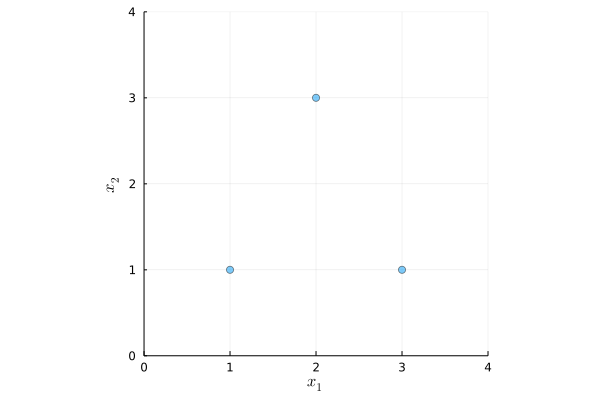

In [22]:
using Plots, LazySets, LaTeXStrings

p(args...; kwargs...) = plot(xlims=(0,4), ylims=(0,4), ratio=1, lab="",
                        xlab=L"x_{1}", ylab=L"x_{2}", args...; kwargs...)
p!(args...; kwargs...) = plot!(lab="", args...; kwargs...);

# start with three points
p1 = [1.0, 1.0]
p2 = [3.0, 1.0]
p3 = [2.0, 3.0]

# wrap these points in singleton (Singleton is sets containing exactly one point)
p([Singleton(p1), Singleton(p2), Singleton(p3)])

Define the line segment between $p_{2}$ and $p_{3}$:

\begin{equation}
\{ \lambda \cdot p_{2} + (1 - \lambda) \cdot p_{3} \in \mathbb{R^{2}} | \lambda \in [0,1] \}
\end{equation}

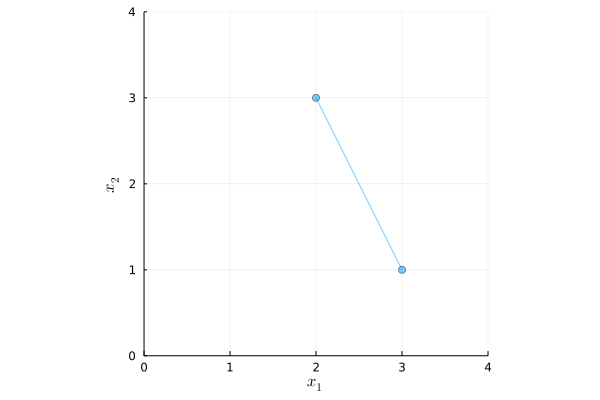

In [23]:
using Plots, LazySets, LaTeXStrings

p(args...; kwargs...) = plot(xlims=(0,4), ylims=(0,4), ratio=1, lab="",
                        xlab=L"x_{1}", ylab=L"x_{2}", args...; kwargs...)
p!(args...; kwargs...) = plot!(lab="", args...; kwargs...);

# start with three points
p1 = [1.0, 1.0]
p2 = [3.0, 1.0]
p3 = [2.0, 3.0]

p(LineSegment(p2,p3))

Define the set of all points on the three line segments between $p_{1}, p_{2}$ and $p_{3}$:

\begin{equation}
\{ \lambda \cdot x + (1 - \lambda) \cdot y \in \mathbb{R^{2}} | \lambda \in [0,1], x,y \in \{p_{1},p_{2},p_{3}\}  \}
\end{equation}

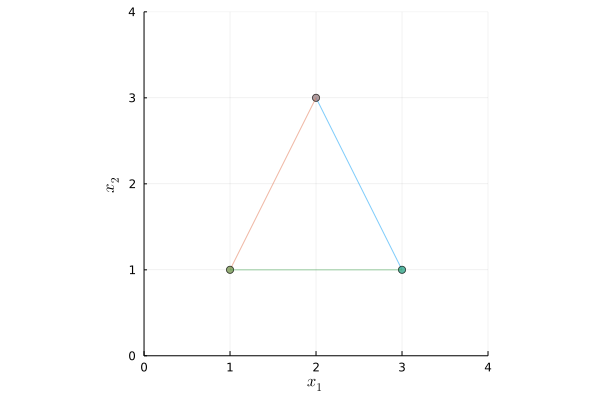

In [25]:
using Plots, LazySets, LaTeXStrings

p(args...; kwargs...) = plot(xlims=(0,4), ylims=(0,4), ratio=1, lab="",
                        xlab=L"x_{1}", ylab=L"x_{2}", args...; kwargs...)
p!(args...; kwargs...) = plot!(lab="", args...; kwargs...);

# start with three points
p1 = [1.0, 1.0]
p2 = [3.0, 1.0]
p3 = [2.0, 3.0]

p([LineSegment(p2,p3), LineSegment(p1,p3), LineSegment(p1,p2)])

Define the set of all points in the polygon spanned by $p_{1}, p_{2}$ and $p_{3}$:

\begin{equation}
\{ \lambda_{1} \cdot p_{1} + \lambda_{2} \cdot p_{2} + \lambda_{3} \cdot p_{3} \in \mathbb{R^{2}} | \lambda_{1}, \lambda_{2}, \lambda_{3} \ge 0,\lambda_{1} + \lambda_{2} + \lambda_{3} = 1 \}
\end{equation}

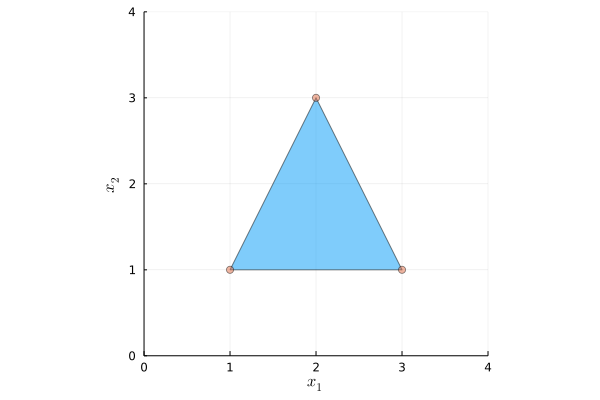

In [27]:
using Plots, LazySets, LaTeXStrings

p(args...; kwargs...) = plot(xlims=(0,4), ylims=(0,4), ratio=1, lab="",
                        xlab=L"x_{1}", ylab=L"x_{2}", args...; kwargs...)
p!(args...; kwargs...) = plot!(lab="", args...; kwargs...);

# start with three points
p1 = [1.0, 1.0]
p2 = [3.0, 1.0]
p3 = [2.0, 3.0]

V = VPolygon([p1, p2, p3])
p(V)

# Add the points
p!([Singleton(p1), Singleton(p2), Singleton(p3)])

All points below the line $x_{2} = 3 - x_{1}$:
\begin{equation}
\{(x_{1}, x_{2})^{T} \in \mathbb{R^{2}} | x_{1} + x_{2} \le 3\}
\end{equation}

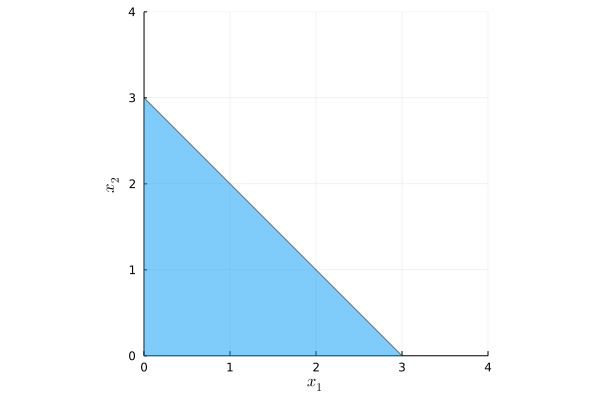

In [28]:
using Plots, LazySets, LaTeXStrings

p(args...; kwargs...) = plot(xlims=(0,4), ylims=(0,4), ratio=1, lab="",
                        xlab=L"x_{1}", ylab=L"x_{2}", args...; kwargs...)
p!(args...; kwargs...) = plot!(lab="", args...; kwargs...);

# start with three points
p1 = [1.0, 1.0]
p2 = [3.0, 1.0]
p3 = [2.0, 3.0]

H = HalfSpace([1.0,1.0], 3.0)

p(H)

The intersection of the previous two sets:
\begin{equation}
\{ \lambda_{1} \cdot p_{1} + \lambda_{2} \cdot p_{2} + \lambda_{3} \cdot p_{3} \in \mathbb{R^{2}} \ | \ \lambda_{1}, \lambda_{2}, \lambda_{3} \ge 0,\lambda_{1} + \lambda_{2} + \lambda_{3} = 1 \} \cap \{(x_{1},x_{2})^{T} \in \mathbb{R^{2}} \ | \ x_{1} + x_{2} \le 3\}
\end{equation}

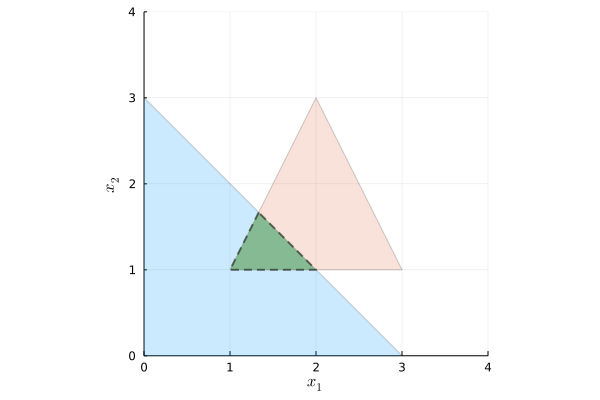

In [29]:
using Plots, LazySets, LaTeXStrings

p(args...; kwargs...) = plot(xlims=(0,4), ylims=(0,4), ratio=1, lab="",
                        xlab=L"x_{1}", ylab=L"x_{2}", args...; kwargs...)
p!(args...; kwargs...) = plot!(lab="", args...; kwargs...);

# start with three points
p1 = [1.0, 1.0]
p2 = [3.0, 1.0]
p3 = [2.0, 3.0]

p(H, alpha=0.2)
p!(V, alpha=0.2)
p!(intersection(H,V), linestyle=:dash, linewidth=2)

## Closed Convex Sets

In `LazySets` we only considered closed sets.

A set $X$ is closed if it contains its boundary points. The interval:
\begin{equation}
[1, 2] = \{x \in \mathbb{R} | 1 \le x \le 2 \}
\end{equation}
is closed.

An example of half-open interval:
\begin{equation}
(1, 2] = \{x \in \mathbb{R} | 1 < x \le 2 \}
\end{equation}

A set of points $X$ is convex if you can pick any two points $x, y \in X$, connect them with a line segment, and then any point $z$ in that line segment is also contained in $X$.


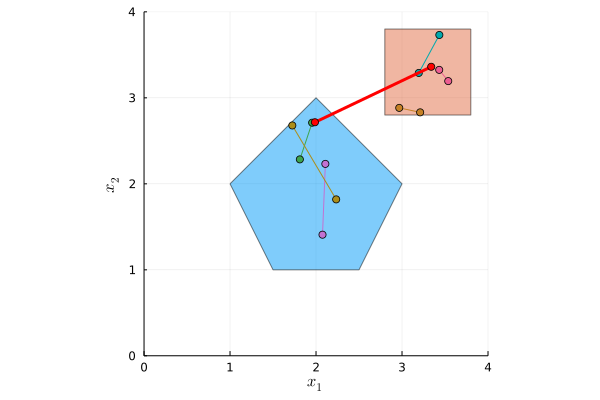

In [31]:
using Plots, LazySets, LaTeXStrings

p(args...; kwargs...) = plot(xlims=(0,4), ylims=(0,4), ratio=1, lab="",
                        xlab=L"x_{1}", ylab=L"x_{2}", args...; kwargs...)
p!(args...; kwargs...) = plot!(lab="", args...; kwargs...);

# start with three points
p1 = [1.0, 1.0]
p2 = [3.0, 1.0]
p3 = [2.0, 3.0]

# The pentagon and the square are convex, but their union is not
P = VPolygon([[2,3], [3,2], [2.5, 1], [1.5, 1], [1,2]])
B = BallInf([3.3, 3.3], 0.5)

p(P)
p!(B)

# line segments between random points
[p!(LineSegment(sample(P), sample(P)), alpha=1) for _ in 1:3]
[p!(LineSegment(sample(B), sample(B)), alpha=1) for _ in 1:3]
p!(LineSegment(sample(P), sample(B)), alpha=1, color=:red, linewidth=3)

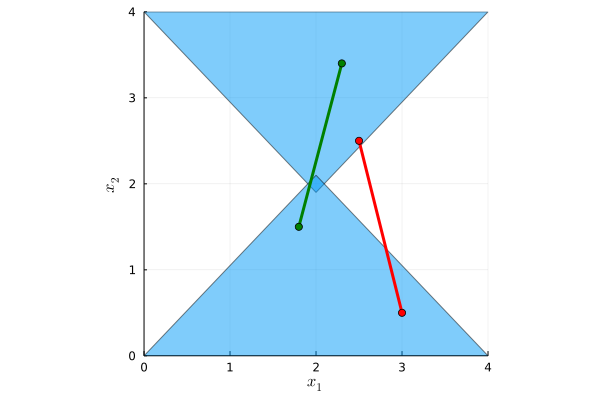

In [36]:
using Plots, LazySets, LaTeXStrings

p(args...; kwargs...) = plot(xlims=(0,4), ylims=(0,4), ratio=1, lab="",
                        xlab=L"x_{1}", ylab=L"x_{2}", args...; kwargs...)
p!(args...; kwargs...) = plot!(lab="", args...; kwargs...);

# start with three points
p1 = [1.0, 1.0]
p2 = [3.0, 1.0]
p3 = [2.0, 3.0]

# The hourglass is non-convex
p(UnionSet(VPolygon([[0., 4.], [2., 1.9], [4, 4.]]),
           VPolygon([[0., 0.], [2., 2.1], [4, 0.]])))

# line segments between random points
p!(LineSegment([1.8, 1.5], [2.3, 3.4]), alpha=1, color=:green, linewidth=3)
p!(LineSegment([3, 0.5], [2.5, 2.5]), alpha=1, color=:red, linewidth=3)

## Symbolic Representation

A set can be seen as a membership predicate. 

The set of non-positive numbers,
\begin{equation}
\{x \in \mathbb{R^{n}} | x \le 0 \}
\end{equation}

can be represented with the predicate $P(x) = x \le 0$.

In [41]:
using LazySets, LaTeXStrings
using Plots: plot, plot!, text, lens!, bbox

predP(x) = x <= 0;

for i in [0, 2, -3, 9, 18, -5]
    println("predP($i) = $(predP(i))")
end

predP(0) = true
predP(2) = false
predP(-3) = true
predP(9) = false
predP(18) = false
predP(-5) = true


We can even apply common set operations (like intersection) to predicates. For example, intersecting the above set with
\begin{equation}
\{x \in \mathbb{R^{n}} : |x - 1| \le 1\}
\end{equation}

respectively the predicate $Q(x) = |x - 1| \le 1$ is achieved by just defining a new predicate $R$ for the conjunction of both predicates.

In [42]:
using LazySets, LaTeXStrings
using Plots: plot, plot!, text, lens!, bbox

predP(x) = x <= 0;
predQ(x) = abs(x - 1) <= 1
predR(x) = predP(x) && predQ(x); 

for i in [0, 2, -3]
    println("P($i) = $(predP(i)) \t Q($i) = $(predQ(i)) \t R($i) = $(predR(i))")
end

P(0) = true 	 Q(0) = true 	 R(0) = true
P(2) = false 	 Q(2) = true 	 R(2) = false
P(-3) = true 	 Q(-3) = false 	 R(-3) = false


## Basic Sets

### Half-space

The half-space $\{x \in \mathbb{R^{n}} | a^{T}x \le b\}$ is parametric in $a \in \mathbb{R^{n}}$ and $b \in \mathbb{R}$. 

Below we construct a half-space for $a = (1,1)^{T}$ and $b = 2$. That corresponds to $x_{1} + x_{2} \le 2$. The half-space below can be written as
\begin{equation}
\{(x,y) \in \mathbb{R^{2}} \ | \ x + y \le 2\}
\end{equation}

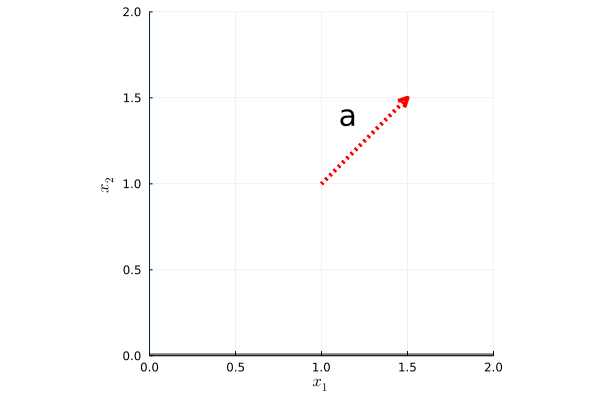

In [48]:
using LazySets, LaTeXStrings
using Plots: plot, plot!, text, lens!, bbox

p(args...; kwargs...) = plot(xlims=(0,4), ylims=(0,4), ratio=1, lab="",
                        xlab=L"x_{1}", ylab=L"x_{2}", args...; kwargs...)
p!(args...; kwargs...) = plot!(lab="", args...; kwargs...);

p(xlims=(0,2), ylims=(0,2))
a = [1.0, 1.0]
b = 2.0

H = HalfSpace(a, b)

p!(H, linewidth=4)

# normal arrow
p!([1.0, 1.5], [1.0, 1.5], linecolor=:red, arrow=:arrow,
    linestyle=:dot, width=4, annotations=(1.15, 1.4, text("a", 20)))

Instead of defining $a$ and $b$, we can alternatively use Symbolics. We can let LazySets check that these two constructions represent the same set.

The half-space is the most basic convex set. All other convex set can be described as an (possibly infinite) intersection of half-spaces. To effectively represent convex sets, there are many more set representations in LazySets.

In [50]:
using Symbolics, LazySets

a = [1.0, 1.0]
b = 2.0

H = HalfSpace(a, b)

var = @variables x y
H2 = HalfSpace(x + y ≤ 2, var)

@show isequivalent(H, H2)
println()
@show H
println()

isequivalent(H, H2) = true

H = HalfSpace{Float64, Vector{Float64}}([1.0, 1.0], 2.0)



#### Singleton

The singleton $\{x\}$ contains a single point $x$.

#### $p$-norm balls
The balls for different $p$-norms
\begin{equation}
\{x \in \mathbb{R^{n}}: ||x - c||_{p} \le r\}
\end{equation}
are parametric in $p \ge 1$, a center $c \in \mathbb{R^{n}}$, and a radius $r \in \mathbb{R}$. The balls are often useful, for example when defining simple neighborhoods. Only for $p = 1$ and $p = \infty$ the balls have sharp corners.

In [2]:
using LazySets
p(args...; kwargs...) = plot(xlims=(0,4), ylims=(0,4), ratio=1, lab="",
                        xlab=L"x_{1}", ylab=L"x_{2}", args...; kwargs...)
p!(args...; kwargs...) = plot!(lab="", args...; kwargs...);

p(xlims=(0, 11.5))
p!(BallInf([1.25, 2], 1.0), annotations=(1.25, 2, text("∞", 20)))
p!(Ballp(Float64(π), [3.5, 2], 1.0), annotations=(3.5, 2, text("π", 20)))
p!(Ball2([5.75, 2], 1.0), annotations=(5.75, 2, text("2", 20)))
p!(Ballp(1.5, [8.0, 2], 1.0), annotations=(8, 2, text("1.5", 20)))
p!(Ball1([10.25, 2], 1.0), annotations=(10.25, 2, text("1", 20)))

LoadError: LoadError: UndefVarError: @L_str not defined
in expression starting at In[2]:3

The command `Ballp` is just to create object that wrap the parameters, there are no computations going on

In [3]:
@time B = Ballp(1.5, [3.5, 2], 1.0)

dump(B)

  0.000031 seconds (4 allocations: 176 bytes)
Ballp{Float64, Vector{Float64}}
  p: Float64 1.5
  center: Array{Float64}((2,)) [3.5, 2.0]
  radius: Float64 1.0


The symbolic representation allows to construct sets that would be prohibitively complex in other representations.

In [4]:
@time B = BallInf(zeros(1000), 1.0)

dump(B)

  0.000015 seconds (2 allocations: 7.969 KiB)
BallInf{Float64, Vector{Float64}}
  center: Array{Float64}((1000,)) [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0  …  0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
  radius: Float64 1.0


## Set Operations (concrete/explicit)

We can apply set operations to the above basic sets to construct more complex sets. 

The most common set operations:

* Translation

* Minkowski sum

* Linear(and affine) map

* Convex hull

* Intersection

* Cartesian Product

A nice property of convex sets is that, if you apply these operations to convex sets, you get a convex set again.

A convex polyhedron is the intersection of finitely many half-spaces.

The bounded (convex) polytope can alternatively be characterized by finitely many vertices/corners.

### Translation

Given a set $X$ and a vector $v$, a translation is a shift of each element in $X$ by $v$.

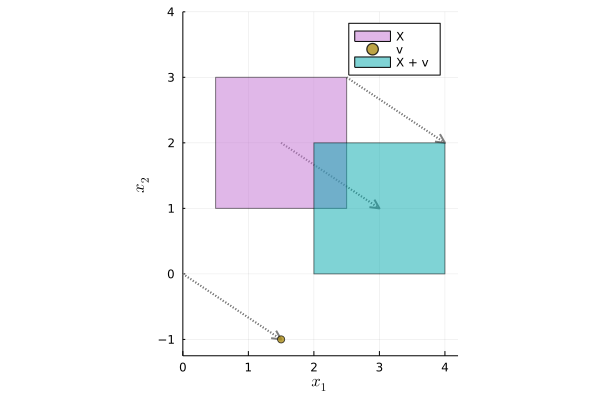

In [10]:
using LazySets, LaTeXStrings
using Plots: plot, plot!, text, lens!, bbox

p(args...; kwargs...) = plot(xlims=(0,4), ylims=(0,4), ratio=1, lab="",
                        xlab=L"x_{1}", ylab=L"x_{2}", args...; kwargs...)
p!(args...; kwargs...) = plot!(lab="", args...; kwargs...);

X = BallInf([1.5, 2.0], 1.0)
v = [1.5, -1.0]
Y = LazySets.translate(X, v)

# arrows
p([0, v[1]], [0, v[2]], linecolor=:gray, arrow=:arrow, linestyle=:dot, width=2)
p!([high(X, 1), high(Y, 1)], [high(X, 2), high(Y, 2)], linecolor=:gray,
    arrow=:arrow, linestyle=:dot, width=2)
p!([center(X,1), center(Y, 1)], [center(X, 2), center(Y, 2)], linecolor=:gray,
    arrow=:arrow, linestyle=:dot, width=2)

# sets
p!(X, lab="X")
p!(Singleton(v), alpha=0.8, lab="v")
p!(Y, lab="X + v")

###  Minkowski Sum

We can take the elementwise sum of two sets $X$ and $Y$:
\begin{equation}
X \oplus Y = \{x + y \ | \ x \in X, y \in Y\}
\end{equation}

In [10]:
using LazySets, LaTeXStrings
using Plots: plot, plot!, text, lens!, bbox

p(args...; kwargs...) = plot(xlims=(0,4), ylims=(0,4), ratio=1, lab="",
                        xlab=L"x_{1}", ylab=L"x_{2}", args...; kwargs...)
p!(args...; kwargs...) = plot!(lab="", args...; kwargs...);

X = BallInf([1.5, 2.0], 1.0)
v = [2.5, -1.0]
Y = minkowski_sum(X, Singleton(v))

@show isequivalent(Y, LazySets.translate(X, v));

isequivalent(Y, LazySets.translate(X, v)) = true


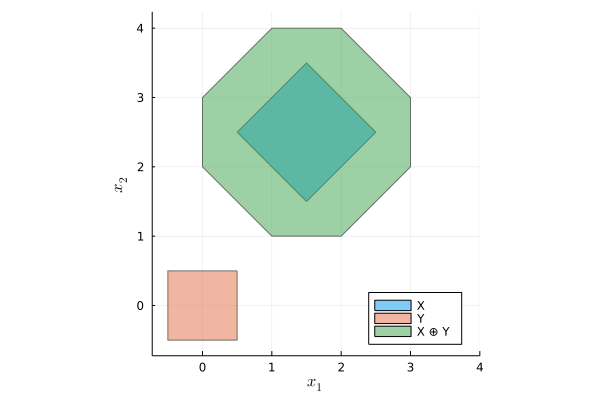

In [9]:
# "bloat" a set by adding a ball centered in the origin

using Plots, LazySets, LaTeXStrings

p(args...; kwargs...) = plot(xlims=(0,4), ylims=(0,4), ratio=1, lab="",
                        xlab=L"x_{1}", ylab=L"x_{2}", args...; kwargs...)
p!(args...; kwargs...) = plot!(lab="", args...; kwargs...);

X = Ball1([1.5, 2.5], 1.0)
Y = BallInf([0.0, 0.0], 0.5)
Z = minkowski_sum(X, Y)

p(X, lab="X", leg=:bottomright)
p!(Y, lab="Y")
p!(Z, lab="X ⊕ Y")

In general, the sum of two sets can get pretty complicated

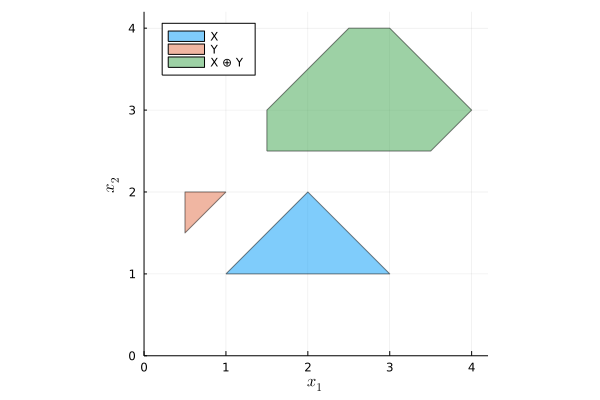

In [11]:
using LazySets, LaTeXStrings
using Plots: plot, plot!, text, lens!, bbox

p(args...; kwargs...) = plot(xlims=(0,4), ylims=(0,4), ratio=1, lab="",
                        xlab=L"x_{1}", ylab=L"x_{2}", args...; kwargs...)
p!(args...; kwargs...) = plot!(lab="", args...; kwargs...);

X = VPolygon([[1.0, 1.0], [3.0, 1.0], [2.0, 2.0]])
Y = VPolygon([[0.5, 1.5], [0.5, 2.0], [1.0, 2.0]])
Z = minkowski_sum(X, Y)

p(X, lab="X", leg=:topleft)
p!(Y, lab="Y")
p!(Z, lab="X ⊕ Y")

### Linear map

We can transform each element of a set $X$ via a matrix $M$:
\begin{equation}
M \cdot X = \{M \cdot x | x \in X\}
\end{equation}

A common case is the invertible map, which can rotate, shrink/enlarge, and mvoe a set.

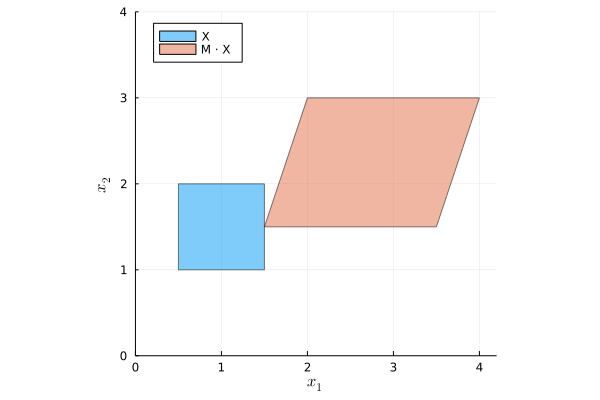

In [12]:
using LazySets, LaTeXStrings
using Plots: plot, plot!, text, lens!, bbox

p(args...; kwargs...) = plot(xlims=(0,4), ylims=(0,4), ratio=1, lab="",
                        xlab=L"x_{1}", ylab=L"x_{2}", args...; kwargs...)
p!(args...; kwargs...) = plot!(lab="", args...; kwargs...);

X = BallInf([1.0, 1.5], 0.5)
M = [2 0.5; 0 1.5]
Z = linear_map(M, X)

p(X, lab="X", leg=:topleft)
p!(Z, lab="M ⋅ X")

Another common case is the projection, which is particularly useful to plot higher-dimensional sets in the plane. There is also a convenience function `project` for this purpose.

isequivalent(Z1, project(X, [1])) = true

isequivalent(Z2, project(X, [2])) = true

dim(Z1) == dim(Z2) == 1 = true


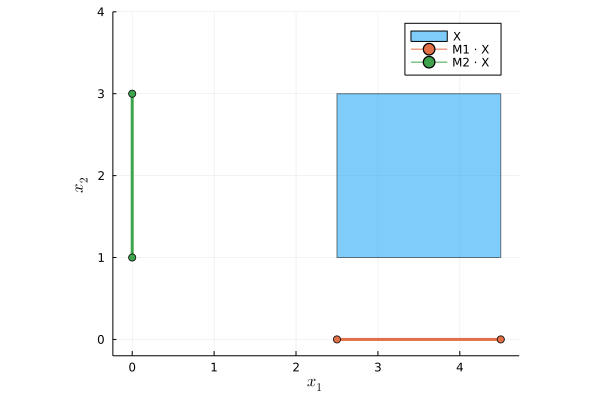

In [19]:
using LazySets, LaTeXStrings
using Plots: plot, plot!, text, lens!, bbox

p(args...; kwargs...) = plot(xlims=(0,4), ylims=(0,4), ratio=1, lab="",
                        xlab=L"x_{1}", ylab=L"x_{2}", args...; kwargs...)
p!(args...; kwargs...) = plot!(lab="", args...; kwargs...);

X = BallInf([3.5, 2.0], 1.0)
Z1 = linear_map([1.0 0;], X)

@show isequivalent(Z1, project(X, [1]))

println()
Z2 = linear_map([0.0 1;], X)
@show isequivalent(Z2, project(X, [2]))

println()
@show dim(Z1) == dim(Z2) == 1

# in order to plot the one-dimensional sets in the
# correct dimension, we embed them in two dimensions
M1 = [1.0 0; 0 0]
Z1_2d = linear_map(M1, X)
M2 = [0.0 0; 0 1]
Z2_2d = linear_map(M2, X)

# X is projected to 1-d line M1 and M2
p(X, lab="X")
p!(Z1_2d, linewidth=3, alpha=1, lab="M1 ⋅ X")
p!(Z2_2d, linewidth=3, alpha=1, lab="M2 ⋅ X")

### Affine map

An affine map is just the combination of a linear map and a translation. It occurs commonly in many applications

\begin{equation}
M \cdot X + v
\end{equation}

isequivalent(Z, LazySets.translate(Y, v)) = true


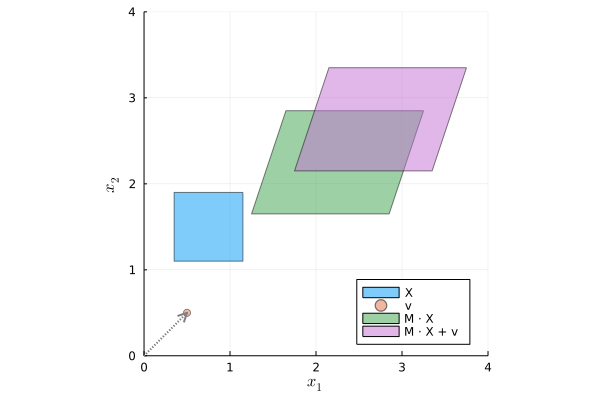

In [20]:
using LazySets, LaTeXStrings
using Plots: plot, plot!, text, lens!, bbox

p(args...; kwargs...) = plot(xlims=(0,4), ylims=(0,4), ratio=1, lab="",
                        xlab=L"x_{1}", ylab=L"x_{2}", args...; kwargs...)
p!(args...; kwargs...) = plot!(lab="", args...; kwargs...);

X = BallInf([0.75, 1.5], 0.4)
M = [2 0.5; 0 1.5]
v = [0.5, 0.5]

Y = linear_map(M, X)
Z = affine_map(M, X, v)

# check that the set 'affine_map(M, X, v)' is (mathematically)
# the same as 'translate(linear_map(M, X), v)'
@show isequivalent(Z, LazySets.translate(Y, v))

p(X, lab="X", leg=:bottomright)
p!(Singleton(v), lab="v")
p!(Y, lab="M ⋅ X")
p!(Z, lab="M ⋅ X + v")

# arrow
p!([0, v[1]], [0, v[2]], linecolor=:gray, arrow=:arrow, linestyle=:dot, width=2)
p!(center(Y), center(Z), linecolor=:gray, arrow=:arrow, linestyle=:dot, width=2)

### Convex hull

The convex hull of a set $X$ is the smallest convex set that contains $X$.

`LazySets` only offers a binary operation `convex_hull(X, Y)`, which is interpreted as the convex hull of the union of $X$ and $Y$.

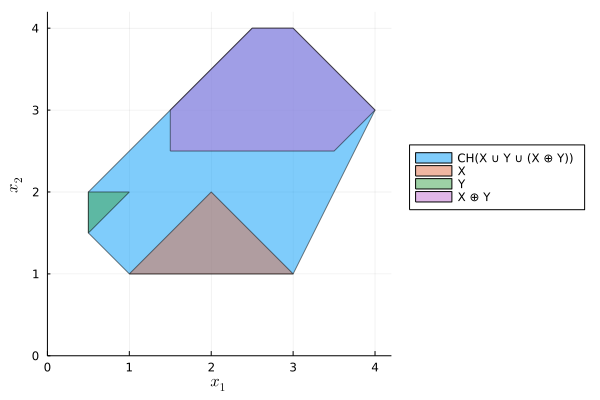

In [24]:
using LazySets, LaTeXStrings
using Plots: plot, plot!, text, lens!, bbox

p(args...; kwargs...) = plot(xlims=(0,4), ylims=(0,4), ratio=1, lab="",
                        xlab=L"x_{1}", ylab=L"x_{2}", args...; kwargs...)
p!(args...; kwargs...) = plot!(lab="", args...; kwargs...);

X = VPolygon([[1.0, 1.0], [3.0, 1.0], [2.0, 2.0]])
Y = VPolygon([[0.5, 1.5], [0.5, 2.0], [1.0, 2.0]])
Z = minkowski_sum(X, Y)
W = convex_hull(X, convex_hull(Y, Z))

p(W, lab="CH(X ∪ Y ∪ (X ⊕ Y))", leg=:outerright)
p!(X, lab="X")
p!(Y, lab="Y")
p!(Z, lab="X ⊕ Y")

### Intersection

The intersection of two sets $X$ and $Y$ consists of the common points:

\begin{equation}
X \cap Y = \{x \in \mathbb{R^{n}} | x \in X, x \in Y\}
\end{equation}

The result may be empty if the sets do not intersect.

intersection(X, Y) = ∅(2)


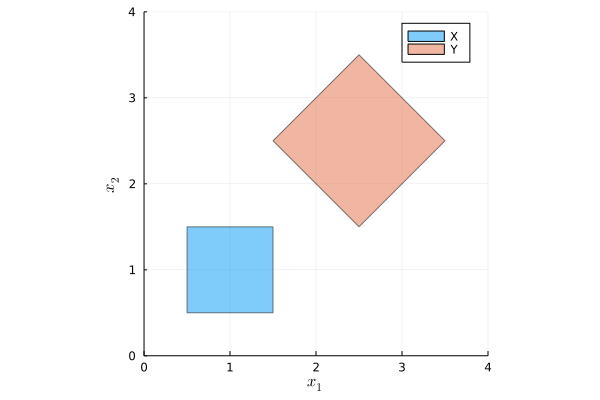

In [32]:
# no intersection
using LazySets, LaTeXStrings
using Plots: plot, plot!, text, lens!, bbox

p(args...; kwargs...) = plot(xlims=(0,4), ylims=(0,4), ratio=1, lab="",
                        xlab=L"x_{1}", ylab=L"x_{2}", args...; kwargs...)
p!(args...; kwargs...) = plot!(lab="", args...; kwargs...);

X = BallInf([1.0, 1.0], 0.5)
Y = Ball1([2.5, 2.5], 1.0)
@show intersection(X, Y)

p(X, lab="X")
p!(Y, lab="Y")

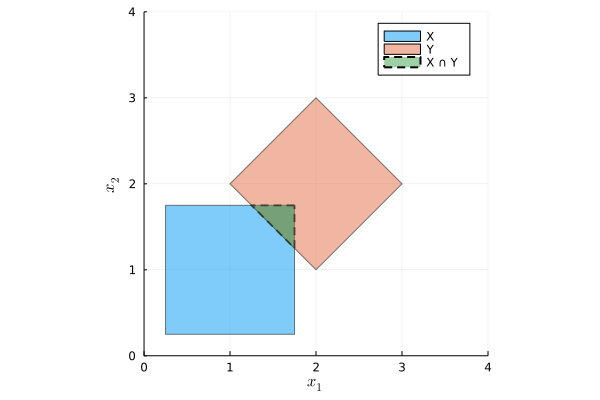

In [36]:
# get an intersection

using LazySets, LaTeXStrings
using Plots: plot, plot!, text, lens!, bbox

p(args...; kwargs...) = plot(xlims=(0,4), ylims=(0,4), ratio=1, lab="",
                        xlab=L"x_{1}", ylab=L"x_{2}", args...; kwargs...)
p!(args...; kwargs...) = plot!(lab="", args...; kwargs...);

X = BallInf([1.0, 1.0], 0.75)
Y = Ball1([2.0, 2.0], 1.0)
Z = intersection(X, Y)

p(X, lab="X")
p!(Y, lab="Y")
p!(Z, lab="X ∩ Y", linestyle=:dash, linewidth=2)

### Cartesian Product

The Cartesian product of two sets $X$ and $Y$ "glues" all pairs of points together:

\begin{equation}
X \times Y = \{(x, y) \ | \ x \in X, y \in Y\}
\end{equation}

in the special case that both sets are intervals, the result is simply a rectangle:

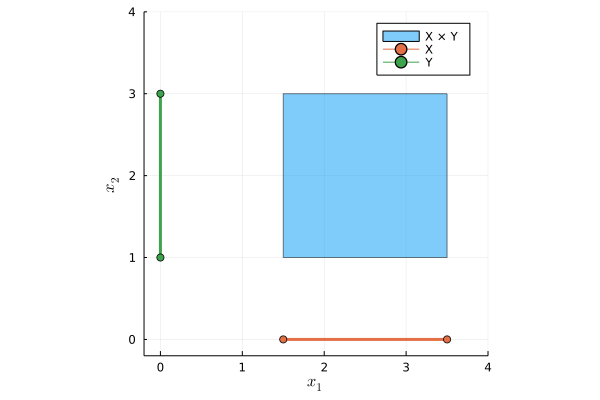

In [42]:
using LazySets, LaTeXStrings
using Plots: plot, plot!, text, lens!, bbox

p(args...; kwargs...) = plot(xlims=(0,4), ylims=(0,4), ratio=1, lab="",
                        xlab=L"x_{1}", ylab=L"x_{2}", args...; kwargs...)
p!(args...; kwargs...) = plot!(lab="", args...; kwargs...);

X = Interval(1.5, 3.5)
Y = Interval(1.0, 3.0)
Z = cartesian_product(X, Y)

p(Z, lab="X × Y")
p!(X × ZeroSet(1), linewidth=3, alpha=1, lab="X")
p!(ZeroSet(1) × Y, linewidth=3, alpha=1, lab="Y")

## Polyhedral Computations

For performing polyhedral computations in higher dimensions, `LazySets` relies on the `Polyhedra` library.

The theory of polyhedra relies on solving linear programs (LPs) and `Polyhedra` is generic in the choice of the LP solver. 

The main idea of polyhedral libraries is to work with two dual representations of polyhedra: the half-space representation (H-rep, also called constraint representation) and the vertex representation (V-rep, also called generator representation).

In `LazySets` you need to choose from these three set types:

* `HPolyhedron` for general (unbounded) polyhedra in H-rep

* `HPolytope` for (bounded) polytopes in H-rep

* `VPolytope` for (bounded) polytopes in V-rep

Internally, `HPolyhedron` and `HPolytope` look the same. The only difference is that `HPolytope` stores the information that the set is bounded(which is not checked at construction time).


isequivalent(Ph, tohrep(Pv)) = true
isequivalent(Pv, tovrep(Ph)) = true


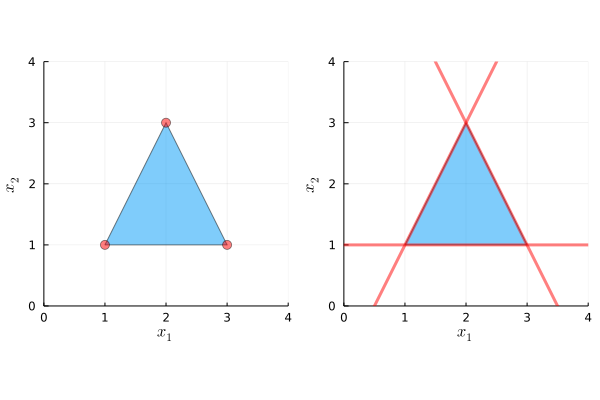

In [44]:
import Polyhedra, CDDLib
using LazySets, LaTeXStrings
using Plots: plot, plot!, text, lens!, bbox

p(args...; kwargs...) = plot(xlims=(0,4), ylims=(0,4), ratio=1, lab="",
                        xlab=L"x_{1}", ylab=L"x_{2}", args...; kwargs...)
p!(args...; kwargs...) = plot!(lab="", args...; kwargs...);

Pv = VPolytope([[1.0, 1.0], [3.0, 1.0], [2.0, 3.0]])

Ph = HPolytope([HalfSpace([2.0, 1.0], 7.0),
                HalfSpace([-2.0, 1.0], -1.0),
                HalfSpace([0.0, -1.0], -1.0)])

@show isequivalent(Ph, tohrep(Pv))
@show isequivalent(Pv, tovrep(Ph))

p1 = p()
plot!(p1, Pv)
plot!(p1, singleton_list(Pv), seriestype=:scatter, markersize=5, markercolor=:red)

p2 = p()
plot!(p2, Ph)
[plot!(p2, Hyperplane(c.a, c.b), linewidth=3, color=:red) for c in constraints_list(Ph)]

plot(p1, p2, layout = (1, 2))

Below we first compute the intersection of a cube with a three-dimensional triangle and then project the three sets to dimension 1 and 3.

┌ Warning: The GLPK constants have been renamed from `GLPK.XXX` to `GLPK.GLP_XXX` in order to better match the C API. For example, `GLPK.MSG_OFF` is now `GLPK.GLP_MSG_OFF`. Support for the old constants will be removed in a future release.
└ @ GLPK /home/browni/.julia/packages/GLPK/JpN1q/src/MOI_wrapper/deprecated_constants.jl:19


glp_simplex: unable to recover undefined or non-optimal solution


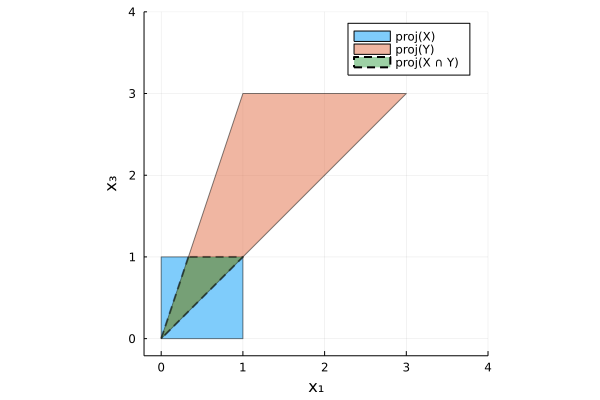

In [45]:
import Polyhedra, CDDLib
using LazySets, LaTeXStrings
using Plots: plot, plot!, text, lens!, bbox

p(args...; kwargs...) = plot(xlims=(0,4), ylims=(0,4), ratio=1, lab="",
                        xlab=L"x_{1}", ylab=L"x_{2}", args...; kwargs...)
p!(args...; kwargs...) = plot!(lab="", args...; kwargs...);

X = HPolyhedron([HalfSpace([1.0, 0.0, 0.0], 1.0), HalfSpace([-1.0, 0.0, 0.0], 0.0),
                 HalfSpace([0.0, 1.0, 0.0], 1.0), HalfSpace([0.0, -1.0, 0.0], 0.0),
                 HalfSpace([0.0, 0.0, 1.0], 1.0), HalfSpace([0.0, 0.0, -1.0], 0.0)])
Y = VPolytope([zeros(3), 3 * ones(3), [1.0, 2.0, 3.0]])
Z = intersection(X, Y)
dims = [1, 3]

p(project(X, dims), lab="proj(X)", xlab="x₁", ylab="x₃")
p!(project(Y, dims), lab="proj(Y)")
p!(project(Z, dims), lab="proj(X ∩ Y)", linestyle=:dash, linewidth=2)

The intersection / $proj(X ∩ Y)$ is generally computed in H-rep. Since intersection with a bounded set is always bounded, `LazySets` creates an `HPolytope`.

We see that typeof($Z$) returns `HPolytope`, it is a result of the intersection between $X$ (a HPolyhedron) and $Y$ (a VPolytope)

In [1]:
#typeof(X) -> HPolyhedron
#typeof(Y) -> VPolytopetypeof(Z)

HPolytope{Float64, Vector{Float64}}

We can compute the half-spaces/constraints of polyhedral sets:

In [6]:
constraints_list(Z)

5-element Vector{HalfSpace{Float64, Vector{Float64}}}:
 HalfSpace{Float64, Vector{Float64}}([0.0, 0.0, 1.0], 1.0)
 HalfSpace{Float64, Vector{Float64}}([-1.0, 2.0, -1.0], 0.0)
 HalfSpace{Float64, Vector{Float64}}([1.0, -2.0, 1.0], -0.0)
 HalfSpace{Float64, Vector{Float64}}([-1.3333333333333333, 0.6666666666666666, -0.0], 0.0)
 HalfSpace{Float64, Vector{Float64}}([1.0, -1.0, -0.0], 0.0)

Similarly, we can compute the vertices of polytopic sets:

In [8]:
vertices_list(Z)

LoadError: MethodError: no method matching removevredundancy!(::Polyhedra.DefaultPolyhedron{Float64, Polyhedra.MixedMatHRep{Float64, Matrix{Float64}}, Polyhedra.MixedMatVRep{Float64, Matrix{Float64}}}; ztol=1.4901161193847656e-7)
[0mClosest candidates are:
[0m  removevredundancy!(::Polyhedra.Polyhedron; strongly, planar) at ~/.julia/packages/Polyhedra/NGGvZ/src/redundancy.jl:119[91m got unsupported keyword argument "ztol"[39m
[0m  removevredundancy!([91m::Polyhedra.Interval[39m) at ~/.julia/packages/Polyhedra/NGGvZ/src/interval.jl:201[91m got unsupported keyword argument "ztol"[39m
[0m  removevredundancy!([91m::CDDLib.Polyhedron[39m) at ~/.julia/packages/CDDLib/izPqs/src/polyhedron.jl:244[91m got unsupported keyword argument "ztol"[39m

## Other Set Representations

### Hyperrectangle

A rectangle is a special case of a linear map (scaling) applied to a square. This generalizes to higher dimensions. In `LazySets`, a hyperrectangle is represented by a center point and a radius in each dimension, but there is also a constructor from the lower and upper vertex:

isequivalent(H1, H2) = true


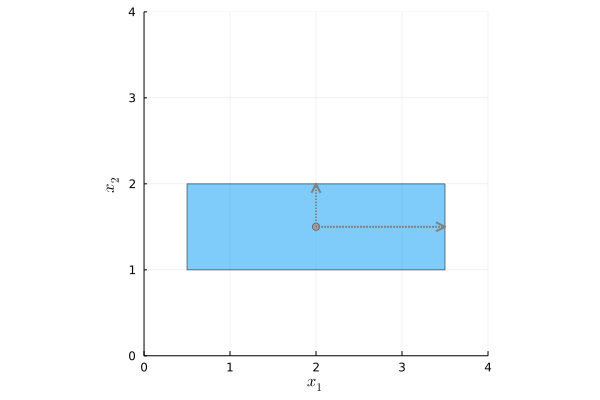

In [9]:
import Polyhedra, CDDLib
using LazySets, LaTeXStrings
using Plots: plot, plot!, text, lens!, bbox

p(args...; kwargs...) = plot(xlims=(0,4), ylims=(0,4), ratio=1, lab="",
                        xlab=L"x_{1}", ylab=L"x_{2}", args...; kwargs...)
p!(args...; kwargs...) = plot!(lab="", args...; kwargs...);

c = [2.0, 1.5]
r = [1.5, 0.5] # define the radius from the center of rectangle to (horizontal side, vertical side)
H1 = Hyperrectangle(c, r)
H2 = Hyperrectangle(low=[0.5, 1], high=[3.5, 2])

@show isequivalent(H1, H2)

p(H1)
p!(Singleton(c))
p!([c[1], c[1]], [c[2], c[2] + r[2]], linecolor=:gray, arrow=:arrow, linestyle=:dot, width=2)
p!([c[1], c[1] + r[1]], [c[2], c[2]], linecolor=:gray, arrow=:arrow, linestyle=:dot, width=2)

### Polygons

Polytopes in two dimensions are called polygons and can be handled efficiently. In `LazySets`, there are special set types `HPolygon` respectively `VPolygon` for this purpose. They sort the constraints respectively vertices on the plane (which is not possible in higher dimensions).

Below we evaluate the same operations for specialized polygon types and general polytope types. As we see, in two dimensinos these operations can be implemented much faster.

#### H-rep:

  0.000232 seconds (604 allocations: 38.031 KiB)
  0.142806 seconds (229.52 k allocations: 13.256 MiB, 53.24% gc time)


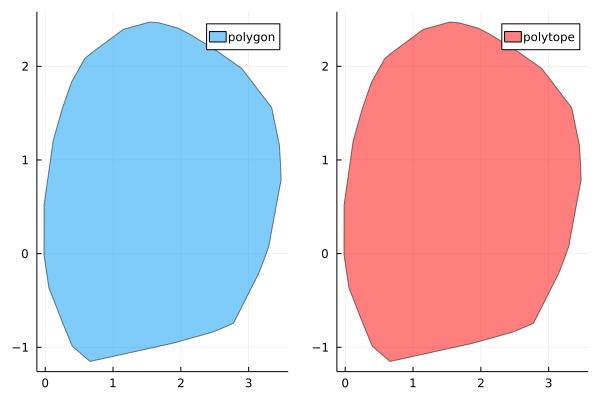

In [17]:
import Polyhedra, CDDLib
using LazySets, LaTeXStrings
using Plots: plot, plot!, text, lens!, bbox

p(args...; kwargs...) = plot(xlims=(0,4), ylims=(0,4), ratio=1, lab="",
                        xlab=L"x_{1}", ylab=L"x_{2}", args...; kwargs...)
p!(args...; kwargs...) = plot!(lab="", args...; kwargs...);

# polygon representation with 30 half-spaces
PH_gon1 = rand(HPolygon, num_constraints=30)
PH_gon2 = linear_map([1.01 0; 0 0.99], PH_gon1)
@time PH_gon = intersection(PH_gon1, PH_gon2)

# general polytope representation
PH_tope1 = convert(HPolytope, PH_gon1)
PH_tope2 = convert(HPolytope, PH_gon2)
@time PH_tope = intersection(PH_tope1, PH_tope2)

p1 = plot(PH_gon, lab="polygon")
p2 = plot(PH_tope, color=:red, lab="polytope")
plot(p1, p2, layout = (1, 2))

#### V-rep:

  0.277933 seconds (117.33 k allocations: 6.389 MiB, 99.75% compilation time)
  0.374673 seconds (237.88 k allocations: 18.045 MiB, 63.49% compilation time)


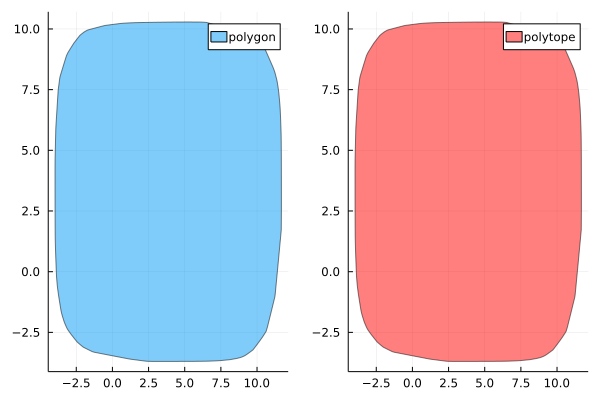

In [18]:
import Polyhedra, CDDLib
using LazySets, LaTeXStrings
using Plots: plot, plot!, text, lens!, bbox

p(args...; kwargs...) = plot(xlims=(0,4), ylims=(0,4), ratio=1, lab="",
                        xlab=L"x_{1}", ylab=L"x_{2}", args...; kwargs...)
p!(args...; kwargs...) = plot!(lab="", args...; kwargs...);

# polygon representation with 5000 vertices
PV_gon1 = rand(VPolygon, num_vertices=5000)
PV_gon2 = linear_map([1.01 0; 0 0.99], PV_gon1)
@time PV_gon = minkowski_sum(PV_gon1, PV_gon2)

# general polytope representation
PV_tope1 = convert(VPolytope, PV_gon1)
PV_tope2 = convert(VPolytope, PV_gon2)
@time PV_tope = minkowski_sum(PV_tope1, PV_tope2)

p1 = plot(PV_gon, lab="polygon")
p2 = plot(PV_tope, color=:red, lab="polytope")
plot(p1, p2, layout = (1, 2))


### Zonotope

A zonotope $Z$ is a general linear map applied to a (hyper)cube. By the nature of linear maps, that makes a zonotope a centrally symmetric convex polytope. (In two dimensions these notions even coincide.)

ALternatively, a zonotope can be characterized as a Minkowski sum of line segments, or by a center point $c \in \mathbb{R^{n}}$ and a sum of $p$ generators $g_{j} \in \mathbb{R^{n}}$:

\begin{equation}
Z = \{c + \sum_{j=1}^{p} ξ_{j} \cdot g_{j} \ | \ ξ_{j} \in[-1,1]\}
\end{equation}

In `LazySets`, the generator representation is used, and the generators $g_{j}$ are stored as the columns of a matrix.

The order of a zonotope is the ratio $\frac{p}{n}$ of the number of generators $p$ and the dimension $n$.

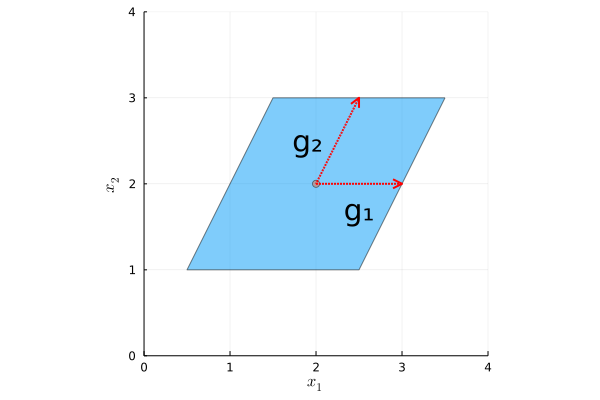

In [19]:
import Polyhedra, CDDLib
using LazySets, LaTeXStrings
using Plots: plot, plot!, text, lens!, bbox

p(args...; kwargs...) = plot(xlims=(0,4), ylims=(0,4), ratio=1, lab="",
                        xlab=L"x_{1}", ylab=L"x_{2}", args...; kwargs...)
p!(args...; kwargs...) = plot!(lab="", args...; kwargs...);

c = [2.0, 2.0]
g1 = [1, 0]
g2 = [0.5, 1]
G = hcat(g1, g2)
Z = Zonotope(c, G)

p(Z)
p!(Singleton(c))
p!([c[1], c[1] + g1[1]], [c[2], c[2] + g1[2]], linecolor=:red, arrow=:arrow,
    linestyle=:dot, width=2, annotations=(2.5, 1.7, text("g₁", 20)))
p!([c[1], c[1] + g2[1]], [c[2], c[2] + g2[2]], linecolor=:red, arrow=:arrow,
    linestyle=:dot, width=2, annotations=(1.9, 2.5, text("g₂", 20)))


Zonotopes are interesting because they are efficient and closed under Minkowski sum and linear map.

Zonotope{Float64, Vector{Float64}, Matrix{Float64}}
  center: Array{Float64}((2,)) [-0.6, -1.2]
  generators: Array{Float64}((2, 2)) [-0.3 -0.15; 0.0 -0.6]

Zonotope{Float64, Vector{Float64}, Matrix{Float64}}
  center: Array{Float64}((2,)) [1.4, 0.8]
  generators: Array{Float64}((2, 4)) [-0.3 -0.15 1.0 0.5; 0.0 -0.6 0.0 1.0]


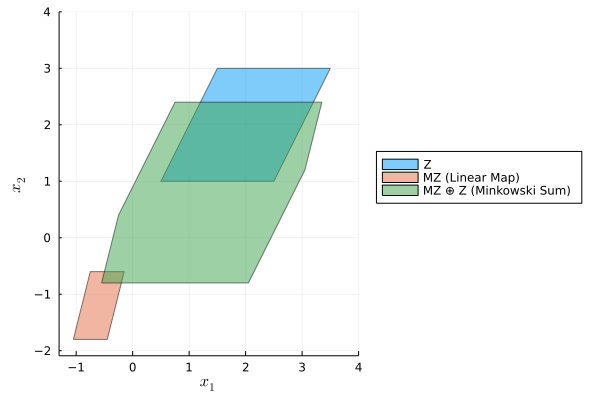

In [26]:
import Polyhedra, CDDLib
using LazySets, LaTeXStrings
using Plots: plot, plot!, text, lens!, bbox

p(args...; kwargs...) = plot(xlims=(0,4), ylims=(0,4), ratio=1, lab="",
                        xlab=L"x_{1}", ylab=L"x_{2}", args...; kwargs...)
p!(args...; kwargs...) = plot!(lab="", args...; kwargs...);

c = [2.0, 2.0]
g1 = [1, 0]
g2 = [0.5, 1]
G = hcat(g1, g2)
Z = Zonotope(c, G)

M = [-0.3 0; 0 -0.6]
Z2 = linear_map(M, Z)
dump(Z2)

println()
Z3 = minkowski_sum(Z2, Z)
dump(Z3)

p(Z, lab="Z", leg=:outerright)
p!(Z2, lab="MZ (Linear Map)")
p!(Z3, lab="MZ ⊕ Z (Minkowski Sum)")

Zonotope{Float64, Vector{Float64}, Matrix{Float64}}
  center: Array{Float64}((2,)) [-0.6, -1.2]
  generators: Array{Float64}((2, 2)) [-0.3 -0.15; 0.0 -0.6]

Zonotope{Float64, Vector{Float64}, Matrix{Float64}}
  center: Array{Float64}((2,)) [1.4, 0.8]
  generators: Array{Float64}((2, 4)) [-0.3 -0.15 1.0 0.5; 0.0 -0.6 0.0 1.0]


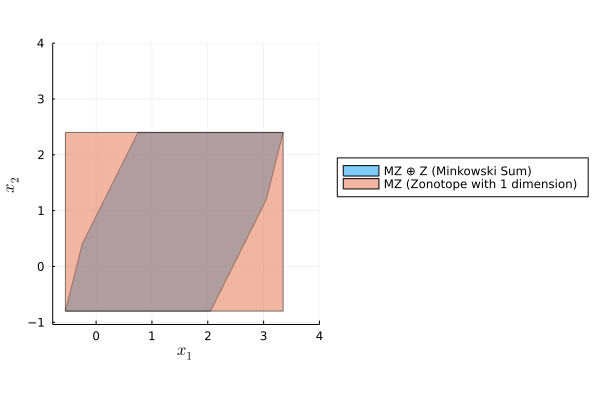

In [40]:
import Polyhedra, CDDLib
using LazySets, LaTeXStrings
using Plots: plot, plot!, text, lens!, bbox

p(args...; kwargs...) = plot(xlims=(0,4), ylims=(0,4), ratio=1, lab="",
                        xlab=L"x_{1}", ylab=L"x_{2}", args...; kwargs...)
p!(args...; kwargs...) = plot!(lab="", args...; kwargs...);

c = [2.0, 2.0]
g1 = [1, 0]
g2 = [0.5, 1]
G = hcat(g1, g2)
Z = Zonotope(c, G)

M = [-0.3 0; 0 -0.6]
Z2 = linear_map(M, Z)
dump(Z2)

println()
Z3 = minkowski_sum(Z2, Z)
dump(Z3)

Z4 = reduce_order(Z3, 1)

p(Z3, lab="MZ ⊕ Z (Minkowski Sum)", leg=:outerright)
p!(Z4, lab="MZ (Zonotope with 1 dimension)")

### Interval

In one dimension there is only one bounded convex set: the interval. `LazySets` has a special type `Interval` for representing intervals. This type wraps an `IntervalArithmetic.Interval`, so computations enjoy certain features such as conservative rounding.

In [27]:
Interval(1/3, 9/5)

Interval{Float64, IntervalArithmetic.Interval{Float64}}([0.333333, 1.80001])

### Hyperplanes and Lines

A hyperplane is the set $a \cdot x = b$

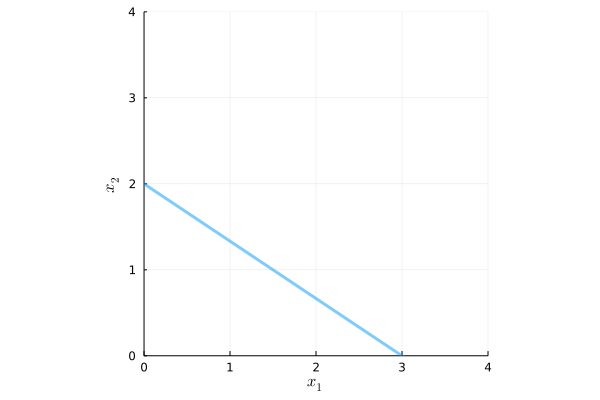

In [33]:
import Polyhedra, CDDLib
using LazySets, LaTeXStrings
using Plots: plot, plot!, text, lens!, bbox

p(args...; kwargs...) = plot(xlims=(0,4), ylims=(0,4), ratio=1, lab="",
                        xlab=L"x_{1}", ylab=L"x_{2}", args...; kwargs...)
p!(args...; kwargs...) = plot!(lab="", args...; kwargs...);

a = [1/3, 0.5]
b = 1.0
H = Hyperplane(a, b)

p(H, linewidth=3)

A line is a hyperplane in two dimensions. `LazySets` provides the `Line2D` type. There is also the more general `Line`, which can also have higher dimension and is characterized by a point `p` on the line and a direction `d`.

In [34]:
import Polyhedra, CDDLib
using LazySets, LaTeXStrings
using Plots: plot, plot!, text, lens!, bbox

p(args...; kwargs...) = plot(xlims=(0,4), ylims=(0,4), ratio=1, lab="",
                        xlab=L"x_{1}", ylab=L"x_{2}", args...; kwargs...)
p!(args...; kwargs...) = plot!(lab="", args...; kwargs...);

L2 = Line2D(a, b)
L = Line([0.0, 2.0], [3.0, -2.0])
@show isequivalent(H, L2) && isequivalent(L2, L);

isequivalent(H, L2) && isequivalent(L2, L) = true


### Line Segment

A line segment in two dimensions has its own representation: a `LineSegment` is characterized by the two bounding vertices.

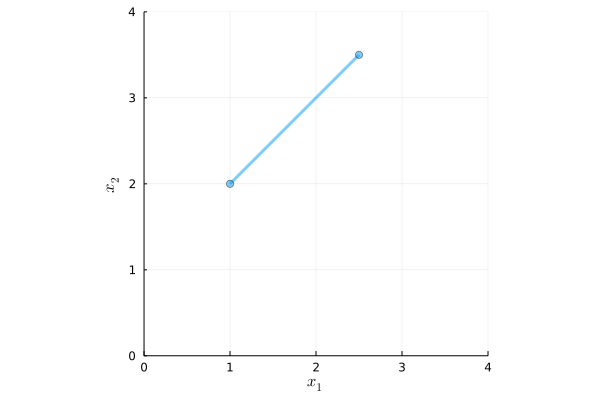

In [35]:
import Polyhedra, CDDLib
using LazySets, LaTeXStrings
using Plots: plot, plot!, text, lens!, bbox

p(args...; kwargs...) = plot(xlims=(0,4), ylims=(0,4), ratio=1, lab="",
                        xlab=L"x_{1}", ylab=L"x_{2}", args...; kwargs...)
p!(args...; kwargs...) = plot!(lab="", args...; kwargs...);

LS = LineSegment([1.0, 2.0], [2.5, 3.5])

p(LS, linewidth=3)

### Empty Set

The empty set {} is an empty set, it is useful as a result of set operations such as intersection, or after you dump all useless stuff that you do not need after following Marie Kondo' advice.

In [36]:
EmptySet(2)

∅(2)

### Parallelotope

Parallelotopes are zonotopes with 2 parallel constaints per dimension. In `LazySets` they are represented in constraint representation by storing the directions $D$ together with offsets $o$.

\begin{equation}
-D_{i} \cdot \le -o_{i} \quad \text{and} \quad D_{i} \cdot x \le -o_{n+i}
\end{equation}

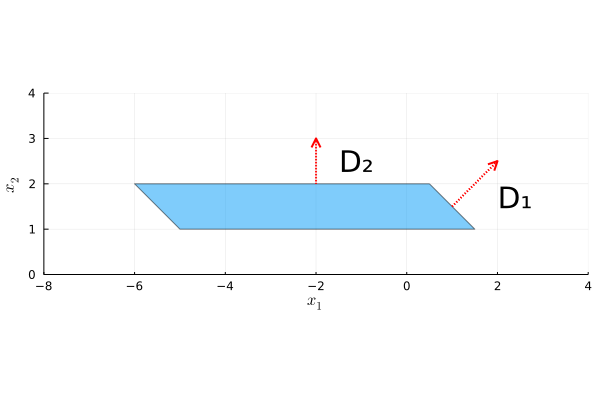

In [37]:
import Polyhedra, CDDLib
using LazySets, LaTeXStrings
using Plots: plot, plot!, text, lens!, bbox

p(args...; kwargs...) = plot(xlims=(0,4), ylims=(0,4), ratio=1, lab="",
                        xlab=L"x_{1}", ylab=L"x_{2}", args...; kwargs...)
p!(args...; kwargs...) = plot!(lab="", args...; kwargs...);

H = [1.0 1.0; 0.0 1.0]
o = [2.5, 2.0, 4.0, -1.0]
Pl = HParallelotope(H, o)

p(Pl, xlim=(-8, 4), ylim=(0, 4))
p!([1, 1 + H[1, 1]], [1.5, 1.5 + H[1, 2]], linecolor=:red, arrow=:arrow, linestyle=:dot, width=2,
    annotations=(2.4, 1.7, text("D₁", 20)), lab="")
p!([-2, -2 + H[2, 1]], [2, 2 + H[2, 2]], linecolor=:red, arrow=:arrow, linestyle=:dot, width=2,
    annotations=(-1.1, 2.5, text("D₂", 20)), lab="")
#p!(HalfSpace(-H[1, :], -o[1]), alpha=0.2, color=:cyan)
#p!(HalfSpace(-H[2, :], -o[2]), alpha=0.2, color=:yellow)
#p!(HalfSpace(H[1, :], -o[3]), alpha=0.2, color=:green)
#p!(HalfSpace(H[2, :], -o[4]), alpha=0.2, color=:orange)

### Ellipsoid

An invertible affine map applied to a Euclidean ball yields an ellipsoid. `LazySets` uses the common ellipsoid representation with a positive definite matrix $Q$ and center $c$:

\begin{equation}
\{x \in \mathbb{R^{n}}: (x - c)^{T} Q^{-1}(x - c) \le 1\}
\end{equation}

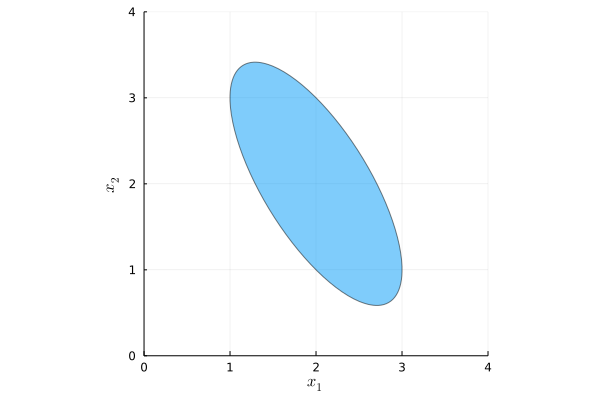

In [41]:
import Polyhedra, CDDLib
using LazySets, LaTeXStrings
using Plots: plot, plot!, text, lens!, bbox

p(args...; kwargs...) = plot(xlims=(0,4), ylims=(0,4), ratio=1, lab="",
                        xlab=L"x_{1}", ylab=L"x_{2}", args...; kwargs...)
p!(args...; kwargs...) = plot!(lab="", args...; kwargs...);

c = [2.0, 2.0]
Q = [1.0 -1.0; -1.0 2.0]
E = Ellipsoid(c, Q)

p(E)

### Lazy Set Representation

With polyhedral sets we have a class of sets that is closed under the operations we have seen. This is great because you need not think about how to represent the result.

As already mentioned before, the more general class of convex sets is also closed under these operations, but we can typically not represent the result with the limited amount of set types in `LazySets`. This is not a shortcoming of `LazySets`: you would need infinitely many set representations for all possible combinations. However, we shall now resort to a simple yet powerful trick to achieve at least a similar result.

We can represent the operation lazily. That means: we wrap the operands in a new object that, by definition, represents the result of the operation, but without actually performing the computation.

To give an example, the Minkowski sum of a square and a disc (balls in the infinity norm and Euclidean norm) is not representable in `LazySets`:

In [42]:
import Polyhedra, CDDLib
using LazySets, LaTeXStrings
using Plots: plot, plot!, text, lens!, bbox

X = Ball2([1.0, 1.0], 0.25)
Y = BallInf([2.0, 1.0], 0.25)
try minkowski_sum(X, Y) catch; println("N/A") end

N/A


We can just wrap the sets in a `MinkowskiSum` object:

In [43]:
@time Z = MinkowskiSum(X, Y)
dump(Z)

  0.024057 seconds (4.16 k allocations: 244.169 KiB, 97.17% compilation time)
MinkowskiSum{Float64, Ball2{Float64, Vector{Float64}}, BallInf{Float64, Vector{Float64}}}
  X: Ball2{Float64, Vector{Float64}}
    center: Array{Float64}((2,)) [1.0, 1.0]
    radius: Float64 0.25
  Y: BallInf{Float64, Vector{Float64}}
    center: Array{Float64}((2,)) [2.0, 1.0]
    radius: Float64 0.25


There is a nice theoretical framework for convex sets that allows to perform effective computations for lazy sets. We will soon explore this concept, but first we have an appetizer by plotting the result of the Minkowski sum of the two sets:

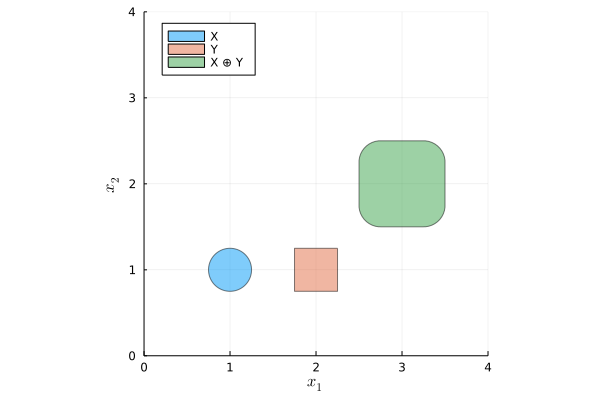

In [45]:
import Polyhedra, CDDLib
using LazySets, LaTeXStrings
using Plots: plot, plot!, text, lens!, bbox

p(args...; kwargs...) = plot(xlims=(0,4), ylims=(0,4), ratio=1, lab="",
                        xlab=L"x_{1}", ylab=L"x_{2}", args...; kwargs...)
p!(args...; kwargs...) = plot!(lab="", args...; kwargs...);

X = Ball2([1.0, 1.0], 0.25)
Y = BallInf([2.0, 1.0], 0.25)

p(X, lab="X", leg=:topleft)
p!(Y, lab="Y")
p!(Z, lab="X ⊕ Y")

# show the sums for each vertex
#[p!(X + v, alpha=0.2) for v in vertices_list(Y)]
#p!(Y + center(X), alpha=0.3)

There are corresponding types for the other set operations as well:

* Translation

* LinearMap

* AffineMap

* ConvexHull

* Intersection

* CartesianProduct

Lazy sets can be nested arbitrarily:

typeof(W) = Translation{Float64, MinkowskiSum{Float64, Ball2{Float64, Vector{Float64}}, ConvexHull{Float64, BallInf{Float64, Vector{Float64}}, MinkowskiSum{Float64, Ball2{Float64, Vector{Float64}}, BallInf{Float64, Vector{Float64}}}}}, Vector{Float64}}


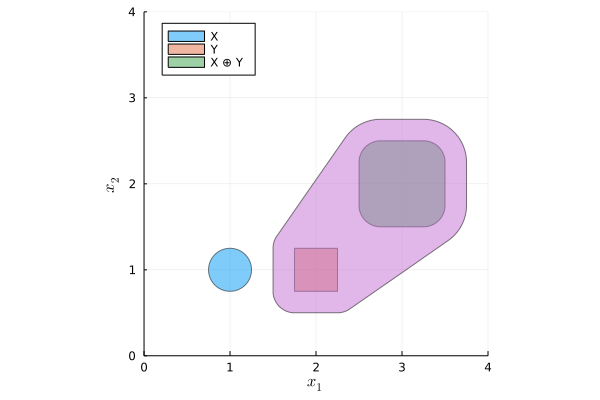

In [46]:
import Polyhedra, CDDLib
using LazySets, LaTeXStrings
using Plots: plot, plot!, text, lens!, bbox

p(args...; kwargs...) = plot(xlims=(0,4), ylims=(0,4), ratio=1, lab="",
                        xlab=L"x_{1}", ylab=L"x_{2}", args...; kwargs...)
p!(args...; kwargs...) = plot!(lab="", args...; kwargs...);

W = Translation(MinkowskiSum(X, ConvexHull(Y, Z)), [-1.0, -1.0])
@show typeof(W)

p!(W)

### Convenience Operations

Most of the lazy set types are binary and associative. TO construct a lazy operation of multiple operands, `LazySets` offers constructs from a vector of sets. These have the same name with the additional suffix `Array`, as in `MinkowskiSumArray`.

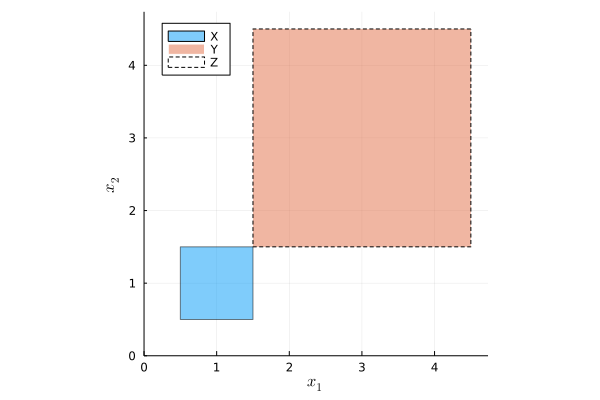

In [48]:
import Polyhedra, CDDLib
using LazySets, LaTeXStrings
using Plots: plot, plot!, text, lens!, bbox

p(args...; kwargs...) = plot(xlims=(0,4), ylims=(0,4), ratio=1, lab="",
                        xlab=L"x_{1}", ylab=L"x_{2}", args...; kwargs...)
p!(args...; kwargs...) = plot!(lab="", args...; kwargs...);

X = BallInf([1.0, 1.0], 0.5)
Y = MinkowskiSum(MinkowskiSum(X, X), X)
Z = MinkowskiSumArray([X, X, X])

p(X, lab="X", leg=:topleft)
p!(Y, linealpha=0, linecolor=:white, lab="Y")
p!(Z, alpha=0, linealpha=1, linestyle=:dash, lab="Z")

There are also short-hands for the operators like in standard mathematical notation:

* $X ⊕ Y = X + Y =$ MinkowskiSum$(X, Y)$

* $X + v =$ Translation$(X, v)$

* $M * X =$ LinearMap$(M, X)$

* $M * X + v =$ AffineMap$(M, X, v)$

* $CH(X, Y) =$ ConvexHull$(X, Y)$

* $X ∩ Y =$ Intersection$(X, Y)$

* $X × Y =$ CartesianProduct$(X, Y)$


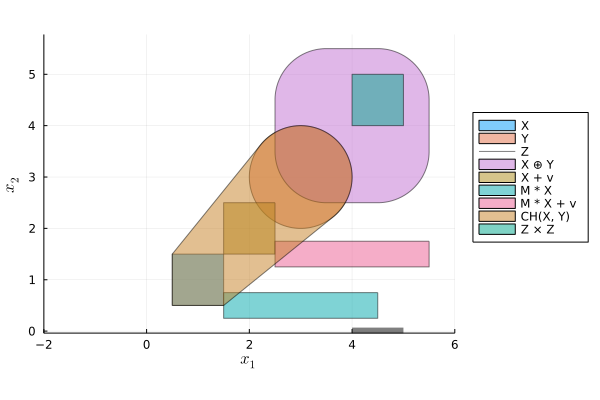

In [50]:
import Polyhedra, CDDLib
using LazySets, LaTeXStrings
using Plots: plot, plot!, text, lens!, bbox

p(args...; kwargs...) = plot(xlims=(0,4), ylims=(0,4), ratio=1, lab="",
                        xlab=L"x_{1}", ylab=L"x_{2}", args...; kwargs...)
p!(args...; kwargs...) = plot!(lab="", args...; kwargs...);

X = BallInf([1.0, 1.0], 0.5)
Y = Ball2([3.0, 3.0], 1.0)
Z = Interval(4.0, 5.0)
M = [3 0; 0 0.5]
v = [1.0, 1.0]

p(leg=:outerright, xlims=(-2, 6))
p!(X, lab="X")
p!(Y, lab="Y")
p!(Z, linewidth=7, color=:black, lab="Z")
p!(X ⊕ Y, lab="X ⊕ Y")
p!(X + v, lab="X + v")
p!(M * X, lab="M * X")
p!(M * X + v, lab="M * X + v")
p!(CH(X, Y), lab="CH(X, Y)")
p!(Z × Z, lab="Z × Z")

The function `concretize` creates a concrete set out of a lazy set, if possible.

The lazy paradigm works well with one exception: intersection.

concretize(X ⊕ X) = Hyperrectangle{Float64, Vector{Float64}, Vector{Float64}}([2.0, 2.0], [1.0, 1.0])

isequivalent(X ⊕ X, Z) = true


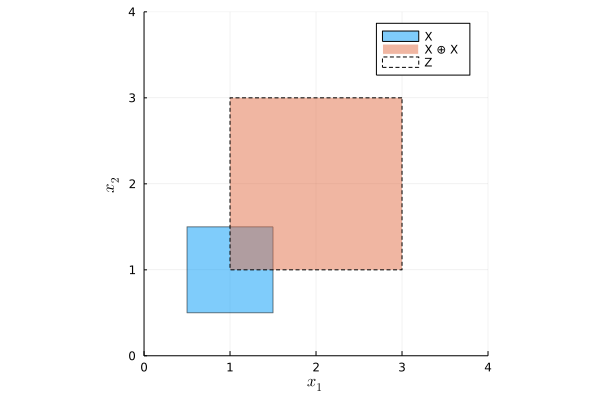

In [51]:
import Polyhedra, CDDLib
using LazySets, LaTeXStrings
using Plots: plot, plot!, text, lens!, bbox

p(args...; kwargs...) = plot(xlims=(0,4), ylims=(0,4), ratio=1, lab="",
                        xlab=L"x_{1}", ylab=L"x_{2}", args...; kwargs...)
p!(args...; kwargs...) = plot!(lab="", args...; kwargs...);

X = BallInf([1.0, 1.0], 0.5)
Z = @show concretize(X ⊕ X)

println()
@show isequivalent(X ⊕ X, Z)

p(X, lab="X")
p!(X ⊕ X, linealpha=0, linecolor=:white, lab="X ⊕ X")
p!(Z, alpha=0, linealpha=1, linestyle=:dash, lab="Z")

## Support-function Calculus of Convex Sets

Let $X \subseteq \mathbb{R^{n}}$ be a compact convex set. The support function of $X$ is the function $ \rho: \mathbb{R^{n}} \times 2^{\mathbb{R^{n}}} \rightarrow \mathbb{R}$, defined as $\rho(d,X):= \max_{x \in X} d^{T} x$.

The points $x \in X$ that maximize $d^{T}x$ are called support vectors $\sigma(d,X)$.

Intuitively, the support vectors are the extreme points of $X$ in direction $d$ and the support function describes the (signed) distance of the supporting hyperplane $d^{T}x \le b = \rho(d,X)$ from the origin.

σ(d, X) = [-3.0, 0.6]

ρ(d, X) = 3.6


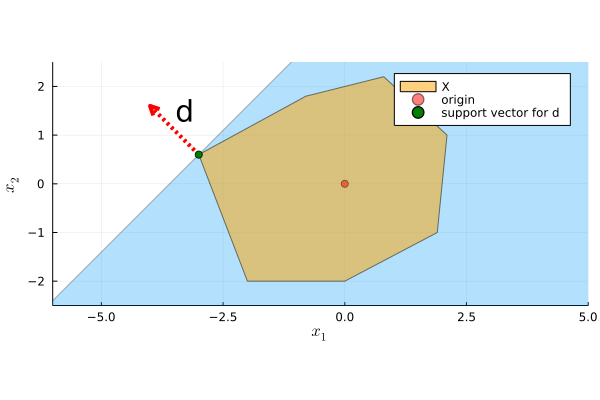

In [52]:
import Polyhedra, CDDLib
using LazySets, LaTeXStrings
using Plots: plot, plot!, text, lens!, bbox

p(args...; kwargs...) = plot(xlims=(0,4), ylims=(0,4), ratio=1, lab="",
                        xlab=L"x_{1}", ylab=L"x_{2}", args...; kwargs...)
p!(args...; kwargs...) = plot!(lab="", args...; kwargs...);

X = VPolygon([[0.8, 2.2], [2.1, 1], [1.9, -1], [0, -2],
              [-2, -2], [-3, 0.6], [-0.8, 1.8], [0.8, 2.2]])
d = [-1.0, 1.0]

sv = @show σ(d, X)

println()
sf = @show ρ(d, X)

H = HalfSpace(d, sf)

p(xlim=(-6, 5), ylim=(-2.5, 2.5))
p!(H, alpha=0.3)
p!(X, color=:orange, lab="X")
p!(Singleton([0.0, 0.0]), color=:red, lab="origin")
p!([sv[1], sv[1] + d[1]], [sv[2], sv[2] + d[2]], linecolor=:red, arrow=:arrow,
   linestyle=:dot, width=4, annotations=(-3.3, 1.5, text("d", 20)))
p!(Singleton(sv), alpha=1, color=:green, lab="support vector for d")

In `LazySets` we write $\rho(d,X)$ (support_function($d, X$)) for the support function $\rho(d,X)$.

We write $\sigma(d,X)$ (support_vector($d, X$)) for support vector $\sigma(d,X)$.

The following elementary properties of the support function hold for all compact convex sets $X, Y$ in $\mathbb{R^{n}}$, for all $n \times n$ real matrices $M$, all scalars $\lambda \in \mathbb{R}$, and all vectors $d \in \mathbb{R^{n}}$:

\begin{equation}
\rho(d,\lambda X) = \rho(\lambda d, X) \\
\rho(d,MX) = \rho(M^{T}d, X) \\
\rho(d,X \oplus Y) = \rho(d, X) + \rho(d, Y) \\
\rho(d,CH(X \cup Y)) = \max(\rho(d, X), \rho(d,Y)) \\
\rho(d,X \times Y) = \rho(d_{1}, X) + \rho(d_{2}, Y)\\
\end{equation}

## Support-function of the Lazy Intersection

One operation is crucially missing above: the intersection $\rho(d, X \cap Y)$.

We have the inequality $\rho(d, X \cap Y) \le \min(\rho(d, X), \rho(d, Y))$, which sometimes works well.

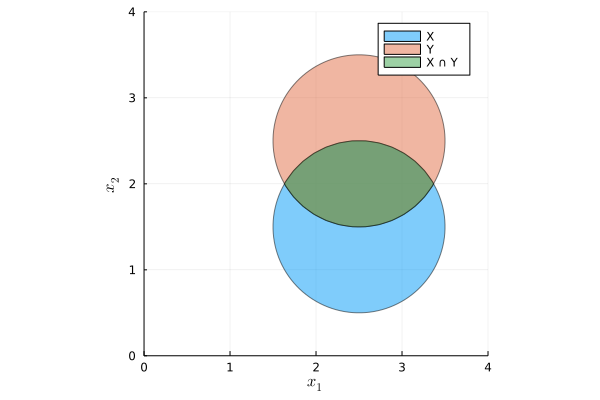

In [56]:
import Polyhedra, CDDLib
using LazySets, LaTeXStrings
using Plots: plot, plot!, text, lens!, bbox

p(args...; kwargs...) = plot(xlims=(0,4), ylims=(0,4), ratio=1, lab="",
                        xlab=L"x_{1}", ylab=L"x_{2}", args...; kwargs...)
p!(args...; kwargs...) = plot!(lab="", args...; kwargs...);

X = Ball2([2.5, 1.5], 1.0)
Y = Ball2([2.5, 2.5], 1.0)
Z = X ∩ Y

p(X, lab="X")
p!(Y, lab="Y")
p!(Z, lab="X ∩ Y")

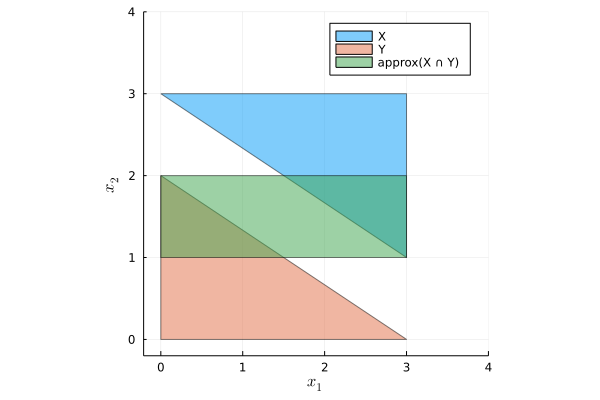

In [57]:
import Polyhedra, CDDLib
using LazySets, LaTeXStrings
using Plots: plot, plot!, text, lens!, bbox

p(args...; kwargs...) = plot(xlims=(0,4), ylims=(0,4), ratio=1, lab="",
                        xlab=L"x_{1}", ylab=L"x_{2}", args...; kwargs...)
p!(args...; kwargs...) = plot!(lab="", args...; kwargs...);

# change the default to the "min" heuristics
LazySets.use_precise_ρ(::Intersection) = false

X = VPolygon([[0.0, 3.0], [3.0, 1.0], [3.0, 3.0]])
Y = VPolygon([[0.0, 0.0], [3.0, 0.0], [0.0, 2.0]]) ⊕ Ball2([0.0, 0.0], 0.0)
Z = box_approximation(X ∩ Y)

# change the default back
LazySets.use_precise_ρ(::Intersection) = true

p(X, lab="X")
p!(Y, lab="Y")
p!(Z, lab="approx(X ∩ Y)")

The default implementation (if one of the sets is polyhedral) uses an optimization technique, for which we need to load Optim.

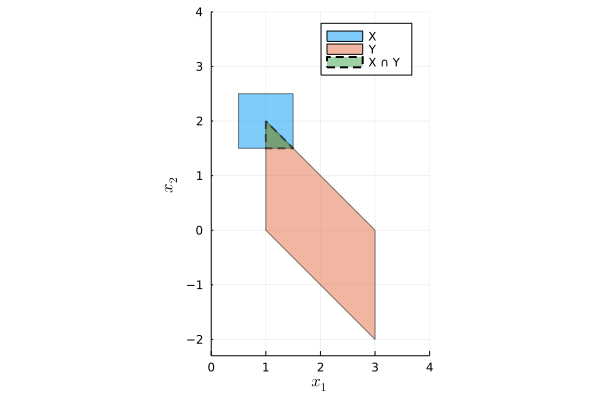

In [58]:
import Polyhedra, CDDLib
using LazySets, LaTeXStrings, Optim
using Plots: plot, plot!, text, lens!, bbox

p(args...; kwargs...) = plot(xlims=(0,4), ylims=(0,4), ratio=1, lab="",
                        xlab=L"x_{1}", ylab=L"x_{2}", args...; kwargs...)
p!(args...; kwargs...) = plot!(lab="", args...; kwargs...);

X = BallInf([1.0, 2.0], 0.5)
Y = linear_map([1 0; -1 1], BallInf([2.0, 2.0], 1.0))

p(X, lab="X")
p!(Y, lab="Y")
p!(X ∩ Y, linestyle=:dash, linewidth=2, lab="X ∩ Y")

For polyhedral sets, intersections can also be computed explicitly by converting to H-rep, where the intersection is just the accumulation of the constraints. This is always exact.

## Overapproximation

In some applications we do not require exact results but are content with an approximation. To still give mathematical guarantees, one usually aims for either over or underapproximations.

We can use the support function to get an overapproximation: For every nonempty compact convex set $X \subseteq \mathbb{R^{n}}$ and $D \subseteq \mathbb{R^{n}}$ we have

\begin{equation}
X \subseteq \bigcap_{d \in D} \{d^{T} x \le \rho(d,X)\}
\end{equation}

and equality holds for $D = \mathbb{R^{n}}$.

`LazySets` offers the function `overapproximate`, which takes a set $X$ and a list of directions $D$. There are also other alternatives to passing $D$ directly.

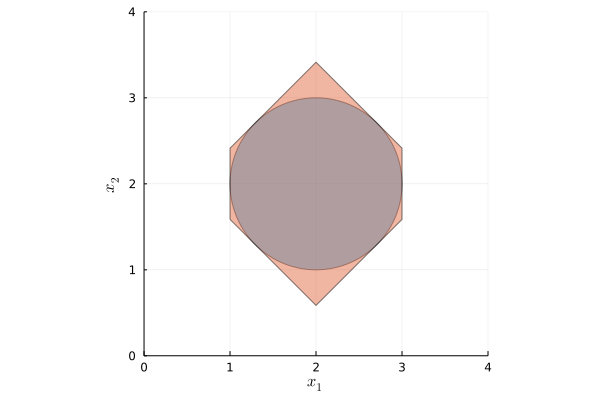

In [59]:
import Polyhedra, CDDLib
using LazySets, LaTeXStrings, Optim
using Plots: plot, plot!, text, lens!, bbox

p(args...; kwargs...) = plot(xlims=(0,4), ylims=(0,4), ratio=1, lab="",
                        xlab=L"x_{1}", ylab=L"x_{2}", args...; kwargs...)
p!(args...; kwargs...) = plot!(lab="", args...; kwargs...);

X = Ball2([2.0, 2.0], 1.0)
D = [[1.0, 0.0],  # east
     [1.0, 1.0],  # north east
     [-1.0, 1.0],  # north west
     [-1.0, 0.0],  # west
     [-1.0, -1.0],  # south west
     [1.0, -1.0]  # south east
    ]
Y = overapproximate(X, CustomDirections(D))

p(X)
p!(Y)

By default, we use $D$ as the axis-aligned box directions, which results in a box approximation (which can alternatively be computed with the `box_approximation` function)

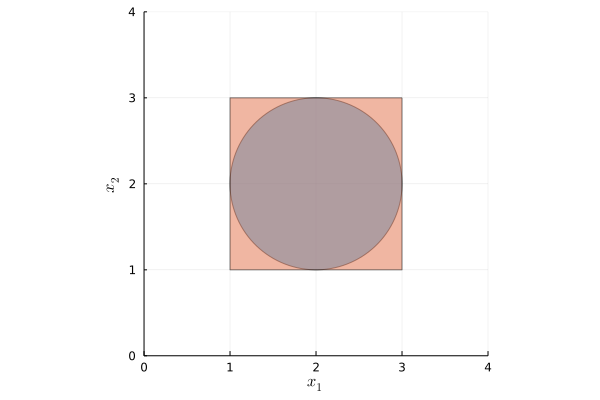

In [60]:
import Polyhedra, CDDLib
using LazySets, LaTeXStrings, Optim
using Plots: plot, plot!, text, lens!, bbox

p(args...; kwargs...) = plot(xlims=(0,4), ylims=(0,4), ratio=1, lab="",
                        xlab=L"x_{1}", ylab=L"x_{2}", args...; kwargs...)
p!(args...; kwargs...) = plot!(lab="", args...; kwargs...);

X = Ball2([2.0, 2.0], 1.0)

Y = overapproximate(X)

p(X)
p!(Y)

There are some additional convenience templates for $D$, such as octagon directions.

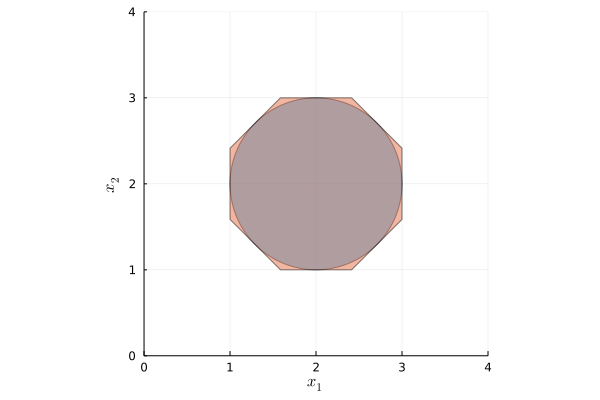

In [61]:
import Polyhedra, CDDLib
using LazySets, LaTeXStrings, Optim
using Plots: plot, plot!, text, lens!, bbox

p(args...; kwargs...) = plot(xlims=(0,4), ylims=(0,4), ratio=1, lab="",
                        xlab=L"x_{1}", ylab=L"x_{2}", args...; kwargs...)
p!(args...; kwargs...) = plot!(lab="", args...; kwargs...);

X = Ball2([2.0, 2.0], 1.0)

Y = overapproximate(X, OctDirections)

p(X)
p!(Y)

The most interesting aspect is that we can compute an overapproximation with arbitrary precision. `LazySets` offers `overapproximate($X,ε$)` to compute an ε-close (in the Hausdorff distance) overapproximation.

In two dimensions this can be achieved by starting from some fixed overapproximation (e.g., the box approximation) and then refining by adding directions "between" two neighboring directions until the gain in precision is below ε.

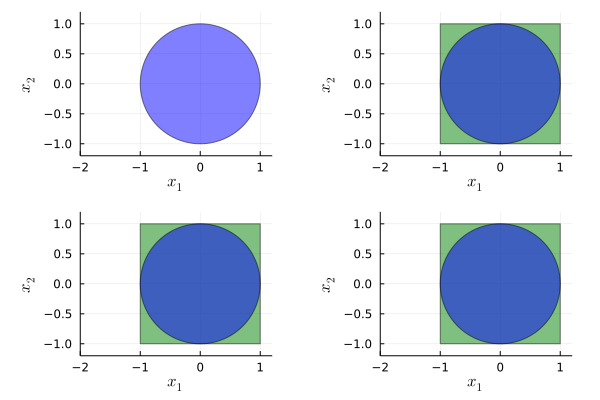

In [62]:
import Polyhedra, CDDLib
using LazySets, LaTeXStrings, Optim
using Plots: plot, plot!, text, lens!, bbox

p(args...; kwargs...) = plot(xlims=(0,4), ylims=(0,4), ratio=1, lab="",
                        xlab=L"x_{1}", ylab=L"x_{2}", args...; kwargs...)
p!(args...; kwargs...) = plot!(lab="", args...; kwargs...);

B = Ball2([0.0, 0.0], 1.0)

p1 = p(xlims=(-2, 1.2), ylims=(-1.2, 1.2))
p!(p1, B, 1e-3, color=:blue, alpha=0.5)

p2 = p(xlims=(-2, 1.2), ylims=(-1.2, 1.2))

# initialize box directions
DIR_EAST, DIR_NORTH, DIR_WEST, DIR_SOUTH = [1., 0.], [0., 1.], [-1., 0.], [0., -1.]
pe, pn, pw, ps = σ(DIR_EAST, B), σ(DIR_NORTH, B), σ(DIR_WEST, B), σ(DIR_SOUTH, B)

Ω = Approximations.PolygonalOverapproximation(B)
Approximations.addapproximation!(Ω, ps, DIR_SOUTH, pe, DIR_EAST)
Approximations.addapproximation!(Ω, pw, DIR_WEST, ps, DIR_SOUTH)
Approximations.addapproximation!(Ω, pn, DIR_NORTH, pw, DIR_WEST)
Approximations.addapproximation!(Ω, pe, DIR_EAST, pn, DIR_NORTH)

p!(p2, Approximations.tohrep(Ω), alpha=0.5, color="green")
p!(p2, B, 1e-3, color=:blue, alpha=0.5)


approx = pop!(Ω.approx_stack)
(r1, r2) = Approximations.refine(approx, Ω.S)
push!(Ω.approx_stack, r2)
push!(Ω.approx_stack, r1)

p3 = p(xlims=(-2, 1.2), ylims=(-1.2, 1.2))
p!(p3, Approximations.tohrep(Ω), alpha=0.5, color="green")
p!(p3, B, 1e-3, color=:blue, alpha=0.5)


approx = pop!(Ω.approx_stack)
(r1, r2) = Approximations.refine(approx, Ω.S)
push!(Ω.approx_stack, r2)
push!(Ω.approx_stack, r1)

p4 = p(xlims=(-2, 1.2), ylims=(-1.2, 1.2))
p!(p4, Approximations.tohrep(Ω), alpha=0.5, color="green")
p!(p4, B, 1e-3, color=:blue, alpha=0.5)

plot(p1, p2, p3, p4, layout=(2, 2))

This is actually what happens under the hood when plotting a set. For example, instead of an actual Euclidean ball, we compute a high-resolution polygon and plot that. By default we use $ε=0.001$.

using 32 constraints


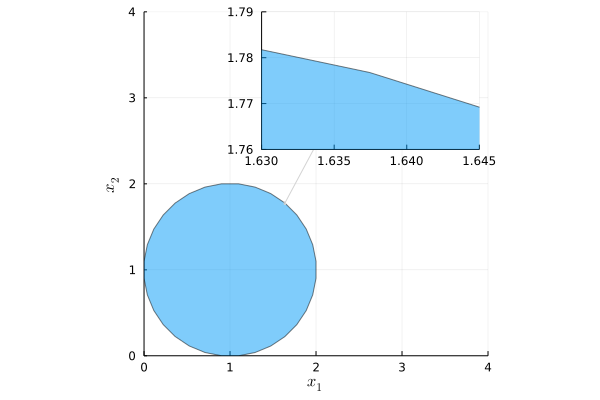

In [63]:
import Polyhedra, CDDLib
using LazySets, LaTeXStrings, Optim
using Plots: plot, plot!, text, lens!, bbox

p(args...; kwargs...) = plot(xlims=(0,4), ylims=(0,4), ratio=1, lab="",
                        xlab=L"x_{1}", ylab=L"x_{2}", args...; kwargs...)
p!(args...; kwargs...) = plot!(lab="", args...; kwargs...);

B = Ball2([1.0, 1.0], 1.0)
ε = 0.01

PB = overapproximate(B, ε)
println("using $(length(constraints_list(PB))) constraints")

p(B, ε)  # one can directly pass the precision to the plot function
lens!([1.63, 1.645], [1.76, 1.79], inset = (1, bbox(0.4, 0.0, 0.4, 0.4)))

## Underapproximation

There is a very simple way to underapproximate convex sets: pick any points inside the set and compute the convex hull.

The choice og these points can be made such that the algorithm converges to the true set by following a similar idea as for the overapproximation: choose some directions and compute some (remember that in general they are not unique) support vector in these directions.

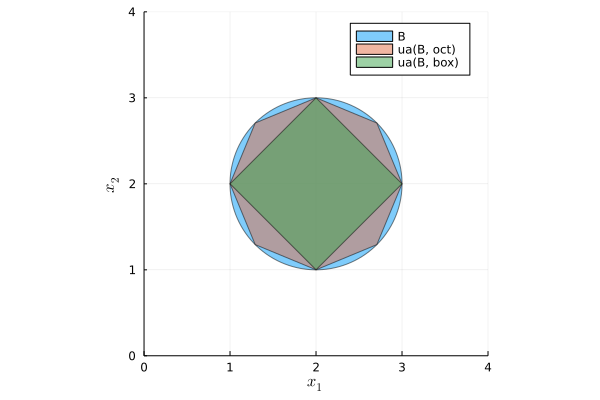

In [64]:
import Polyhedra, CDDLib
using LazySets, LaTeXStrings, Optim
using Plots: plot, plot!, text, lens!, bbox

p(args...; kwargs...) = plot(xlims=(0,4), ylims=(0,4), ratio=1, lab="",
                        xlab=L"x_{1}", ylab=L"x_{2}", args...; kwargs...)
p!(args...; kwargs...) = plot!(lab="", args...; kwargs...);

B = Ball2([2.0, 2.0], 1.0)
Pb = underapproximate(B, BoxDirections(2))
Po = underapproximate(B, OctDirections(2))

p(B, lab="B")
p!(Po, lab="ua(B, oct)")
p!(Pb, lab="ua(B, box)")



## Other Aspects of `LazySets`

### Useful Operations on Sets

Other useful operations on sets are the output of the dimension, checks for membership or emptiness, and sampling.

dim(X) = 2
dim(Y) = 2

z ∈ X = false
z ∈ Y = true

isempty(X ∩ Y) = false
isempty(X ∩ Z) = true

isdisjoint(X, Y) = false
isdisjoint(X, Z) = true


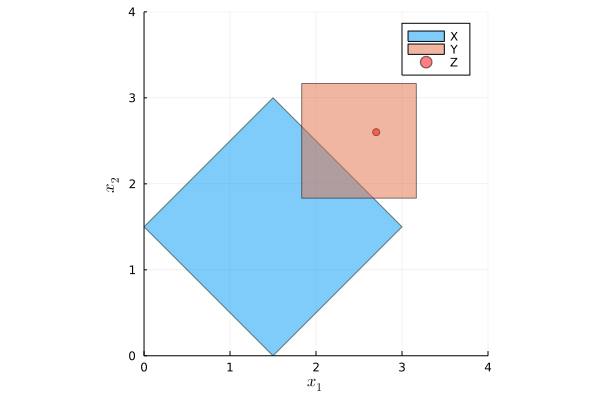

In [66]:
import Polyhedra, CDDLib
using LazySets, LaTeXStrings, Optim
using Plots: plot, plot!, text, lens!, bbox

p(args...; kwargs...) = plot(xlims=(0,4), ylims=(0,4), ratio=1, lab="",
                        xlab=L"x_{1}", ylab=L"x_{2}", args...; kwargs...)
p!(args...; kwargs...) = plot!(lab="", args...; kwargs...);

X = Ball1([1.5, 1.5], 1.5)
Y = 1.0 * BallInf([2.5, 2.5], 2/3)

z = [2.7, 2.6]
Z = Singleton(z)

# dimension
@show dim(X)
@show dim(Y)

# membership
println()
@show z ∈ X
@show z ∈ Y

# emptiness
println()
@show isempty(X ∩ Y)
@show isempty(X ∩ Z)

# disjointness
println()
@show isdisjoint(X, Y)
@show isdisjoint(X, Z)

p(X, lab="X")
p!(Y, lab="Y")
p!(Z, lab="Z", color=:red)

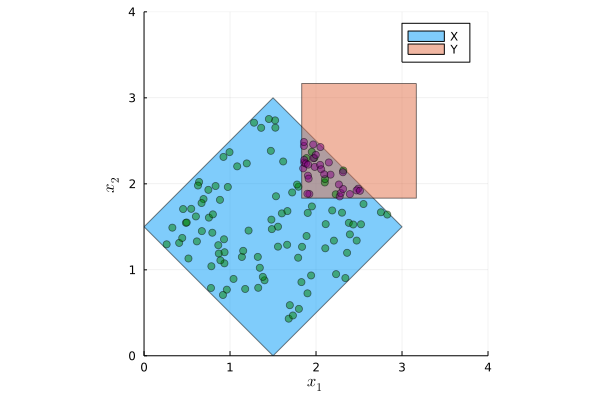

In [67]:
import Polyhedra, CDDLib
using LazySets, LaTeXStrings, Optim
using Plots: plot, plot!, text, lens!, bbox

p(args...; kwargs...) = plot(xlims=(0,4), ylims=(0,4), ratio=1, lab="",
                        xlab=L"x_{1}", ylab=L"x_{2}", args...; kwargs...)
p!(args...; kwargs...) = plot!(lab="", args...; kwargs...);

X = Ball1([1.5, 1.5], 1.5)
Y = 1.0 * BallInf([2.5, 2.5], 2/3)

# sampling
samplesX = sample(X, 100)
samplesXY = sample(X ∩ Y, 30)

p(X, lab="X")
p!(Y, lab="Y")
[p!(Singleton(s), color=:green, lab="") for s in samplesX]
[p!(Singleton(s), color=:purple, lab="") for s in samplesXY]
p!()

## `LazySets`' Types
Overall there are 44 (convex) set types (26 concrete and 18 lazy) plus a few more non-convex set types.

In [5]:
using LazySets

println("=== Concrete set types ===\n")
for S in subtypes(LazySet, true)
    # these three types don't have an `isoperationtype` method, so work around it
    S in (QuadraticMap, SimpleSparsePolynomialZonotope, SparsePolynomialZonotope) && continue
    if !isoperationtype(S)
        println(S)
    end
end

println("\n=== Lazy set types ===\n")

for S in subtypes(LazySet, true)
    if isoperationtype(S)
        println(S)
    end
end

=== Concrete set types ===

Ball1
Ball2
BallInf
Ballp
DensePolynomialZonotope
Ellipsoid
EmptySet
HParallelotope
HPolygon
HPolygonOpt
HPolyhedron
HPolytope
HalfSpace
Hyperplane
Hyperrectangle
Interval
LazySets.AbstractStar
Line
Line2D
LineSegment
RotatedHyperrectangle
Singleton
Star
Universe
VPolygon
VPolytope
ZeroSet
Zonotope

=== Lazy set types ===

AffineMap
Bloating
CachedMinkowskiSumArray
CartesianProduct
CartesianProductArray
Complement
ConvexHull
ConvexHullArray
ExponentialMap
ExponentialProjectionMap
Intersection
IntersectionArray
InverseLinearMap
LinearMap
MinkowskiSum
MinkowskiSumArray


LoadError: MethodError: no method matching isoperationtype(::Type{QuadraticMap})
[0mClosest candidates are:
[0m  isoperationtype([91m::ConvexSet[39m) at ~/.julia/packages/LazySets/7LPS2/src/Interfaces/ConvexSet.jl:796
[0m  isoperationtype([91m::Type{<:ConvexHull}[39m) at ~/.julia/packages/LazySets/7LPS2/src/LazyOperations/ConvexHull.jl:53
[0m  isoperationtype([91m::Type{<:Singleton}[39m) at ~/.julia/packages/LazySets/7LPS2/src/Sets/Singleton.jl:32
[0m  ...

### Numerical Tolerance

All `LazySets` set types are parametric in the numeric type and we try to preserve them in all operations. Known conversions to `Float64` happen when using an LP solver (typically when working with polytopes).

Hyperrectangle{Rational{Int64}, Vector{Rational{Int64}}, Vector{Rational{Int64}}}
  center: Array{Rational{Int64}}((2,)) Rational{Int64}[3//2, 3//2]
  radius: Array{Rational{Int64}}((2,)) Rational{Int64}[1//2, 1//2]


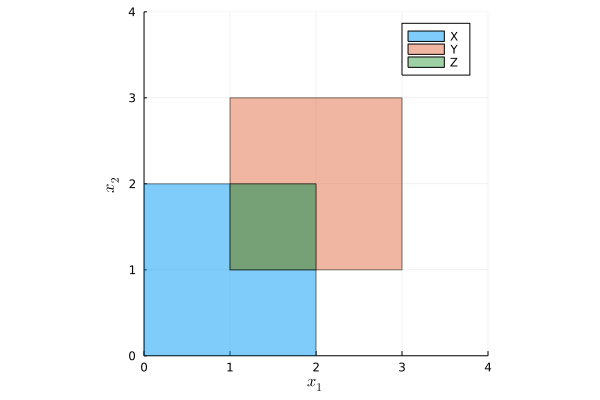

In [68]:
import Polyhedra, CDDLib
using LazySets, LaTeXStrings, Optim
using Plots: plot, plot!, text, lens!, bbox

p(args...; kwargs...) = plot(xlims=(0,4), ylims=(0,4), ratio=1, lab="",
                        xlab=L"x_{1}", ylab=L"x_{2}", args...; kwargs...)
p!(args...; kwargs...) = plot!(lab="", args...; kwargs...);

X = BallInf([1//1, 1//1], 1//1)
Y = BallInf([2//1, 2//1], 1//1)
Z = intersection(X, Y)
dump(Z)

p(X, lab="X")
p!(Y, lab="Y")
p!(Z, lab="Z")

Operations with floating-point numbers may yield results that differ from the expected result due to precision problems. Generally one should avoid working with flat sets or very small/large values. The tolerance used in many `LazySets` operations can be controlled via the (unexported) functions `set_atol` (absolute tolerance), `set_rtol` (relative tolerance), and `set_ztol` (tolerance when comparing to zero).

In [4]:
import Polyhedra, CDDLib
using LazySets, LaTeXStrings, Optim
using Plots: plot, plot!, text, lens!, bbox

p(args...; kwargs...) = plot(xlims=(0,4), ylims=(0,4), ratio=1, lab="",
                        xlab=L"x_{1}", ylab=L"x_{2}", args...; kwargs...)
p!(args...; kwargs...) = plot!(lab="", args...; kwargs...);

polygon() = VPolygon([[1.0, 1.0], [1.000000001, 1.0]])

# default relative tolerance
@show LazySets._rtol(Float64)

P1 = polygon()

@show vertices_list(P1)

# increase relative tolerance
LazySets.set_rtol(Float64, 1e-9)

P2 = polygon()

@show vertices_list(P2)

p(xlims=(0.9999999985, 1.000000002), ylims=(0.9999999985, 1.000000002))
p!(P1)
p!(P2)

# reset relative tolerance to default
LazySets.Comparison.set_tolerance(Float64)

p!()

LazySets._rtol(Float64) = 1.4901161193847656e-8
vertices_list(P1) = 

[[1.0, 1.0]]
vertices_list(P2) = [[1.0, 1.0], [1.000000001, 1.0]]


### Optional Dependencies

`LazySets` uses `Requires` to add further functionality depending on whether some external packages are loaded. Here we quickly list the currently available packages. Some `LazySets` functionality prints instructive error messages when the corresponding packages are not loaded but are required by the code.

* Polyhedra: An interface for polyhedral computations and LP solvers. This is required for polyhedral computations in three or more dimensions.

* CDDLib: A double-description method. For some operations we use this solver as the default, which is why a user may see this as a requirement. Alternatively, a custom solver can be passed to the operations.

* Optim: Optimization package. Mainly used for computations with lazy intersections.

* Symbolics: Symbolic algebra. Used to conveniently construct polyhedral sets.

* StaticArrays: Efficient, statically-sized arrays. Constructing sets with static arrays gives an additional boost in low dimensions.

* Distributions: Distributions used in probability theory. Allows to sample from sets in a non-uniform way.

* Makie: Plotting of 3D meshes.

* Expokit: Lazy matrix exponential. Used for the `ExponentialMap` set type (linear map $ΦX$ where $Φ=e^{M}$).

* MiniQhull: Delaunay triangulation.

* Javis: Smooth animations. We recently added some convenience functionality to ease the integration.

# Some Mathematics Problems

1.  Find all possible solutions to the equation
\begin{equation}
(x^{3} - x) + (y^{3} - y) = z^{3} - z
\end{equation}
where $(x,y,z) > 1$ and $x,y,z \in \mathbb{Z}$ and not all three of them are equal.


# Some Important Factorization

1. Cubic sum factorization

\begin{equation}
x^{3} + y^{3} = (x + y)(x^{2} - xy + y^{2})
\end{equation}

2. Cubic difference factorization

\begin{equation}
x^{3} - z^{3} = (x - z)(x^{2} + xz + z^{2})
\end{equation}

3. Diophantine-equations

\begin{equation}
x^{3} - x = (y - z)(y^{2} + yz + z^{2} - 1) \\
y^{3} - y = (x - z)(x^{2} + xz + z^{2} - 1) \\
z^{3} - z = (x + y)(x^{2} - xy + y^{2} - 1) \\
\end{equation}


┌ Info: Precompiling PNGFiles [f57f5aa1-a3ce-4bc8-8ab9-96f992907883]
└ @ Base loading.jl:1423


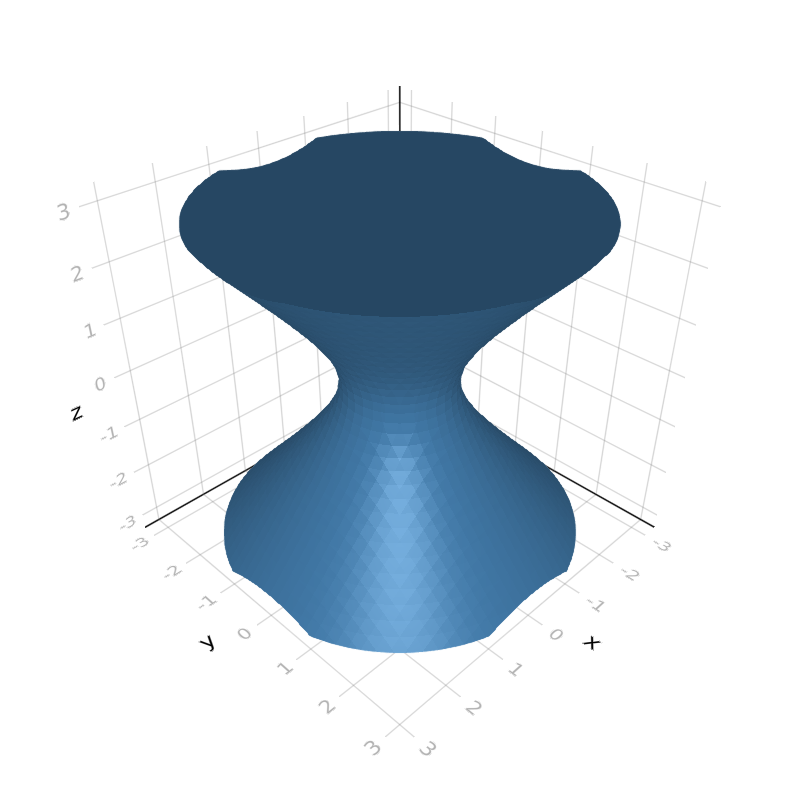

In [2]:
using Implicit3DPlotting

f(x) = x[1]^2+x[2]^2-x[3]^2-1
scene = plot_implicit_surface(f; transparency=false)

In [1]:
using Plots
plotly() # or pyplot() - gr() does not work for me

# spherical: (radius r, inclination θ, azimuth φ)
X(r,theta,phi) = r * sin(theta) * sin(phi)
Y(r,theta,phi) = r * sin(theta) * cos(phi)
Z(r,theta,phi) = r * cos(theta)

thetas = range(0, stop=pi,   length=50)
phis   = range(0, stop=pi/2, length=50)

xs = [X(1, theta, phi) for theta in thetas, phi in phis] 
ys = [Y(1, theta, phi) for theta in thetas, phi in phis]
zs = [Z(1, theta, phi) for theta in thetas, phi in phis]

surface(xs, ys, zs)

┌ Info: For saving to png with the Plotly backend PlotlyBase has to be installed.
└ @ Plots /home/browni/.julia/packages/Plots/lW9ll/src/backends.jl:318


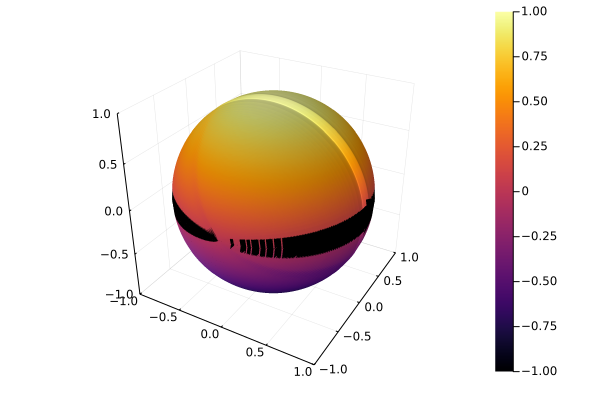

In [2]:
using Plots
gr()

zplus(x,y) = (x^2 + y^2) <= 1 ? sqrt.(abs.(1.0 .- x.^2 .- y.^2)) : NaN
zminus(x,y) = (x^2 + y^2) <= 1 ? -sqrt.(abs.(1.0 .- x.^2 .- y.^2)) : NaN

x = collect(-1:0.01:1);
y = @. (1-x^2)^0.5
y = reshape(permutedims([-y y]),:,1)[:]
x = sort([x; x.+eps()])

surface(x,y,zminus, ratio=:equal,xlims=(-1,1),ylims=(-1,1),zlims=(-1,1))  # isometric
surface!(x,y,zplus, ratio=:equal,xlims=(-1,1),ylims=(-1,1),zlims=(-1,1))  # isometric

In [3]:
# Plot a sphere with inputs of radius and center point of the sphere

using Plots
plotlyjs()

function sphere(r, C)   # r: radius; C: center [cx,cy,cz]
    n = 100
    u = range(-π, π; length = n)
    v = range(0, π; length = n)
    x = C[1] .+ r*cos.(u) * sin.(v)'
    y = C[2] .+ r*sin.(u) * sin.(v)'
    z = C[3] .+ r*ones(n) * cos.(v)'
    return x, y, z
end

surface(sphere(2, [1,2,3]))

WebIO._IJuliaInit()

┌ Info: Precompiling PlotlyJS [f0f68f2c-4968-5e81-91da-67840de0976a]
└ @ Base loading.jl:1423


# Appendix

## Julia ⇄ Python

The "standard" way to call Python code in Julia is to use the PyCall package. Some of its nice features are: 

(a) it can automatically download and install a local copy of Python, private to Julia, in order to avoid messing with version dependency from our "main" Python installation and provide a consistent environment in Linux, Windows and MacOS; 

(b) it provides automatic conversion between Julia and Python types; 

(c) it is very simple to use.

In [47]:
using PyCall

py"""
plt = pyimport("matplotlib.pyplot")
venn3 = pyimport("matplotlib_venn").venn3

# Custom text labels: change the label of group A
v=venn3(subsets = (10, 8, 22, 6,9,4,2), set_labels = ('Group A', 'Group B', 'Group C'))
v.get_label_by_id('A').set_text('My Favourite group!')
"""
plt.show()

LoadError: PyError ($(Expr(:escape, :(ccall(#= /home/browni/.julia/packages/PyCall/7a7w0/src/pyeval.jl:38 =# @pysym(:PyEval_EvalCode), PyPtr, (PyPtr, PyPtr, PyPtr), o, globals, locals))))) <class 'NameError'>
NameError("name 'pyimport' is not defined")
  File "/home/browni/.julia/packages/PyCall/7a7w0/src/pyeval.jl", line 1, in <module>
    const Py_single_input = 256  # from Python.h


In [10]:
%matplotlib --list

The analogue of IPython's `%matplotlib` in Julia is to use the [PyPlot package](https://github.com/stevengj/PyPlot.jl), which gives a Julia interface to Matplotlib including inline plots in IJulia notebooks.   (The equivalent of `numpy` is already loaded by default in Julia.)

Given PyPlot, the analogue of `%matplotlib inline` is `using PyPlot`, since PyPlot defaults to inline plots in IJulia.

To enable separate GUI windows in PyPlot, analogous to `%matplotlib`, do `using PyPlot; pygui(true)`.   To specify a particular gui backend, analogous to `%matplotlib gui`, you can either do `using PyPlot; pygui(:gui); using PyPlot; pygui(true)` (where `gui` is `wx`, `qt`, `tk`, or `gtk`), or you can do `ENV["MPLBACKEND"]=backend; using PyPlot; pygui(true)` (where `backend` is the name of a Matplotlib backend, like `tkagg`).

For more options, see the PyPlot documentation.


In [ ]:
ENV["PYTHON"] = "/home/browni/.julia/conda/3/envs/lasthrim_env/bin/python"

In [11]:
#Add a package
import Pkg;

Pkg.add("CDDLib")

   Resolving package versions...
  No Changes to `~/LasthrimProjection/Project.toml`
  No Changes to `~/LasthrimProjection/Manifest.toml`


In [14]:
# To activate project designated for Real Analysis
import Pkg
Pkg.activate("../")

  Activating project at `~/LasthrimProjection`


In [15]:
]st

      Status `~/LasthrimProjection/Project.toml`
  [6e4b80f9] BenchmarkTools v1.3.1
  [3391f64e] CDDLib v0.7.0
  [13f3f980] CairoMakie v0.5.10
  [5ae59095] Colors v0.12.8
  [39dd38d3] Dierckx v0.5.2
  [b4f34e82] Distances v0.10.7
  [d997a800] Implicit3DPlotting v0.2.3 `https://github.com/matthiashimmelmann/Implicit3DPlotting.jl.git#main`
  [95701278] ImplicitEquations v1.0.8
  [a98d9a8b] Interpolations v0.14.4
  [d1acc4aa] IntervalArithmetic v0.20.7
  [d8418881] Intervals v1.8.0
  [b964fa9f] LaTeXStrings v1.3.0
  [b4f0291d] LazySets v2.0.0
  [ae8d54c2] Luxor v3.5.0
  [429524aa] Optim v1.7.1
  [f0f68f2c] PlotlyJS v0.18.8
  [91a5bcdd] Plots v1.31.7
  [67491407] Polyhedra v0.6.17
  [438e738f] PyCall v1.93.1
  [ce6b1742] RDatasets v0.7.7
  [24249f21] SymPy v1.1.7
  [9ec6d097] TruthTables v0.4.1


# Source:

1. RealMaths Pre-Master Course for Real Analysis Foundation (2022)

* Course 1 - 6: Prof. C. Lattanzio

* Course 7 - 12: Prof. Simone Fagioli

* Course 13 - 18: Prof. Emanuela Radici